# Team Based Model

## Imports

In [89]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt


from tqdm import tqdm
from nba_api.stats.static import players, teams

import sys

%load_ext autoreload
%autoreload 2

import sys
sys.path.append("..")

from src.data.make_team_dataset import load_team_data


from sklearn.model_selection import train_test_split, TimeSeriesSplit
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import ElasticNetCV, LogisticRegression, SGDClassifier

from sklearn.pipeline import make_pipeline

import lightgbm as lgb

from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC, SVC
import xgboost as xgb
from sklearn.ensemble import StackingClassifier

from sklearn.neighbors import KNeighborsClassifier
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from sklearn.model_selection import cross_val_score

from sklearn.preprocessing import Normalizer, StandardScaler
from sklearn.feature_selection import VarianceThreshold, RFE, RFECV
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, f1_score
import sklearn.model_selection

from sklearn.model_selection import learning_curve, validation_curve
from sklearn.metrics import confusion_matrix
import pickle


from sklearn.model_selection import ParameterGrid
import parfit.parfit as pf


import optuna
import joblib

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
pd.options.display.max_columns=230
pd.options.display.max_rows=100

## Gather Team Level Basic, Advanced, and Scoring Data

In [3]:
def load_team_data(seasons):
    """Loads basic, advanced, and scoring boxscores from
    seasons 2000-2020 and merges them into one dataframe
    """


    basic_gls_all, adv_gls_all, scoring_gls_all = [], [], []
    for season in seasons:
        basic_gls = pd.read_csv('../data/team_boxscores_basic/team_boxscores_{}.csv'.format(season))
        basic_gls_all.append(basic_gls)

        adv_gls = pd.read_csv('../data/team_boxscores_advanced/team_advanced_boxscores_{}.csv'.format(season))
        adv_gls_all.append(adv_gls)

        scoring_gls = pd.read_csv('../data/team_boxscores_scoring/team_scoring_boxscores_{}.csv'.format(season))
        scoring_gls_all.append(scoring_gls)

    basic_gls_all_df = pd.concat(basic_gls_all)
    adv_gls_all_df = pd.concat(adv_gls_all)
    scoring_gls_all_df = pd.concat(scoring_gls_all)
    
    basic_gls_all_df = basic_gls_all_df.iloc[:, :30]

    temp = pd.merge(basic_gls_all_df, adv_gls_all_df, how='left', on=['GAME_ID', 'TEAM_ABBREVIATION'], suffixes=['', '_y'])
    full_df = pd.merge(temp, scoring_gls_all_df, how='left', on=['GAME_ID', 'TEAM_ABBREVIATION'], suffixes=['', '_y'])

    full_df = full_df.drop(columns = ['TEAM_ID_y', 
                                      'TEAM_NAME_y', 'TEAM_CITY',
                                      'TEAM_CITY_y', 'MIN_y'])
    return full_df

seasons = ['200{}-0{}'.format(x, x+1) if x != 9 else '2009-10' for x in range(0, 10)]
seasons2 = ['20{}-{}'.format(x, x+1) for x in range(10, 21)]
seasons.extend(seasons2)
print(seasons)
team_data = load_team_data(seasons)

['2000-01', '2001-02', '2002-03', '2003-04', '2004-05', '2005-06', '2006-07', '2007-08', '2008-09', '2009-10', '2010-11', '2011-12', '2012-13', '2013-14', '2014-15', '2015-16', '2016-17', '2017-18', '2018-19', '2019-20', '2020-21']


In [4]:
team_data

,SEASON_YEAR,TEAM_ID,TEAM_ABBREVIATION,TEAM_NAME,GAME_ID,GAME_DATE,MATCHUP,WL,MIN,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,FT_PCT,OREB,DREB,REB,AST,TOV,STL,BLK,BLKA,PF,PFD,PTS,PLUS_MINUS,E_OFF_RATING,OFF_RATING,E_DEF_RATING,DEF_RATING,E_NET_RATING,NET_RATING,AST_PCT,AST_TOV,AST_RATIO,OREB_PCT,DREB_PCT,REB_PCT,E_TM_TOV_PCT,TM_TOV_PCT,EFG_PCT,TS_PCT,USG_PCT,E_USG_PCT,E_PACE,PACE,PACE_PER40,POSS,PIE,PCT_FGA_2PT,PCT_FGA_3PT,PCT_PTS_2PT,PCT_PTS_2PT_MR,PCT_PTS_3PT,PCT_PTS_FB,PCT_PTS_FT,PCT_PTS_OFF_TOV,PCT_PTS_PAINT,PCT_AST_2PM,PCT_UAST_2PM,PCT_AST_3PM,PCT_UAST_3PM,PCT_AST_FGM,PCT_UAST_FGM
0,2000-01,1610612763,VAN,Vancouver Grizzlies,20001188,2001-04-18T00:00:00,VAN @ GSW,W,48.0,37,92,0.402,4,9,0.444,17,21,0.810,27,31,58,18,14.0,9,10,10,21,0,95,14.0,107.7,106.7,84.9,91.0,22.8,15.7,0.486,1.29,13.5,NaN,0.453,NaN,15.866,15.7,0.424,0.469,1.0,0.196,91.84,89.00,74.17,89.0,0.657,0.902,0.098,0.695,0.379,0.126,0.074,0.179,0.200,0.316,0.485,0.515,0.500,0.500,0.486,0.514
1,2000-01,1610612761,TOR,Toronto Raptors,20001182,2001-04-18T00:00:00,TOR @ WAS,W,48.0,43,95,0.453,6,18,0.333,6,8,0.750,15,36,51,28,11.0,9,4,4,17,0,98,6.0,103.7,103.2,92.5,96.8,11.2,6.3,0.651,2.55,20.4,0.321,0.740,0.524,11.638,11.6,0.484,0.497,1.0,0.201,96.98,95.00,79.17,95.0,0.602,0.811,0.189,0.755,0.163,0.184,0.122,0.061,0.133,0.592,0.649,0.351,0.667,0.333,0.651,0.349
2,2000-01,1610612756,PHX,Phoenix Suns,20001187,2001-04-18T00:00:00,PHX vs. UTA,W,48.0,35,66,0.530,1,5,0.200,27,39,0.692,7,25,32,21,18.0,8,3,2,23,0,98,5.0,104.1,105.4,98.6,101.1,5.5,4.3,0.600,1.17,17.2,0.333,0.650,0.500,19.116,19.4,0.538,0.589,1.0,0.200,94.24,92.50,77.08,93.0,0.547,0.924,0.076,0.694,0.469,0.031,0.102,0.276,0.194,0.224,0.588,0.412,1.000,0.000,0.600,0.400
3,2000-01,1610612742,DAL,Dallas Mavericks,20001185,2001-04-18T00:00:00,DAL vs. MIN,W,48.0,50,91,0.549,5,17,0.294,15,20,0.750,6,39,45,33,14.0,8,9,2,23,2,120,20.0,111.3,114.3,93.9,94.3,17.4,19.9,0.660,2.36,22.5,NaN,0.700,NaN,12.987,13.3,0.577,0.601,1.0,0.199,107.12,105.50,87.92,105.0,0.621,0.813,0.187,0.750,0.350,0.125,0.217,0.125,0.183,0.400,0.622,0.378,1.000,0.000,0.660,0.340
4,2000-01,1610612750,MIN,Minnesota Timberwolves,20001185,2001-04-18T00:00:00,MIN @ DAL,L,48.0,39,95,0.411,5,11,0.455,17,26,0.654,14,34,48,23,14.0,7,2,9,17,2,100,-20.0,93.9,94.3,111.3,114.3,-17.4,-19.9,0.590,1.64,16.0,0.300,NaN,NaN,13.153,13.2,0.437,0.470,1.0,0.198,107.12,105.50,87.92,106.0,0.379,0.884,0.116,0.680,0.200,0.150,0.220,0.170,0.120,0.480,0.588,0.412,0.600,0.400,0.590,0.410
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53671,2020-21,1610612748,MIA,Miami Heat,42000121,2021-05-22T00:00:00,MIA @ MIL,L,53.0,36,99,0.364,20,50,0.400,15,19,0.789,12,39,51,22,17.0,8,3,1,23,18,107,-2.0,95.2,97.3,96.9,97.3,-1.6,0.0,0.611,1.29,15.0,0.242,0.683,0.452,15.130,15.5,0.465,0.498,1.0,0.199,101.83,100.53,83.77,110.0,0.449,0.495,0.505,0.299,0.075,0.561,0.019,0.140,0.159,0.224,0.375,0.625,0.800,0.200,0.611,0.389
53672,2020-21,1610612738,BOS,Boston Celtics,42000111,2021-05-22T00:00:00,BOS @ BKN,L,48.0,31,84,0.369,11,30,0.367,20,26,0.769,11,29,40,19,12.0,6,12,7,18,22,93,-11.0,96.4,100.0,110.9,111.8,-14.5,-11.8,0.613,1.58,15.0,0.291,0.647,0.462,12.443,12.9,0.435,0.487,1.0,0.199,95.10,93.00,77.50,93.0,0.434,0.643,0.357,0.430,0.065,0.355,0.129,0.215,0.097,0.366,0.500,0.500,0.818,0.182,0.613,0.387
53673,2020-21,1610612749,MIL,Milwaukee Bucks,42000121,2021-05-22T00:00:00,MIL vs. MIA,W,53.0,42,96,0.438,5,31,0.161,20,33,0.606,15,49,64,19,17.0,11,1,3,18,23,109,2.0,96.9,97.3,95.2,97.3,1.6,0.0,0.452,1.12,13.0,0.317,0.758,0.548,15.108,15.2,0.464,0.493,1.0,0.199,101.83,100.53,83.77,112.0,0.551,0.677,0.323,0.679,0.165,0.138,0.110,0.183,0.138,0.514,0.459,0.541,0.400,0.600,0.452,0.548
53674,2020-21,1610612757,POR,Portland Trail Blazers,42000161,2021-05-22T00:00:00,POR @ DEN,W,48

In [5]:
# current_season = '2021-22'
# def load_current_season_data(current_season):
#     """Loads basic, advanced, and scoring boxscores from
#     2020 season and merges them into one dataframe
#     """

#     basic_gls = pd.read_csv('../data/current_season_data/team_gamelogs_{}.csv'.format(current_season))

#     adv_gls = pd.read_csv('../data/current_season_data/team_advanced_boxscores_{}.csv'.format(current_season))

#     scoring_gls = pd.read_csv('../data/current_season_data/team_scoring_boxscores_{}.csv'.format(current_season))

#     temp = pd.merge(basic_gls, adv_gls, how='left', on=['GAME_ID', 'TEAM_ABBREVIATION'], suffixes=['', '_y'])
#     full_df = pd.merge(temp, scoring_gls, how='left', on=['GAME_ID', 'TEAM_ABBREVIATION'], suffixes=['', '_y'])

#     full_df = full_df.drop(columns = ['TEAM_ID_y', 
#                                       'TEAM_NAME_y', 'TEAM_CITY',
#                                       'TEAM_CITY_y', 'MIN_y'])
    

#     return full_df

# df_2021 = load_current_season_data()
# df_2021

In [6]:
from src.data.make_team_dataset import clean_team_data

clean_team_df = clean_team_data(team_data)



In [7]:
from src.data.make_team_dataset import prep_for_aggregation
ready_for_agg_df = prep_for_aggregation(clean_team_df)

ready_for_agg_df

,SEASON_YEAR,TEAM_ID,TEAM_ABBREVIATION,TEAM_NAME,GAME_ID,GAME_DATE,MATCHUP,HOME_GAME,TEAM_SCORE,point_diff,WL,MIN,RECORD,FG2M,FG2A,FG3M,FG3A,FTM,FTA,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PTS,PLUS_MINUS,E_OFF_RATING,OFF_RATING,E_DEF_RATING,DEF_RATING,E_NET_RATING,NET_RATING,POSS,PIE,PTS_2PT_MR,PTS_FB,PTS_OFF_TOV,PTS_PAINT,AST_2PM,UAST_2PM,AST_3PM,UAST_3PM
0,2000-01,1610612763,MEM,Vancouver Grizzlies,20001188,2001-04-18,MEM @ GSW,0,95,14.0,1,48.0,1,33,83,4,9,17,21,27,31,58,18,9,10,14.0,21,95,14.0,107.7,106.7,84.9,91.0,22.8,15.7,89.0,0.657,36,7,19,30,16,16,2,2
1,2000-01,1610612761,TOR,Toronto Raptors,20001182,2001-04-18,TOR @ WAS,0,98,6.0,1,48.0,1,37,77,6,18,6,8,15,36,51,28,9,4,11.0,17,98,6.0,103.7,103.2,92.5,96.8,11.2,6.3,95.0,0.602,15,11,13,58,24,12,4,1
2,2000-01,1610612756,PHX,Phoenix Suns,20001187,2001-04-18,PHX vs. UTA,1,98,5.0,1,48.0,1,34,61,1,5,27,39,7,25,32,21,8,3,18.0,23,98,5.0,104.1,105.4,98.6,101.1,5.5,4.3,93.0,0.547,45,9,19,21,19,14,1,0
3,2000-01,1610612742,DAL,Dallas Mavericks,20001185,2001-04-18,DAL vs. MIN,1,120,20.0,1,48.0,1,45,74,5,17,15,20,6,39,45,33,8,9,14.0,23,120,20.0,111.3,114.3,93.9,94.3,17.4,19.9,105.0,0.621,42,26,21,48,27,17,5,0
4,2000-01,1610612750,MIN,Minnesota Timberwolves,20001185,2001-04-18,MIN @ DAL,0,100,-20.0,0,48.0,0,34,84,5,11,17,26,14,34,48,23,7,2,14.0,17,100,-20.0,93.9,94.3,111.3,114.3,-17.4,-19.9,106.0,0.379,20,22,12,48,19,14,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53671,2020-21,1610612748,MIA,Miami Heat,42000121,2021-05-22,MIA @ MIL,0,107,-2.0,0,53.0,0,16,49,20,50,15,19,12,39,51,22,8,3,17.0,23,107,-2.0,95.2,97.3,96.9,97.3,-1.6,0.0,110.0,0.449,8,2,17,23,6,10,16,4
53672,2020-21,1610612738,BOS,Boston Celtics,42000111,2021-05-22,BOS @ BKN,0,93,-11.0,0,48.0,0,20,54,11,30,20,26,11,29,40,19,6,12,12.0,18,93,-11.0,96.4,100.0,110.9,111.8,-14.5,-11.8,93.0,0.434,6,11,9,34,10,10,8,2
53673,2020-21,1610612749,MIL,Milwaukee Bucks,42000121,2021-05-22,MIL vs. MIA,1,109,2.0,1,53.0,1,37,65,5,31,20,33,15,49,64,19,11,1,17.0,18,109,2.0,96.9,97.3,95.2,97.3,1.6,0.0,112.0,0.551,17,11,15,56,16,20,2,3
53674,2020-21,1610612757,POR,Portland Trail Blazers,42000161,2021-05-22,POR @ DEN,0,123,14.0,1,48.0,1,24,51,19,40,18,19,10,29,39,29,3,2,6.0,14,123,14.0,129.0,135.2,116.6,117.2,12.4,18.0,91.0,0.538,9,6,13,38,13,10,14,4


## Add Betting Data 

In [8]:
from src.data.make_betting_dataset import clean_spread_data

spread_df = pd.read_csv('../data/betting_data/all_spreads_sbr.csv', parse_dates=['game_date'])
clean_spread = clean_spread_data(spread_df)
clean_spread
clean_spread[['away_team', 'home_team', 'game_date', 'home_spread_mode', 'away_spread_mode']]

,away_team,home_team,game_date,home_spread_mode,away_spread_mode
0,CHI,MIA,2006-10-31,-4.5,4.5
1,PHX,LAL,2006-10-31,8.0,-8.5
2,LAC,PHX,2006-11-01,-5.0,4.5
3,LAL,GSW,2006-11-01,-7.5,7.5
4,IND,CHA,2006-11-01,1.0,-1.0
...,...,...,...,...,...
18866,MIL,PHX,2021-07-08,-4.5,4.5
18867,PHX,MIL,2021-07-11,-4.5,4.5
18868,PHX,MIL,2021-07-14,-4.5,4.5
18869,MIL,PHX,2021-07-17,-4.0,4.0


In [9]:
from src.data.make_betting_dataset import clean_moneyline_data

ml_df = pd.read_csv('../data/betting_data/all_moneylines_sbr.csv', parse_dates=['game_date'])
clean_moneylines = clean_moneyline_data(ml_df)



In [10]:
clean_moneylines

,away_team,home_team,game_date,away_ml1,away_ml2,away_ml3,away_ml4,home_ml1,home_ml2,home_ml3,home_ml4,away_ml_mode,home_ml_mode
0,CHI,MIA,2006-10-31,180.0,NaN,180.0,NaN,-220.0,NaN,-210.0,NaN,180.0,-220.0
1,PHX,LAL,2006-10-31,-380.0,NaN,-350.0,NaN,290.0,NaN,290.0,NaN,-380.0,290.0
2,CHI,ORL,2006-11-01,NaN,NaN,-120.0,NaN,NaN,NaN,100.0,NaN,-120.0,100.0
3,LAC,PHX,2006-11-01,165.0,NaN,155.0,NaN,-190.0,NaN,-175.0,NaN,155.0,-190.0
4,LAL,GSW,2006-11-01,245.0,NaN,250.0,NaN,-290.0,NaN,-300.0,NaN,245.0,-300.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
18880,MIL,PHX,2021-07-08,170.0,170.0,175.0,160.0,-195.0,-200.0,-210.0,-185.0,170.0,-210.0
18881,PHX,MIL,2021-07-11,175.0,177.0,170.0,165.0,-205.0,-208.0,-200.0,-190.0,165.0,-208.0
18882,PHX,MIL,2021-07-14,162.0,166.0,160.0,175.0,-182.0,-195.0,-180.0,-205.0,160.0,-205.0
18883,MIL,PHX,2021-07-17,152.0,NaN,155.0,160.0,-172.0,NaN,-175.0,-185.0,152.0,-185.0


In [28]:
def convert_american_to_decimal(x):
    if x > 0: 
        return (x+100.0)/100.0
    else:
        return (100.0/-x)+1
    

In [29]:
def add_moneyline_data(df, moneylines):
    df = df.copy()
    df['home_team'] = df['MATCHUP'].apply(lambda x: x[:3] if 'vs' in x else x[-3:])
    df['away_team'] = df['MATCHUP'].apply(lambda x: x[:3] if '@' in x else x[-3:])
    df[['home_team', 'away_team', 'MATCHUP']]
    
    df = pd.merge(df, moneylines[['away_team', 'home_team', 'game_date', 'away_ml_mode', 'home_ml_mode']], how='left', 
         left_on=['home_team', 'away_team', 'GAME_DATE'], right_on=['home_team', 'away_team', 'game_date'])    

    df['away_ml_mode'] = df['away_ml_mode'].apply(convert_american_to_decimal)
    df['home_ml_mode'] = df['home_ml_mode'].apply(convert_american_to_decimal)
    
    
    return df


ready_for_agg_df = add_moneyline_data(ready_for_agg_df, clean_moneylines)


In [30]:
ready_for_agg_df.loc[ready_for_agg_df['GAME_ID']==20900329]


,SEASON_YEAR,TEAM_ID,TEAM_ABBREVIATION,TEAM_NAME,GAME_ID,GAME_DATE,MATCHUP,HOME_GAME,TEAM_SCORE,point_diff,WL,MIN,RECORD,FG2M,FG2A,FG3M,FG3A,FTM,FTA,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PTS,PLUS_MINUS,E_OFF_RATING,OFF_RATING,E_DEF_RATING,DEF_RATING,E_NET_RATING,NET_RATING,POSS,PIE,PTS_2PT_MR,PTS_FB,PTS_OFF_TOV,PTS_PAINT,AST_2PM,UAST_2PM,AST_3PM,UAST_3PM,home_team,away_team,game_date,away_ml_mode,home_ml_mode
25083,2009-10,1610612747,LAL,Los Angeles Lakers,20900329,2009-12-11,LAL vs. MIN,1,104,12.0,1,48.0,1,35,70,8,25,10,13,16,34,50,28,9,6,14.0,18,104,12.0,105.3,105.1,92.9,92.0,12.5,13.1,99.0,0.572,22,14,14,48,21,14,7,1,LAL,MIN,2009-12-11,NaN,1.033333
25098,2009-10,1610612750,MIN,Minnesota Timberwolves,20900329,2009-12-11,MIN @ LAL,0,92,-12.0,0,48.0,0,34,78,4,10,12,16,13,35,48,19,6,3,17.0,15,92,-12.0,92.9,92.0,105.3,105.1,-12.5,-13.1,100.0,0.428,19,19,20,48,16,17,3,1,LAL,MIN,2009-12-11,NaN,1.033333


In [31]:
def add_spread_data(df):
    df = df.copy()
    df['home_team'] = df['MATCHUP'].apply(lambda x: x[:3] if 'vs' in x else x[-3:])
    df['away_team'] = df['MATCHUP'].apply(lambda x: x[:3] if '@' in x else x[-3:])
    df[['home_team', 'away_team', 'MATCHUP']]
    
    df = pd.merge(df, clean_spread[['away_team', 'home_team', 'game_date', 'away_spread_mode', 'home_spread_mode']], how='left', 
         left_on=['home_team', 'away_team', 'GAME_DATE'], right_on=['home_team', 'away_team', 'game_date'])    
    
    df['team_covered'] = df.apply(lambda row: int(row['point_diff'] + row['home_spread_mode'] > 0) 
                                          if row['HOME_GAME'] == 1 else int(row['point_diff'] + -row['home_spread_mode'] > 0), axis=1)

    return df


ready_for_agg_df = add_spread_data(ready_for_agg_df)


In [32]:
ready_for_agg_df['ml'] = ready_for_agg_df.apply(lambda row: row['home_ml_mode'] if row['HOME_GAME'] == 1 else row['away_ml_mode'], axis=1)

ready_for_agg_df['spread'] = ready_for_agg_df.apply(lambda row: row['home_spread_mode'] if row['HOME_GAME'] == 1 else -row['home_spread_mode'], axis=1)

ready_for_agg_df.iloc[:, -10:]

,away_team,game_date_x,away_ml_mode,home_ml_mode,game_date_y,away_spread_mode,home_spread_mode,team_covered,ml,spread
0,MEM,NaT,NaN,NaN,NaT,NaN,NaN,0,NaN,NaN
1,TOR,NaT,NaN,NaN,NaT,NaN,NaN,0,NaN,NaN
2,UTA,NaT,NaN,NaN,NaT,NaN,NaN,0,NaN,NaN
3,MIN,NaT,NaN,NaN,NaT,NaN,NaN,0,NaN,NaN
4,MIN,NaT,NaN,NaN,NaT,NaN,NaN,0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
53651,MIA,2021-05-22,2.950000,1.444444,2021-05-22,5.5,-5.5,1,2.950000,5.5
53652,BOS,2021-05-22,4.080000,1.232558,2021-05-22,8.5,-8.5,0,4.080000,8.5
53653,MIA,2021-05-22,2.950000,1.444444,2021-05-22,5.5,-5.5,0,1.444444,-5.5
53654,POR,2021-05-22,1.952381,1.869565,2021-05-22,1.0,-1.0,1,1.952381,1.0


In [40]:
from src.data.make_team_dataset import create_matchups

matchups = create_matchups(ready_for_agg_df)
matchups

,SEASON_YEAR_team,TEAM_ID_team,TEAM_ABBREVIATION_team,TEAM_NAME_team,GAME_ID,GAME_DATE_team,MATCHUP_team,HOME_GAME_team,TEAM_SCORE_team,point_diff_team,WL_team,RECORD_team,FG2M_team,FG2A_team,FG3M_team,FG3A_team,FTM_team,FTA_team,OREB_team,DREB_team,REB_team,AST_team,STL_team,BLK_team,TOV_team,PF_team,PTS_team,PLUS_MINUS_team,E_OFF_RATING_team,E_DEF_RATING_team,E_NET_RATING_team,POSS_team,PIE_team,PTS_2PT_MR_team,PTS_FB_team,PTS_OFF_TOV_team,PTS_PAINT_team,AST_2PM_team,UAST_2PM_team,AST_3PM_team,UAST_3PM_team,team_covered_team,ml_team,spread_team,RECORD_opp,FG2M_opp,FG2A_opp,FG3M_opp,FG3A_opp,FTM_opp,FTA_opp,OREB_opp,DREB_opp,REB_opp,AST_opp,STL_opp,BLK_opp,TOV_opp,PF_opp,PTS_opp,PLUS_MINUS_opp,E_OFF_RATING_opp,E_DEF_RATING_opp,E_NET_RATING_opp,POSS_opp,PIE_opp,PTS_2PT_MR_opp,PTS_FB_opp,PTS_OFF_TOV_opp,PTS_PAINT_opp,AST_2PM_opp,UAST_2PM_opp,AST_3PM_opp,UAST_3PM_opp,team_covered_opp
1,2000-01,1610612763,MEM,Vancouver Grizzlies,20001188,2001-04-18,MEM @ GSW,0,95,14.0,1,1,33,83,4,9,17,21,27,31,58,18,9,10,14.0,21,95,14.0,107.7,84.9,22.8,89.0,0.657,36,7,19,30,16,16,2,2,0,NaN,NaN,0,28,91,3,11,16,26,33,28,61,21,7,10,15.0,22,81,-14.0,84.9,107.7,-22.8,89.0,0.343,17,8,17,37,19,8,2,0,0
2,2000-01,1610612744,GSW,Golden State Warriors,20001188,2001-04-18,GSW vs. MEM,1,81,-14.0,0,0,28,91,3,11,16,26,33,28,61,21,7,10,15.0,22,81,-14.0,84.9,107.7,-22.8,89.0,0.343,17,8,17,37,19,8,2,0,0,NaN,NaN,1,33,83,4,9,17,21,27,31,58,18,9,10,14.0,21,95,14.0,107.7,84.9,22.8,89.0,0.657,36,7,19,30,16,16,2,2,0
5,2000-01,1610612761,TOR,Toronto Raptors,20001182,2001-04-18,TOR @ WAS,0,98,6.0,1,1,37,77,6,18,6,8,15,36,51,28,9,4,11.0,17,98,6.0,103.7,92.5,11.2,95.0,0.602,15,11,13,58,24,12,4,1,0,NaN,NaN,0,29,69,6,11,16,26,8,34,42,16,5,4,16.0,17,92,-6.0,92.5,103.7,-11.2,95.0,0.398,24,11,9,34,12,16,3,3,0
6,2000-01,1610612764,WAS,Washington Wizards,20001182,2001-04-18,WAS vs. TOR,1,92,-6.0,0,0,29,69,6,11,16,26,8,34,42,16,5,4,16.0,17,92,-6.0,92.5,103.7,-11.2,95.0,0.398,24,11,9,34,12,16,3,3,0,NaN,NaN,1,37,77,6,18,6,8,15,36,51,28,9,4,11.0,17,98,6.0,103.7,92.5,11.2,95.0,0.602,15,11,13,58,24,12,4,1,0
9,2000-01,1610612756,PHX,Phoenix Suns,20001187,2001-04-18,PHX vs. UTA,1,98,5.0,1,1,34,61,1,5,27,39,7,25,32,21,8,3,18.0,23,98,5.0,104.1,98.6,5.5,93.0,0.547,45,9,19,21,19,14,1,0,0,NaN,NaN,0,34,63,2,9,19,28,13,22,35,26,8,2,23.0,28,93,-5.0,98.6,104.1,-5.5,92.0,0.453,18,11,19,50,24,9,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107302,2020-21,1610612738,BOS,Boston Celtics,42000111,2021-05-22,BOS @ BKN,0,93,-11.0,0,0,20,54,11,30,20,26,11,29,40,19,6,12,12.0,18,93,-11.0,96.4,110.9,-14.5,93.0,0.434,6,11,9,34,10,10,8,2,0,4.080000,8.5,1,27,50,8,34,26,29,14,36,50,18,7,7,11.0,22,104,11.0,110.9,96.4,14.5,93.0,0.566,16,6,17,37,12,14,5,3,1
107305,2020-21,1610612743,DEN,Denver Nuggets,42000161,2021-05-22,DEN vs. POR,1,109,-14.0,0,0,36,57,11,36,4,8,11,37,48,22,3,7,8.0,18,109,-14.0,116.6,129.0,-12.4,93.0,0.462,19,6,7,51,11,24,9,1,0,1.869565,-1.0,1,24,51,19,40,18,19,10,29,39,29,3,2,6.0,14,123,14.0,129.0,116.6,12.4,91.0,0.538,9,6,13,38,13,10,14,4,1
107306,2020-21,1610612757,POR,Portland Trail Blazers,42000161,2021-05-22,POR @ DEN,0,123,14.0,1,1,24,51,19,40,18,19,10,29,39,29,3,2,6.0,14,123,14.0,129.0,116.6,12.4,91.0,0.538,9,6,13,38,13,10,14,4,1,1.952381,1.0,0,36,57,11,36,4,8,11,37,48,22,3,7,8.0,18,109,-14.0,116.6,129.0,-12.4,93.0,0.462,19,6,7,51,11,24,9,1,0
107309,2020-21,1610612748,MIA,Miami Heat,42000121,2021-05-22,MIA @ MIL,0,107,-2.0,0,0,16,49,20,50,15,19,12,39,51,22,8,3,17.0,23,107,-2.0,95.2,96.9,-1.6,110.0,0.449,8,2,17,23,6,10,16,4,1,2.950000,5.5,1,37,65,5,31,20,33,15,49,64,19,11,1,17.0,18,109,2.0,96.9,95.2,1.6,112.0,0.551,17,11,15,56,16,20,2,3,0


In [41]:
matchups.iloc[:, 11:]

,RECORD_team,FG2M_team,FG2A_team,FG3M_team,FG3A_team,FTM_team,FTA_team,OREB_team,DREB_team,REB_team,AST_team,STL_team,BLK_team,TOV_team,PF_team,PTS_team,PLUS_MINUS_team,E_OFF_RATING_team,E_DEF_RATING_team,E_NET_RATING_team,POSS_team,PIE_team,PTS_2PT_MR_team,PTS_FB_team,PTS_OFF_TOV_team,PTS_PAINT_team,AST_2PM_team,UAST_2PM_team,AST_3PM_team,UAST_3PM_team,team_covered_team,ml_team,spread_team,RECORD_opp,FG2M_opp,FG2A_opp,FG3M_opp,FG3A_opp,FTM_opp,FTA_opp,OREB_opp,DREB_opp,REB_opp,AST_opp,STL_opp,BLK_opp,TOV_opp,PF_opp,PTS_opp,PLUS_MINUS_opp,E_OFF_RATING_opp,E_DEF_RATING_opp,E_NET_RATING_opp,POSS_opp,PIE_opp,PTS_2PT_MR_opp,PTS_FB_opp,PTS_OFF_TOV_opp,PTS_PAINT_opp,AST_2PM_opp,UAST_2PM_opp,AST_3PM_opp,UAST_3PM_opp,team_covered_opp
1,1,33,83,4,9,17,21,27,31,58,18,9,10,14.0,21,95,14.0,107.7,84.9,22.8,89.0,0.657,36,7,19,30,16,16,2,2,0,NaN,NaN,0,28,91,3,11,16,26,33,28,61,21,7,10,15.0,22,81,-14.0,84.9,107.7,-22.8,89.0,0.343,17,8,17,37,19,8,2,0,0
2,0,28,91,3,11,16,26,33,28,61,21,7,10,15.0,22,81,-14.0,84.9,107.7,-22.8,89.0,0.343,17,8,17,37,19,8,2,0,0,NaN,NaN,1,33,83,4,9,17,21,27,31,58,18,9,10,14.0,21,95,14.0,107.7,84.9,22.8,89.0,0.657,36,7,19,30,16,16,2,2,0
5,1,37,77,6,18,6,8,15,36,51,28,9,4,11.0,17,98,6.0,103.7,92.5,11.2,95.0,0.602,15,11,13,58,24,12,4,1,0,NaN,NaN,0,29,69,6,11,16,26,8,34,42,16,5,4,16.0,17,92,-6.0,92.5,103.7,-11.2,95.0,0.398,24,11,9,34,12,16,3,3,0
6,0,29,69,6,11,16,26,8,34,42,16,5,4,16.0,17,92,-6.0,92.5,103.7,-11.2,95.0,0.398,24,11,9,34,12,16,3,3,0,NaN,NaN,1,37,77,6,18,6,8,15,36,51,28,9,4,11.0,17,98,6.0,103.7,92.5,11.2,95.0,0.602,15,11,13,58,24,12,4,1,0
9,1,34,61,1,5,27,39,7,25,32,21,8,3,18.0,23,98,5.0,104.1,98.6,5.5,93.0,0.547,45,9,19,21,19,14,1,0,0,NaN,NaN,0,34,63,2,9,19,28,13,22,35,26,8,2,23.0,28,93,-5.0,98.6,104.1,-5.5,92.0,0.453,18,11,19,50,24,9,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107302,0,20,54,11,30,20,26,11,29,40,19,6,12,12.0,18,93,-11.0,96.4,110.9,-14.5,93.0,0.434,6,11,9,34,10,10,8,2,0,4.080000,8.5,1,27,50,8,34,26,29,14,36,50,18,7,7,11.0,22,104,11.0,110.9,96.4,14.5,93.0,0.566,16,6,17,37,12,14,5,3,1
107305,0,36,57,11,36,4,8,11,37,48,22,3,7,8.0,18,109,-14.0,116.6,129.0,-12.4,93.0,0.462,19,6,7,51,11,24,9,1,0,1.869565,-1.0,1,24,51,19,40,18,19,10,29,39,29,3,2,6.0,14,123,14.0,129.0,116.6,12.4,91.0,0.538,9,6,13,38,13,10,14,4,1
107306,1,24,51,19,40,18,19,10,29,39,29,3,2,6.0,14,123,14.0,129.0,116.6,12.4,91.0,0.538,9,6,13,38,13,10,14,4,1,1.952381,1.0,0,36,57,11,36,4,8,11,37,48,22,3,7,8.0,18,109,-14.0,116.6,129.0,-12.4,93.0,0.462,19,6,7,51,11,24,9,1,0
107309,0,16,49,20,50,15,19,12,39,51,22,8,3,17.0,23,107,-2.0,95.2,96.9,-1.6,110.0,0.449,8,2,17,23,6,10,16,4,1,2.950000,5.5,1,37,65,5,31,20,33,15,49,64,19,11,1,17.0,18,109,2.0,96.9,95.2,1.6,112.0,0.551,17,11,15,56,16,20,2,3,0


In [42]:
def get_team_and_opp_ewm(df, min_periods=5, alpha=0.1, adjust=True):
    df = df.copy()
        
    df = df[['SEASON_YEAR_team', 'TEAM_ID_team',
       'TEAM_ABBREVIATION_team', 'TEAM_NAME_team', 'GAME_ID', 'GAME_DATE_team',
       'MATCHUP_team', 'HOME_GAME_team', 'TEAM_SCORE_team', 'point_diff_team',
       'WL_team', 'ml_team', 'spread_team', 'team_covered_team',
        'RECORD_team', 'FG2M_team', 'FG2A_team', 'FG3M_team',
       'FG3A_team', 'FTM_team', 'FTA_team', 'OREB_team', 'DREB_team',
       'REB_team', 'AST_team', 'STL_team', 'BLK_team', 'TOV_team', 'PF_team',
       'PTS_team', 'PLUS_MINUS_team', 'E_OFF_RATING_team', 'E_DEF_RATING_team',
       'E_NET_RATING_team', 'POSS_team', 'PIE_team', 'PTS_2PT_MR_team',
       'PTS_FB_team', 'PTS_OFF_TOV_team', 'PTS_PAINT_team', 'AST_2PM_team',
       'UAST_2PM_team', 'AST_3PM_team', 'UAST_3PM_team', 'team_covered_opp', 
       'RECORD_opp', 'FG2M_opp', 'FG2A_opp', 'FG3M_opp', 'FG3A_opp', 'FTM_opp',
       'FTA_opp', 'OREB_opp', 'DREB_opp', 'REB_opp', 'AST_opp', 'STL_opp', 
       'BLK_opp', 'TOV_opp', 'PF_opp', 'PTS_opp', 'PLUS_MINUS_opp',
       'E_OFF_RATING_opp', 'E_DEF_RATING_opp', 'E_NET_RATING_opp', 'POSS_opp',
       'PIE_opp', 'PTS_2PT_MR_opp', 'PTS_FB_opp', 'PTS_OFF_TOV_opp',
       'PTS_PAINT_opp', 'AST_2PM_opp', 'UAST_2PM_opp', 'AST_3PM_opp', 
        'UAST_3PM_opp']]


    team_dfs = []
    for season in tqdm(df['SEASON_YEAR_team'].unique(), desc='Progress'):
        season_df = df.loc[df['SEASON_YEAR_team'] == season]
        for team in df['TEAM_ABBREVIATION_team'].unique():
            team_df = season_df.loc[season_df['TEAM_ABBREVIATION_team'] == team].sort_values('GAME_DATE_team')
            
            avg_spread = team_df['spread_team'].shift(1).expanding().mean()

            avg_ml = team_df['ml_team'].shift(1).expanding().mean()

            
            record_team = team_df['RECORD_team'].shift(1).expanding().mean()

            ATS_rec_team = team_df['team_covered_team'].shift(1).expanding().mean()
            
            records = pd.DataFrame({'WL_record':record_team,
                                   'ATS_record':ATS_rec_team,
                                    'avg_spread':avg_spread,
                                    'avg_ml':avg_ml
                                   })
            
            team_df.iloc[:, 15:] = team_df.iloc[:, 15:].shift(1).ewm(alpha = alpha, min_periods=min_periods).mean()

            team_df = pd.concat([team_df, records], axis=1)
            
            team_dfs.append(team_df)

    new_df = pd.concat(team_dfs)
    new_df = new_df.reset_index(drop=True)
        
    return new_df

avg_data_ewm_19 = get_team_and_opp_ewm(matchups, min_periods=5, alpha=0.1)

Progress: 100%|████████████████████████████████████████████████████████████████████████| 21/21 [00:17<00:00,  1.17it/s]


## Feature Engineering

We will calculate OREB_PCT, DREB_PCT, TS_PCT,
<br>EFG_PCT, AST_RATIO, TOV_PCT for both team and opp
<br>which we removed earlier, from the averaged raw numbers.


In [43]:
from src.features.build_team_features import add_rest_days
from src.features.build_team_features import add_percentage_features


In [44]:
avg_data_2_ewm_19 = add_rest_days(avg_data_ewm_19)
full_df_ewm_19 = add_percentage_features(avg_data_2_ewm_19)

In [45]:
full_df_ewm_19.loc[full_df_ewm_19['rest'] > 11, 'rest'] = 11
full_df_ewm_19['rest'].value_counts()

2.0     29896
1.0     11485
3.0      8333
4.0      2107
5.0       408
6.0       367
7.0       166
8.0       117
9.0       105
11.0       29
10.0       17
Name: rest, dtype: int64

In [46]:
test = full_df_ewm_19[(full_df_ewm_19['TEAM_ABBREVIATION_team'] == 'SAS') & (full_df_ewm_19['SEASON_YEAR_team'] == '2010-11')]
test

,SEASON_YEAR_team,TEAM_ID_team,TEAM_ABBREVIATION_team,TEAM_NAME_team,GAME_ID,GAME_DATE_team,MATCHUP_team,HOME_GAME_team,TEAM_SCORE_team,point_diff_team,WL_team,ml_team,spread_team,team_covered_team,RECORD_team,FG2M_team,FG2A_team,FG3M_team,FG3A_team,FTM_team,FTA_team,OREB_team,DREB_team,REB_team,AST_team,STL_team,BLK_team,TOV_team,PF_team,PTS_team,PLUS_MINUS_team,E_OFF_RATING_team,E_DEF_RATING_team,E_NET_RATING_team,POSS_team,PIE_team,PTS_2PT_MR_team,PTS_FB_team,PTS_OFF_TOV_team,PTS_PAINT_team,AST_2PM_team,UAST_2PM_team,AST_3PM_team,UAST_3PM_team,team_covered_opp,RECORD_opp,FG2M_opp,FG2A_opp,FG3M_opp,FG3A_opp,FTM_opp,FTA_opp,OREB_opp,DREB_opp,REB_opp,AST_opp,STL_opp,BLK_opp,TOV_opp,PF_opp,PTS_opp,PLUS_MINUS_opp,E_OFF_RATING_opp,E_DEF_RATING_opp,E_NET_RATING_opp,POSS_opp,PIE_opp,PTS_2PT_MR_opp,PTS_FB_opp,PTS_OFF_TOV_opp,PTS_PAINT_opp,AST_2PM_opp,UAST_2PM_opp,AST_3PM_opp,UAST_3PM_opp,WL_record,ATS_record,avg_spread,avg_ml,rest,OREB_PCT_team,OREB_PCT_opp,DREB_PCT_team,DREB_PCT_opp,REB_PCT_team,REB_PCT_opp,TS_PCT_team,TS_PCT_opp,EFG_PCT_team,EFG_PCT_opp,AST_RATIO_team,AST_RATIO_opp,TOV_PCT_team,TOV_PCT_opp
27649,2010-11,1610612759,SAS,San Antonio Spurs,21000013,2010-10-27,SAS vs. IND,1,122,13.0,1,1.200000,-9.0,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27650,2010-11,1610612759,SAS,San Antonio Spurs,21000039,2010-10-30,SAS vs. NOP,1,90,-9.0,0,1.181818,-9.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,-9.000000,1.200000,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27651,2010-11,1610612759,SAS,San Antonio Spurs,21000046,2010-11-01,SAS @ LAC,0,97,9.0,1,1.263158,-8.0,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.500000,0.500000,-9.000000,1.190909,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27652,2010-11,1610612759,SAS,San Antonio Spurs,21000062,2010-11-03,SAS @ PHX,0,112,2.0,1,1.869565,-1.0,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.666667,0.666667,-8.666667,1.214992,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27653,2010-11,1610612759,SAS,San Antonio Spurs,21000084,2010-11-06,SAS vs. HOU,1,124,3.0,1,1.344828,-6.5,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.750000,0.750000,-6.750000,1.378635,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27654,2010-11,1610612759,SAS,San Antonio Spurs,21000095,2010-11-08,SAS @ CHA,0,95,4.0,1,1.526316,-4.0,0,1,33.509389,65.450245,7.806623,20.191448,19.210495,25.610754,10.376767,31.610608,41.987375,26.129496,9.829919,4.806842,16.280775,21.107934,109.649142,3.432956,106.334680,104.119326,2.221973,101.125052,0.526152,23.400772,20.293790,20.527728,42.837782,19.043540,13.710044,6.688164,0.338233,0.422212,0.178018,34.240751,69.442651,7.274987,17.393250,15.909721,20.860003,10.889087,30.423604,41.312691,22.163561,7.864985,5.309174,16.659984,21.552734,106.216185,-3.432956,104.119326,106.334680,-2.221973,100.636663,0.473848,23.716100,17.754951,16.571317,43.549803,15.945032,17.29

In [47]:
full_df_ewm_19.loc[full_df_ewm_19['GAME_ID'] ==20900329]

,SEASON_YEAR_team,TEAM_ID_team,TEAM_ABBREVIATION_team,TEAM_NAME_team,GAME_ID,GAME_DATE_team,MATCHUP_team,HOME_GAME_team,TEAM_SCORE_team,point_diff_team,WL_team,ml_team,spread_team,team_covered_team,RECORD_team,FG2M_team,FG2A_team,FG3M_team,FG3A_team,FTM_team,FTA_team,OREB_team,DREB_team,REB_team,AST_team,STL_team,BLK_team,TOV_team,PF_team,PTS_team,PLUS_MINUS_team,E_OFF_RATING_team,E_DEF_RATING_team,E_NET_RATING_team,POSS_team,PIE_team,PTS_2PT_MR_team,PTS_FB_team,PTS_OFF_TOV_team,PTS_PAINT_team,AST_2PM_team,UAST_2PM_team,AST_3PM_team,UAST_3PM_team,team_covered_opp,RECORD_opp,FG2M_opp,FG2A_opp,FG3M_opp,FG3A_opp,FTM_opp,FTA_opp,OREB_opp,DREB_opp,REB_opp,AST_opp,STL_opp,BLK_opp,TOV_opp,PF_opp,PTS_opp,PLUS_MINUS_opp,E_OFF_RATING_opp,E_DEF_RATING_opp,E_NET_RATING_opp,POSS_opp,PIE_opp,PTS_2PT_MR_opp,PTS_FB_opp,PTS_OFF_TOV_opp,PTS_PAINT_opp,AST_2PM_opp,UAST_2PM_opp,AST_3PM_opp,UAST_3PM_opp,WL_record,ATS_record,avg_spread,avg_ml,rest,OREB_PCT_team,OREB_PCT_opp,DREB_PCT_team,DREB_PCT_opp,REB_PCT_team,REB_PCT_opp,TS_PCT_team,TS_PCT_opp,EFG_PCT_team,EFG_PCT_opp,AST_RATIO_team,AST_RATIO_opp,TOV_PCT_team,TOV_PCT_opp
23908,2009-10,1610612750,MIN,Minnesota Timberwolves,20900329,2009-12-11,MIN @ LAL,0,92,-12.0,0,NaN,15.0,1,0,33.689036,69.535721,3.815053,13.240519,14.857000,20.872406,11.526183,32.013443,43.539626,19.910084,8.075799,3.303970,16.576778,21.854837,93.680231,-8.280116,96.634364,105.633844,-9.007009,95.290388,0.435353,24.719898,15.690671,16.819034,41.783286,16.245182,16.766871,3.012912,0.509179,0.370240,0.832516,31.145047,61.317786,6.996180,20.566295,18.681712,24.184487,10.637549,31.487081,42.12463,24.264531,9.395391,5.326773,14.545668,19.297453,101.960347,8.280116,105.633844,96.634364,9.007009,95.230916,0.564647,20.643109,16.273643,18.693608,41.07224,17.662363,12.654585,6.063286,0.724917,0.136364,0.5,8.090909,5.305195,2.0,0.267968,0.249409,0.750591,0.732032,0.508259,0.491741,0.536123,0.584604,0.476122,0.508515,20.894116,25.479679,15.272946,13.585077
25385,2009-10,1610612747,LAL,Los Angeles Lakers,20900329,2009-12-11,LAL vs. MIN,1,104,12.0,1,1.033333,-15.0,0,1,32.852983,65.860017,7.010494,19.625811,19.063644,24.535273,11.553512,33.435331,44.988843,23.784311,7.828181,5.067017,13.160692,18.972417,105.801091,12.480260,108.213477,95.397827,12.803415,95.800634,0.576813,16.007290,12.363382,18.398872,48.602298,17.544911,14.575564,5.674183,1.112650,0.407102,0.092505,30.306257,66.536071,5.289564,18.132463,16.839624,21.910185,12.148143,31.346386,43.49453,21.181214,6.985273,4.324290,15.741308,21.474481,93.320830,-12.480260,95.397827,108.213477,-12.803415,95.717616,0.423187,18.761456,10.372814,13.291304,41.25819,16.260788,13.214900,4.308509,0.717290,0.850000,0.5,-9.025000,1.273961,2.0,0.269313,0.266503,0.733497,0.730687,0.508444,0.491556,0.582069,0.521411,0.507321,0.451651,24.826883,22.128857,12.025262,14.303737


In [48]:
full_df_ewm_19.columns

Index(['SEASON_YEAR_team', 'TEAM_ID_team', 'TEAM_ABBREVIATION_team',
       'TEAM_NAME_team', 'GAME_ID', 'GAME_DATE_team', 'MATCHUP_team',
       'HOME_GAME_team', 'TEAM_SCORE_team', 'point_diff_team', 'WL_team',
       'ml_team', 'spread_team', 'team_covered_team', 'RECORD_team',
       'FG2M_team', 'FG2A_team', 'FG3M_team', 'FG3A_team', 'FTM_team',
       'FTA_team', 'OREB_team', 'DREB_team', 'REB_team', 'AST_team',
       'STL_team', 'BLK_team', 'TOV_team', 'PF_team', 'PTS_team',
       'PLUS_MINUS_team', 'E_OFF_RATING_team', 'E_DEF_RATING_team',
       'E_NET_RATING_team', 'POSS_team', 'PIE_team', 'PTS_2PT_MR_team',
       'PTS_FB_team', 'PTS_OFF_TOV_team', 'PTS_PAINT_team', 'AST_2PM_team',
       'UAST_2PM_team', 'AST_3PM_team', 'UAST_3PM_team', 'team_covered_opp',
       'RECORD_opp', 'FG2M_opp', 'FG2A_opp', 'FG3M_opp', 'FG3A_opp', 'FTM_opp',
       'FTA_opp', 'OREB_opp', 'DREB_opp', 'REB_opp', 'AST_opp', 'STL_opp',
       'BLK_opp', 'TOV_opp', 'PF_opp', 'PTS_opp', 'PLUS_MINUS_op

In [49]:
def compute_matchup_diffs(avg_data):
    
    avg_data = avg_data[['SEASON_YEAR_team', 'TEAM_ID_team', 'TEAM_ABBREVIATION_team',
       'TEAM_NAME_team', 'GAME_ID', 'GAME_DATE_team', 'MATCHUP_team',
       'HOME_GAME_team', 'TEAM_SCORE_team', 'point_diff_team', 'WL_team', 'spread_team', 'ml_team', 
        'team_covered_team', 'RECORD_team', 'avg_ml', 'avg_spread',
       'FG2M_team', 'FG2A_team', 'FG3M_team', 'FG3A_team', 'FTM_team',
       'FTA_team', 'OREB_team', 'DREB_team', 'REB_team', 'AST_team',
       'STL_team', 'BLK_team', 'TOV_team', 'PF_team', 'PTS_team',
       'PLUS_MINUS_team', 'E_OFF_RATING_team', 'E_DEF_RATING_team',
       'E_NET_RATING_team', 'POSS_team', 'PIE_team', 'PTS_2PT_MR_team',
       'PTS_FB_team', 'PTS_OFF_TOV_team', 'PTS_PAINT_team', 'AST_2PM_team',
       'UAST_2PM_team', 'AST_3PM_team', 'UAST_3PM_team', 'team_covered_opp',
       'RECORD_opp', 'FG2M_opp', 'FG2A_opp', 'FG3M_opp', 'FG3A_opp', 'FTM_opp',
       'FTA_opp', 'OREB_opp', 'DREB_opp', 'REB_opp', 'AST_opp', 'STL_opp',
       'BLK_opp', 'TOV_opp', 'PF_opp', 'PTS_opp', 'PLUS_MINUS_opp',
       'E_OFF_RATING_opp', 'E_DEF_RATING_opp', 'E_NET_RATING_opp', 'POSS_opp',
       'PIE_opp', 'PTS_2PT_MR_opp', 'PTS_FB_opp', 'PTS_OFF_TOV_opp',
       'PTS_PAINT_opp', 'AST_2PM_opp', 'UAST_2PM_opp', 'AST_3PM_opp',
       'UAST_3PM_opp', 'WL_record', 'ATS_record',
       'rest', 'OREB_PCT_team', 'OREB_PCT_opp', 'DREB_PCT_team',
       'DREB_PCT_opp', 'REB_PCT_team', 'REB_PCT_opp', 'TS_PCT_team',
       'TS_PCT_opp', 'EFG_PCT_team', 'EFG_PCT_opp', 'AST_RATIO_team',
       'AST_RATIO_opp', 'TOV_PCT_team', 'TOV_PCT_opp']]
    
    avg_data = avg_data.copy(deep=True)
        
    home_teams = avg_data.loc[avg_data['HOME_GAME_team'] == 1].sort_values('GAME_ID').reset_index(drop=True)
    away_teams = avg_data.loc[avg_data['HOME_GAME_team'] == 0].sort_values('GAME_ID').reset_index(drop=True)


    stat_diffs_home = home_teams.iloc[:, 17:] - away_teams.iloc[:, 17:]
    new_cols = [col+"_diff" for col in stat_diffs_home.columns]
    stat_diffs_home.columns = new_cols

    stat_diffs_away = away_teams.iloc[:, 17:] - home_teams.iloc[:, 17:]
    stat_diffs_away.columns = new_cols

    full_df_home = pd.concat([home_teams.iloc[:, :17], stat_diffs_home], axis=1)
    full_df_away = pd.concat([away_teams.iloc[:, :17], stat_diffs_away], axis=1)

    full_df = pd.concat([full_df_home, full_df_away])
    
    full_df = full_df.sort_values(['GAME_DATE_team', 'GAME_ID', 'HOME_GAME_team'])

    full_df.rename(columns={'SEASON_YEAR_team':'SEASON_YEAR',
                            'SEASON_ID_team':'SEASON_ID',
                            'TEAM_ID_team': 'TEAM_ID',
                            'TEAM_ABBREVIATION_team': 'TEAM_ABBREVIATION',
                            'TEAM_NAME_team': 'TEAM_NAME',
                            'GAME_DATE_team': 'GAME_DATE',
                            'MATCHUP_team': 'MATCHUP',
                            'HOME_GAME_team': 'HOME_GAME',
                            'TEAM_SCORE_team': 'SCORE_team'}, inplace=True)

    full_df = full_df.reset_index(drop=True)
    
    return full_df

df_ewm_19_diffs = compute_matchup_diffs(full_df_ewm_19)

## Add ELO Rating

In [50]:
# Helper functions go generate ELO rating

def get_K(MOV, elo_diff):
    """This K multiplier """
    K_0 = 20    

    if MOV > 0:
        multiplier = (MOV+3)**(0.8)/(7.5+0.006*(elo_diff))
    else:
        multiplier = (-MOV+3)**(0.8)/(7.5+0.006*(-elo_diff))
        
    return K_0*multiplier, K_0*multiplier

def get_S(team_score, opp_score):
    """S is the 1 if the team wins, and 0 if the team loses"""
    S_team, S_opp = 0, 0
    if team_score > opp_score:
        S_team = 1
    else:
        S_opp = 1
    return S_team, S_opp


def elo_prediction(team_rating, opp_rating):
    """Generate the probability of a home victory based on the teams' elo ratings"""
    E_team = 1.0/(1 + 10 ** ((opp_rating - team_rating) / (400.0)))
    return E_team


def elo_update(team_score, opp_score, team_rating, opp_rating):
    # Add 100 to the home_rating for home court advantage   
    
    E_team = elo_prediction(team_rating, opp_rating)
    E_opp = 1.0 - E_team
    
    
    MOV = team_score - opp_score
    if MOV > 0:
        elo_diff = team_rating - opp_rating
    else:
        elo_diff = opp_rating - team_rating
    
#     print(MOV)
        
    S_team, S_opp = get_S(team_score, opp_score)
    
    K_team, K_opp = get_K(MOV, elo_diff)
        
#     print("expected_win_prob: ", E_team, E_opp)
#     print("elo_diff:", elo_diff)
#     print("S_team:", S_team, "S_opp:", S_opp)
#     print("K_team:", K_team, "K_opp:", K_opp)
#     print(K_team*(S_team-E_team), K_opp*(S_opp-E_opp))
#     print(elo_diff, K_team*(S_team-E_team), K_opp*(S_opp-E_opp))
    return K_team*(S_team-E_team), K_opp*(S_opp-E_opp)
    



def season_reset(rating):
    new_rating = 0.75*rating + 0.25*1505
    return new_rating
    

In [51]:
elo_update(100, 110, 1500, 1700)
get_K(10, 100)

(19.21762252355425, 19.21762252355425)

In [52]:
full_df_ewm_19.rename(columns={'SEASON_YEAR_team':'SEASON_YEAR',
                            'SEASON_ID_team':'SEASON_ID',
                            'TEAM_ID_team': 'TEAM_ID',
                            'TEAM_ABBREVIATION_team': 'TEAM_ABBREVIATION',
                            'TEAM_NAME_team': 'TEAM_NAME',
                            'GAME_DATE_team': 'GAME_DATE',
                            'MATCHUP_team': 'MATCHUP',
                            'HOME_GAME_team': 'HOME_GAME',
                            'TEAM_SCORE_team': 'SCORE_team'}, inplace=True)



In [53]:

def add_elo_ratings(df):
    """This function will generate elo_ratings in the elo_df
    """
    
    # Initialize the following columns
    df.sort_values(['GAME_DATE', 'GAME_ID'], inplace=True)
    df.reset_index(drop=True, inplace=True)
    df['team_elo_pred'] = np.nan

    df['team_rating_i'] = np.nan
    df['team_rating_n'] = np.nan

    df['opp_rating_i'] = np.nan
    df['opp_rating_n'] = np.nan

    elo_dic = {}
    for idx, row in tqdm(df.iterrows(), desc="progress:"):
        if (idx > 2) and (row['SEASON_YEAR'] != df.loc[idx-1, 'SEASON_YEAR']):
            for team in elo_dic:
                elo_dic[team] = season_reset(elo_dic[team])

                
        if (idx >= 1) and (row['GAME_ID'] == df.loc[idx-1, 'GAME_ID']):
            df.loc[idx, 'team_rating_i'] = df.loc[idx-1, 'opp_rating_i']
            df.loc[idx, 'team_rating_n'] = df.loc[idx-1, 'opp_rating_n']
            df.loc[idx, 'opp_rating_i'] = df.loc[idx-1, 'team_rating_i']
            df.loc[idx, 'opp_rating_n'] = df.loc[idx-1, 'team_rating_n']
            df.loc[idx, 'team_elo_pred'] = 1 - df.loc[idx-1, 'team_elo_pred']            
            continue
            
        team_abbr = row['MATCHUP'][:3]
        opp_abbr = row['MATCHUP'][-3:]
            
        if team_abbr not in elo_dic:
            elo_dic[team_abbr] = 1300
            df.loc[idx, 'team_rating_i'] = 1300
        else:
            df.loc[idx, 'team_rating_i'] = elo_dic[team_abbr]            

        if opp_abbr not in elo_dic:
            elo_dic[opp_abbr] = 1300
            df.loc[idx, 'opp_rating_i'] = 1300
        else:
            df.loc[idx, 'opp_rating_i'] = elo_dic[opp_abbr]

        team_score = row['SCORE_team']
        opp_score = row['SCORE_team'] - row['point_diff_team']
            
        team_rating = elo_dic[team_abbr]
        opp_rating = elo_dic[opp_abbr]

        if row['HOME_GAME'] == 1:
            team_rating_temp = team_rating + 69
            opp_rating_temp = opp_rating
        else:
            opp_rating_temp = opp_rating + 69
            team_rating_temp = team_rating
            
        team_update, opp_update = elo_update(team_score, opp_score, team_rating_temp, opp_rating_temp)

        df.loc[idx, 'team_rating_n'] = team_rating + team_update
        df.loc[idx, 'opp_rating_n'] = opp_rating + opp_update
        

        df.loc[idx, 'team_elo_pred'] = elo_prediction(team_rating_temp, opp_rating_temp)

        elo_dic[team_abbr] = df.loc[idx, 'team_rating_n']
        elo_dic[opp_abbr] = df.loc[idx, 'opp_rating_n']

    df['elo_MOV_pred'] = round((df['team_rating_i'] - df['opp_rating_i'])/28, 2)

    return df


In [54]:
df_ewm_19_diffs = add_elo_ratings(df_ewm_19_diffs)

progress:: 53656it [01:58, 452.13it/s]


In [55]:
df_ewm_19_diffs

,SEASON_YEAR,TEAM_ID,TEAM_ABBREVIATION,TEAM_NAME,GAME_ID,GAME_DATE,MATCHUP,HOME_GAME,SCORE_team,point_diff_team,WL_team,spread_team,ml_team,team_covered_team,RECORD_team,avg_ml,avg_spread,FG2M_team_diff,FG2A_team_diff,FG3M_team_diff,FG3A_team_diff,FTM_team_diff,FTA_team_diff,OREB_team_diff,DREB_team_diff,REB_team_diff,AST_team_diff,STL_team_diff,BLK_team_diff,TOV_team_diff,PF_team_diff,PTS_team_diff,PLUS_MINUS_team_diff,E_OFF_RATING_team_diff,E_DEF_RATING_team_diff,E_NET_RATING_team_diff,POSS_team_diff,PIE_team_diff,PTS_2PT_MR_team_diff,PTS_FB_team_diff,PTS_OFF_TOV_team_diff,PTS_PAINT_team_diff,AST_2PM_team_diff,UAST_2PM_team_diff,AST_3PM_team_diff,UAST_3PM_team_diff,team_covered_opp_diff,RECORD_opp_diff,FG2M_opp_diff,FG2A_opp_diff,FG3M_opp_diff,FG3A_opp_diff,FTM_opp_diff,FTA_opp_diff,OREB_opp_diff,DREB_opp_diff,REB_opp_diff,AST_opp_diff,STL_opp_diff,BLK_opp_diff,TOV_opp_diff,PF_opp_diff,PTS_opp_diff,PLUS_MINUS_opp_diff,E_OFF_RATING_opp_diff,E_DEF_RATING_opp_diff,E_NET_RATING_opp_diff,POSS_opp_diff,PIE_opp_diff,PTS_2PT_MR_opp_diff,PTS_FB_opp_diff,PTS_OFF_TOV_opp_diff,PTS_PAINT_opp_diff,AST_2PM_opp_diff,UAST_2PM_opp_diff,AST_3PM_opp_diff,UAST_3PM_opp_diff,WL_record_diff,ATS_record_diff,rest_diff,OREB_PCT_team_diff,OREB_PCT_opp_diff,DREB_PCT_team_diff,DREB_PCT_opp_diff,REB_PCT_team_diff,REB_PCT_opp_diff,TS_PCT_team_diff,TS_PCT_opp_diff,EFG_PCT_team_diff,EFG_PCT_opp_diff,AST_RATIO_team_diff,AST_RATIO_opp_diff,TOV_PCT_team_diff,TOV_PCT_opp_diff,team_elo_pred,team_rating_i,team_rating_n,opp_rating_i,opp_rating_n,elo_MOV_pred
0,2000-01,1610612755,PHI,Philadelphia 76ers,20000001,2000-10-31,PHI @ NYK,0,101,29.0,1,NaN,NaN,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.401986,1300.000000,1327.005984,1300.000000,1272.994016,0.00
1,2000-01,1610612752,NYK,New York Knicks,20000001,2000-10-31,NYK vs. PHI,1,72,-29.0,0,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.598014,1300.000000,1272.994016,1300.000000,1327.005984,0.00
2,2000-01,1610612739,CLE,Cleveland Cavaliers,20000002,2000-10-31,CLE @ BKN,0,86,4.0,1,NaN,NaN,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.401986,1300.000000,1308.006053,1300.000000,1291.993947,0.00
3,2000-01,1610612751,BKN,New Jersey Nets,20000002,2000-10-31,BKN vs. CLE,1,82,-4.0,0,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.598014,1300.000000,1291.993947,1300.000000,1308.006053,0.00
4,2000-01,1610612764,WAS,Washington Wizards,20000003,2000-10-31,WAS @ ORL,0,86,-11.0,0,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.401986,1300.000000,1290.629938,1300.000000,1309.370062,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

In [56]:
teams = []
elos = []
for team in df_ewm_19_diffs['TEAM_ABBREVIATION'].unique():
    team_elo = df_ewm_19_diffs.loc[df_ewm_19_diffs['TEAM_ABBREVIATION']==team, 'team_rating_n']
    elos.append(team_elo.values[-1])
    teams.append(team)
    
elo_final_2021 = pd.DataFrame({'TEAM':teams,
                              'ELO':elos})

elo_final_2021.sort_values('ELO', ascending=False)

,TEAM,ELO
12,MIL,1732.287423
20,PHX,1718.455311
18,LAC,1697.820947
19,UTA,1677.711504
3,BKN,1661.450347
0,PHI,1661.362362
28,DEN,1613.073823
23,POR,1612.633054
7,ATL,1596.028421
13,DAL,1568.658119


In [57]:
test = df_ewm_19_diffs.dropna()
test = test.loc[test['spread_team'] + test['point_diff_team'] !=0]
print(test['team_covered_team'].value_counts())
test.loc[test['GAME_ID'] == 20900329]

0    17042
1    17041
Name: team_covered_team, dtype: int64


,SEASON_YEAR,TEAM_ID,TEAM_ABBREVIATION,TEAM_NAME,GAME_ID,GAME_DATE,MATCHUP,HOME_GAME,SCORE_team,point_diff_team,WL_team,spread_team,ml_team,team_covered_team,RECORD_team,avg_ml,avg_spread,FG2M_team_diff,FG2A_team_diff,FG3M_team_diff,FG3A_team_diff,FTM_team_diff,FTA_team_diff,OREB_team_diff,DREB_team_diff,REB_team_diff,AST_team_diff,STL_team_diff,BLK_team_diff,TOV_team_diff,PF_team_diff,PTS_team_diff,PLUS_MINUS_team_diff,E_OFF_RATING_team_diff,E_DEF_RATING_team_diff,E_NET_RATING_team_diff,POSS_team_diff,PIE_team_diff,PTS_2PT_MR_team_diff,PTS_FB_team_diff,PTS_OFF_TOV_team_diff,PTS_PAINT_team_diff,AST_2PM_team_diff,UAST_2PM_team_diff,AST_3PM_team_diff,UAST_3PM_team_diff,team_covered_opp_diff,RECORD_opp_diff,FG2M_opp_diff,FG2A_opp_diff,FG3M_opp_diff,FG3A_opp_diff,FTM_opp_diff,FTA_opp_diff,OREB_opp_diff,DREB_opp_diff,REB_opp_diff,AST_opp_diff,STL_opp_diff,BLK_opp_diff,TOV_opp_diff,PF_opp_diff,PTS_opp_diff,PLUS_MINUS_opp_diff,E_OFF_RATING_opp_diff,E_DEF_RATING_opp_diff,E_NET_RATING_opp_diff,POSS_opp_diff,PIE_opp_diff,PTS_2PT_MR_opp_diff,PTS_FB_opp_diff,PTS_OFF_TOV_opp_diff,PTS_PAINT_opp_diff,AST_2PM_opp_diff,UAST_2PM_opp_diff,AST_3PM_opp_diff,UAST_3PM_opp_diff,WL_record_diff,ATS_record_diff,rest_diff,OREB_PCT_team_diff,OREB_PCT_opp_diff,DREB_PCT_team_diff,DREB_PCT_opp_diff,REB_PCT_team_diff,REB_PCT_opp_diff,TS_PCT_team_diff,TS_PCT_opp_diff,EFG_PCT_team_diff,EFG_PCT_opp_diff,AST_RATIO_team_diff,AST_RATIO_opp_diff,TOV_PCT_team_diff,TOV_PCT_opp_diff,team_elo_pred,team_rating_i,team_rating_n,opp_rating_i,opp_rating_n,elo_MOV_pred
23937,2009-10,1610612747,LAL,Los Angeles Lakers,20900329,2009-12-11,LAL vs. MIN,1,104,12.0,1,-15.0,1.033333,0,1,1.273961,-9.025,-0.836052,-3.675704,3.195441,6.385293,4.206644,3.662867,0.027329,1.421888,1.449217,3.874227,-0.247618,1.763047,-3.416087,-2.88242,12.12086,20.760377,11.579113,-10.236017,21.810423,0.510245,0.141461,-8.712607,-3.32729,1.579838,6.819012,1.299729,-2.191307,2.661271,0.603472,0.036861,-0.740011,-0.83879,5.218285,-1.706616,-2.433832,-1.842088,-2.274302,1.510595,-0.140695,1.3699,-3.083317,-2.410118,-1.002483,1.195641,2.177028,-8.639516,-20.760377,-10.236017,11.579113,-21.810423,0.4867,-0.141461,-1.881653,-5.900829,-5.402303,0.18595,-1.401575,0.560315,-1.754777,-0.007627,0.713636,0.0,0.0,0.001345,0.017094,-0.017094,-0.001345,0.000185,-0.000185,0.045946,-0.063193,0.031198,-0.056865,3.932767,-3.350822,-3.247684,0.718659,0.959269,1754.236089,1755.925908,1274.430831,1272.741012,17.14


In [58]:
game_ids = []
for game_id in test['GAME_ID'].unique():
    if test.loc[test['GAME_ID'] == game_id].shape[0] != 2:
        game_ids.append(game_id)
        
print(game_ids)

[20900329]


## Helper Functions for Bet Simulations

In [116]:
def simulate_bets_1(selected_bets, unit_size):
    """This function simulates betting unit_size of your bankroll on each bet in the
    selected_bets df"""
    selected_bets = selected_bets.copy()
    selected_bets = selected_bets.reset_index()
    selected_bets.loc[0, 'bankroll_i'] = 100
    for idx in range(selected_bets.shape[0]):
        if np.isnan(selected_bets.loc[idx, 'bankroll_i']):
            selected_bets.loc[idx, 'bankroll_i'] = selected_bets.loc[idx-1, 'bankroll_n']

        selected_bets.loc[idx, 'bet_size'] = unit_size
        if selected_bets.loc[idx, 'bet_won'] == 1:
            selected_bets.loc[idx, 'bankroll_n'] = selected_bets.loc[idx, 'bankroll_i'] + (1/1.1)*selected_bets.loc[idx, 'bet_size']
        elif selected_bets.loc[idx, 'bet_won'] == 0:
            selected_bets.loc[idx, 'bankroll_n'] = selected_bets.loc[idx, 'bankroll_i'] - selected_bets.loc[idx, 'bet_size']
        else:
            selected_bets.loc[idx, 'bankroll_n'] = selected_bets.loc[idx, 'bankroll_i']
            
    plt.style.use('fivethirtyeight')

    fig, ax = plt.subplots(figsize=(12, 8))

    ax.plot(range(selected_bets.shape[0]), selected_bets['bankroll_i'], linewidth=1.5)
    ax.set_ylabel("Bankroll")
    ax.set_xlabel("Games Bet")
    plt.show()
    min_balance = selected_bets['bankroll_n'].min()
    max_balance = selected_bets['bankroll_n'].max()
    final_balance = selected_bets['bankroll_n'].iloc[-1]
    win_pct = selected_bets['bet_won'].mean()
    
    amt_won = selected_bets.loc[selected_bets['bet_won'] ==1, 'bet_size'].sum() * 1/1.1
    amt_lost = selected_bets.loc[selected_bets['bet_won']==0, 'bet_size'].sum()
    amt_risked = selected_bets['bet_size'].sum()

    profit = amt_won - amt_lost
    roi = profit/amt_risked
    
    print("min balance:", min_balance,
         "\nmax balance:", max_balance,
         "\nfinal balance:", final_balance,
         "\nwin percentage", round(win_pct, 4) * 100,
         "\nprofit:", profit, "risk:", amt_risked,
         "\nROI:", round(roi, 4) * 100)
    return selected_bets, roi, profit, win_pct

def simulate_bets_2(selected_bets, unit_pct=0.03):
    """This function simulates betting unit_size (default 3%) of your bankroll on each bet in the
    selected_bets df"""
    selected_bets = selected_bets.copy()
    selected_bets = selected_bets.reset_index()
    selected_bets.loc[0, 'bankroll_i'] = 100
    for idx in range(selected_bets.shape[0]):
        if np.isnan(selected_bets.loc[idx, 'bankroll_i']):
            selected_bets.loc[idx, 'bankroll_i'] = selected_bets.loc[idx-1, 'bankroll_n']

        selected_bets.loc[idx, 'bet_size'] = selected_bets.loc[idx, 'bankroll_i'] * unit_pct
        if selected_bets.loc[idx, 'bet_won'] == 1:
            selected_bets.loc[idx, 'bankroll_n'] = selected_bets.loc[idx, 'bankroll_i'] + (1/1.1)*selected_bets.loc[idx, 'bet_size']
        elif selected_bets.loc[idx, 'bet_won'] == 0:
            selected_bets.loc[idx, 'bankroll_n'] = selected_bets.loc[idx, 'bankroll_i'] - selected_bets.loc[idx, 'bet_size']
        else:
            selected_bets.loc[idx, 'bankroll_n'] = selected_bets.loc[idx, 'bankroll_i']
            
    plt.style.use('fivethirtyeight')

    fig, ax = plt.subplots(figsize=(12, 8))

    ax.plot(range(selected_bets.shape[0]), selected_bets['bankroll_i'], linewidth=1.5)
    ax.set_ylabel("Bankroll")
    ax.set_xlabel("Games Bet")
    plt.show()
    min_balance = selected_bets['bankroll_n'].min()
    max_balance = selected_bets['bankroll_n'].max()
    final_balance = selected_bets['bankroll_n'].iloc[-1]
    win_pct = selected_bets['bet_won'].mean()
    
    amt_won = selected_bets.loc[selected_bets['bet_won'] ==1, 'bet_size'].sum() * 1/1.1
    amt_lost = selected_bets.loc[selected_bets['bet_won']==0, 'bet_size'].sum()
    amt_risked = selected_bets['bet_size'].sum()

    profit = amt_won - amt_lost
    roi = profit/amt_risked
    
    print("min balance:", min_balance,
         "\nmax balance:", max_balance,
         "\nfinal balance:", final_balance,
         "\nwin percentage", round(win_pct, 4) * 100,
         "\nprofit:", profit, "risk:", amt_risked,
         "\nROI:", round(roi, 4) * 100)
    return selected_bets, roi, profit, win_pct


def simulate_bets_3(selected_bets):
    """This function simulates betting unit_size (default 3%) of your bankroll on each bet in the
    selected_bets df"""
    selected_bets = selected_bets.copy()
    selected_bets = selected_bets.reset_index()
    selected_bets.loc[0, 'bankroll_i'] = 100
    for idx in range(selected_bets.shape[0]):
        if np.isnan(selected_bets.loc[idx, 'bankroll_i']):
            selected_bets.loc[idx, 'bankroll_i'] = selected_bets.loc[idx-1, 'bankroll_n']

        if abs(selected_bets.at[idx, 'prob']-0.5) > 0.04:
            bet_size = 5
        elif abs(selected_bets.at[idx, 'prob']-0.5) > 0.03:
            bet_size = 4
        elif abs(selected_bets.at[idx, 'prob']-0.5) > 0.02:
            bet_size = 3
        elif abs(selected_bets.at[idx, 'prob']-0.5) > 0.01:
            bet_size = 2
        else:
            bet_size = 1
            
        selected_bets.at[idx, 'bet_size'] = bet_size
        if selected_bets.at[idx, 'bet_won'] == 1:
            selected_bets.at[idx, 'bankroll_n'] = selected_bets.at[idx, 'bankroll_i'] + (1/1.1)*selected_bets.loc[idx, 'bet_size']
        elif selected_bets.at[idx, 'bet_won'] == 0:
            selected_bets.at[idx, 'bankroll_n'] = selected_bets.at[idx, 'bankroll_i'] - selected_bets.at[idx, 'bet_size']
        else:
            selected_bets.at[idx, 'bankroll_n'] = selected_bets.at[idx, 'bankroll_i']
            
    plt.style.use('fivethirtyeight')

    fig, ax = plt.subplots(figsize=(12, 8))

    ax.plot(range(selected_bets.shape[0]), selected_bets['bankroll_i'], linewidth=1.5)
    ax.set_ylabel("Bankroll")
    ax.set_xlabel("Games Bet")
    plt.show()
    min_balance = selected_bets['bankroll_n'].min()
    max_balance = selected_bets['bankroll_n'].max()
    final_balance = selected_bets['bankroll_n'].iloc[-1]
    win_pct = selected_bets['bet_won'].mean()
    
    amt_won = selected_bets.loc[selected_bets['bet_won'] ==1, 'bet_size'].sum() * 1/1.1
    amt_lost = selected_bets.loc[selected_bets['bet_won']==0, 'bet_size'].sum()
    amt_risked = selected_bets['bet_size'].sum()

    profit = amt_won - amt_lost
    roi = profit/amt_risked
    
    print("min balance:", min_balance,
         "\nmax balance:", max_balance,
         "\nfinal balance:", final_balance,
         "\nwin percentage", round(win_pct, 4) * 100,
         "\nprofit:", profit, "risk:", amt_risked,
         "\nROI:", round(roi, 4) * 100)
    return selected_bets, roi, profit, win_pct

def simulate_bets_4(selected_bets):
    """This function simulates betting unit_size (default 3%) of your bankroll on each bet in the
    selected_bets df"""
    selected_bets = selected_bets.copy()
    selected_bets = selected_bets.reset_index()
    selected_bets.loc[0, 'bankroll_i'] = 100
    for idx in range(selected_bets.shape[0]):
        if np.isnan(selected_bets.loc[idx, 'bankroll_i']):
            selected_bets.loc[idx, 'bankroll_i'] = selected_bets.loc[idx-1, 'bankroll_n']

        if abs(selected_bets.at[idx, 'prob_avg']-0.5) > 0.04:
            bet_size = 0.05
        elif abs(selected_bets.at[idx, 'prob_avg']-0.5) > 0.03:
            bet_size = 0.04
        elif abs(selected_bets.at[idx, 'prob_avg']-0.5) > 0.02:
            bet_size = 0.03
        elif abs(selected_bets.at[idx, 'prob_avg']-0.5) > 0.01:
            bet_size = 0.02
        else:
            bet_size = 0.01
        
        selected_bets.loc[idx, 'bankroll_i'] = selected_bets.loc[idx-1, 'bankroll_n']

        selected_bets.loc[idx, 'bet_size'] = selected_bets.loc[idx, 'bankroll_i'] * bet_size
        if selected_bets.loc[idx, 'bet_won'] == 1:
            selected_bets.loc[idx, 'bankroll_n'] = selected_bets.loc[idx, 'bankroll_i'] + (1/1.1)*selected_bets.loc[idx, 'bet_size']
        elif selected_bets.loc[idx, 'bet_won'] == 0:
            selected_bets.loc[idx, 'bankroll_n'] = selected_bets.loc[idx, 'bankroll_i'] - selected_bets.loc[idx, 'bet_size']
        else:
            selected_bets.loc[idx, 'bankroll_n'] = selected_bets.loc[idx, 'bankroll_i']
            
            
    plt.style.use('fivethirtyeight')

    fig, ax = plt.subplots(figsize=(12, 8))

    ax.plot(range(selected_bets.shape[0]), selected_bets['bankroll_i'], linewidth=1.5)
    ax.set_ylabel("Bankroll")
    ax.set_xlabel("Games Bet")
    plt.show()
    min_balance = selected_bets['bankroll_n'].min()
    max_balance = selected_bets['bankroll_n'].max()
    final_balance = selected_bets['bankroll_n'].iloc[-1]
    win_pct = selected_bets.loc[selected_bets['bet_won'] != 0.5, 'bet_won'].mean()
    
    amt_won = selected_bets.loc[selected_bets['bet_won'] ==1, 'bet_size'].sum() * 1/1.1
    amt_lost = selected_bets.loc[selected_bets['bet_won']==0, 'bet_size'].sum()
    amt_risked = selected_bets['bet_size'].sum()

    profit = amt_won - amt_lost
    roi = profit/amt_risked
    
    print("min balance:", min_balance,
         "\nmax balance:", max_balance,
         "\nfinal balance:", final_balance,
         "\nwin percentage", round(win_pct, 4) * 100,
         "\nprofit:", profit, "risk:", amt_risked,
         "\nROI:", round(roi, 4) * 100)
    return selected_bets, roi, profit, win_pct


In [60]:
# Find ranges of model probability where the win percentage is higher than 52.8
def find_optimal_threshold(df, test_probs, test_indices):
    """
    INPUTS:
    df:
    test_preds: array of class predictions
    test_indices: indices of full df for the test set 
    OUTPUTS:
    select_bets: df of bets at the optimal thresholds
    confidence_thresholds: df of thresholds, num_games_bet, win_percentage, expected_profits
    best_thresholds: tuple of lower and upper thresholds
    
    """
    df=df.copy(deep=True)
    
    betting_df = create_betting_df(df, test_probs, test_indices)

    confidence_range = []
    win_percentages = []
    num_games_bet = []
    expected_profits = []
#     for num in range(1, 4):
#         strat_types = ['home', 'away', 'avg']
#         strat = strat_types[num-1]
    for i in range(1, 500):
        select_bets = betting_df.loc[~betting_df['prob_avg'].between(0.5-i/1000, 0.5+i/1000)]
        win_pct = select_bets['bet_won'].mean()
        num_games = select_bets.shape[0]
        confidence_range.append((0.5+i/1000))
        win_percentages.append(win_pct)
        num_games_bet.append(num_games)
        bets_won = select_bets['bet_won'].sum()
        bets_lost = num_games - bets_won
        expected_profit = (bets_won*100 + bets_lost*-110)
        expected_profits.append(expected_profit)

    confidence_thresholds = pd.DataFrame({
                                        'confidence_range':confidence_range, 
                                       'num_games_bet':num_games_bet, 
                                       'win_percentage':win_percentages,
                                         'expected_profit':expected_profits})
    
    confidence_thresholds = confidence_thresholds.loc[confidence_thresholds['win_percentage'] > 0.5238]
    confidence_thresholds.sort_values(['expected_profit', 'num_games_bet'], ascending=[False, False], inplace=True)
    confidence_thresholds.reset_index(drop=False, inplace=True) 
    try:
        best_threshold = confidence_thresholds.loc[0, 'confidence_range']
#         print("best_strategy:", confidence_thresholds.loc[0, 'strategy'])
        print("best threshold for testset 1:", best_threshold)
        select_bets =  betting_df.loc[~(betting_df['prob_avg'].between(1-best_threshold, best_threshold))]
        print("num_games_bet at threshold:", select_bets.shape[0])
        print("win percetange at threshold:", select_bets['bet_won'].mean())
    except:
        print("no best threshold")
        select_bets = betting_df
        best_threshold = 0.5
        print("The except block executed")
    
    return select_bets, confidence_thresholds, best_threshold
    


In [61]:
# # Find ranges of model probability where the win percentage is higher than 52.8
# def find_optimal_confidence_thresholds(df, diff_preds, test_indices):
#     """
#     INPUTS:
#     test_preds: array of class predictions
#     test_indices: indices of full df for the test set 
#     OUTPUTS:
#     select_bets: df of bets at the optimal thresholds
#     best_thresholds: tuple of lower and upper thresholds
    
#     """
#     betting_df = df.loc[test_indices, ['GAME_ID', 'HOME_GAME_x', 'MATCHUP_x', 
#                                                  'spread_team_x', 'ml_team_x', 'SCORE_team_x', 
#                                                  'point_diff_team_x']]
#     betting_df.rename(columns={'MATCHUP_x':'MATCHUP',
#                                'HOME_GAME_x':'HOME_GAME',
#                                'spread_team_x':'spread', 
#                               'ml_team_x':'ml', 
#                               'SCORE_team_x':'team_score', 
#                               'point_diff_team_x':'point_diff'}, inplace=True)


#     betting_df['cover'] = (betting_df['spread'] + betting_df['point_diff'] > 0).astype(int)

#     betting_df['diff_preds'] = diff_preds

#     home_df = betting_df.loc[betting_df['HOME_GAME']==1]
#     away_df = betting_df.loc[betting_df['HOME_GAME']==0]

#     betting_df = pd.merge(home_df, away_df, on=['GAME_ID'], suffixes=['_home', '_away'])

#     betting_df = betting_df[['GAME_ID', 'MATCHUP_home', 'spread_home', 
#                                  'ml_home', 'ml_away', 'point_diff_home', 
#                                  'cover_home', 'diff_preds_home', 
#                              'diff_preds_away']]

#     betting_df['point_diff_avg'] = (betting_df['diff_preds_home'] - betting_df['diff_preds_away'])/2

#     betting_df['bet_home1'] = ((betting_df['diff_preds_home'] + betting_df['spread_home']) >0).astype(int)
#     betting_df['bet_home2'] = ((-1*betting_df['diff_preds_away'] + betting_df['spread_home']) >0).astype(int)
#     betting_df['bet_home3'] = ((betting_df['point_diff_avg'] + betting_df['spread_home']) >0).astype(int)

#     betting_df = betting_df.loc[betting_df['spread_home'] + betting_df['point_diff_home']!=0]

#     betting_df['confidence_pred1'] = betting_df['diff_preds_home'] + betting_df['spread_home']
#     betting_df['confidence_pred2'] = -betting_df['diff_preds_away'] + betting_df['spread_home']
#     betting_df['confidence_pred3'] = betting_df['point_diff_avg'] + betting_df['spread_home']


#     betting_df['bankroll_i'] = np.nan
#     betting_df['bankroll_n'] = np.nan
#     betting_df['bankroll_i'].iloc[0] = 10000
#     betting_df['bet_size'] = np.nan
        
#     prediction_num = []
#     confidence_threshold = []
#     win_percentages = []
#     num_games_bet = []
#     expected_profits = []
    
#     for num in range(1, 4):
#         betting_df['bet_won'] = (betting_df['bet_home{}'.format(num)] == betting_df['cover_home']).astype(int)

#         for i in range(1, 1001):
#             select_bets = betting_df.loc[abs(betting_df['confidence_pred{}'.format(num)]) > i/100]
#             win_pct = select_bets['bet_won'].mean()
#             num_games = select_bets.shape[0]
#             confidence_threshold.append(i/100)
#             win_percentages.append(win_pct)
#             num_games_bet.append(num_games)
#             bets_won = select_bets['bet_won'].sum()
#             bets_lost = num_games - bets_won
#             expected_profit = (bets_won*100 + bets_lost*-108)
#             expected_profits.append(expected_profit)
#             prediction_num.append(num)
        

#     confidence_thresholds = pd.DataFrame({'prediction_num':prediction_num,
#                                         'confidence_thresholds':confidence_threshold, 
#                                        'num_games_bet':num_games_bet, 
#                                        'win_percentage':win_percentages,
#                                          'expected_profits':expected_profits})
    
#     confidence_thresholds = confidence_thresholds.loc[confidence_thresholds['win_percentage'] > 0.53]
#     confidence_thresholds.sort_values(['expected_profits', 'confidence_thresholds'], 
#                                       ascending=[False, True], inplace=True)
#     confidence_thresholds = confidence_thresholds.reset_index(drop=False) 
#     print('DONE')

#     try:
#         best_threshold = confidence_thresholds.loc[0, 'confidence_thresholds']
#         print("best threshold:", best_threshold)
#         best_num = confidence_thresholds.loc[0, 'prediction_num']
#         print("best prediction strat:", best_num)
#         betting_df['bet_won'] = (betting_df['bet_home{}'.format(best_num)] == betting_df['cover_home']).astype(int)
#         select_bets = betting_df.loc[abs(betting_df['confidence_pred{}'.format(best_num)]) > best_threshold]
#         print("num_games_bet:", select_bets.shape[0])
#         print("win percetange at threshold:", select_bets['bet_won'].mean())
#     except:
#         print("no best threshold")
#         select_bets = betting_df
   
    
#     return select_bets, confidence_thresholds
    

#### Test Model Per Season

In [112]:
home_games

,SEASON_YEAR,TEAM_ID,TEAM_ABBREVIATION,TEAM_NAME,GAME_ID,GAME_DATE,MATCHUP,HOME_GAME,SCORE_team,point_diff_team,WL_team,spread_team,ml_team,team_covered_team,RECORD_team,avg_ml,avg_spread,FG2M_team_diff,FG2A_team_diff,FG3M_team_diff,FG3A_team_diff,FTM_team_diff,FTA_team_diff,OREB_team_diff,DREB_team_diff,REB_team_diff,AST_team_diff,STL_team_diff,BLK_team_diff,TOV_team_diff,PF_team_diff,PTS_team_diff,PLUS_MINUS_team_diff,E_OFF_RATING_team_diff,E_DEF_RATING_team_diff,E_NET_RATING_team_diff,POSS_team_diff,PIE_team_diff,PTS_2PT_MR_team_diff,PTS_FB_team_diff,PTS_OFF_TOV_team_diff,PTS_PAINT_team_diff,AST_2PM_team_diff,UAST_2PM_team_diff,AST_3PM_team_diff,UAST_3PM_team_diff,team_covered_opp_diff,RECORD_opp_diff,FG2M_opp_diff,FG2A_opp_diff,FG3M_opp_diff,FG3A_opp_diff,FTM_opp_diff,FTA_opp_diff,OREB_opp_diff,DREB_opp_diff,REB_opp_diff,AST_opp_diff,STL_opp_diff,BLK_opp_diff,TOV_opp_diff,PF_opp_diff,PTS_opp_diff,PLUS_MINUS_opp_diff,E_OFF_RATING_opp_diff,E_DEF_RATING_opp_diff,E_NET_RATING_opp_diff,POSS_opp_diff,PIE_opp_diff,PTS_2PT_MR_opp_diff,PTS_FB_opp_diff,PTS_OFF_TOV_opp_diff,PTS_PAINT_opp_diff,AST_2PM_opp_diff,UAST_2PM_opp_diff,AST_3PM_opp_diff,UAST_3PM_opp_diff,WL_record_diff,ATS_record_diff,rest_diff,OREB_PCT_team_diff,OREB_PCT_opp_diff,DREB_PCT_team_diff,DREB_PCT_opp_diff,REB_PCT_team_diff,REB_PCT_opp_diff,TS_PCT_team_diff,TS_PCT_opp_diff,EFG_PCT_team_diff,EFG_PCT_opp_diff,AST_RATIO_team_diff,AST_RATIO_opp_diff,TOV_PCT_team_diff,TOV_PCT_opp_diff,team_elo_pred,team_rating_i,team_rating_n,opp_rating_i,opp_rating_n,elo_MOV_pred
1,2000-01,1610612752,NYK,New York Knicks,20000001,2000-10-31,NYK vs. PHI,1,72,-29.0,0,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.598014,1300.000000,1272.994016,1300.000000,1327.005984,0.00
3,2000-01,1610612751,BKN,New Jersey Nets,20000002,2000-10-31,BKN vs. CLE,1,82,-4.0,0,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.598014,1300.000000,1291.993947,1300.000000,1308.006053,0.00
5,2000-01,1610612753,ORL,Orlando Magic,20000003,2000-10-31,ORL vs. WAS,1,97,11.0,1,NaN,NaN,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.598014,1300.000000,1309.370062,1300.000000,1290.629938,0.00
7,2000-01,1610612737,ATL,Atlanta Hawks,20000004,2000-10-31,ATL vs. CHA,1,82,-24.0,0,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.598014,1300.000000,1276.426122,1300.000000,1323.573878,0.00
9,2000-01,1610612761,TOR,Toronto Raptors,20000005,2000-10-31,TOR vs. DET,1,95,-9.0,0,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.598014,1300.000000,1287.677892,1300.000000,1312.322108,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

In [143]:
create_betting_df(home_games, lr_probs, test_idx)

ValueError: Length of values (1037) does not match length of index (5657)

In [152]:
def create_betting_df(df, probs, test_indices):
    df=df.copy(deep=True)
    
    df.rename(columns= {'spread_team':'spread', 
                      'SCORE_team':'team_score', 
                      'point_diff_team':'point_diff'}, inplace=True)
    betting_df = df.loc[test_indices, ['GAME_ID', 'HOME_GAME', 'MATCHUP', 
                                                 'spread', 'team_score', 
                                                 'point_diff']].reset_index(drop=True)
    
    betting_df = betting_df.loc[betting_df['spread'] + betting_df['point_diff']!=0]

    betting_df['cover_home'] = (betting_df['spread'] + betting_df['point_diff'] > 0).astype(int)

    betting_df['prob'] = probs[:, 1]
    
     
    betting_df = betting_df[['GAME_ID', 'MATCHUP', 'spread',
                             'team_score', 'point_diff', 
                                 'cover_home', 'prob']]

    betting_df['bet_home'] = (betting_df['prob'] > 0.5).astype(int)
    betting_df['bet_won'] = (betting_df['bet_home'] == betting_df['cover_home']).astype(int)


    betting_df['bankroll_i'] = np.nan
    betting_df['bankroll_n'] = np.nan
    betting_df.loc[0, 'bankroll_i'] = 100
    betting_df['bet_size'] = np.nan
    
    return betting_df


In [63]:
def test_model_per_season(df, model, test_seasons_idxs):
    df = df.copy(deep=True)
    
    X = df.iloc[:, 12:]
    X = X.drop(columns=['team_rating_n_x', 'opp_rating_n_x', 'WL_team_y'])
    
    y = (df['point_diff_team_x'] + df['spread_team_x']).astype(int)
    
    result_dfs = []
    print(len(test_season_idxs))
    for i in range(len(test_seasons_idxs)-1):
        print("loop:", i)
        X_train1 = X.loc[:test_seasons_idxs[i][0]-1]
        X_test1 = X.loc[test_seasons_idxs[i][0]:test_seasons_idxs[i][-1]]
        y_train1 = y.loc[:test_seasons_idxs[i][0]-1]
        y_test1 = y.loc[test_seasons_idxs[i][0]:test_seasons_idxs[i][-1]]
        
        X_train2 = X.loc[:test_seasons_idxs[i+1][0]-1]
        X_test2 = X.loc[test_seasons_idxs[i+1][0]:test_seasons_idxs[i+1][-1]]
        y_train2 = y.loc[:test_seasons_idxs[i+1][0]-1]
        y_test2 = y.loc[test_seasons_idxs[i+1][0]:test_seasons_idxs[i+1][-1]]        

        model.fit(X_train1, y_train1)
        probs1 = model.predict_proba(X_test1)
        
        select_bets, confidence_thresholds = find_optimal_threshold(df, probs1, test_seasons_idxs[i])
        
        try:
            best_strat = confidence_thresholds.loc[0, 'strategy']
            best_threshold = confidence_thresholds.loc[0, 'confidence_range'] 
            print("best_strat:", best_strat, "best_threshold:", best_threshold)
            
        except:
            best_strat = 3
            best_threshold = 0.5
            print("no best strategy/threshold for season", select_bets.loc[0, 'SEASON_YEAR_x'])
        
        model.fit(X_train2, y_train2)
        probs2 = model.predict_proba(X_test2)
        
        
        bets = create_betting_df(df, probs2, test_season_idxs[i+1], 3)
        select_bets = bets.loc[~bets['prob_avg'].between(1-best_threshold, best_threshold)]
        print('season ', df.loc[test_season_idxs[i+1][0], 'SEASON_YEAR_x'])
        simulate_bets(select_bets)
        
        result_dfs.append(select_bets)
        
    return result_dfs

In [ ]:
home_games

In [72]:
home_games = df_ewm_19_diffs.loc[df_ewm_19_diffs['HOME_GAME'] == 1]
home_games.iloc[:, 13:]

,team_covered_team,RECORD_team,avg_ml,avg_spread,FG2M_team_diff,FG2A_team_diff,FG3M_team_diff,FG3A_team_diff,FTM_team_diff,FTA_team_diff,OREB_team_diff,DREB_team_diff,REB_team_diff,AST_team_diff,STL_team_diff,BLK_team_diff,TOV_team_diff,PF_team_diff,PTS_team_diff,PLUS_MINUS_team_diff,E_OFF_RATING_team_diff,E_DEF_RATING_team_diff,E_NET_RATING_team_diff,POSS_team_diff,PIE_team_diff,PTS_2PT_MR_team_diff,PTS_FB_team_diff,PTS_OFF_TOV_team_diff,PTS_PAINT_team_diff,AST_2PM_team_diff,UAST_2PM_team_diff,AST_3PM_team_diff,UAST_3PM_team_diff,team_covered_opp_diff,RECORD_opp_diff,FG2M_opp_diff,FG2A_opp_diff,FG3M_opp_diff,FG3A_opp_diff,FTM_opp_diff,FTA_opp_diff,OREB_opp_diff,DREB_opp_diff,REB_opp_diff,AST_opp_diff,STL_opp_diff,BLK_opp_diff,TOV_opp_diff,PF_opp_diff,PTS_opp_diff,PLUS_MINUS_opp_diff,E_OFF_RATING_opp_diff,E_DEF_RATING_opp_diff,E_NET_RATING_opp_diff,POSS_opp_diff,PIE_opp_diff,PTS_2PT_MR_opp_diff,PTS_FB_opp_diff,PTS_OFF_TOV_opp_diff,PTS_PAINT_opp_diff,AST_2PM_opp_diff,UAST_2PM_opp_diff,AST_3PM_opp_diff,UAST_3PM_opp_diff,WL_record_diff,ATS_record_diff,rest_diff,OREB_PCT_team_diff,OREB_PCT_opp_diff,DREB_PCT_team_diff,DREB_PCT_opp_diff,REB_PCT_team_diff,REB_PCT_opp_diff,TS_PCT_team_diff,TS_PCT_opp_diff,EFG_PCT_team_diff,EFG_PCT_opp_diff,AST_RATIO_team_diff,AST_RATIO_opp_diff,TOV_PCT_team_diff,TOV_PCT_opp_diff,team_elo_pred,team_rating_i,team_rating_n,opp_rating_i,opp_rating_n,elo_MOV_pred
1,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.598014,1300.000000,1272.994016,1300.000000,1327.005984,0.00
3,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.598014,1300.000000,1291.993947,1300.000000,1308.006053,0.00
5,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.598014,1300.000000,1309.370062,1300.000000,1290.629938,0.00
7,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.598014,1300.000000,1276.426122,1300.000000,1323.573878,0.00
9,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.598014,1300.000000,1287.677892,1300.000000,1312.322108,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53647,1,1,1.630934,-4.318182,0.029928,1.574886,-0.778740,-5.766546,2.202842,-1.084077,-3.508239,-0.092356,-3.600595,0.828745,-1.512818,-0.513397,-1.916109,0.729971,-0.073521,3.222300,3.325665,-0.258743,3.590092,-2.269353,0.024411,5.615637,-2.789880,2.206340,-5.525845,1.109086,-1.188363,-0.439839,-0.397125,-0.133290,-0.1

## Create Features Sets

### Features EWM

In [ ]:
df_ewm_19_diffs

In [75]:
cutoff_16 = home_games.loc[home_games['SEASON_YEAR'] == '2015-16'].index[-1]
cutoff_17 = home_games.loc[home_games['SEASON_YEAR'] == '2016-17'].index[-1]
cutoff_18 = home_games.loc[home_games['SEASON_YEAR'] == '2017-18'].index[-1]
cutoff_19 = home_games.loc[home_games['SEASON_YEAR'] == '2018-19'].index[-1]
cutoff_20 = home_games.loc[home_games['SEASON_YEAR'] == '2019-20'].index[-1]
cutoff_21 = home_games.loc[home_games['SEASON_YEAR'] == '2020-21'].index[-1]

In [76]:
def split_prep_data(df, cutoff):
    df = df.copy(deep=True)
    df = df.loc[df['point_diff_team'] + df['spread_team']!=0]


    df = df.sort_values(['GAME_DATE', 'GAME_ID', 'HOME_GAME'])
    df.dropna(inplace=True)

    features = df.iloc[:, 13:]
    features['spread'] = df['spread_team']
    features.drop(columns=['team_rating_n', 'opp_rating_n', 'RECORD_team', 'team_covered_team'], inplace=True)
    
    cover = (df['point_diff_team'] + df['spread_team'] > 0).astype(int)

    X_train1 = features.loc[:cutoff]
    X_test1 = features.loc[cutoff+1:]

    cover_train1 = cover.loc[:cutoff]
    cover_test1 = cover.loc[cutoff+1:]


    train_idx1 = X_train1.index
    test_idx1 = X_test1.index
    
    X_train1 = X_train1.astype(float)
    X_test1 = X_test1.astype(float)

    return X_train1, X_test1, cover_train1, cover_test1, train_idx1, test_idx1

# X_train, X_test, y_train, y_test, train_idx, test_idx = split_prep_data(df_ewm_19_diffs, cutoff_18)


In [147]:
X_train, X_test, y_train, y_test, train_idx, test_idx = split_prep_data(home_games, cutoff_16)


In [148]:
print(X_train.shape[0] / (X_train.shape[0] + X_test.shape[0]))

print(X_train.shape, X_test.shape)
X_train

0.6680553925595587
(11385, 84) (5657, 84)


,avg_ml,avg_spread,FG2M_team_diff,FG2A_team_diff,FG3M_team_diff,FG3A_team_diff,FTM_team_diff,FTA_team_diff,OREB_team_diff,DREB_team_diff,REB_team_diff,AST_team_diff,STL_team_diff,BLK_team_diff,TOV_team_diff,PF_team_diff,PTS_team_diff,PLUS_MINUS_team_diff,E_OFF_RATING_team_diff,E_DEF_RATING_team_diff,E_NET_RATING_team_diff,POSS_team_diff,PIE_team_diff,PTS_2PT_MR_team_diff,PTS_FB_team_diff,PTS_OFF_TOV_team_diff,PTS_PAINT_team_diff,AST_2PM_team_diff,UAST_2PM_team_diff,AST_3PM_team_diff,UAST_3PM_team_diff,team_covered_opp_diff,RECORD_opp_diff,FG2M_opp_diff,FG2A_opp_diff,FG3M_opp_diff,FG3A_opp_diff,FTM_opp_diff,FTA_opp_diff,OREB_opp_diff,DREB_opp_diff,REB_opp_diff,AST_opp_diff,STL_opp_diff,BLK_opp_diff,TOV_opp_diff,PF_opp_diff,PTS_opp_diff,PLUS_MINUS_opp_diff,E_OFF_RATING_opp_diff,E_DEF_RATING_opp_diff,E_NET_RATING_opp_diff,POSS_opp_diff,PIE_opp_diff,PTS_2PT_MR_opp_diff,PTS_FB_opp_diff,PTS_OFF_TOV_opp_diff,PTS_PAINT_opp_diff,AST_2PM_opp_diff,UAST_2PM_opp_diff,AST_3PM_opp_diff,UAST_3PM_opp_diff,WL_record_diff,ATS_record_diff,rest_diff,OREB_PCT_team_diff,OREB_PCT_opp_diff,DREB_PCT_team_diff,DREB_PCT_opp_diff,REB_PCT_team_diff,REB_PCT_opp_diff,TS_PCT_team_diff,TS_PCT_opp_diff,EFG_PCT_team_diff,EFG_PCT_opp_diff,AST_RATIO_team_diff,AST_RATIO_opp_diff,TOV_PCT_team_diff,TOV_PCT_opp_diff,team_elo_pred,team_rating_i,opp_rating_i,elo_MOV_pred,spread
15551,1.968208,-1.300000,-0.575810,7.261337,1.148934,6.622988,-0.816903,-4.248272,4.494689,1.648116,6.142805,4.424190,0.493932,1.449000,-3.451833,-1.093185,1.478279,-2.022368,-2.621902,-0.945064,-1.721037,3.771092,-0.004203,-7.343752,1.015506,-0.291275,6.814339,3.979243,-4.377036,0.654001,0.501551,-0.173378,0.046397,5.610901,7.406803,-1.867403,-0.823912,-2.118947,-1.581207,0.850773,7.125809,7.976582,1.828820,-3.576201,0.950331,-0.898220,-2.521355,3.500647,2.022368,-0.945064,-2.621902,1.721037,3.595272,0.004203,-1.950380,1.222461,-4.223462,12.996362,4.447852,0.943274,-1.922786,-0.206613,0.000000,0.400000,0.0,0.017803,0.003636,-0.003636,-0.017803,-0.017193,0.017193,-0.083842,-0.021807,-0.077382,-0.005346,3.823167,1.197866,-4.636984,-1.547139,0.593946,1459.855633,1462.790293,-0.10,-5.5
15557,1.930000,0.200000,-4.323655,-10.223951,1.990916,4.518327,-3.477449,-5.215013,-0.176992,-1.397329,-1.574321,3.763937,2.460282,-0.158091,-1.194403,-4.265342,-6.152011,11.563063,3.340881,-7.198786,10.586064,-8.137555,0.110093,6.745086,-7.102708,1.067984,-14.759224,1.253669,-5.291373,2.754463,-0.299578,-0.237577,-0.237577,-5.306342,-10.466655,-1.821274,-3.126932,-1.638568,-2.391492,-1.772655,-3.590608,-5.363263,-2.750971,-1.580670,-3.027643,2.042490,-3.482626,-17.715074,-11.563063,-7.198786,3.340881,-10.586064,-9.014920,-0.110093,5.170399,-4.523064,-4.624869,-15.901541,-0.876755,-4.213987,-1.742595,-0.336036,0.200000,0.200000,0.0,0.024807,-0.022560,0.022560,-0.024807,0.025690,-0.025690,0.011884,-0.008047,0.019697,-0.016364,5.706641,-0.917673,0.350913,3.647433,0.796099,1473.475318,1305.855727,5.99,-10.5
15559,3.887500,7.125000,-2.149081,-9.286709,-0.488364,1.207028,-0.154331,-2.195258,-5.292423,-1.873117,-7.165539,-3.111133,1.586774,0.779029,-0.666626,0.873971,-5.917584,-4.536641,-1.555112,3.172780,-4.727892,-2.878465,-0.032891,-0.846768,-2.920002,1.078069,-3.737809,-2.529975,0.183097,-0.534761,0.244194,-0.066177,0.153598,5.631315,11.504286,-3.672609,-11.847501,-1.625748,-3.392567,1.665283,-3.707919,-2.042636,-1.215965,-0.336158,0.000440,-0.808185,-4.714073,-1.380943,4.536641,3.172780,-1.555112,4.727892,-3.436473,0.032891,0.527679,1.073551,-0.956582,10.478254,1.619301,3.614222,-3.033064,-0.241752,-0.200000,-0.200000,1.0,-0.056706,0.042883,-0.042883,0.056706,-0.028749,0.028749,0.024311,-0.000683,0.014345,0.003761,-2.788106,-0.448940,0.773073,-0.406421,0.381956,1273.636819,1426.239454,-5.45,2.5
15561,2.527976,0.875000,3.092239,-3.338606,0.840770,1.863964,-1.172882,0.353975,0.096077,-1.606446,-1.510369,3.047261,1.152555,-0.571463,6.557348,-1.924089,7.533905,0.654376,2.001702,4.631014,-2.607335,5.685956,0.012588,-9.17479

### Define Custom Scorer

In [131]:
tscv = TimeSeriesSplit()

In [132]:
def view_model_coefs(model, X_train):
    feature_names = X_train.columns
    
    try:
        coefficients = model.coef_[0]
    except:
        print("LGBoost or XGBoost")
        coefficients = model.feature_importances_

    coef_df = pd.DataFrame({'feature_name':feature_names,
                'coef':coefficients})

    coef_df = coef_df.loc[coef_df['coef']!=0].sort_values('coef')
    
    top_20_features = pd.concat([coef_df.head(10), coef_df.tail(10)])
    top_20_features.plot.barh('feature_name', figsize=(6,12))
    
    return coef_df


def test_model_at_threshold(df, best_model, X_train, y_train, X_test1, y_test1, test_idx1,
                           X_train2, y_train2, X_test2, y_test2, test_idx2):
    best_model.fit(X_train, y_train)
    try:
        probs1 = best_model.predict_proba(X_test1)
    except:
        decisions1 = best_model.decision_function(X_test1)
        probs1 = 1 / (1 + np.exp(-decisions1))
        probs1 = np.concatenate([np.zeros_like(probs1).reshape(-1,1), probs1.reshape(-1,1)], axis=1)
    bets, thresholds, best_threshold = find_optimal_threshold(df, probs1, test_idx1)
    test1_acc = best_model.score(X_test1, y_test1)
    print("test1_acc:", test1_acc)
    
    
    best_model.fit(X_train2, y_train2)
    
    try:
        probs2 = best_model.predict_proba(X_test2)
    except:
        decisions2 = best_model.decision_function(X_test2)
        probs2 = 1 / (1 + np.exp(-decisions2))
        probs2 = np.concatenate([np.zeros_like(probs2).reshape(-1,1), probs2.reshape(-1,1)], axis=1)
    
    test2_acc = best_model.score(X_test2, y_test2)
    print("test2_acc:", test2_acc)
    
    betting_df = create_betting_df(df, probs2, test_idx2)
    
    win_pct_at_thresh = betting_df.loc[~betting_df['prob_avg'].between(1-best_threshold, best_threshold), 'bet_won'].mean()
    num_games_bet1 = betting_df.loc[~betting_df['prob_avg'].between(1-best_threshold, best_threshold)].shape[0]
    print("win_percentage at ", best_threshold, ":", win_pct_at_thresh, "...Games Bet:", num_games_bet1)
    
#     threshold2 = best_threshold*1.03
    
#     win_pct_at_threshold2 = betting_df.loc[~betting_df['prob_avg'].between(1-threshold2, threshold2), 'bet_won'].mean()
#     num_games_bet2 = betting_df.loc[~betting_df['prob_avg'].between(1-threshold2, threshold2)].shape[0]

#     print("win_percentage at {}: {} ...Games Bet: {}".format(threshold2, win_pct_at_threshold2, num_games_bet2))
    

    select_bets = betting_df.loc[~betting_df['prob_avg'].between(1-best_threshold, best_threshold)]
    
    return select_bets, best_threshold

## Training Models

### Logistic Regression

Train Set: 2006-2015
<br>Test Set: 2016-2020

In [134]:
y_train.value_counts(), y_test.value_counts()

(0    5809
 1    5576
 dtype: int64,
 0    2866
 1    2791
 dtype: int64)

In [135]:
def objective(trial):   
    lr_C = trial.suggest_float('C', 1e-5, 1e2, log=True)
    
    classifier_obj = Pipeline([('scaler', StandardScaler()),
                    ('logreg', LogisticRegression(solver='saga', C=lr_C,
                                                  penalty='l2', max_iter=10000,
                                                 verbose=1))])
    
    score = cross_val_score(classifier_obj, X_train, y_train, n_jobs=-1,
                           cv=tscv, scoring='f1')
    
    
    score_avg = score.mean()
    
    return score_avg

study_name = 'study_lr_home'
storage_name = "sqlite:///{}.db".format(study_name)

study_lr = optuna.create_study(study_name = study_name, direction='maximize', 
                               storage = storage_name, load_if_exists=True)

study_lr.optimize(objective, n_trials=50)

[I 2021-09-13 15:15:50,655] Using an existing study with name 'study_lr_home' instead of creating a new one.
[I 2021-09-13 15:16:02,660] Trial 250 finished with value: 0.49302344443715407 and parameters: {'C': 0.7164350776746141}. Best is trial 31 with value: 0.4938405818384216.
[I 2021-09-13 15:16:14,274] Trial 251 finished with value: 0.4920217691752993 and parameters: {'C': 1.1250079674444717}. Best is trial 31 with value: 0.4938405818384216.
[I 2021-09-13 15:16:27,585] Trial 252 finished with value: 0.49269045301066167 and parameters: {'C': 0.9133039721067008}. Best is trial 31 with value: 0.4938405818384216.
[I 2021-09-13 15:16:39,262] Trial 253 finished with value: 0.49353858713035714 and parameters: {'C': 0.6667367104468359}. Best is trial 31 with value: 0.4938405818384216.
[I 2021-09-13 15:16:40,537] Trial 254 finished with value: 0.48077626874698287 and parameters: {'C': 0.006827826040850909}. Best is trial 31 with value: 0.4938405818384216.
[I 2021-09-13 15:16:50,567] Trial 2

[I 2021-09-13 15:23:13,139] Trial 294 finished with value: 0.4920217691752993 and parameters: {'C': 1.1217032143488486}. Best is trial 31 with value: 0.4938405818384216.
[I 2021-09-13 15:23:19,509] Trial 295 finished with value: 0.4925822525584528 and parameters: {'C': 0.36584240909213817}. Best is trial 31 with value: 0.4938405818384216.
[I 2021-09-13 15:23:28,032] Trial 296 finished with value: 0.4931621163712264 and parameters: {'C': 0.6478435837230572}. Best is trial 31 with value: 0.4938405818384216.
[I 2021-09-13 15:23:42,923] Trial 297 finished with value: 0.49120117600632485 and parameters: {'C': 1.7929755895381845}. Best is trial 31 with value: 0.4938405818384216.
[I 2021-09-13 15:23:50,008] Trial 298 finished with value: 0.4932376330943944 and parameters: {'C': 0.5409421432149019}. Best is trial 31 with value: 0.4938405818384216.
[I 2021-09-13 15:24:01,723] Trial 299 finished with value: 0.4923526434511632 and parameters: {'C': 0.9043401459681906}. Best is trial 31 with value

0.7454463431911512


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 549 epochs took 9 seconds
Pipeline(steps=[('scaler', StandardScaler()),
                ('logreg',
                 LogisticRegression(C=0.7454463431911512, max_iter=10000,
                                    random_state=23, solver='saga',
                                    verbose=1))])
train_acc: 0.5451910408432148
test_acc: 0.5156443344528903
test_f1: 0.49089557785209964


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    9.3s finished


,feature_name,coef
72,TS_PCT_opp_diff,-0.517577
42,AST_opp_diff,-0.451880
75,AST_RATIO_team_diff,-0.395626
8,OREB_team_diff,-0.352212
77,TOV_PCT_team_diff,-0.292118
71,TS_PCT_team_diff,-0.269200
57,PTS_PAINT_opp_diff,-0.215337
38,FTA_opp_diff,-0.211048
35,FG3M_opp_diff,-0.190288
17,PLUS_MINUS_team_diff,-0.161884


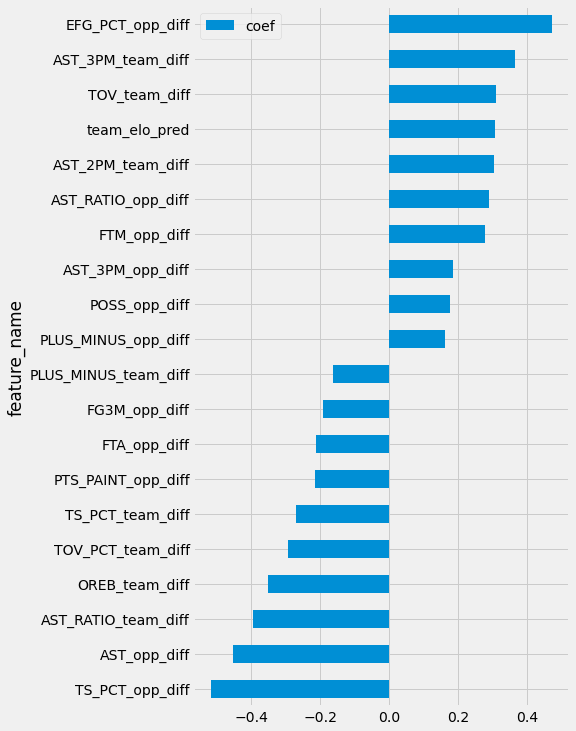

In [185]:
lr_C = study_lr.best_params['C']
print(lr_C)
best_lr = Pipeline([('scaler', StandardScaler()),
                    ('logreg', LogisticRegression(solver='saga', C=lr_C,
                                                  penalty='l2', max_iter=10000,
                                                 verbose=1, random_state=23))])
best_lr.fit(X_train, y_train)

lr_preds = best_lr.predict(X_test)

print(best_lr)

print("train_acc:", best_lr.score(X_train, y_train))
print("test_acc:", best_lr.score(X_test, y_test))
print("test_f1:", f1_score(y_test, lr_preds))

view_model_coefs(best_lr.named_steps['logreg'], X_train)

In [153]:
lr_probs = best_lr.predict_proba(X_test)

lr_betting_df = create_betting_df(home_games, lr_probs, test_idx)
lr_betting_df

,GAME_ID,MATCHUP,spread,team_score,point_diff,cover_home,prob,bet_home,bet_won,bankroll_i,bankroll_n,bet_size
0,21600075,NOP vs. PHX,-2.5,111,-1.0,0,0.463454,0,1,100.0,NaN,NaN
1,21600077,UTA vs. SAS,3.5,86,-14.0,0,0.470560,0,1,NaN,NaN,NaN
2,21600078,LAL vs. GSW,11.5,117,20.0,1,0.450544,0,0,NaN,NaN,NaN
3,21600083,IND vs. CHI,-3.5,111,17.0,1,0.516492,1,1,NaN,NaN,NaN
4,21600084,ATL vs. HOU,-3.0,112,15.0,1,0.537886,1,1,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
5652,42000402,PHX vs. MIL,-4.5,118,10.0,1,0.460661,0,0,NaN,NaN,NaN
5653,42000403,MIL vs. PHX,-4.5,120,20.0,1,0.611352,1,1,NaN,NaN,NaN
5654,42000404,MIL vs. PHX,-4.5,109,6.0,1,0.616458,1,1,NaN,NaN,NaN
5655,42000405,PHX vs. MIL,-4.0,119,-4.0,0,0.392675,0,1,NaN,NaN,NaN


In [198]:
def objective(trial):   
    lr_C = trial.suggest_float('C', 1e-5, 1e2, log=True)
    
    classifier_obj = Pipeline([('scaler', StandardScaler()),
                    ('logreg', LogisticRegression(solver='saga', C=lr_C,
                                                  penalty='l2', max_iter=10000,
                                                 verbose=1))])
    
    score = cross_val_score(classifier_obj, X_train, y_train, n_jobs=-1,
                           cv=tscv, scoring='accuracy')
    
    
    score_avg = score.mean()
    
    return score_avg

study_name = 'study_lr_home_acc'
storage_name = "sqlite:///study_lr_home.db"

study_lr = optuna.create_study(study_name = study_name, direction='maximize', 
                               storage = storage_name, load_if_exists=True)

study_lr.optimize(objective, n_trials=250)


# lr_C = study_lr.best_params['C']
# print(lr_C)
# best_lr = Pipeline([('scaler', StandardScaler()),
#                     ('logreg', LogisticRegression(solver='saga', C=lr_C,
#                                                   penalty='l2', max_iter=10000,
#                                                  verbose=1, random_state=23))])
# best_lr.fit(X_train, y_train)

# lr_preds = best_lr.predict(X_test)

# print(best_lr)

# print("train_acc:", best_lr.score(X_train, y_train))
# print("test_acc:", best_lr.score(X_test, y_test))
# print("test_f1:", f1_score(y_test, lr_preds))

# view_model_coefs(best_lr.named_steps['logreg'], X_train)

[I 2021-09-13 16:48:47,310] Using an existing study with name 'study_lr_home_acc' instead of creating a new one.
[I 2021-09-13 16:48:48,066] Trial 5 finished with value: 0.5159725882973115 and parameters: {'C': 6.797996976631394e-05}. Best is trial 4 with value: 0.5293621507643648.
[I 2021-09-13 16:48:50,174] Trial 6 finished with value: 0.5252503953610965 and parameters: {'C': 0.08512301458643251}. Best is trial 4 with value: 0.5293621507643648.
[I 2021-09-13 16:49:29,542] Trial 7 finished with value: 0.5194517659462308 and parameters: {'C': 50.72835633890932}. Best is trial 4 with value: 0.5293621507643648.
[I 2021-09-13 16:49:30,339] Trial 8 finished with value: 0.5172377438060096 and parameters: {'C': 0.00010672314315727073}. Best is trial 4 with value: 0.5293621507643648.
[I 2021-09-13 16:49:37,170] Trial 9 finished with value: 0.5254612546125461 and parameters: {'C': 0.3827087454838292}. Best is trial 4 with value: 0.5293621507643648.
[I 2021-09-13 16:49:38,022] Trial 10 finished

[I 2021-09-13 16:51:07,413] Trial 49 finished with value: 0.5294675803900896 and parameters: {'C': 0.0012825671656933964}. Best is trial 12 with value: 0.5315761729045863.
[I 2021-09-13 16:51:08,187] Trial 50 finished with value: 0.5186083289404323 and parameters: {'C': 8.412088525047934e-05}. Best is trial 12 with value: 0.5315761729045863.
[I 2021-09-13 16:51:09,109] Trial 51 finished with value: 0.5295730100158145 and parameters: {'C': 0.002293452108235176}. Best is trial 12 with value: 0.5315761729045863.
[I 2021-09-13 16:51:10,275] Trial 52 finished with value: 0.52925672113864 and parameters: {'C': 0.004609869909372529}. Best is trial 12 with value: 0.5315761729045863.
[I 2021-09-13 16:51:10,930] Trial 53 finished with value: 0.5296784396415394 and parameters: {'C': 0.0021800640908756865}. Best is trial 12 with value: 0.5315761729045863.
[I 2021-09-13 16:51:11,853] Trial 54 finished with value: 0.5290458618871903 and parameters: {'C': 0.010610799440690046}. Best is trial 12 with 

[I 2021-09-13 16:51:40,973] Trial 94 finished with value: 0.5240906694781233 and parameters: {'C': 0.0002697095993087826}. Best is trial 92 with value: 0.5319978914074854.
[I 2021-09-13 16:51:41,593] Trial 95 finished with value: 0.5284132841328413 and parameters: {'C': 0.004379015235864762}. Best is trial 92 with value: 0.5319978914074854.
[I 2021-09-13 16:51:42,333] Trial 96 finished with value: 0.5291512915129151 and parameters: {'C': 0.0012274063359805415}. Best is trial 92 with value: 0.5319978914074854.
[I 2021-09-13 16:51:43,151] Trial 97 finished with value: 0.5312598840274116 and parameters: {'C': 0.0017032280581297044}. Best is trial 92 with value: 0.5319978914074854.
[I 2021-09-13 16:51:43,905] Trial 98 finished with value: 0.5315761729045863 and parameters: {'C': 0.0029778183431555423}. Best is trial 92 with value: 0.5319978914074854.
[I 2021-09-13 16:51:44,614] Trial 99 finished with value: 0.5314707432788615 and parameters: {'C': 0.0030226574699858976}. Best is trial 92 w

[I 2021-09-13 16:52:28,635] Trial 139 finished with value: 0.529889298892989 and parameters: {'C': 0.0020303623321399665}. Best is trial 92 with value: 0.5319978914074854.
[I 2021-09-13 16:52:29,345] Trial 140 finished with value: 0.5292567211386399 and parameters: {'C': 0.003820600955633279}. Best is trial 92 with value: 0.5319978914074854.
[I 2021-09-13 16:52:29,810] Trial 141 finished with value: 0.531049024775962 and parameters: {'C': 0.0025928217711326685}. Best is trial 92 with value: 0.5319978914074854.
[I 2021-09-13 16:52:30,511] Trial 142 finished with value: 0.5304164470216131 and parameters: {'C': 0.003234645320581054}. Best is trial 92 with value: 0.5319978914074854.
[I 2021-09-13 16:52:31,114] Trial 143 finished with value: 0.5280969952556668 and parameters: {'C': 0.007692921023029992}. Best is trial 92 with value: 0.5319978914074854.
[I 2021-09-13 16:52:31,846] Trial 144 finished with value: 0.531681602530311 and parameters: {'C': 0.001736238659600767}. Best is trial 92 w

[I 2021-09-13 16:53:46,033] Trial 184 finished with value: 0.531049024775962 and parameters: {'C': 0.0015668399677139198}. Best is trial 92 with value: 0.5319978914074854.
[I 2021-09-13 16:53:46,648] Trial 185 finished with value: 0.5314707432788615 and parameters: {'C': 0.0029303513341565513}. Best is trial 92 with value: 0.5319978914074854.
[I 2021-09-13 16:53:47,231] Trial 186 finished with value: 0.5293621507643648 and parameters: {'C': 0.0010581326098415352}. Best is trial 92 with value: 0.5319978914074854.
[I 2021-09-13 16:53:47,856] Trial 187 finished with value: 0.5309435951502371 and parameters: {'C': 0.0019005792831239196}. Best is trial 92 with value: 0.5319978914074854.
[I 2021-09-13 16:53:48,430] Trial 188 finished with value: 0.529889298892989 and parameters: {'C': 0.004934560806777584}. Best is trial 92 with value: 0.5319978914074854.
[I 2021-09-13 16:53:49,049] Trial 189 finished with value: 0.5309435951502373 and parameters: {'C': 0.003170256779165313}. Best is trial 9

[I 2021-09-13 16:54:44,249] Trial 229 finished with value: 0.531681602530311 and parameters: {'C': 0.003044576103944419}. Best is trial 92 with value: 0.5319978914074854.
[I 2021-09-13 16:54:45,088] Trial 230 finished with value: 0.5313653136531364 and parameters: {'C': 0.0028445929690152456}. Best is trial 92 with value: 0.5319978914074854.
[I 2021-09-13 16:54:45,907] Trial 231 finished with value: 0.530521876647338 and parameters: {'C': 0.003371074338853489}. Best is trial 92 with value: 0.5319978914074854.
[I 2021-09-13 16:54:46,643] Trial 232 finished with value: 0.5318924617817606 and parameters: {'C': 0.0017781205816743803}. Best is trial 92 with value: 0.5319978914074854.
[I 2021-09-13 16:54:47,239] Trial 233 finished with value: 0.5285187137585661 and parameters: {'C': 0.004297191473969618}. Best is trial 92 with value: 0.5319978914074854.
[I 2021-09-13 16:54:47,880] Trial 234 finished with value: 0.5295730100158145 and parameters: {'C': 0.0025059489294857037}. Best is trial 92

0.0017529526386885924


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 19 epochs took 0 seconds
Pipeline(steps=[('scaler', StandardScaler()),
                ('logreg',
                 LogisticRegression(C=0.0017529526386885924, max_iter=10000,
                                    random_state=23, solver='saga',
                                    verbose=1))])
train_acc: 0.5410628019323671
test_acc: 0.5129927523422309
test_f1: 0.46886446886446886


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished


,feature_name,coef
30,UAST_3PM_team_diff,-0.045254
36,FG3A_opp_diff,-0.044632
55,PTS_FB_opp_diff,-0.043913
23,PTS_2PT_MR_team_diff,-0.034960
46,PF_opp_diff,-0.029721
1,avg_spread,-0.028283
3,FG2A_team_diff,-0.027074
57,PTS_PAINT_opp_diff,-0.025489
58,AST_2PM_opp_diff,-0.021940
44,BLK_opp_diff,-0.021085


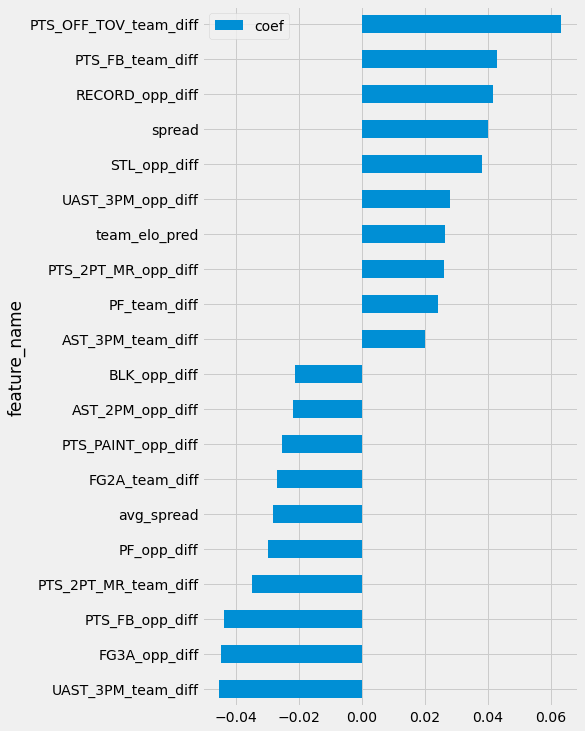

In [211]:
lr_C = study_lr.best_params['C']
print(lr_C)
best_lr = Pipeline([('scaler', StandardScaler()),
                    ('logreg', LogisticRegression(solver='saga', C=lr_C,
                                                  penalty='l2', max_iter=10000,
                                                 verbose=1, random_state=23))])
best_lr.fit(X_train, y_train)

lr_preds = best_lr.predict(X_test)

print(best_lr)

print("train_acc:", best_lr.score(X_train, y_train))
print("test_acc:", best_lr.score(X_test, y_test))
print("test_f1:", f1_score(y_test, lr_preds))

view_model_coefs(best_lr.named_steps['logreg'], X_train)


### SGD

## SVC 

In [199]:
def objective(trial):    
    svc_C = trial.suggest_float('C', 1e-5, 1e2, log=True)
    
    classifier_obj = Pipeline(steps=[('scaler', StandardScaler()),
                ('svc', LinearSVC(C = svc_C,
                                loss='hinge',
                               max_iter=100000,
                                     random_state=23))])
    
    score = cross_val_score(classifier_obj, X_train, y_train, n_jobs=-1,
                           cv=tscv, scoring='accuracy')
    
    
    score_avg = score.mean()
    
    return score_avg

study_name = 'study_svc_home_acc'
storage_name = "sqlite:///study_svc_home.db"

study_svc_acc = optuna.create_study(study_name = study_name, direction='maximize', 
                               storage = storage_name, load_if_exists=True)

study_svc_acc.optimize(objective, n_trials=150)

[I 2021-09-13 16:55:02,044] A new study created in RDB with name: study_svc_home_acc
[I 2021-09-13 16:55:02,394] Trial 0 finished with value: 0.5229309435951502 and parameters: {'C': 0.0008848174350908947}. Best is trial 0 with value: 0.5229309435951502.
[I 2021-09-13 16:55:02,741] Trial 1 finished with value: 0.5272535582498682 and parameters: {'C': 0.001524808873403476}. Best is trial 1 with value: 0.5272535582498682.
[I 2021-09-13 16:55:03,199] Trial 2 finished with value: 0.5156562994201371 and parameters: {'C': 0.00027127166011186644}. Best is trial 1 with value: 0.5272535582498682.
[I 2021-09-13 16:55:03,753] Trial 3 finished with value: 0.5291512915129151 and parameters: {'C': 0.0033974350692221817}. Best is trial 3 with value: 0.5291512915129151.
[I 2021-09-13 16:55:04,061] Trial 4 finished with value: 0.5131259884027413 and parameters: {'C': 2.683070513588929e-05}. Best is trial 3 with value: 0.5291512915129151.
[I 2021-09-13 16:55:07,870] Trial 5 finished with value: 0.523458

[I 2021-09-13 16:57:35,281] Trial 45 finished with value: 0.5271481286241434 and parameters: {'C': 0.24389085065793947}. Best is trial 39 with value: 0.5303110173958883.
[I 2021-09-13 16:57:35,834] Trial 46 finished with value: 0.5222983658408012 and parameters: {'C': 0.0009113970218256387}. Best is trial 39 with value: 0.5303110173958883.
[I 2021-09-13 16:57:36,176] Trial 47 finished with value: 0.5301001581444387 and parameters: {'C': 0.005911157734027489}. Best is trial 39 with value: 0.5303110173958883.
[I 2021-09-13 16:57:36,539] Trial 48 finished with value: 0.5287295730100159 and parameters: {'C': 0.00820954283340884}. Best is trial 39 with value: 0.5303110173958883.
[I 2021-09-13 16:57:37,123] Trial 49 finished with value: 0.5271481286241434 and parameters: {'C': 0.012593914172460235}. Best is trial 39 with value: 0.5303110173958883.
[I 2021-09-13 16:57:37,901] Trial 50 finished with value: 0.5284132841328413 and parameters: {'C': 0.07106621724238148}. Best is trial 39 with val

[I 2021-09-13 16:59:33,868] Trial 90 finished with value: 0.5284132841328413 and parameters: {'C': 0.04348501146963828}. Best is trial 81 with value: 0.5308381655245125.
[I 2021-09-13 16:59:34,447] Trial 91 finished with value: 0.5288350026357407 and parameters: {'C': 0.003335292258364506}. Best is trial 81 with value: 0.5308381655245125.
[I 2021-09-13 16:59:34,843] Trial 92 finished with value: 0.5301001581444387 and parameters: {'C': 0.005900748815078946}. Best is trial 81 with value: 0.5308381655245125.
[I 2021-09-13 16:59:35,247] Trial 93 finished with value: 0.52925672113864 and parameters: {'C': 0.0020018901575598086}. Best is trial 81 with value: 0.5308381655245125.
[I 2021-09-13 16:59:35,579] Trial 94 finished with value: 0.529889298892989 and parameters: {'C': 0.0023925250519681173}. Best is trial 81 with value: 0.5308381655245125.
[I 2021-09-13 16:59:35,899] Trial 95 finished with value: 0.524301528729573 and parameters: {'C': 0.0009981964109753295}. Best is trial 81 with val

[I 2021-09-13 17:00:14,796] Trial 135 finished with value: 0.5303110173958883 and parameters: {'C': 0.0026018421840153243}. Best is trial 81 with value: 0.5308381655245125.
[I 2021-09-13 17:00:15,133] Trial 136 finished with value: 0.5266209804955193 and parameters: {'C': 0.0013368259097498833}. Best is trial 81 with value: 0.5308381655245125.
[I 2021-09-13 17:00:15,494] Trial 137 finished with value: 0.5297838692672642 and parameters: {'C': 0.002922419305270078}. Best is trial 81 with value: 0.5308381655245125.
[I 2021-09-13 17:00:15,855] Trial 138 finished with value: 0.5274644175013179 and parameters: {'C': 0.0067451706275027355}. Best is trial 81 with value: 0.5308381655245125.
[I 2021-09-13 17:00:16,171] Trial 139 finished with value: 0.5287295730100158 and parameters: {'C': 0.0017417796972552847}. Best is trial 81 with value: 0.5308381655245125.
[I 2021-09-13 17:00:16,578] Trial 140 finished with value: 0.5303110173958883 and parameters: {'C': 0.005183068640725726}. Best is trial

In [212]:
svc_C = study_svc_acc.best_params['C']
print('C:', svc_C)
best_svc = Pipeline(steps=[('scaler', StandardScaler()),
                ('svc', LinearSVC(C = svc_C,
                                loss='hinge',
                               max_iter=100000,
                                     random_state=23))]) 


best_svc.fit(X_train, y_train)
svc_preds = best_svc.predict(X_test)

print("best_svc:", best_svc)


print("train_score:", best_svc.score(X_train, y_train))
print("test_score:", best_svc.score(X_test, y_test))
print("svc_f1_score:", f1_score(y_test, svc_preds))

C: 0.005271998110254904
best_svc: Pipeline(steps=[('scaler', StandardScaler()),
                ('svc',
                 LinearSVC(C=0.005271998110254904, loss='hinge',
                           max_iter=100000, random_state=23))])
train_score: 0.5420289855072464
test_score: 0.5119321194979671
svc_f1_score: 0.47539426182785494


0
test set 1: 2016-11-04 - 2017-06-12


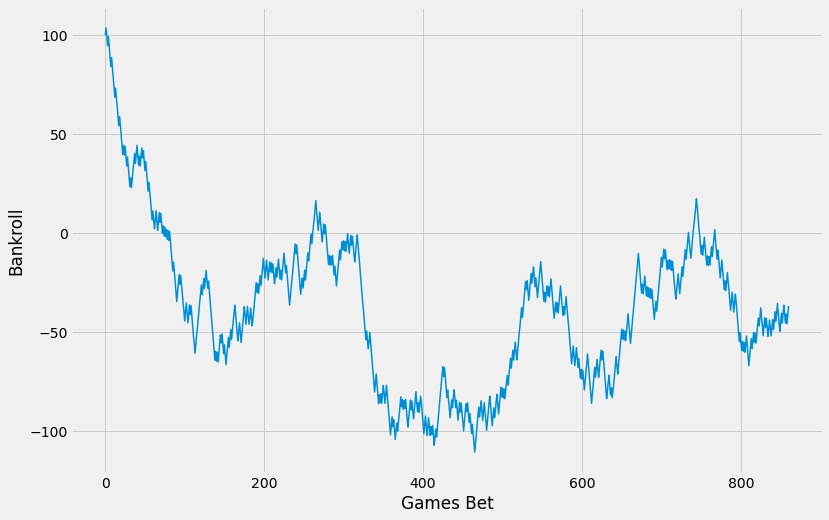

min balance: -110.54545454545439 
max balance: 103.63636363636364 
final balance: -41.727272727272364 
win percentage 50.41 
profit: -141.72727272727298 risk: 4189.0 
ROI: -3.38
1
test set 1: 2017-10-28 - 2018-06-08


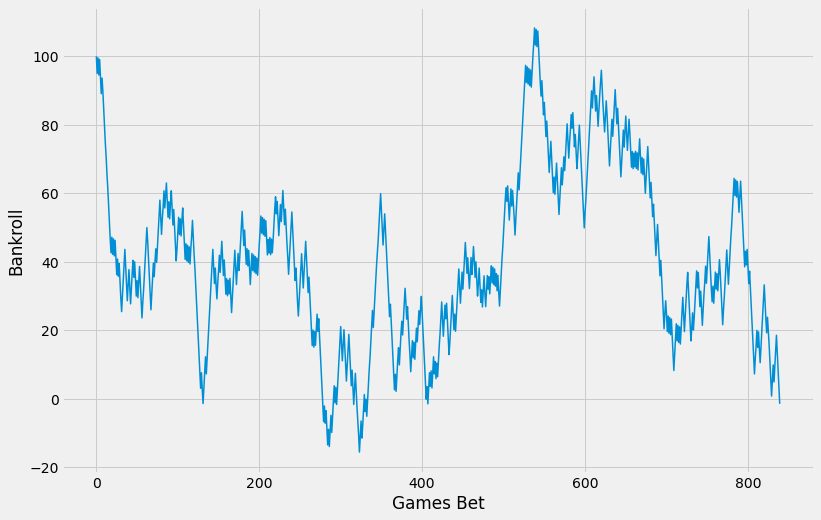

min balance: -15.545454545454474 
max balance: 108.27272727272741 
final balance: 3.0909090909093475 
win percentage 51.190000000000005 
profit: -96.90909090909099 risk: 4085.0 
ROI: -2.37
2
test set 1: 2018-10-26 - 2019-06-13


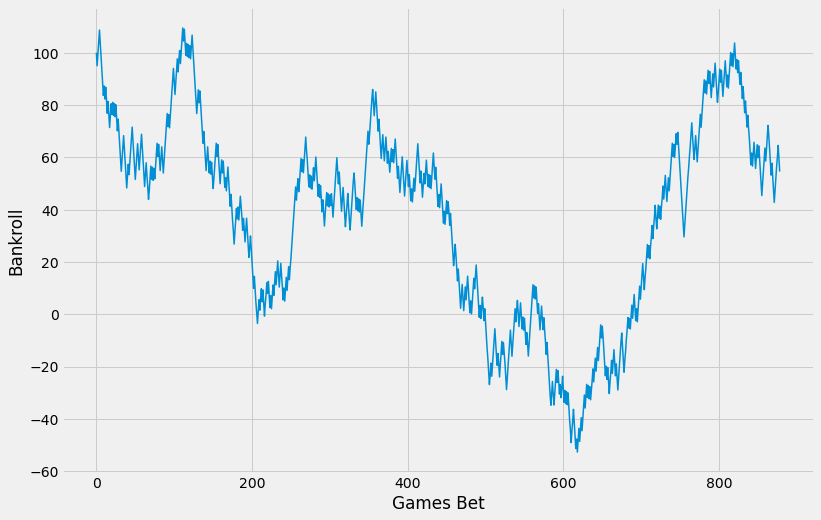

min balance: -52.72727272727254 
max balance: 109.45454545454552 
final balance: 49.54545454545483 
win percentage 51.65 
profit: -50.45454545454572 risk: 4302.0 
ROI: -1.17
3
test set 1: 2019-11-01 - 2020-10-11


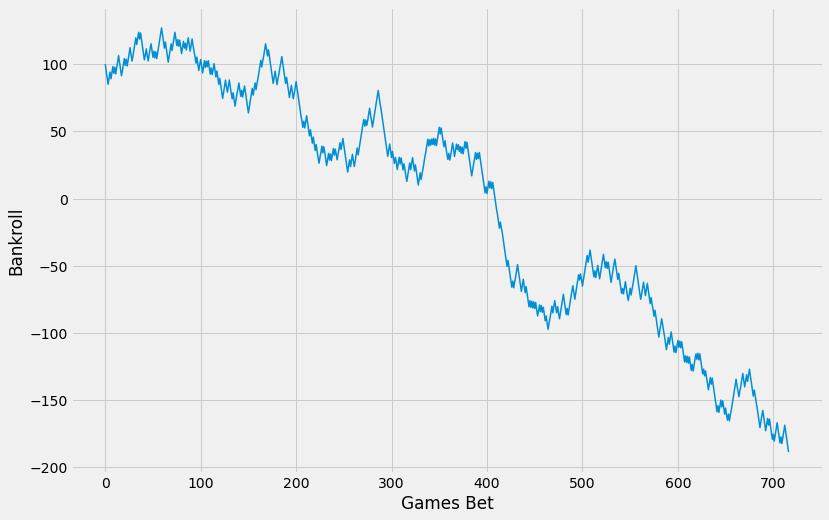

min balance: -188.5454545454547 
max balance: 126.90909090909096 
final balance: -184.00000000000017 
win percentage 48.120000000000005 
profit: -284.0000000000002 risk: 3497.0 
ROI: -8.12
4
test set 1: 2021-01-01 - 2021-07-20


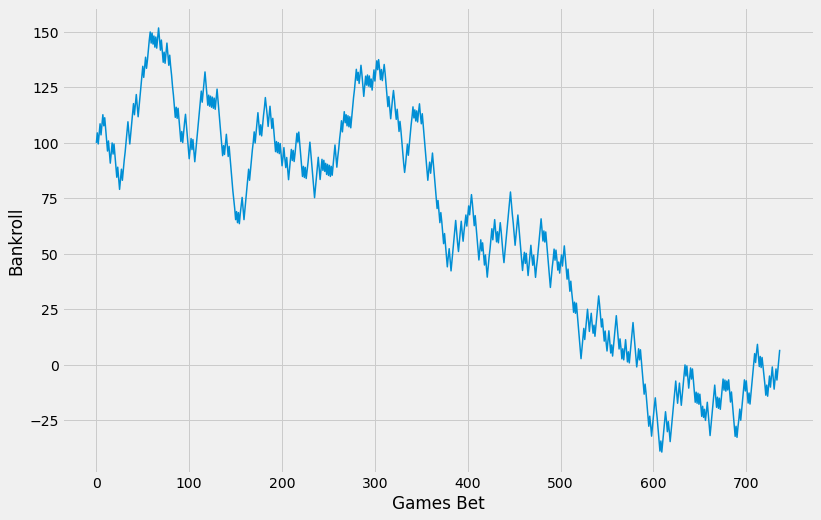

min balance: -39.272727272727394 
max balance: 151.8181818181817 
final balance: 11.363636363636244 
win percentage 51.15 
profit: -88.63636363636374 risk: 3588.0 
ROI: -2.4699999999999998

 Pipeline(steps=[('scaler', StandardScaler()),
                ('svc',
                 LinearSVC(C=0.00012274891393373387, loss='hinge',
                           max_iter=100000, random_state=23))])
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2016, -, 2017)            0.53  0.504065            861 -0.033833   
1  (2017, -, 2018)            0.53  0.511905            840 -0.023723   
2  (2018, -, 2019)            0.53  0.516496            879 -0.011728   
3  (2019, -, 2020)            0.53  0.481172            717 -0.081212   
4  (2021, -, 2021)            0.53  0.511533            737 -0.024704   

      profits  
0 -141.727273  
1  -96.909091  
2  -50.454545  
3 -284.000000  
4  -88.636364  


,season,best_threshold,win_pcts,num_games_bet,rois,profits
0,"(2016, -, 2017)",0.53,0.504065,861,-0.033833,-141.727273
1,"(2017, -, 2018)",0.53,0.511905,840,-0.023723,-96.909091
2,"(2018, -, 2019)",0.53,0.516496,879,-0.011728,-50.454545
3,"(2019, -, 2020)",0.53,0.481172,717,-0.081212,-284.000000
4,"(2021, -, 2021)",0.53,0.511533,737,-0.024704,-88.636364


In [154]:
cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21]

threshold = 0.53

for estimator in [best_svc]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test1, y_train1, y_test1, train_idx1, test_idx1 = split_prep_data(home_games, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test1.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='D'))

        year = (np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='Y'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='Y'))


        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(home_games, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_3(select_bets)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)
    print(results_by_season)

results_by_season

In [184]:
svc_pipe_rbf = Pipeline(steps=[('scaler', StandardScaler()),
                ('svc', SVC(random_state=23, probability=True))])



params = {
    'svc__C': np.logspace(-3,1,100)
}

svc_rbf_cv = GridSearchCV(svc_pipe_rbf, param_grid=params, scoring='roc_auc', cv=tscv, n_jobs=-1, verbose=1)


svc_rbf_cv.fit(X_train, y_train)

best_svc_rbf = svc_rbf_cv.best_estimator_
print("best_svc_rbf:", best_svc_rbf)


print("train_score:", best_svc_rbf.score(X_train, y_train))
print("test_score:", best_svc_rbf.score(X_test, y_test))

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 38.1min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 189.3min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed: 451.8min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 584.5min finished


best_svc_rbf: Pipeline(steps=[('scaler', StandardScaler()),
                ('svc',
                 SVC(C=0.29150530628251786, probability=True,
                     random_state=23))])
train_score: 0.5943226260051853
test_score: 0.5101282618310482


In [185]:
sgd_pipe = Pipeline(steps=[('scaler', StandardScaler()),
                ('sgd', SGDClassifier(loss='hinge',
                               max_iter=50000,
                                     random_state=23))])

params = {
    'sgd__alpha': np.logspace(-8,-1,100)
}

sgd_cv = GridSearchCV(sgd_pipe, param_grid=params, scoring='roc_auc', cv=tscv, n_jobs=-1, verbose=1)


sgd_cv.fit(X_train, y_train)

best_sgd_hinge = sgd_cv.best_estimator_
print("best_sgd_hinge:", best_sgd_hinge)


print("train_score:", best_sgd_hinge.score(X_train, y_train))
print("test_score:", best_sgd_hinge.score(X_test, y_test))

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   11.9s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   50.8s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  1.4min finished


best_sgd_hinge: Pipeline(steps=[('scaler', StandardScaler()),
                ('sgd',
                 SGDClassifier(alpha=0.03764935806792464, max_iter=50000,
                               random_state=23))])
train_score: 0.5381640813815529
test_score: 0.5093321539141973


In [200]:
def objective(trial):
    sgd_alpha = trial.suggest_float('alpha', 1e-5, 1e2, log=True)
    
    classifier_obj = Pipeline(steps=[('scaler', StandardScaler()),
                ('sgd', SGDClassifier(alpha = sgd_alpha,
                                      loss='modified_huber',
                               max_iter=10000,
                                     random_state=23))])
    
    score = cross_val_score(classifier_obj, X_train, y_train, n_jobs=-1,
                           cv=tscv, scoring='accuracy')
    
    
    score_avg = score.mean()
    
    return score_avg

study_name = 'study_sgd_home_acc'
storage_name = "sqlite:///study_sgd_home.db"

study_sgd = optuna.create_study(study_name = study_name, direction='maximize', 
                               storage = storage_name, load_if_exists=True)

study_sgd.optimize(objective, n_trials=500)

[I 2021-09-13 17:00:20,484] A new study created in RDB with name: study_sgd_home_acc
[I 2021-09-13 17:00:21,586] Trial 0 finished with value: 0.5072219293621507 and parameters: {'alpha': 0.0001252136174066292}. Best is trial 0 with value: 0.5072219293621507.
[I 2021-09-13 17:00:22,375] Trial 1 finished with value: 0.49404322614654717 and parameters: {'alpha': 3.1727298429132585e-05}. Best is trial 0 with value: 0.5072219293621507.
[I 2021-09-13 17:00:23,141] Trial 2 finished with value: 0.49710068529256723 and parameters: {'alpha': 0.00039008954481353433}. Best is trial 0 with value: 0.5072219293621507.
[I 2021-09-13 17:00:23,449] Trial 3 finished with value: 0.5268318397469689 and parameters: {'alpha': 1.298129953499707}. Best is trial 3 with value: 0.5268318397469689.
[I 2021-09-13 17:00:23,831] Trial 4 finished with value: 0.507116499736426 and parameters: {'alpha': 22.458980156336086}. Best is trial 3 with value: 0.5268318397469689.
[I 2021-09-13 17:00:24,348] Trial 5 finished with

[I 2021-09-13 17:00:41,580] Trial 44 finished with value: 0.5304164470216131 and parameters: {'alpha': 0.18988837880044113}. Best is trial 34 with value: 0.5321033210332103.
[I 2021-09-13 17:00:41,916] Trial 45 finished with value: 0.531681602530311 and parameters: {'alpha': 0.18003578622186683}. Best is trial 34 with value: 0.5321033210332103.
[I 2021-09-13 17:00:42,292] Trial 46 finished with value: 0.5224037954665262 and parameters: {'alpha': 0.10604191839908955}. Best is trial 34 with value: 0.5321033210332103.
[I 2021-09-13 17:00:42,723] Trial 47 finished with value: 0.5287295730100159 and parameters: {'alpha': 0.9255680390034997}. Best is trial 34 with value: 0.5321033210332103.
[I 2021-09-13 17:00:43,140] Trial 48 finished with value: 0.5161834475487612 and parameters: {'alpha': 0.024977492916639938}. Best is trial 34 with value: 0.5321033210332103.
[I 2021-09-13 17:00:43,987] Trial 49 finished with value: 0.49847127042699 and parameters: {'alpha': 1.5968083354860117e-05}. Best 

[I 2021-09-13 17:01:00,358] Trial 88 finished with value: 0.5298892988929889 and parameters: {'alpha': 0.1998698930041703}. Best is trial 87 with value: 0.5328413284132841.
[I 2021-09-13 17:01:00,824] Trial 89 finished with value: 0.5244069583552978 and parameters: {'alpha': 0.13989973301171096}. Best is trial 87 with value: 0.5328413284132841.
[I 2021-09-13 17:01:01,233] Trial 90 finished with value: 0.5168160253031101 and parameters: {'alpha': 0.05429822868868304}. Best is trial 87 with value: 0.5328413284132841.
[I 2021-09-13 17:01:01,557] Trial 91 finished with value: 0.531681602530311 and parameters: {'alpha': 0.18152839948001534}. Best is trial 87 with value: 0.5328413284132841.
[I 2021-09-13 17:01:01,890] Trial 92 finished with value: 0.5311544544016868 and parameters: {'alpha': 0.18432936161900912}. Best is trial 87 with value: 0.5328413284132841.
[I 2021-09-13 17:01:02,350] Trial 93 finished with value: 0.521771217712177 and parameters: {'alpha': 0.09406794127051973}. Best is 

[I 2021-09-13 17:01:18,653] Trial 132 finished with value: 0.5301001581444387 and parameters: {'alpha': 0.1533906104392737}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:01:18,987] Trial 133 finished with value: 0.5292567211386399 and parameters: {'alpha': 0.2202620913890803}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:01:19,336] Trial 134 finished with value: 0.5222983658408011 and parameters: {'alpha': 0.10175688124561137}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:01:19,672] Trial 135 finished with value: 0.5289404322614655 and parameters: {'alpha': 0.4086225615893091}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:01:20,053] Trial 136 finished with value: 0.5231418028465998 and parameters: {'alpha': 0.06949281609018854}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:01:20,393] Trial 137 finished with value: 0.5297838692672642 and parameters: {'alpha': 0.15587265555298788

[I 2021-09-13 17:01:36,089] Trial 176 finished with value: 0.5301001581444386 and parameters: {'alpha': 0.15178372656067504}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:01:36,645] Trial 177 finished with value: 0.530521876647338 and parameters: {'alpha': 0.2342142997752288}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:01:37,057] Trial 178 finished with value: 0.5152345809172377 and parameters: {'alpha': 0.046276451069911795}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:01:37,414] Trial 179 finished with value: 0.5245123879810226 and parameters: {'alpha': 0.08389243223792796}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:01:37,794] Trial 180 finished with value: 0.5284132841328413 and parameters: {'alpha': 0.3375095685432151}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:01:38,127] Trial 181 finished with value: 0.5328413284132841 and parameters: {'alpha': 0.1754245712601549

[I 2021-09-13 17:01:52,859] Trial 220 finished with value: 0.5306273062730626 and parameters: {'alpha': 0.3200664359722224}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:01:53,206] Trial 221 finished with value: 0.5292567211386399 and parameters: {'alpha': 0.1486731969906285}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:01:53,570] Trial 222 finished with value: 0.5232472324723247 and parameters: {'alpha': 0.12223283653555322}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:01:53,918] Trial 223 finished with value: 0.5328413284132842 and parameters: {'alpha': 0.17446618644541942}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:01:54,254] Trial 224 finished with value: 0.5297838692672642 and parameters: {'alpha': 0.21399842726325527}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:01:54,587] Trial 225 finished with value: 0.5302055877701634 and parameters: {'alpha': 0.1535893749091445

[I 2021-09-13 17:02:09,256] Trial 264 finished with value: 0.5221929362150763 and parameters: {'alpha': 0.10843894391324317}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:02:09,609] Trial 265 finished with value: 0.507116499736426 and parameters: {'alpha': 94.28473830357774}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:02:09,945] Trial 266 finished with value: 0.5327358987875593 and parameters: {'alpha': 0.17257686311928863}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:02:10,288] Trial 267 finished with value: 0.5290458618871903 and parameters: {'alpha': 0.3966194258207925}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:02:10,636] Trial 268 finished with value: 0.5321033210332103 and parameters: {'alpha': 0.1785428236321735}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:02:10,981] Trial 269 finished with value: 0.5303110173958883 and parameters: {'alpha': 0.27809279306508594}.

[I 2021-09-13 17:02:26,953] Trial 308 finished with value: 0.5280969952556669 and parameters: {'alpha': 0.3494700484577348}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:02:27,293] Trial 309 finished with value: 0.5296784396415392 and parameters: {'alpha': 0.20363259424815042}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:02:27,674] Trial 310 finished with value: 0.5226146547179757 and parameters: {'alpha': 0.10593844408261921}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:02:28,594] Trial 311 finished with value: 0.5025830258302583 and parameters: {'alpha': 1.132611787468495e-05}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:02:28,954] Trial 312 finished with value: 0.5246178176067475 and parameters: {'alpha': 0.13068896014811862}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:02:29,302] Trial 313 finished with value: 0.5309435951502371 and parameters: {'alpha': 0.3217139180249

[I 2021-09-13 17:02:45,213] Trial 352 finished with value: 0.5296784396415394 and parameters: {'alpha': 0.20772941561061267}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:02:45,576] Trial 353 finished with value: 0.507116499736426 and parameters: {'alpha': 13.957266443407594}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:02:45,955] Trial 354 finished with value: 0.523668950975224 and parameters: {'alpha': 0.1191440180286667}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:02:46,420] Trial 355 finished with value: 0.5111228255139695 and parameters: {'alpha': 0.010999594008255738}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:02:46,763] Trial 356 finished with value: 0.5290458618871903 and parameters: {'alpha': 0.38433705944912155}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:02:47,253] Trial 357 finished with value: 0.5309435951502373 and parameters: {'alpha': 0.24741720167871403

[I 2021-09-13 17:03:02,420] Trial 396 finished with value: 0.5326304691618344 and parameters: {'alpha': 0.17377180571708403}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:03:02,912] Trial 397 finished with value: 0.5235635213494991 and parameters: {'alpha': 0.07138796936412516}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:03:03,235] Trial 398 finished with value: 0.5304164470216131 and parameters: {'alpha': 0.2805305643204067}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:03:03,598] Trial 399 finished with value: 0.5221929362150763 and parameters: {'alpha': 0.09522454040123429}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:03:04,064] Trial 400 finished with value: 0.5303110173958883 and parameters: {'alpha': 0.15857969965146426}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:03:04,517] Trial 401 finished with value: 0.52925672113864 and parameters: {'alpha': 0.21967084453182947

[I 2021-09-13 17:03:21,159] Trial 440 finished with value: 0.5318924617817606 and parameters: {'alpha': 0.16341275637656033}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:03:21,539] Trial 441 finished with value: 0.5216657880864524 and parameters: {'alpha': 0.06274010821925913}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:03:21,870] Trial 442 finished with value: 0.5293621507643648 and parameters: {'alpha': 0.7086317173750398}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:03:22,489] Trial 443 finished with value: 0.5226146547179757 and parameters: {'alpha': 0.1031176423584602}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:03:22,830] Trial 444 finished with value: 0.5307327358987876 and parameters: {'alpha': 0.28526322085172373}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:03:23,177] Trial 445 finished with value: 0.5308381655245125 and parameters: {'alpha': 0.1879310413191815

[I 2021-09-13 17:03:38,903] Trial 484 finished with value: 0.5295730100158144 and parameters: {'alpha': 0.2551919832452344}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:03:39,297] Trial 485 finished with value: 0.5288350026357407 and parameters: {'alpha': 0.46946015484094705}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:03:39,643] Trial 486 finished with value: 0.5240906694781234 and parameters: {'alpha': 0.13467270464378073}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:03:39,991] Trial 487 finished with value: 0.5296784396415394 and parameters: {'alpha': 0.21421658056706577}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:03:40,594] Trial 488 finished with value: 0.5249341064839219 and parameters: {'alpha': 0.08080806768393273}. Best is trial 121 with value: 0.5330521876647338.
[I 2021-09-13 17:03:40,936] Trial 489 finished with value: 0.5313653136531366 and parameters: {'alpha': 0.326943509855548

0.17617800797124716
best_sgd: Pipeline(steps=[('scaler', StandardScaler()),
                ('sgd',
                 SGDClassifier(alpha=0.17617800797124716, loss='modified_huber',
                               max_iter=10000, random_state=23))])
train_score: 0.5426438296003513
test_score: 0.5115785752165459


,feature_name,coef
36,FG3A_opp_diff,-0.028369
30,UAST_3PM_team_diff,-0.027462
55,PTS_FB_opp_diff,-0.025491
46,PF_opp_diff,-0.019019
1,avg_spread,-0.018973
23,PTS_2PT_MR_team_diff,-0.018466
3,FG2A_team_diff,-0.015529
14,TOV_team_diff,-0.015187
17,PLUS_MINUS_team_diff,-0.013824
57,PTS_PAINT_opp_diff,-0.013194


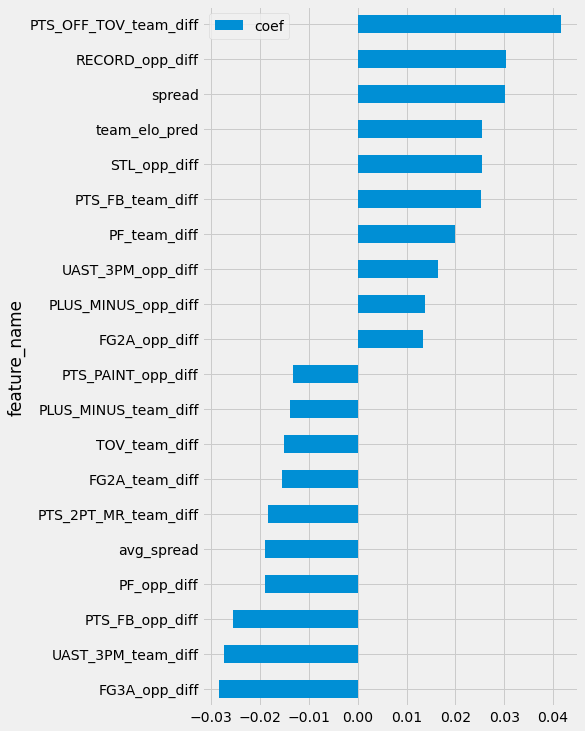

In [213]:
sgd_alpha = study_sgd.best_params['alpha']
print(sgd_alpha)
best_sgd = Pipeline(steps=[('scaler', StandardScaler()),
                ('sgd', SGDClassifier(alpha = sgd_alpha,
                                      loss='modified_huber',
                               max_iter=10000,
                                     random_state=23))])


print("best_sgd:", best_sgd)

best_sgd.fit(X_train, y_train)

print("train_score:", best_sgd.score(X_train, y_train))
print("test_score:", best_sgd.score(X_test, y_test))

view_model_coefs(best_sgd.named_steps['sgd'], X_train)

In [542]:
X_train

,avg_ml,avg_spread,FG2M_team_diff,FG2A_team_diff,FG3M_team_diff,FG3A_team_diff,FTM_team_diff,FTA_team_diff,OREB_team_diff,DREB_team_diff,REB_team_diff,AST_team_diff,STL_team_diff,BLK_team_diff,TOV_team_diff,PF_team_diff,PTS_team_diff,PLUS_MINUS_team_diff,E_OFF_RATING_team_diff,E_DEF_RATING_team_diff,E_NET_RATING_team_diff,POSS_team_diff,PIE_team_diff,PTS_2PT_MR_team_diff,PTS_FB_team_diff,PTS_OFF_TOV_team_diff,PTS_PAINT_team_diff,AST_2PM_team_diff,UAST_2PM_team_diff,AST_3PM_team_diff,UAST_3PM_team_diff,team_covered_opp_diff,RECORD_opp_diff,FG2M_opp_diff,FG2A_opp_diff,FG3M_opp_diff,FG3A_opp_diff,FTM_opp_diff,FTA_opp_diff,OREB_opp_diff,DREB_opp_diff,REB_opp_diff,AST_opp_diff,STL_opp_diff,BLK_opp_diff,TOV_opp_diff,PF_opp_diff,PTS_opp_diff,PLUS_MINUS_opp_diff,E_OFF_RATING_opp_diff,E_DEF_RATING_opp_diff,E_NET_RATING_opp_diff,POSS_opp_diff,PIE_opp_diff,PTS_2PT_MR_opp_diff,PTS_FB_opp_diff,PTS_OFF_TOV_opp_diff,PTS_PAINT_opp_diff,AST_2PM_opp_diff,UAST_2PM_opp_diff,AST_3PM_opp_diff,UAST_3PM_opp_diff,WL_record_diff,ATS_record_diff,rest_diff,OREB_PCT_team_diff,OREB_PCT_opp_diff,DREB_PCT_team_diff,DREB_PCT_opp_diff,REB_PCT_team_diff,REB_PCT_opp_diff,TS_PCT_team_diff,TS_PCT_opp_diff,EFG_PCT_team_diff,EFG_PCT_opp_diff,AST_RATIO_team_diff,AST_RATIO_opp_diff,TOV_PCT_team_diff,TOV_PCT_opp_diff,team_elo_pred,team_rating_i,opp_rating_i,elo_MOV_pred,spread
15550,1.648539,-3.000000,0.575810,-7.261337,-1.148934,-6.622988,0.816903,4.248272,-4.494689,-1.648116,-6.142805,-4.424190,-0.493932,-1.449000,3.451833,1.093185,-1.478279,2.022368,2.621902,0.945064,1.721037,-3.771092,0.004203,7.343752,-1.015506,0.291275,-6.814339,-3.979243,4.377036,-0.654001,-0.501551,0.173378,-0.046397,-5.610901,-7.406803,1.867403,0.823912,2.118947,1.581207,-0.850773,-7.125809,-7.976582,-1.828820,3.576201,-0.950331,0.898220,2.521355,-3.500647,-2.022368,0.945064,2.621902,-1.721037,-3.595272,-0.004203,1.950380,-1.222461,4.223462,-12.996362,-4.447852,-0.943274,1.922786,0.206613,0.000000,-0.400000,0.0,-0.017803,-0.003636,0.003636,0.017803,0.017193,-0.017193,0.083842,0.021807,0.077382,0.005346,-3.823167,-1.197866,4.636984,1.547139,0.406054,1462.790293,1459.855633,0.10,5.5
15551,1.968208,-1.300000,-0.575810,7.261337,1.148934,6.622988,-0.816903,-4.248272,4.494689,1.648116,6.142805,4.424190,0.493932,1.449000,-3.451833,-1.093185,1.478279,-2.022368,-2.621902,-0.945064,-1.721037,3.771092,-0.004203,-7.343752,1.015506,-0.291275,6.814339,3.979243,-4.377036,0.654001,0.501551,-0.173378,0.046397,5.610901,7.406803,-1.867403,-0.823912,-2.118947,-1.581207,0.850773,7.125809,7.976582,1.828820,-3.576201,0.950331,-0.898220,-2.521355,3.500647,2.022368,-0.945064,-2.621902,1.721037,3.595272,0.004203,-1.950380,1.222461,-4.223462,12.996362,4.447852,0.943274,-1.922786,-0.206613,0.000000,0.400000,0.0,0.017803,0.003636,-0.003636,-0.017803,-0.017193,0.017193,-0.083842,-0.021807,-0.077382,-0.005346,3.823167,1.197866,-4.636984,-1.547139,0.593946,1459.855633,1462.790293,-0.10,-5.5
15556,3.360000,5.600000,4.323655,10.223951,-1.990916,-4.518327,3.477449,5.215013,0.176992,1.397329,1.574321,-3.763937,-2.460282,0.158091,1.194403,4.265342,6.152011,-11.563063,-3.340881,7.198786,-10.586064,8.137555,-0.110093,-6.745086,7.102708,-1.067984,14.759224,-1.253669,5.291373,-2.754463,0.299578,0.237577,0.237577,5.306342,10.466655,1.821274,3.126932,1.638568,2.391492,1.772655,3.590608,5.363263,2.750971,1.580670,3.027643,-2.042490,3.482626,17.715074,11.563063,7.198786,-3.340881,10.586064,9.014920,0.110093,-5.170399,4.523064,4.624869,15.901541,0.876755,4.213987,1.742595,0.336036,-0.200000,-0.200000,0.0,-0.024807,0.022560,-0.022560,0.024807,-0.025690,0.025690,-0.011884,0.008047,-0.019697,0.016364,-5.706641,0.917673,-0.350913,-3.647433,0.203901,1305.855727,1473.475318,-5.99,10.5
15557,1.930000,0.200000,-4.323655,-10.223951,1.990916,4.518327,-3.477449,-5.215013,-0.176992,-1.397329,-1.574321,3.763937,2.460282,-0.158091,-1.194403,-4.265342,-6.152011,11.563063,3.340881,-7.198786,10.586064,-8.137555,0.110093,6.745086,-7.102708,1.067984,-14.759

In [204]:
def objective(trial):    
    min_child_weight = trial.suggest_int('min_child_weight', 1, 16)
    subsample = trial.suggest_float('subsample', 0.6, 1)
    max_depth = trial.suggest_int('max_depth', 3, 20)
    reg_lambda = trial.suggest_float('reg_lambda', 0, 20)
    reg_alpha = trial.suggest_float('reg_alpha', 0, 5),
    num_leaves = trial.suggest_int('num_leaves', 2, 32)
    feature_fraction = trial.suggest_float('feature_fraction', 0.01, 1.0)
    
    classifier_obj = lgb.LGBMClassifier(feature_fraction=0.7796269937403173,
                                        max_depth=5,
                                        min_child_weight=7,
                                        num_leaves=num_leaves, 
                                        random_state=23,
                                        reg_alpha=3.571940784753475, 
                                        reg_lambda=17.76958546447963)
    
    score = cross_val_score(classifier_obj, X_train, y_train, n_jobs=-1,
                           cv=tscv, scoring='accuracy')
    
    
    score_avg = score.mean()
    
    return score_avg

study_name = 'study_lgbc_home_acc'
storage_name = "sqlite:///study_lgbc_home.db"

study_lgbc = optuna.create_study(study_name = study_name, direction='maximize', 
                               storage = storage_name, load_if_exists=True)

study_lgbc.optimize(objective, n_trials=250)

[I 2021-09-13 19:12:09,893] Using an existing study with name 'study_lgbc_home_acc' instead of creating a new one.
[I 2021-09-13 19:12:12,740] Trial 250 finished with value: 0.5150237216657881 and parameters: {'min_child_weight': 5, 'subsample': 0.7382260644028018, 'max_depth': 19, 'reg_lambda': 15.090827661350872, 'reg_alpha': 4.0385256504885065, 'num_leaves': 3, 'feature_fraction': 0.14385756665398475}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:12:14,064] Trial 251 finished with value: 0.5171323141802846 and parameters: {'min_child_weight': 8, 'subsample': 0.7247598333922147, 'max_depth': 10, 'reg_lambda': 1.7710289604200415, 'reg_alpha': 0.4218457713595245, 'num_leaves': 5, 'feature_fraction': 0.4242096595932158}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:12:15,989] Trial 252 finished with value: 0.5085925144965735 and parameters: {'min_child_weight': 6, 'subsample': 0.6563139474996346, 'max_depth': 17, 'reg_lambda': 3.6426825232958304, 

[I 2021-09-13 19:12:42,980] Trial 273 finished with value: 0.5160780179230364 and parameters: {'min_child_weight': 8, 'subsample': 0.7162732726829516, 'max_depth': 18, 'reg_lambda': 4.386021415538262, 'reg_alpha': 4.238700366162502, 'num_leaves': 4, 'feature_fraction': 0.6832711963897625}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:12:44,173] Trial 274 finished with value: 0.5171323141802846 and parameters: {'min_child_weight': 1, 'subsample': 0.6999084899474106, 'max_depth': 10, 'reg_lambda': 16.885825887312457, 'reg_alpha': 4.785698103625718, 'num_leaves': 5, 'feature_fraction': 0.6729123364028721}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:12:45,463] Trial 275 finished with value: 0.5167105956773854 and parameters: {'min_child_weight': 1, 'subsample': 0.8757949700600592, 'max_depth': 20, 'reg_lambda': 0.6925786965083756, 'reg_alpha': 4.606248353563953, 'num_leaves': 6, 'feature_fraction': 0.22397510956672584}. Best is trial 3 with value: 

[I 2021-09-13 19:13:11,404] Trial 297 finished with value: 0.5171323141802846 and parameters: {'min_child_weight': 7, 'subsample': 0.8090413554458615, 'max_depth': 19, 'reg_lambda': 5.663602632280673, 'reg_alpha': 4.9946217881483195, 'num_leaves': 5, 'feature_fraction': 0.658990946279735}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:13:12,550] Trial 298 finished with value: 0.5171323141802846 and parameters: {'min_child_weight': 1, 'subsample': 0.6002373045067132, 'max_depth': 20, 'reg_lambda': 15.69413463458714, 'reg_alpha': 4.400861565202183, 'num_leaves': 5, 'feature_fraction': 0.10498288366362554}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:13:13,778] Trial 299 finished with value: 0.5167105956773854 and parameters: {'min_child_weight': 1, 'subsample': 0.6166364203093035, 'max_depth': 20, 'reg_lambda': 5.698443118497214, 'reg_alpha': 4.921704490668659, 'num_leaves': 6, 'feature_fraction': 0.6746422376865664}. Best is trial 3 with value: 0.

[I 2021-09-13 19:13:42,380] Trial 321 finished with value: 0.5160780179230364 and parameters: {'min_child_weight': 2, 'subsample': 0.8773393120041865, 'max_depth': 7, 'reg_lambda': 5.067281687261681, 'reg_alpha': 4.351965696476951, 'num_leaves': 4, 'feature_fraction': 0.1239154538478922}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:13:43,686] Trial 322 finished with value: 0.5167105956773854 and parameters: {'min_child_weight': 6, 'subsample': 0.6630440683199323, 'max_depth': 19, 'reg_lambda': 19.439239270395134, 'reg_alpha': 4.714907348193804, 'num_leaves': 6, 'feature_fraction': 0.3021865738903665}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:13:44,718] Trial 323 finished with value: 0.5160780179230364 and parameters: {'min_child_weight': 9, 'subsample': 0.700845383584859, 'max_depth': 20, 'reg_lambda': 1.9938506907399232, 'reg_alpha': 4.643366846874834, 'num_leaves': 4, 'feature_fraction': 0.3373103001016736}. Best is trial 3 with value: 0.5

[I 2021-09-13 19:14:11,976] Trial 345 finished with value: 0.5167105956773854 and parameters: {'min_child_weight': 4, 'subsample': 0.9381539381137786, 'max_depth': 19, 'reg_lambda': 18.579013356257548, 'reg_alpha': 3.7891343147127907, 'num_leaves': 6, 'feature_fraction': 0.44553884349668926}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:14:13,176] Trial 346 finished with value: 0.5171323141802846 and parameters: {'min_child_weight': 8, 'subsample': 0.8021788855484988, 'max_depth': 20, 'reg_lambda': 17.937592001786463, 'reg_alpha': 2.5828946332844502, 'num_leaves': 5, 'feature_fraction': 0.7098721481188154}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:14:14,326] Trial 347 finished with value: 0.5171323141802846 and parameters: {'min_child_weight': 2, 'subsample': 0.7405973867099055, 'max_depth': 11, 'reg_lambda': 4.4462276957887505, 'reg_alpha': 4.442102131078207, 'num_leaves': 5, 'feature_fraction': 0.06400900861666556}. Best is trial 3 with val

[I 2021-09-13 19:14:41,016] Trial 369 finished with value: 0.5160780179230364 and parameters: {'min_child_weight': 9, 'subsample': 0.8944067337391833, 'max_depth': 10, 'reg_lambda': 8.073803604132937, 'reg_alpha': 2.278111325933498, 'num_leaves': 4, 'feature_fraction': 0.013331717546910107}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:14:42,251] Trial 370 finished with value: 0.5171323141802846 and parameters: {'min_child_weight': 7, 'subsample': 0.687762080002694, 'max_depth': 19, 'reg_lambda': 3.208611429231575, 'reg_alpha': 3.8464122231178934, 'num_leaves': 5, 'feature_fraction': 0.18318089866727147}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:14:43,637] Trial 371 finished with value: 0.5134422772799156 and parameters: {'min_child_weight': 7, 'subsample': 0.9073516907111464, 'max_depth': 19, 'reg_lambda': 10.192387305442082, 'reg_alpha': 3.9337956438011026, 'num_leaves': 7, 'feature_fraction': 0.014636559302744379}. Best is trial 3 with val

[I 2021-09-13 19:15:09,983] Trial 393 finished with value: 0.5160780179230364 and parameters: {'min_child_weight': 5, 'subsample': 0.6636878717291793, 'max_depth': 7, 'reg_lambda': 0.9019827171070278, 'reg_alpha': 1.9205821793594982, 'num_leaves': 4, 'feature_fraction': 0.3220639269620718}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:15:11,349] Trial 394 finished with value: 0.5134422772799156 and parameters: {'min_child_weight': 4, 'subsample': 0.6272746570936844, 'max_depth': 19, 'reg_lambda': 18.096298832203736, 'reg_alpha': 3.9786080396169328, 'num_leaves': 7, 'feature_fraction': 0.04412693182734702}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:15:12,614] Trial 395 finished with value: 0.5167105956773854 and parameters: {'min_child_weight': 9, 'subsample': 0.9335810021195297, 'max_depth': 19, 'reg_lambda': 0.39721408583635026, 'reg_alpha': 4.760197969363711, 'num_leaves': 6, 'feature_fraction': 0.723989799422967}. Best is trial 3 with value

[I 2021-09-13 19:15:39,068] Trial 417 finished with value: 0.5171323141802846 and parameters: {'min_child_weight': 2, 'subsample': 0.8374908213224229, 'max_depth': 11, 'reg_lambda': 7.522972213258561, 'reg_alpha': 4.414933950196565, 'num_leaves': 5, 'feature_fraction': 0.10153717375558965}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:15:40,270] Trial 418 finished with value: 0.5171323141802846 and parameters: {'min_child_weight': 2, 'subsample': 0.718971491138982, 'max_depth': 18, 'reg_lambda': 5.815822415048853, 'reg_alpha': 4.57331652181634, 'num_leaves': 5, 'feature_fraction': 0.38317292466170555}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:15:41,816] Trial 419 finished with value: 0.5100685292567211 and parameters: {'min_child_weight': 1, 'subsample': 0.9099814355071283, 'max_depth': 6, 'reg_lambda': 6.4508971879264925, 'reg_alpha': 4.549647497732619, 'num_leaves': 10, 'feature_fraction': 0.1503319753569375}. Best is trial 3 with value: 0.

[I 2021-09-13 19:16:10,165] Trial 441 finished with value: 0.5167105956773854 and parameters: {'min_child_weight': 8, 'subsample': 0.8993808033619372, 'max_depth': 17, 'reg_lambda': 8.305994818768713, 'reg_alpha': 0.3174716776782879, 'num_leaves': 6, 'feature_fraction': 0.07329400562869555}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:16:11,586] Trial 442 finished with value: 0.5160780179230364 and parameters: {'min_child_weight': 8, 'subsample': 0.8930300510328862, 'max_depth': 18, 'reg_lambda': 9.748468989390918, 'reg_alpha': 4.62532770896933, 'num_leaves': 4, 'feature_fraction': 0.6783741225644773}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:16:13,013] Trial 443 finished with value: 0.5167105956773854 and parameters: {'min_child_weight': 1, 'subsample': 0.8242377239957746, 'max_depth': 20, 'reg_lambda': 15.380048149599743, 'reg_alpha': 4.525577234717646, 'num_leaves': 6, 'feature_fraction': 0.5352604679869707}. Best is trial 3 with value: 0

[I 2021-09-13 19:16:46,296] Trial 465 finished with value: 0.5160780179230364 and parameters: {'min_child_weight': 4, 'subsample': 0.7205165643904498, 'max_depth': 18, 'reg_lambda': 12.905036674716923, 'reg_alpha': 1.2459274548249657, 'num_leaves': 4, 'feature_fraction': 0.7247630926246538}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:16:47,833] Trial 466 finished with value: 0.5171323141802846 and parameters: {'min_child_weight': 2, 'subsample': 0.8879702381315969, 'max_depth': 19, 'reg_lambda': 4.331987893063481, 'reg_alpha': 4.492497512847712, 'num_leaves': 5, 'feature_fraction': 0.11417100965520688}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:16:49,066] Trial 467 finished with value: 0.5171323141802846 and parameters: {'min_child_weight': 11, 'subsample': 0.7018085098236755, 'max_depth': 10, 'reg_lambda': 17.19760095379576, 'reg_alpha': 4.733755808086532, 'num_leaves': 5, 'feature_fraction': 0.44706136860841245}. Best is trial 3 with value

[I 2021-09-13 19:17:22,717] Trial 489 finished with value: 0.5160780179230364 and parameters: {'min_child_weight': 2, 'subsample': 0.6344014854706321, 'max_depth': 6, 'reg_lambda': 16.958303630564338, 'reg_alpha': 4.116200730577509, 'num_leaves': 4, 'feature_fraction': 0.5433534036719021}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:17:24,177] Trial 490 finished with value: 0.5167105956773854 and parameters: {'min_child_weight': 2, 'subsample': 0.7553378181779705, 'max_depth': 18, 'reg_lambda': 3.985106393994449, 'reg_alpha': 4.44583020538565, 'num_leaves': 6, 'feature_fraction': 0.04663355133521431}. Best is trial 3 with value: 0.5171323141802846.
[I 2021-09-13 19:17:25,694] Trial 491 finished with value: 0.5171323141802846 and parameters: {'min_child_weight': 3, 'subsample': 0.645186349590354, 'max_depth': 20, 'reg_lambda': 5.015920372808123, 'reg_alpha': 3.951444056756261, 'num_leaves': 5, 'feature_fraction': 0.5186177305383407}. Best is trial 3 with value: 0.51

best_lgbc: LGBMClassifier(feature_fraction=0.9757861180052461, max_depth=15,
               min_child_weight=5, num_leaves=5, random_state=23,
               reg_alpha=4.2559474477064665, reg_lambda=0.21027791570026766,
               subsample=0.743528045375255)
[LightGBM] [Warning] feature_fraction is set=0.9757861180052461, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9757861180052461
train_acc: 0.6383838383838384
test_acc: 0.5057450945730952
lgbc_f1_score: 0.4383286460425873
LGBoost or XGBoost


,feature_name,coef
11,AST_team_diff,1
22,PIE_team_diff,1
69,REB_PCT_team_diff,1
20,E_NET_RATING_team_diff,1
6,FTM_team_diff,1
49,E_OFF_RATING_opp_diff,1
9,DREB_team_diff,1
78,TOV_PCT_opp_diff,2
82,elo_MOV_pred,2
42,AST_opp_diff,2


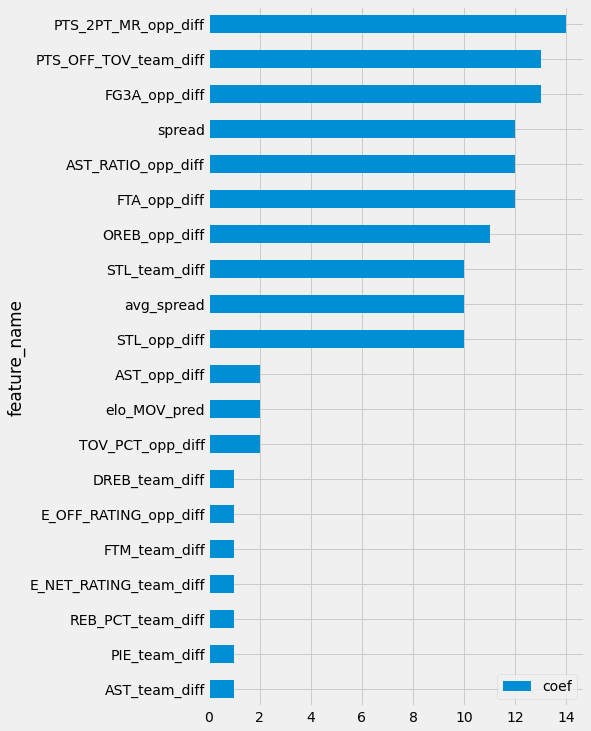

In [214]:
lgbc_params = study_lgbc.best_trial.params
lgbc_params['random_state'] = 23
best_lgbc = lgb.LGBMClassifier()
best_lgbc.set_params(**lgbc_params)
print("best_lgbc:", best_lgbc)

best_lgbc.fit(X_train, y_train)
lgbc_preds = best_lgbc.predict(X_test)


print("train_acc:", best_lgbc.score(X_train, y_train))
print("test_acc:", best_lgbc.score(X_test, y_test))
print("lgbc_f1_score:", f1_score(y_test, lgbc_preds))


view_model_coefs(best_lgbc, X_train)


In [155]:
X_test

,avg_ml,avg_spread,FG2M_team_diff,FG2A_team_diff,FG3M_team_diff,FG3A_team_diff,FTM_team_diff,FTA_team_diff,OREB_team_diff,DREB_team_diff,REB_team_diff,AST_team_diff,STL_team_diff,BLK_team_diff,TOV_team_diff,PF_team_diff,PTS_team_diff,PLUS_MINUS_team_diff,E_OFF_RATING_team_diff,E_DEF_RATING_team_diff,E_NET_RATING_team_diff,POSS_team_diff,PIE_team_diff,PTS_2PT_MR_team_diff,PTS_FB_team_diff,PTS_OFF_TOV_team_diff,PTS_PAINT_team_diff,AST_2PM_team_diff,UAST_2PM_team_diff,AST_3PM_team_diff,UAST_3PM_team_diff,team_covered_opp_diff,RECORD_opp_diff,FG2M_opp_diff,FG2A_opp_diff,FG3M_opp_diff,FG3A_opp_diff,FTM_opp_diff,FTA_opp_diff,OREB_opp_diff,DREB_opp_diff,REB_opp_diff,AST_opp_diff,STL_opp_diff,BLK_opp_diff,TOV_opp_diff,PF_opp_diff,PTS_opp_diff,PLUS_MINUS_opp_diff,E_OFF_RATING_opp_diff,E_DEF_RATING_opp_diff,E_NET_RATING_opp_diff,POSS_opp_diff,PIE_opp_diff,PTS_2PT_MR_opp_diff,PTS_FB_opp_diff,PTS_OFF_TOV_opp_diff,PTS_PAINT_opp_diff,AST_2PM_opp_diff,UAST_2PM_opp_diff,AST_3PM_opp_diff,UAST_3PM_opp_diff,WL_record_diff,ATS_record_diff,rest_diff,OREB_PCT_team_diff,OREB_PCT_opp_diff,DREB_PCT_team_diff,DREB_PCT_opp_diff,REB_PCT_team_diff,REB_PCT_opp_diff,TS_PCT_team_diff,TS_PCT_opp_diff,EFG_PCT_team_diff,EFG_PCT_opp_diff,AST_RATIO_team_diff,AST_RATIO_opp_diff,TOV_PCT_team_diff,TOV_PCT_opp_diff,team_elo_pred,team_rating_i,opp_rating_i,elo_MOV_pred,spread
41343,4.537879,5.300000,-4.370272,-9.159434,1.392860,6.027765,-2.848160,-4.961320,-3.119704,-2.607580,-5.727284,4.633123,0.228077,2.554321,-0.833362,-4.325902,-7.410124,-0.339332,-4.476858,-2.621316,-1.848924,-3.930478,0.006267,-1.062880,-8.994481,-4.108105,-7.459867,2.558717,-6.988547,1.548436,-0.399770,0.441992,0.244194,-3.058509,-3.451588,1.330419,2.789016,-4.945032,-6.617006,1.123562,2.415228,3.538790,1.991258,0.982931,-0.455447,0.372421,-1.422627,-7.070792,0.339332,-2.621316,-4.476858,1.848924,-4.212254,-0.006267,-8.477717,-5.639325,0.907841,2.784889,0.751899,-3.748407,1.602012,-0.069620,-0.200000,-0.400000,0.0,-0.060885,0.031148,-0.031148,0.060885,-0.049215,0.049215,-0.015341,-0.024365,-0.009584,-0.008298,5.112509,2.783285,-0.028742,0.699074,0.624653,1367.641445,1348.158936,0.70,-2.5
41347,2.985000,2.300000,-3.820004,-10.663134,1.329784,4.335181,-4.507021,-1.803131,-3.398086,0.024932,-3.373153,-2.961491,-1.093600,-0.675637,1.903739,0.106957,-8.157676,-3.267515,-6.494511,-0.765652,-5.791277,-3.429440,-0.021611,-6.176040,-4.702571,-2.122268,-1.325731,-3.442016,-0.397768,0.025372,1.047056,0.291837,0.113819,-0.870235,1.602745,-0.282386,-1.940954,-2.302532,-4.448878,2.331250,-2.338356,-0.007106,-1.771923,-1.207687,-0.628874,0.339601,-1.703035,-4.890161,3.267515,-0.765652,-6.494511,5.791277,-3.622598,0.021611,1.472223,-2.727577,3.322141,-3.528949,-0.419916,-0.509878,-0.976191,0.296012,-0.200000,-0.400000,-1.0,-0.054197,0.048151,-0.048151,0.054197,-0.019962,0.019962,-0.001488,-0.020436,0.017500,-0.014277,-2.421452,-1.103120,2.485768,0.583620,0.346742,1562.657290,1741.688630,-6.39,3.5
41349,4.670000,8.900000,-1.547703,1.920393,-1.496789,-1.490269,-0.993993,-1.945887,1.530195,-3.549584,-2.019389,-10.281141,0.433665,-1.684257,2.355742,4.086225,-8.579766,-12.844985,-8.608786,4.849720,-13.454087,-1.099851,-0.113808,1.821543,-2.970379,3.445239,-4.213426,-8.268565,6.454690,-2.514127,0.599766,-0.338233,0.435374,1.657884,-6.384630,-1.060169,0.731972,4.129960,3.606530,-1.415863,-1.051867,-2.467730,1.511416,-0.154892,-0.306268,1.833191,-0.803302,4.265219,12.844985,4.849720,-8.608786,13.454087,-1.718127,0.113808,-5.732925,-2.103221,5.705160,8.648458,2.318576,-0.726869,-0.873336,-0.164856,-0.400000,0.400000,1.0,0.033653,-0.002896,0.002896,-0.033653,0.002516,-0.002516,-0.046199,0.052352,-0.045822,0.033100,-9.801003,1.872131,1.805260,1.841028,0.105111,1312.093427,1753.142638,-15.75,11.5
41359,1.629115,-4.000000,1.665210,3.133916,-0.159727,-0.449220,-2.451613,-1.756880,-4.513199,-4.316940,-8.830138,3.226417,3.686748,0.625259,0.948304,2.486923,0.399624,-11.588411,-7.610356,4.379231,-11.943191,7.302337,-0.041537,3.

In [156]:
lgbc_probs = best_lgbc.predict_proba(X_test)

create_betting_df(home_games, lgbc_probs, test_idx)

,GAME_ID,MATCHUP,spread,team_score,point_diff,cover_home,prob,bet_home,bet_won,bankroll_i,bankroll_n,bet_size
0,21600075,NOP vs. PHX,-2.5,111,-1.0,0,0.507260,1,0,100.0,NaN,NaN
1,21600077,UTA vs. SAS,3.5,86,-14.0,0,0.502200,1,0,NaN,NaN,NaN
2,21600078,LAL vs. GSW,11.5,117,20.0,1,0.466535,0,0,NaN,NaN,NaN
3,21600083,IND vs. CHI,-3.5,111,17.0,1,0.512185,1,1,NaN,NaN,NaN
4,21600084,ATL vs. HOU,-3.0,112,15.0,1,0.493629,0,0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
5652,42000402,PHX vs. MIL,-4.5,118,10.0,1,0.511335,1,1,NaN,NaN,NaN
5653,42000403,MIL vs. PHX,-4.5,120,20.0,1,0.532561,1,1,NaN,NaN,NaN
5654,42000404,MIL vs. PHX,-4.5,109,6.0,1,0.533295,1,1,NaN,NaN,NaN
5655,42000405,PHX vs. MIL,-4.0,119,-4.0,0,0.505830,1,0,NaN,NaN,NaN


In [202]:
def objective(trial):    

    n_neighbors = trial.suggest_int('n_neighbors', 1, 52)
    
    classifier_obj = Pipeline(steps=[('scaler', StandardScaler()),
                ('knn',
                 KNeighborsClassifier(n_neighbors=n_neighbors))]) 
    
    score = cross_val_score(classifier_obj, X_train, y_train, n_jobs=-1,
                           cv=tscv, scoring='accuracy')
    
    
    score_avg = score.mean()
    
    return score_avg

study_name = 'study_knn_home_acc'
storage_name = "sqlite:///study_knn_home.db"

search_space = {'n_neighbors':np.arange(1, 51).tolist()}

study_knn = optuna.create_study(study_name = study_name, direction='maximize', 
                               storage = storage_name, load_if_exists=True,
                               sampler = optuna.samplers.GridSampler(search_space))

study_knn.optimize(objective)

[I 2021-09-13 17:09:00,638] A new study created in RDB with name: study_knn_home_acc
[I 2021-09-13 17:09:06,549] Trial 0 finished with value: 0.510173958882446 and parameters: {'n_neighbors': 44}. Best is trial 0 with value: 0.510173958882446.
[I 2021-09-13 17:09:12,441] Trial 1 finished with value: 0.5090142329994729 and parameters: {'n_neighbors': 43}. Best is trial 0 with value: 0.510173958882446.
[I 2021-09-13 17:09:18,121] Trial 2 finished with value: 0.5113336847654191 and parameters: {'n_neighbors': 23}. Best is trial 2 with value: 0.5113336847654191.
[I 2021-09-13 17:09:23,868] Trial 3 finished with value: 0.5054296257248287 and parameters: {'n_neighbors': 15}. Best is trial 2 with value: 0.5113336847654191.
[I 2021-09-13 17:09:29,687] Trial 4 finished with value: 0.511439114391144 and parameters: {'n_neighbors': 24}. Best is trial 4 with value: 0.511439114391144.
[I 2021-09-13 17:09:35,495] Trial 5 finished with value: 0.502793885081708 and parameters: {'n_neighbors': 1}. Best

[I 2021-09-13 17:13:43,160] Trial 47 finished with value: 0.5146020031628887 and parameters: {'n_neighbors': 40}. Best is trial 47 with value: 0.5146020031628887.
[I 2021-09-13 17:13:48,909] Trial 48 finished with value: 0.5016341591987349 and parameters: {'n_neighbors': 4}. Best is trial 47 with value: 0.5146020031628887.
[I 2021-09-13 17:13:54,551] Trial 49 finished with value: 0.5042698998418557 and parameters: {'n_neighbors': 2}. Best is trial 47 with value: 0.5146020031628887.


In [217]:

best_knn = Pipeline(steps=[('scaler', StandardScaler()),
                ('knn', KNeighborsClassifier(n_neighbors=40))])

best_knn.fit(X_train, y_train)
knn_preds = best_knn.predict(X_test)
print(best_knn.score(X_train, y_train))
print(best_knn.score(X_test, y_test))
print("f1_score:", f1_score(knn_preds, y_test))

0.5638998682476943
0.505391550291674
f1_score: 0.4401760704281713


In [203]:
def objective(trial):    
    min_samples_split = trial.suggest_float('min_samples_split', 0.01, 0.5)
#     subsample = trial.suggest_float('subsample', 0.6, 1)
    max_depth = trial.suggest_int('max_depth', 3, 32)
    min_samples_leaf = trial.suggest_float('min_samples_leaf', 0.01, 0.5)

    classifier_obj = RandomForestClassifier(max_depth=max_depth, min_samples_leaf=min_samples_leaf,
                       min_samples_split=min_samples_split, random_state=23)
    
    score = cross_val_score(classifier_obj, X_train, y_train, n_jobs=-1,
                           cv=tscv, scoring='accuracy')
    
    
    score_avg = score.mean()
    
    return score_avg

study_name = 'study_rf_home_acc'
storage_name = "sqlite:///study_rf_home.db".format(study_name)

study_rf = optuna.create_study(study_name = study_name, direction='maximize', 
                               storage = storage_name, load_if_exists=True)

study_rf.optimize(objective, n_trials=250)

[I 2021-09-13 17:13:54,699] A new study created in RDB with name: study_rf_home_acc
[I 2021-09-13 17:13:56,296] Trial 0 finished with value: 0.5166051660516605 and parameters: {'min_samples_split': 0.327037224745785, 'max_depth': 24, 'min_samples_leaf': 0.1501555539835762}. Best is trial 0 with value: 0.5166051660516605.
[I 2021-09-13 17:13:57,085] Trial 1 finished with value: 0.5096468107538218 and parameters: {'min_samples_split': 0.3140770769220881, 'max_depth': 19, 'min_samples_leaf': 0.4341983414217055}. Best is trial 0 with value: 0.5166051660516605.
[I 2021-09-13 17:13:57,732] Trial 2 finished with value: 0.5096468107538218 and parameters: {'min_samples_split': 0.42021509273107344, 'max_depth': 31, 'min_samples_leaf': 0.4554769561706634}. Best is trial 0 with value: 0.5166051660516605.
[I 2021-09-13 17:13:59,341] Trial 3 finished with value: 0.5144965735371639 and parameters: {'min_samples_split': 0.44108266607207713, 'max_depth': 30, 'min_samples_leaf': 0.06284402907731236}. Be

[I 2021-09-13 17:14:49,817] Trial 32 finished with value: 0.5155508697944123 and parameters: {'min_samples_split': 0.11249197942937199, 'max_depth': 9, 'min_samples_leaf': 0.050710650822131914}. Best is trial 12 with value: 0.5205060622034792.
[I 2021-09-13 17:14:51,557] Trial 33 finished with value: 0.5151291512915129 and parameters: {'min_samples_split': 0.17519701156180362, 'max_depth': 19, 'min_samples_leaf': 0.12865906097776286}. Best is trial 12 with value: 0.5205060622034792.
[I 2021-09-13 17:14:53,831] Trial 34 finished with value: 0.5191354770690564 and parameters: {'min_samples_split': 0.04262316376116601, 'max_depth': 11, 'min_samples_leaf': 0.07645620046530906}. Best is trial 12 with value: 0.5205060622034792.
[I 2021-09-13 17:14:56,117] Trial 35 finished with value: 0.5176594623089088 and parameters: {'min_samples_split': 0.0326448395568269, 'max_depth': 8, 'min_samples_leaf': 0.07887418791982778}. Best is trial 12 with value: 0.5205060622034792.
[I 2021-09-13 17:14:59,158

[I 2021-09-13 17:16:05,426] Trial 64 finished with value: 0.51375856615709 and parameters: {'min_samples_split': 0.26905918910614324, 'max_depth': 15, 'min_samples_leaf': 0.05781041503837322}. Best is trial 12 with value: 0.5205060622034792.
[I 2021-09-13 17:16:08,379] Trial 65 finished with value: 0.5169214549288349 and parameters: {'min_samples_split': 0.23801059948720213, 'max_depth': 16, 'min_samples_leaf': 0.010332408597515242}. Best is trial 12 with value: 0.5205060622034792.
[I 2021-09-13 17:16:11,137] Trial 66 finished with value: 0.5149182920400632 and parameters: {'min_samples_split': 0.13797952410419126, 'max_depth': 12, 'min_samples_leaf': 0.04458891283789279}. Best is trial 12 with value: 0.5205060622034792.
[I 2021-09-13 17:16:11,787] Trial 67 finished with value: 0.5096468107538218 and parameters: {'min_samples_split': 0.18228373654205496, 'max_depth': 18, 'min_samples_leaf': 0.33268878969871457}. Best is trial 12 with value: 0.5205060622034792.
[I 2021-09-13 17:16:14,19

[I 2021-09-13 17:17:33,660] Trial 96 finished with value: 0.5191354770690564 and parameters: {'min_samples_split': 0.08080718923949802, 'max_depth': 13, 'min_samples_leaf': 0.020255519174608917}. Best is trial 78 with value: 0.5209277807063785.
[I 2021-09-13 17:17:36,722] Trial 97 finished with value: 0.5207169214549289 and parameters: {'min_samples_split': 0.08376352522023191, 'max_depth': 29, 'min_samples_leaf': 0.04385331215485842}. Best is trial 78 with value: 0.5209277807063785.
[I 2021-09-13 17:17:39,795] Trial 98 finished with value: 0.5140748550342646 and parameters: {'min_samples_split': 0.08500859474536168, 'max_depth': 23, 'min_samples_leaf': 0.04694258065108399}. Best is trial 78 with value: 0.5209277807063785.
[I 2021-09-13 17:17:42,125] Trial 99 finished with value: 0.5187137585661571 and parameters: {'min_samples_split': 0.04370078310554293, 'max_depth': 27, 'min_samples_leaf': 0.07578052140478816}. Best is trial 78 with value: 0.5209277807063785.
[I 2021-09-13 17:17:44,

[I 2021-09-13 17:19:15,817] Trial 128 finished with value: 0.5185028993147074 and parameters: {'min_samples_split': 0.11735948063323032, 'max_depth': 31, 'min_samples_leaf': 0.024062436638572916}. Best is trial 111 with value: 0.5232472324723247.
[I 2021-09-13 17:19:18,653] Trial 129 finished with value: 0.5131259884027413 and parameters: {'min_samples_split': 0.09275574329399461, 'max_depth': 28, 'min_samples_leaf': 0.049483244231338215}. Best is trial 111 with value: 0.5232472324723247.
[I 2021-09-13 17:19:21,827] Trial 130 finished with value: 0.5185028993147075 and parameters: {'min_samples_split': 0.1322332777656166, 'max_depth': 31, 'min_samples_leaf': 0.020581421744523078}. Best is trial 111 with value: 0.5232472324723247.
[I 2021-09-13 17:19:25,116] Trial 131 finished with value: 0.5241960991038481 and parameters: {'min_samples_split': 0.0556059443266572, 'max_depth': 26, 'min_samples_leaf': 0.0335788530094404}. Best is trial 131 with value: 0.5241960991038481.
[I 2021-09-13 17

[I 2021-09-13 17:20:49,355] Trial 160 finished with value: 0.5132314180284661 and parameters: {'min_samples_split': 0.21359223339301475, 'max_depth': 29, 'min_samples_leaf': 0.047604953133415534}. Best is trial 131 with value: 0.5241960991038481.
[I 2021-09-13 17:20:52,681] Trial 161 finished with value: 0.5164997364259356 and parameters: {'min_samples_split': 0.11733953239442195, 'max_depth': 15, 'min_samples_leaf': 0.019178717788309395}. Best is trial 131 with value: 0.5241960991038481.
[I 2021-09-13 17:20:55,841] Trial 162 finished with value: 0.5177648919346336 and parameters: {'min_samples_split': 0.10571049595405804, 'max_depth': 17, 'min_samples_leaf': 0.02868291829559423}. Best is trial 131 with value: 0.5241960991038481.
[I 2021-09-13 17:20:59,890] Trial 163 finished with value: 0.5189246178176068 and parameters: {'min_samples_split': 0.09264209669389648, 'max_depth': 31, 'min_samples_leaf': 0.010530218880857641}. Best is trial 131 with value: 0.5241960991038481.
[I 2021-09-13

[I 2021-09-13 17:22:30,183] Trial 192 finished with value: 0.5190300474433316 and parameters: {'min_samples_split': 0.026951596198999155, 'max_depth': 25, 'min_samples_leaf': 0.028671805003742713}. Best is trial 183 with value: 0.5248286768581971.
[I 2021-09-13 17:22:33,652] Trial 193 finished with value: 0.5216657880864524 and parameters: {'min_samples_split': 0.03659892006301889, 'max_depth': 26, 'min_samples_leaf': 0.030971966651856593}. Best is trial 183 with value: 0.5248286768581971.
[I 2021-09-13 17:22:37,188] Trial 194 finished with value: 0.5229309435951502 and parameters: {'min_samples_split': 0.0390356206783134, 'max_depth': 26, 'min_samples_leaf': 0.035467997831264565}. Best is trial 183 with value: 0.5248286768581971.
[I 2021-09-13 17:22:40,498] Trial 195 finished with value: 0.5227200843437005 and parameters: {'min_samples_split': 0.037965996212782294, 'max_depth': 26, 'min_samples_leaf': 0.03543064753205673}. Best is trial 183 with value: 0.5248286768581971.
[I 2021-09-1

[I 2021-09-13 17:24:13,251] Trial 224 finished with value: 0.5151291512915129 and parameters: {'min_samples_split': 0.06498371859551008, 'max_depth': 26, 'min_samples_leaf': 0.04610338479620896}. Best is trial 218 with value: 0.5250395361096467.
[I 2021-09-13 17:24:17,109] Trial 225 finished with value: 0.514496573537164 and parameters: {'min_samples_split': 0.026500881027310942, 'max_depth': 25, 'min_samples_leaf': 0.022385098036213934}. Best is trial 218 with value: 0.5250395361096467.
[I 2021-09-13 17:24:21,190] Trial 226 finished with value: 0.5188191881918819 and parameters: {'min_samples_split': 0.03511426992530174, 'max_depth': 26, 'min_samples_leaf': 0.018609248261688062}. Best is trial 218 with value: 0.5250395361096467.
[I 2021-09-13 17:24:24,366] Trial 227 finished with value: 0.5199789140748551 and parameters: {'min_samples_split': 0.05215693985189187, 'max_depth': 27, 'min_samples_leaf': 0.03624584749845095}. Best is trial 218 with value: 0.5250395361096467.
[I 2021-09-13 

In [218]:
best_rf = RandomForestClassifier(random_state=23)

best_rf.set_params(**study_rf.best_params)
print(best_rf)
   
best_rf.fit(X_train, y_train)
rf_preds = best_rf.predict(X_test)

print("rf train_acc:", best_rf.score(X_train, y_train))
print("rf test_acc:", best_rf.score(X_test, y_test))
print("rf f1_score:", f1_score(y_test, rf_preds) )

RandomForestClassifier(max_depth=26, min_samples_leaf=0.027277490198880903,
                       min_samples_split=0.06694607157548488, random_state=23)
rf train_acc: 0.5884057971014492
rf test_acc: 0.5085734488244653
rf f1_score: 0.41374947279628854


LGBoost or XGBoost


,feature_name,coef
64,rest_diff,0.000688
53,PIE_opp_diff,0.003345
34,FG2A_opp_diff,0.003384
20,E_NET_RATING_team_diff,0.003626
70,REB_PCT_opp_diff,0.003777
51,E_NET_RATING_opp_diff,0.003993
52,POSS_opp_diff,0.004166
18,E_OFF_RATING_team_diff,0.004800
62,WL_record_diff,0.005267
7,FTA_team_diff,0.005615


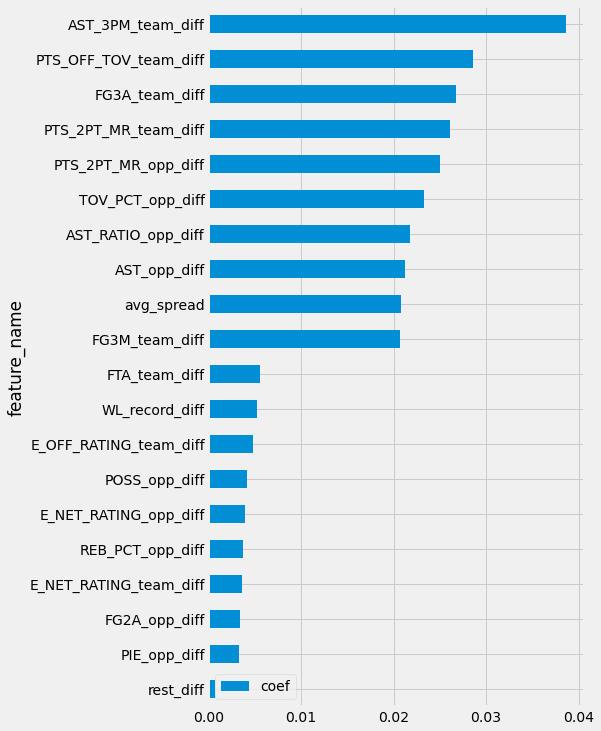

In [219]:
view_model_coefs(best_rf, X_train)

## Stacked Classifier

In [543]:
best_sgd_log = Pipeline(steps=[('scaler', StandardScaler()),
                ('sgd',
                 SGDClassifier(alpha=0.005565330778427646, loss='log',
                               max_iter=10000, random_state=23))])

best_log_reg = Pipeline(steps=[('scaler', StandardScaler()),
                ('logreg',
                 LogisticRegression(C=0.0013219411484660314, max_iter=10000,
                                    verbose=1))])

best_svc = Pipeline(steps=[('scaler', StandardScaler()),
                ('svc',
                 LinearSVC(C=0.009111627561154887, loss='hinge',
                           max_iter=100000, random_state=23))])

# best_svc_rbf = Pipeline(steps=[('scaler', StandardScaler()),
#                 ('svc',
#                  SVC(C=0.2682695795279722, probability=True, random_state=23))])

best_svc_rbf = Pipeline(steps=[('scaler', StandardScaler()),
                ('svc',
                 SVC(C=0.29150530628251786, probability=True,
                     random_state=23))])


best_sgd_huber = Pipeline(steps=[('scaler', StandardScaler()),
                ('sgd',
                 SGDClassifier(alpha=0.435791301239703, loss='modified_huber',
                               max_iter=10000, random_state=23))])


best_lgbc = lgb.LGBMClassifier(feature_fraction=0.8520479372283939, max_depth=3,
               min_child_weight=16, num_leaves=263, objective='binary',
               reg_alpha=0.04520353656360243, reg_lambda=10,
               subsample=0.9375978643394407, subsample_freq=1)

best_rf = RandomForestClassifier(max_depth=9, min_samples_leaf=0.01,
                       min_samples_split=0.04789473684210526, random_state=23)

best_knn = Pipeline(steps=[('scaler', StandardScaler()),
                ('knn', KNeighborsClassifier(n_neighbors=41))])



estimators = [('log', best_log_reg), ('sgd_huber', best_sgd_huber),
              ('svc', best_svc), ('lgbc', best_lgbc), 
              ('rf', best_rf), ('knn', best_knn)]


stacked_clf = StackingClassifier(estimators = estimators, final_estimator = LogisticRegression(),
                                 n_jobs=-1, verbose=1)


stacked_clf.fit(X_train, y_train)


print("stacked clf train_acc:", stacked_clf.score(X_train, y_train))
print("stacked clf test_acc:", stacked_clf.score(X_test, y_test))

stacked clf train_acc: 0.5408028812368236
stacked clf test_acc: 0.4990356798457088


0
test set 1: 2016-11-04 - 2017-06-12


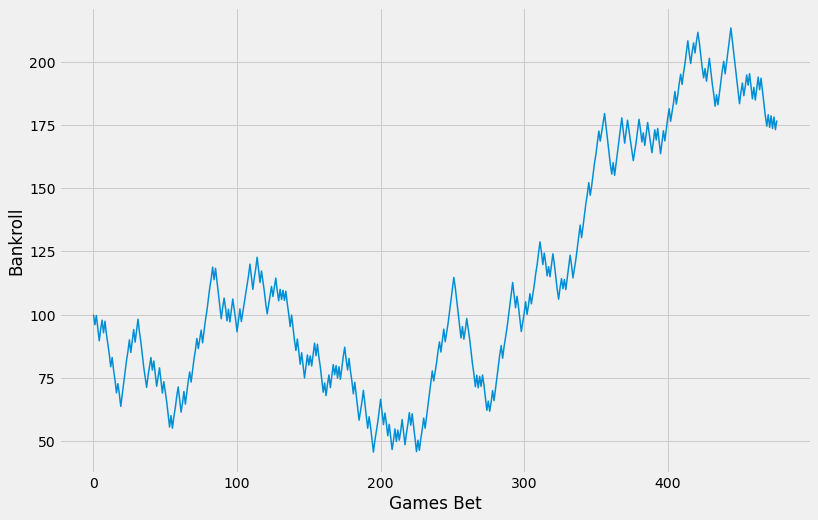

min balance: 45.545454545454746 
max balance: 213.5454545454541 
final balance: 172.9090909090903 
win percentage 54.09 
profit: 72.90909090909076 risk: 2218.0 
ROI: 3.29
1
test set 1: 2017-10-28 - 2018-06-08


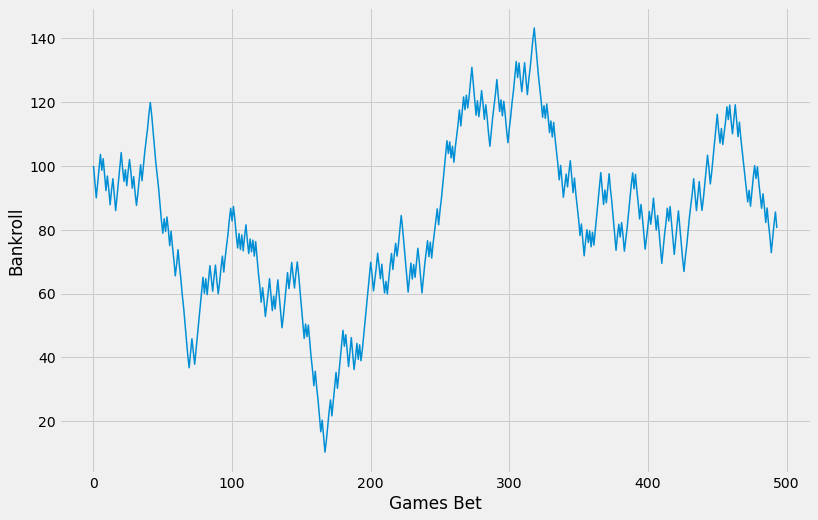

min balance: 10.272727272727384 
max balance: 143.27272727272745 
final balance: 76.5454545454549 
win percentage 51.62 
profit: -23.454545454545496 risk: 2301.0 
ROI: -1.02
2
test set 1: 2018-10-26 - 2019-06-13


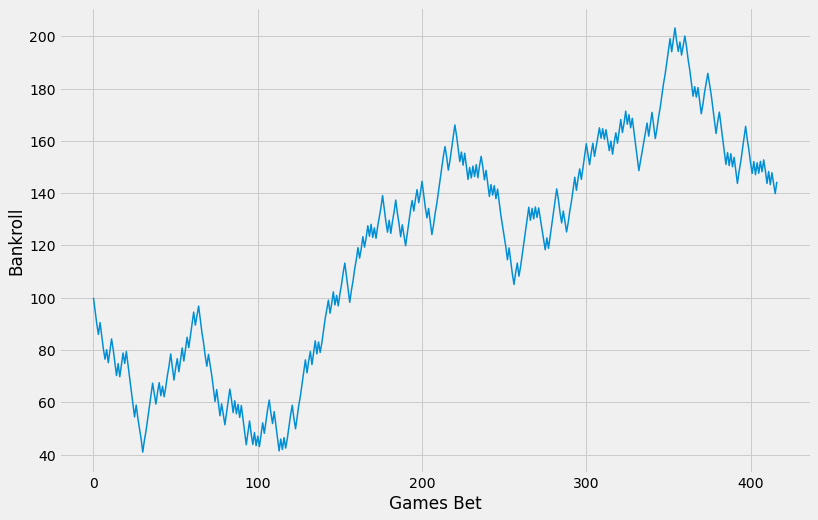

min balance: 41.000000000000014 
max balance: 203.1818181818173 
final balance: 147.9999999999988 
win percentage 53.480000000000004 
profit: 47.999999999999886 risk: 1926.0 
ROI: 2.4899999999999998
3
test set 1: 2019-11-01 - 2020-10-11


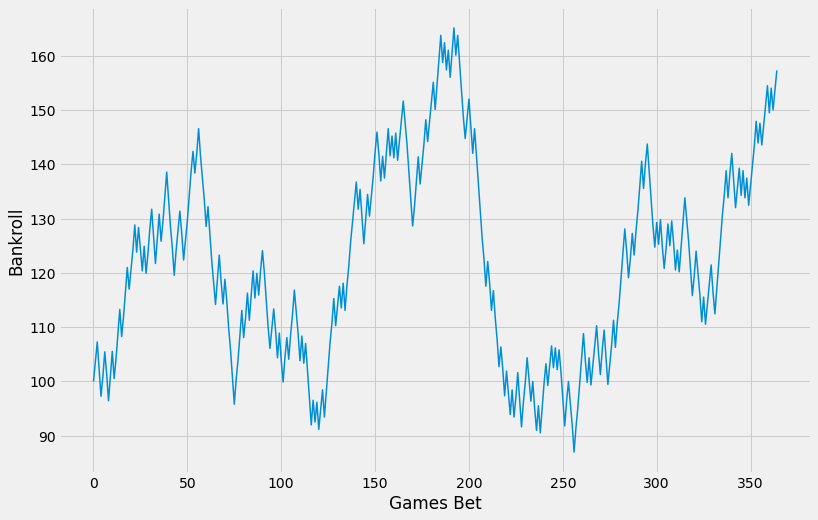

min balance: 86.99999999999962 
max balance: 165.0909090909087 
final balance: 160.90909090909028 
win percentage 54.790000000000006 
profit: 60.90909090909088 risk: 1663.0 
ROI: 3.66
4
test set 1: 2021-01-01 - 2021-07-20


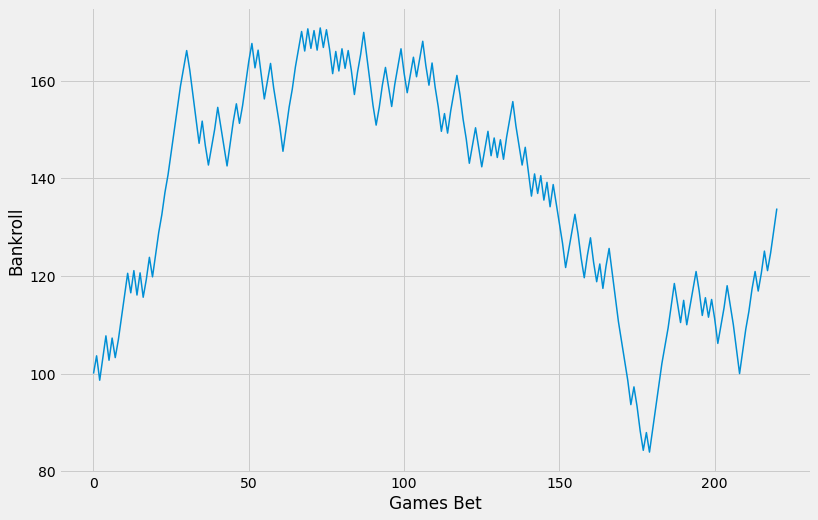

min balance: 83.90909090909018 
max balance: 170.81818181818147 
final balance: 138.36363636363566 
win percentage 54.300000000000004 
profit: 38.36363636363632 risk: 983.0 
ROI: 3.9

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('logreg',
                                                 LogisticRegression(C=0.0013219411484660314,
                                                                    max_iter=10000,
                                                                    verbose=1))])),
                               ('sgd_huber',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('sgd',
                                                 SGDClassifier(alpha=0.435791301239703,
                                                               loss='modified_huber',
                         

,season,best_threshold,win_pcts,num_games_bet,rois,profits
0,"(2016, -, 2017)",0.53,0.540881,477,0.032872,72.909091
1,"(2017, -, 2018)",0.53,0.516194,494,-0.010193,-23.454545
2,"(2018, -, 2019)",0.53,0.534772,417,0.024922,48.000000
3,"(2019, -, 2020)",0.53,0.547945,365,0.036626,60.909091
4,"(2021, -, 2021)",0.53,0.542986,221,0.039027,38.363636


In [544]:
cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21]

threshold = 0.53

for estimator in [stacked_clf]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test, y_train1, y_test, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='D'))

        year = (np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='Y'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='Y'))


        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(df_ewm_19_diffs, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob_avg'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_3(select_bets)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)
    print(results_by_season)

results_by_season

In [221]:
# Accuracy Model Metrics

stacked clf train_acc: 0.5575757575757576
stacked clf test_acc: 0.5115785752165459
stacked clf f1_score 0.4574906734733949
0
test set 1: 2016-11-04 - 2017-06-12


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 19 epochs took 0 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished


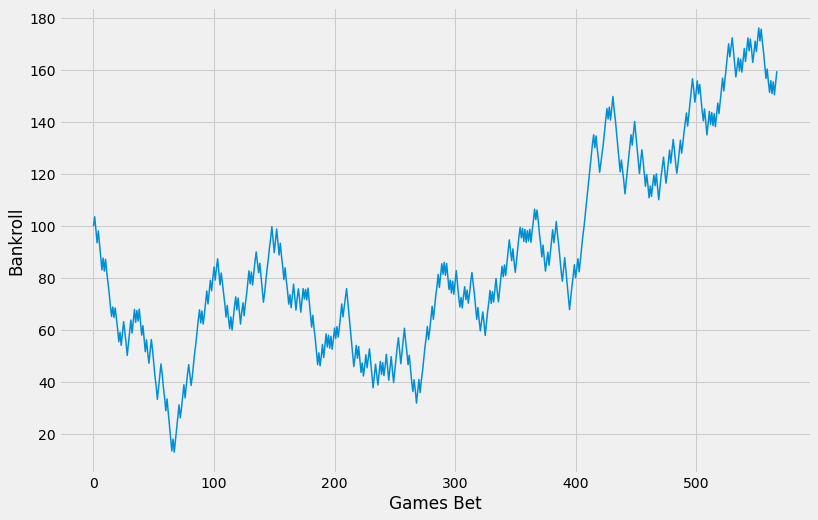

min balance: 13.090909090909115 
max balance: 176.27272727272688 
final balance: 154.63636363636317 
win percentage 53.349999999999994 
profit: 54.63636363636351 risk: 2683.0 
ROI: 2.04
1
test set 1: 2017-10-28 - 2018-06-08


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 18 epochs took 0 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished


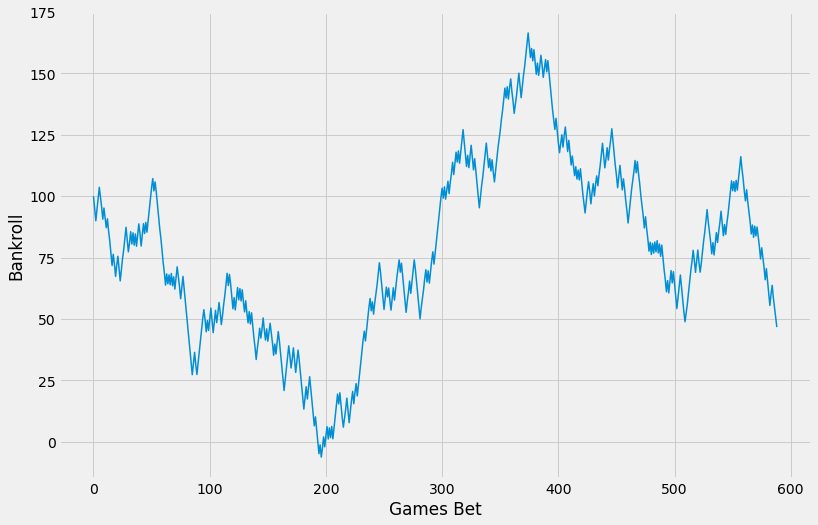

min balance: -6.1818181818180875 
max balance: 166.4545454545454 
final balance: 42.72727272727274 
win percentage 51.1 
profit: -57.27272727272748 risk: 2772.0 
ROI: -2.07
2
test set 1: 2018-10-26 - 2019-06-13


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 20 epochs took 0 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s finished


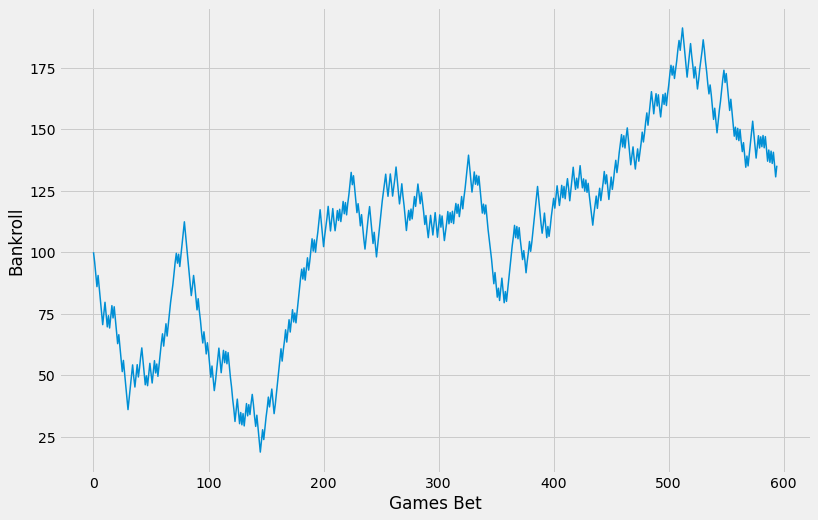

min balance: 18.727272727272805 
max balance: 191.18181818181782 
final balance: 130.18181818181736 
win percentage 53.11 
profit: 30.181818181818016 risk: 2801.0 
ROI: 1.08
3
test set 1: 2019-11-01 - 2020-10-11


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 22 epochs took 0 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished


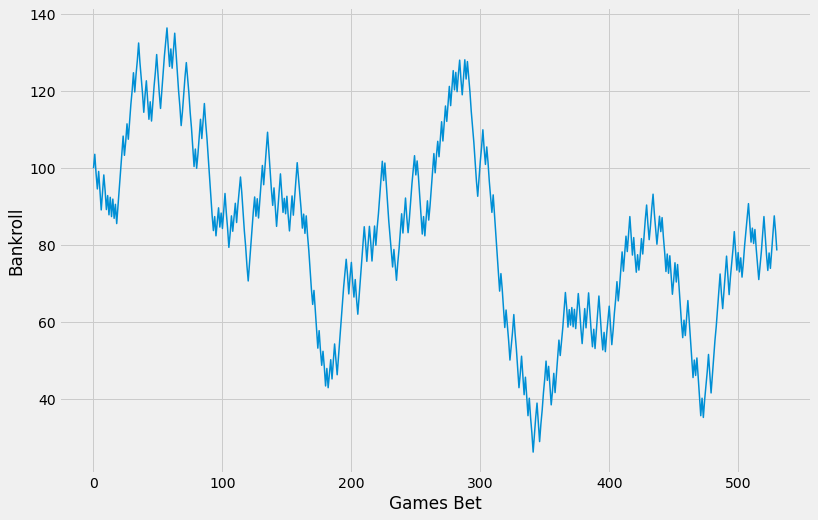

min balance: 26.27272727272743 
max balance: 136.45454545454544 
final balance: 83.18181818181846 
win percentage 51.790000000000006 
profit: -16.818181818181984 risk: 2491.0 
ROI: -0.6799999999999999
4
test set 1: 2021-01-01 - 2021-07-20


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 21 epochs took 0 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished


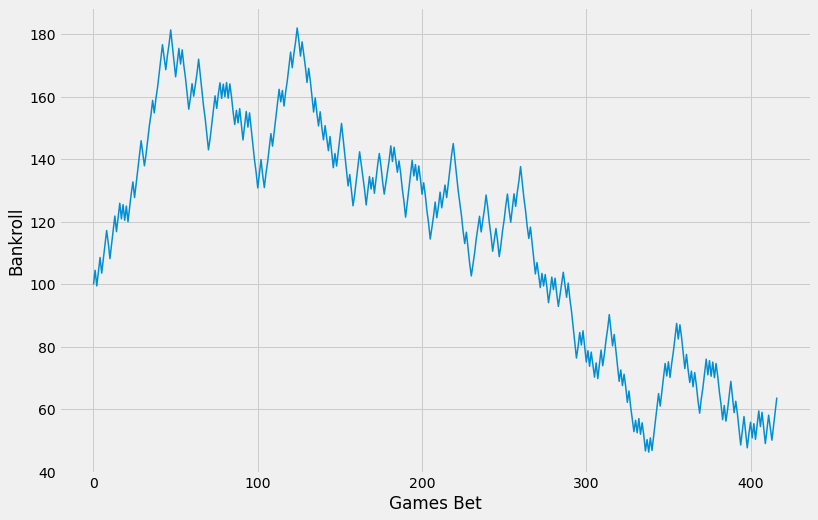

min balance: 46.36363636363526 
max balance: 182.09090909090838 
final balance: 68.3636363636353 
win percentage 51.080000000000005 
profit: -31.63636363636374 risk: 1935.0 
ROI: -1.63

 Pipeline(steps=[('scaler', StandardScaler()),
                ('logreg',
                 LogisticRegression(C=0.0017529526386885924, max_iter=10000,
                                    random_state=23, solver='saga',
                                    verbose=1))])
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2016, -, 2017)            0.53  0.533451            568  0.020364   
1  (2017, -, 2018)            0.53  0.511036            589 -0.020661   
2  (2018, -, 2019)            0.53  0.531092            595  0.010775   
3  (2019, -, 2020)            0.53  0.517891            531 -0.006752   
4  (2021, -, 2021)            0.53  0.510791            417 -0.016350   

     profits  
0  54.636364  
1 -57.272727  
2  30.181818  
3 -16.818182  
4 -31.636364  
0
test set 1: 20

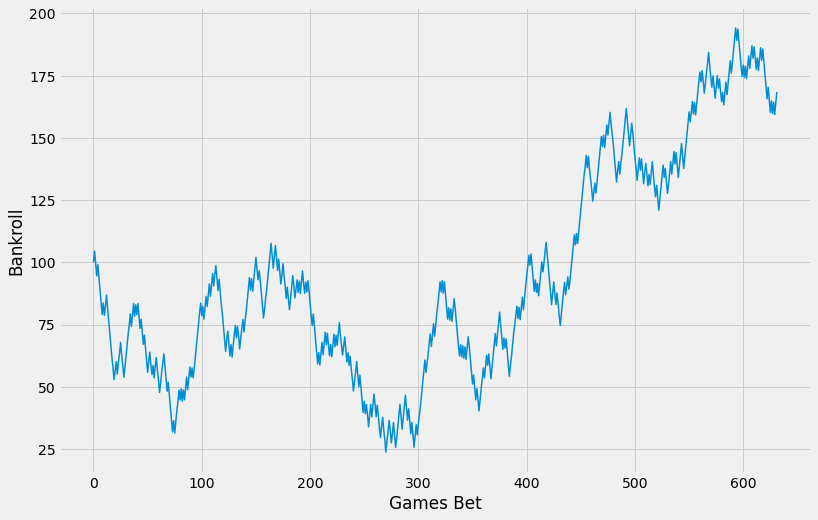

min balance: 23.727272727272847 
max balance: 194.18181818181745 
final balance: 163.4545454545445 
win percentage 53.480000000000004 
profit: 63.45454545454527 risk: 3014.0 
ROI: 2.11
1
test set 1: 2017-10-28 - 2018-06-08


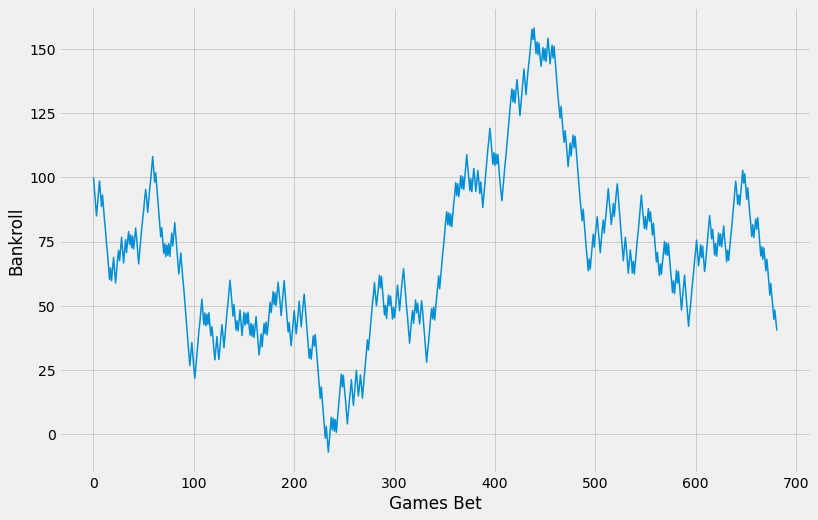

min balance: -7.181818181818068 
max balance: 158.36363636363635 
final balance: 36.272727272727316 
win percentage 51.32 
profit: -63.72727272727275 risk: 3250.0 
ROI: -1.96
2
test set 1: 2018-10-26 - 2019-06-13


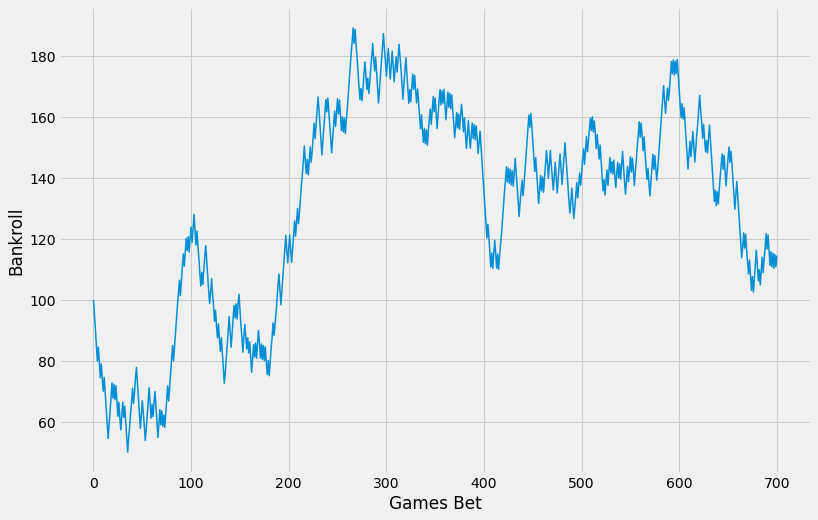

min balance: 50.1818181818182 
max balance: 189.09090909090878 
final balance: 110.54545454545196 
win percentage 52.349999999999994 
profit: 10.545454545454504 risk: 3338.0 
ROI: 0.32
3
test set 1: 2019-11-01 - 2020-10-11


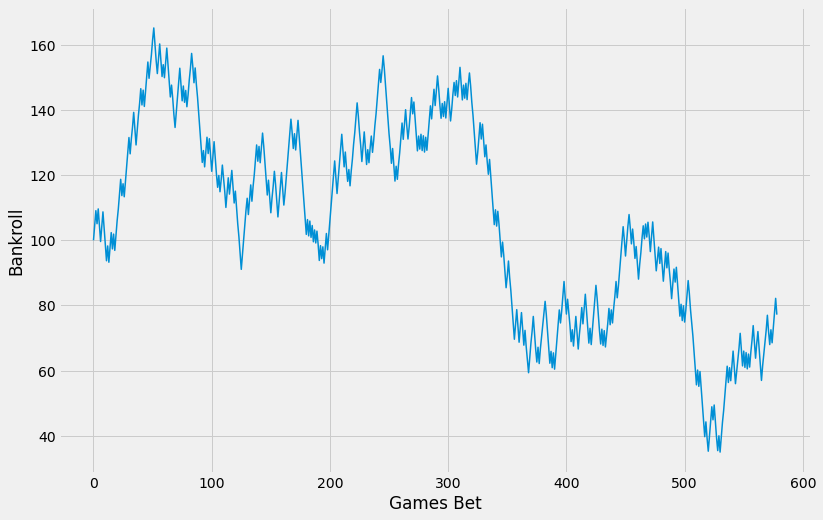

min balance: 34.99999999999913 
max balance: 165.18181818181802 
final balance: 80.81818181818099 
win percentage 51.99 
profit: -19.181818181818244 risk: 2753.0 
ROI: -0.7000000000000001
4
test set 1: 2021-01-01 - 2021-07-20


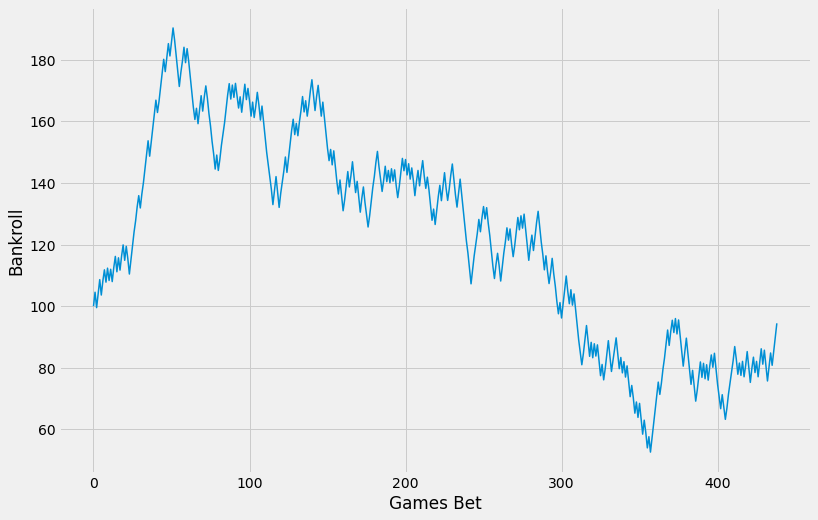

min balance: 52.6363636363624 
max balance: 190.36363636363618 
final balance: 98.99999999999885 
win percentage 52.62 
profit: -1.0000000000001137 risk: 2038.0 
ROI: -0.05

 Pipeline(steps=[('scaler', StandardScaler()),
                ('sgd',
                 SGDClassifier(alpha=0.17617800797124716, loss='modified_huber',
                               max_iter=10000, random_state=23))])
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2016, -, 2017)            0.53  0.534810            632  0.021053   
1  (2017, -, 2018)            0.53  0.513196            682 -0.019608   
2  (2018, -, 2019)            0.53  0.523538            701  0.003159   
3  (2019, -, 2020)            0.53  0.519862            579 -0.006968   
4  (2021, -, 2021)            0.53  0.526196            439 -0.000491   

     profits  
0  63.454545  
1 -63.727273  
2  10.545455  
3 -19.181818  
4  -1.000000  
0
test set 1: 2016-11-04 - 2017-06-12


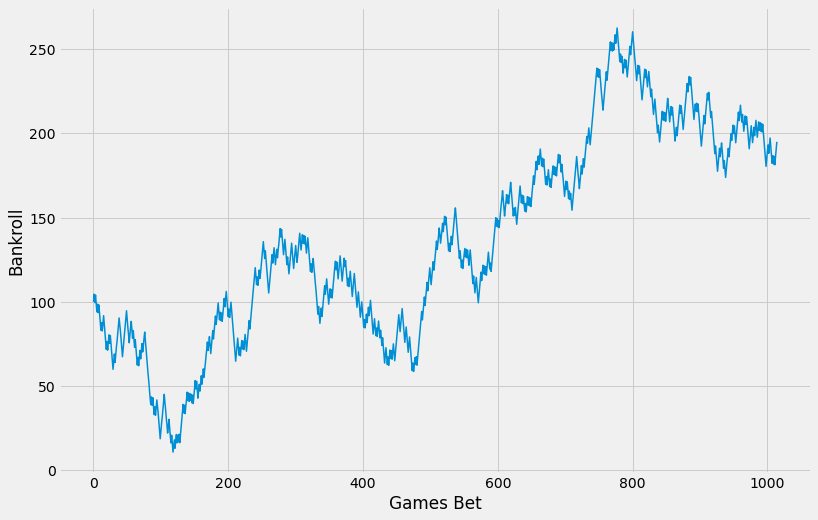

min balance: 10.909090909090978 
max balance: 262.45454545454396 
final balance: 189.90909090908792 
win percentage 53.400000000000006 
profit: 89.90909090909054 risk: 4994.0 
ROI: 1.7999999999999998
1
test set 1: 2017-10-28 - 2018-06-08


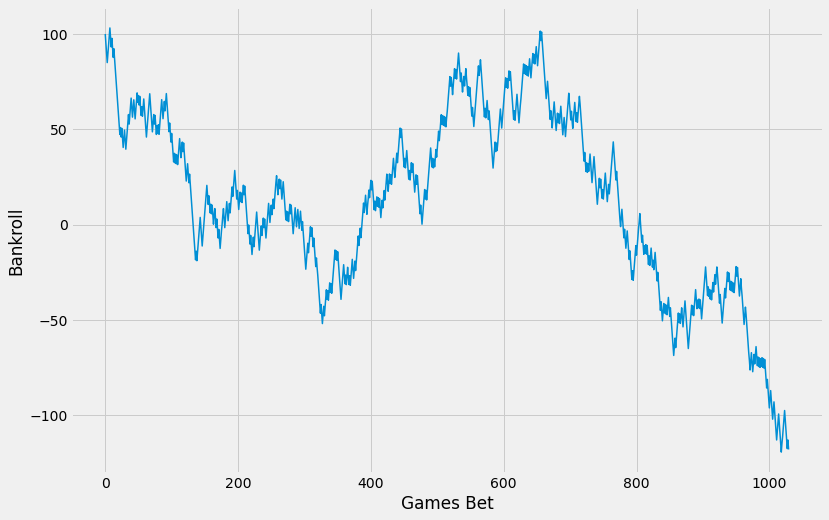

min balance: -123.0909090909087 
max balance: 103.18181818181819 
final balance: -123.0909090909087 
win percentage 50.1 
profit: -223.09090909090946 risk: 5097.0 
ROI: -4.38
2
test set 1: 2018-10-26 - 2019-06-13


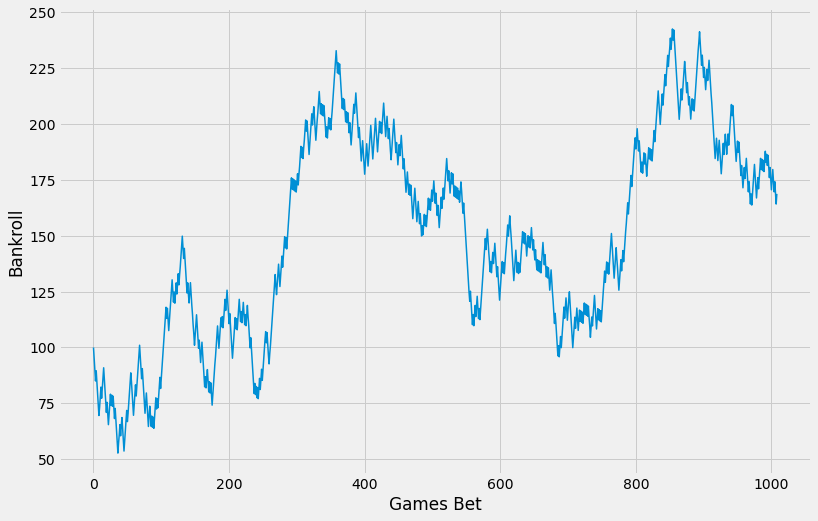

min balance: 52.72727272727275 
max balance: 242.54545454545124 
final balance: 163.72727272726848 
win percentage 53.02 
profit: 63.72727272727252 risk: 4982.0 
ROI: 1.28
3
test set 1: 2019-11-01 - 2020-10-11


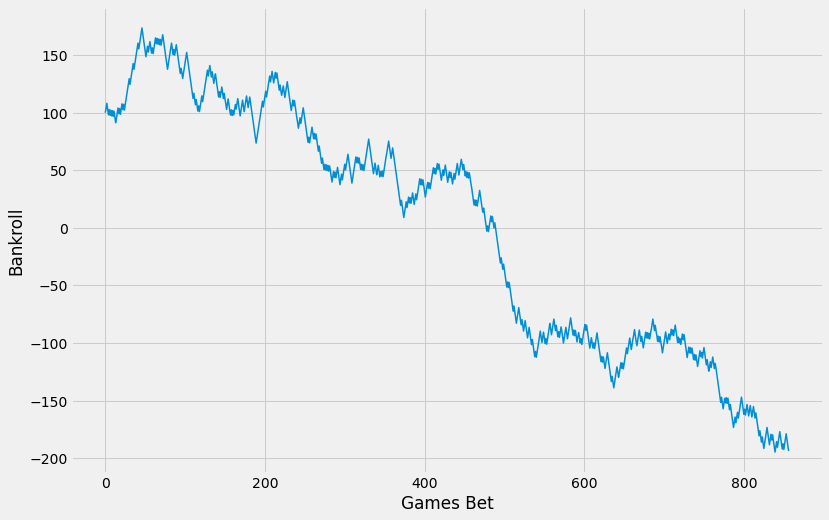

min balance: -194.72727272727346 
max balance: 173.63636363636348 
final balance: -189.27272727272813 
win percentage 48.77 
profit: -289.2727272727275 risk: 4243.0 
ROI: -6.819999999999999
4
test set 1: 2021-01-01 - 2021-07-20


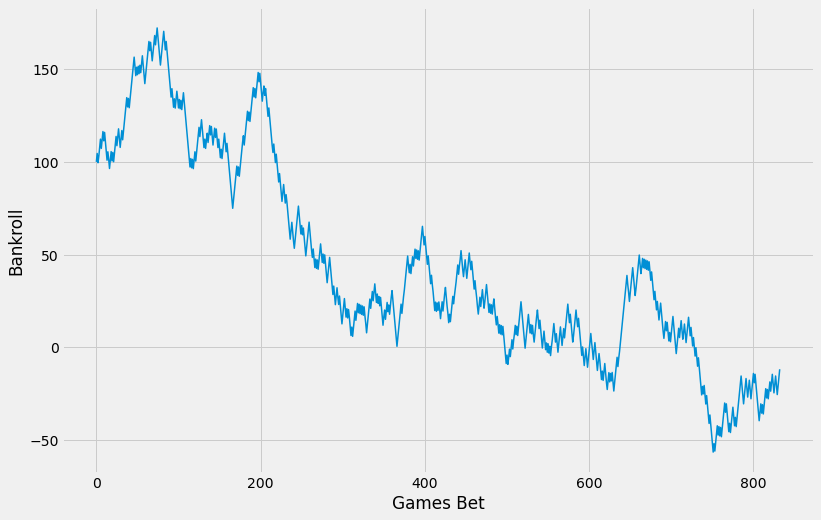

min balance: -56.36363636363679 
max balance: 172.1818181818179 
final balance: -7.181818181818553 
win percentage 50.9 
profit: -107.18181818181824 risk: 4101.0 
ROI: -2.6100000000000003

 Pipeline(steps=[('scaler', StandardScaler()),
                ('svc',
                 LinearSVC(C=0.005271998110254904, loss='hinge',
                           max_iter=100000, random_state=23))])
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2016, -, 2017)            0.53  0.533990           1015  0.018003   
1  (2017, -, 2018)            0.53  0.500971           1030 -0.043769   
2  (2018, -, 2019)            0.53  0.530228           1009  0.012792   
3  (2019, -, 2020)            0.53  0.487748            857 -0.068176   
4  (2021, -, 2021)            0.53  0.509004            833 -0.026136   

      profits  
0   89.909091  
1 -223.090909  
2   63.727273  
3 -289.272727  
4 -107.181818  
0
test set 1: 2016-11-04 - 2017-06-12
[LightGBM] [Warning] feature_fraction 

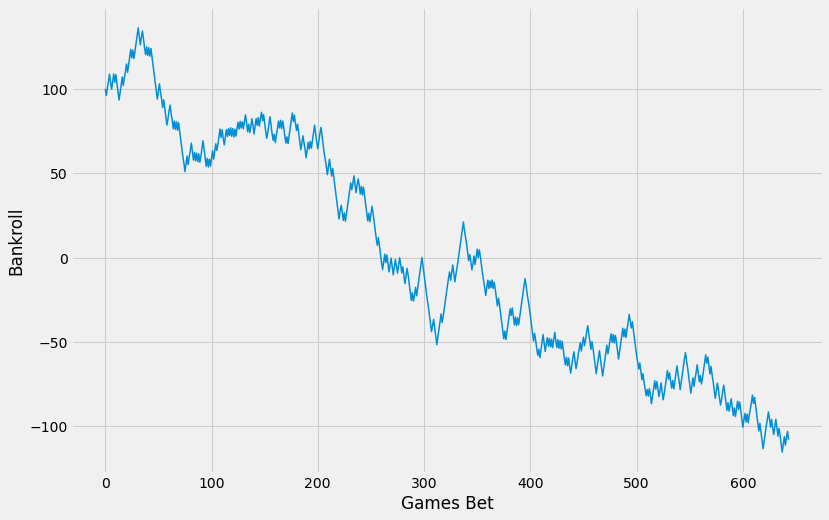

min balance: -115.27272727272704 
max balance: 136.0909090909091 
final balance: -104.36363636363612 
win percentage 48.76 
profit: -204.3636363636365 risk: 3068.0 
ROI: -6.660000000000001
1
test set 1: 2017-10-28 - 2018-06-08
[LightGBM] [Warning] feature_fraction is set=0.9757861180052461, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9757861180052461


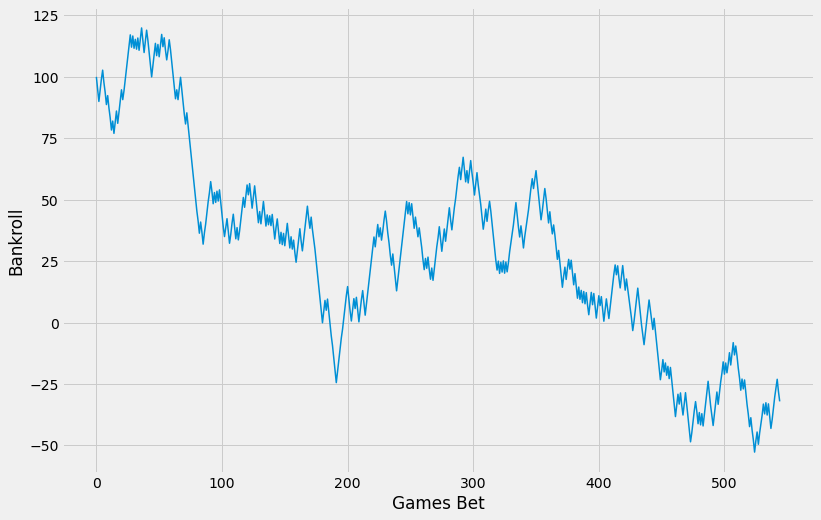

min balance: -52.727272727272656 
max balance: 119.90909090909095 
final balance: -28.454545454545386 
win percentage 49.54 
profit: -128.4545454545455 risk: 2574.0 
ROI: -4.99
2
test set 1: 2018-10-26 - 2019-06-13
[LightGBM] [Warning] feature_fraction is set=0.9757861180052461, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9757861180052461


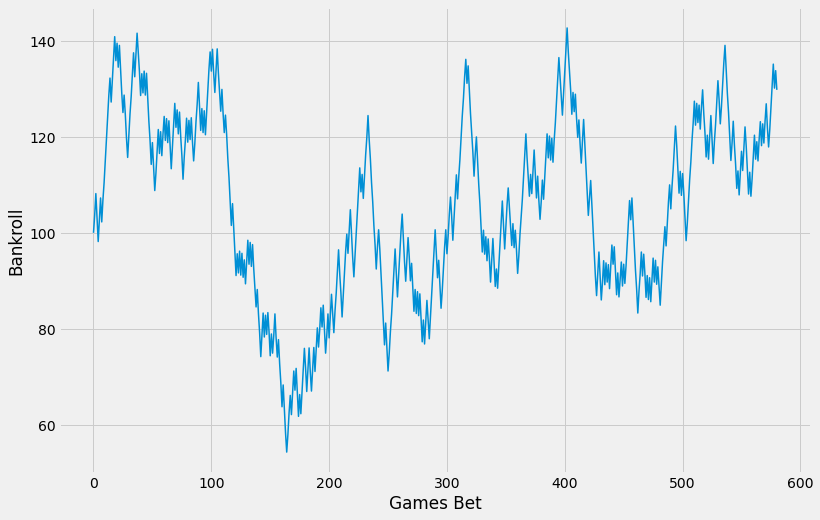

min balance: 54.27272727272711 
max balance: 142.7272727272727 
final balance: 133.4545454545455 
win percentage 52.669999999999995 
profit: 33.45454545454527 risk: 2729.0 
ROI: 1.23
3
test set 1: 2019-11-01 - 2020-10-11
[LightGBM] [Warning] feature_fraction is set=0.9757861180052461, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9757861180052461


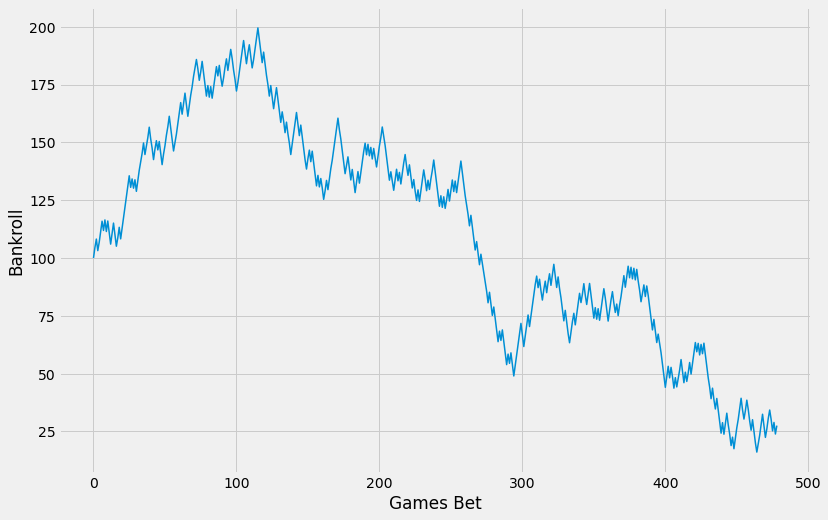

min balance: 16.090909090907793 
max balance: 199.4545454545448 
final balance: 22.545454545453246 
win percentage 50.73 
profit: -77.4545454545455 risk: 2271.0 
ROI: -3.4099999999999997
4
test set 1: 2021-01-01 - 2021-07-20
[LightGBM] [Warning] feature_fraction is set=0.9757861180052461, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9757861180052461


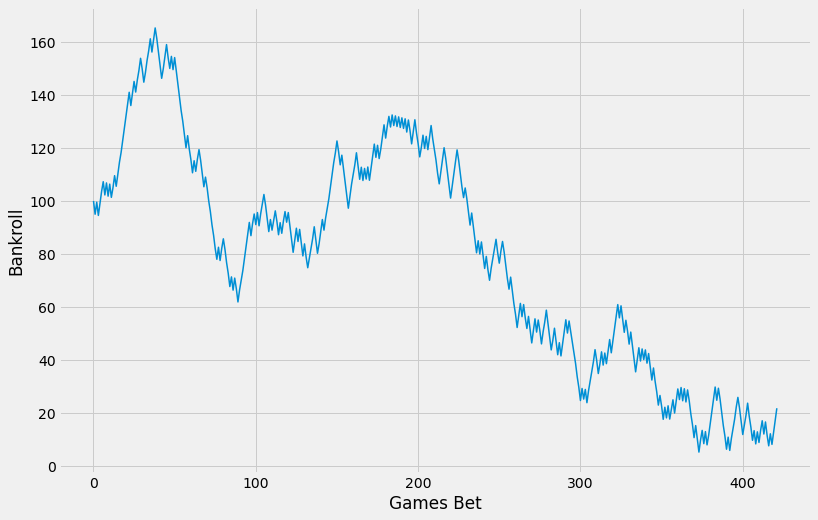

min balance: 5.272727272727172 
max balance: 165.27272727272714 
final balance: 26.36363636363626 
win percentage 50.239999999999995 
profit: -73.63636363636374 risk: 1977.0 
ROI: -3.7199999999999998

 LGBMClassifier(feature_fraction=0.9757861180052461, max_depth=15,
               min_child_weight=5, num_leaves=5, random_state=23,
               reg_alpha=4.2559474477064665, reg_lambda=0.21027791570026766,
               subsample=0.743528045375255)
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2016, -, 2017)            0.53  0.487578            644 -0.066611   
1  (2017, -, 2018)            0.53  0.495413            545 -0.049905   
2  (2018, -, 2019)            0.53  0.526678            581  0.012259   
3  (2019, -, 2020)            0.53  0.507307            479 -0.034106   
4  (2021, -, 2021)            0.53  0.502370            422 -0.037247   

      profits  
0 -204.363636  
1 -128.454545  
2   33.454545  
3  -77.454545  
4  -73.636364  
0
test set

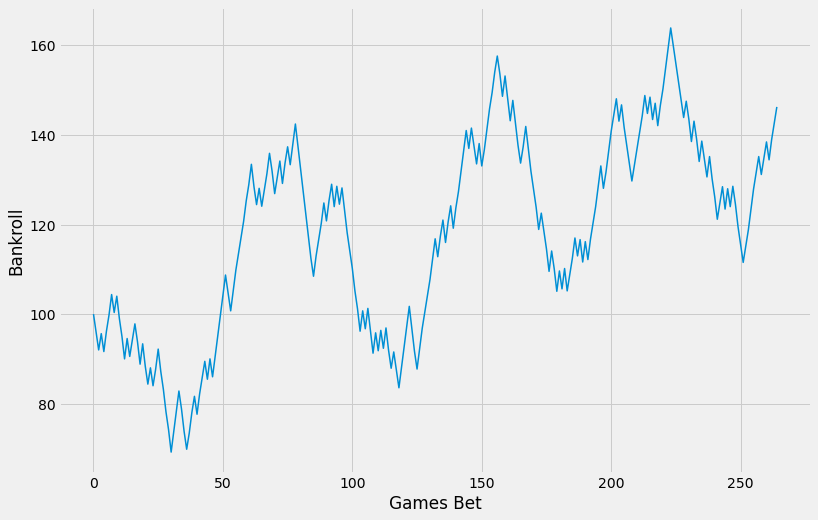

min balance: 69.18181818181822 
max balance: 163.90909090909057 
final balance: 149.90909090909045 
win percentage 53.959999999999994 
profit: 49.90909090909088 risk: 1191.0 
ROI: 4.19
1
test set 1: 2017-10-28 - 2018-06-08


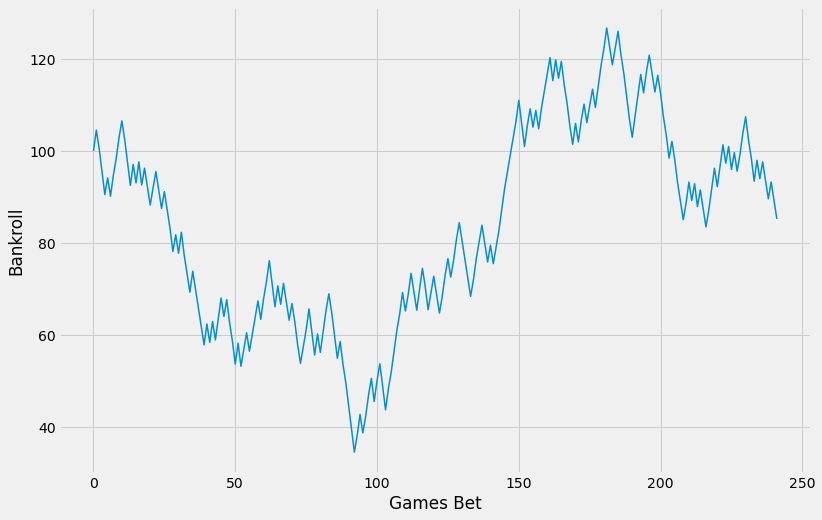

min balance: 34.63636363636369 
max balance: 126.7272727272729 
final balance: 88.90909090909116 
win percentage 51.239999999999995 
profit: -11.090909090909122 risk: 1063.0 
ROI: -1.04
2
test set 1: 2018-10-26 - 2019-06-13


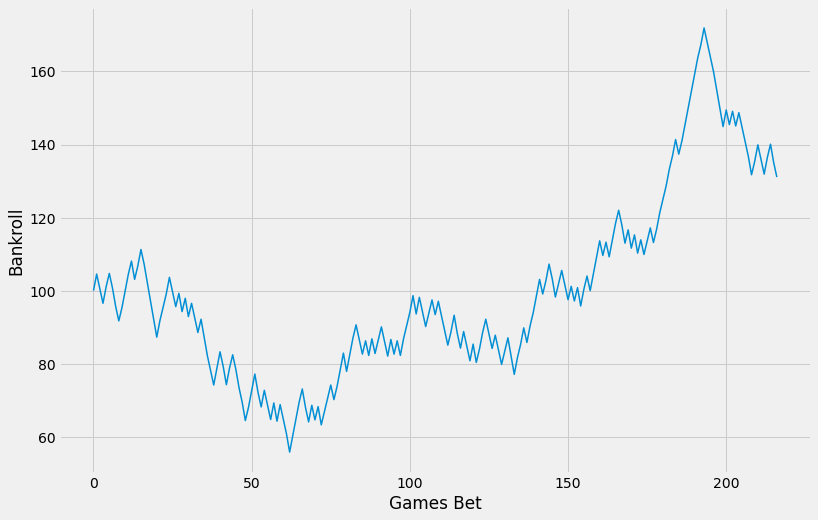

min balance: 55.818181818181884 
max balance: 171.90909090909102 
final balance: 134.72727272727275 
win percentage 53.459999999999994 
profit: 34.72727272727269 risk: 958.0 
ROI: 3.62
3
test set 1: 2019-11-01 - 2020-10-11


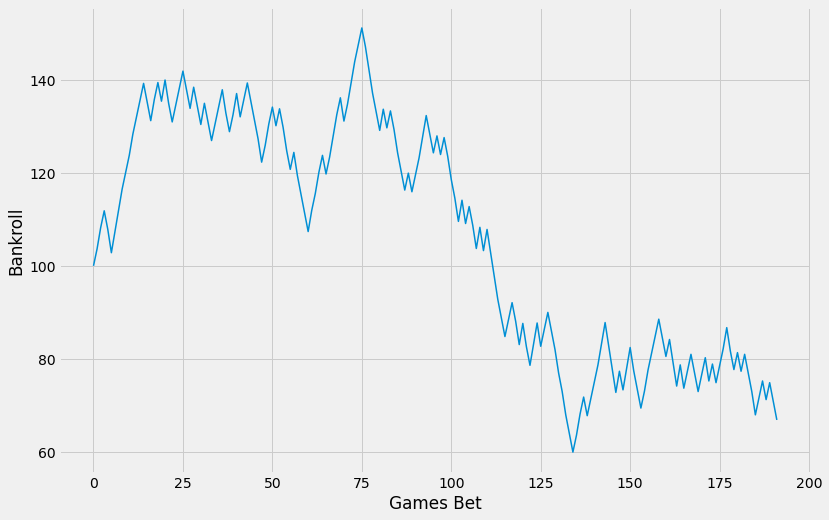

min balance: 59.99999999999976 
max balance: 151.09090909090884 
final balance: 62.90909090909075 
win percentage 50.0 
profit: -37.09090909090912 risk: 837.0 
ROI: -4.43
4
test set 1: 2021-01-01 - 2021-07-20


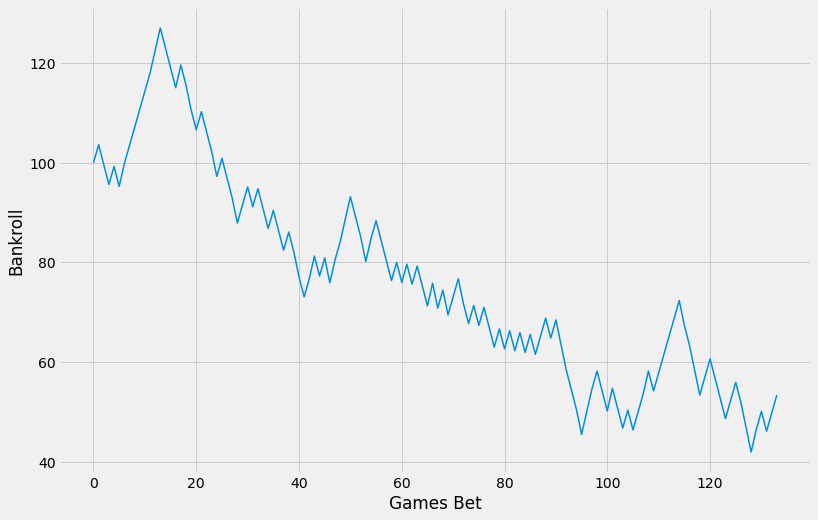

min balance: 41.909090909091034 
max balance: 127.09090909090912 
final balance: 57.000000000000114 
win percentage 48.51 
profit: -43.00000000000003 risk: 568.0 
ROI: -7.57

 RandomForestClassifier(max_depth=26, min_samples_leaf=0.027277490198880903,
                       min_samples_split=0.06694607157548488, random_state=23)
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2016, -, 2017)            0.53  0.539623            265  0.041905   
1  (2017, -, 2018)            0.53  0.512397            242 -0.010434   
2  (2018, -, 2019)            0.53  0.534562            217  0.036250   
3  (2019, -, 2020)            0.53  0.500000            192 -0.044314   
4  (2021, -, 2021)            0.53  0.485075            134 -0.075704   

     profits  
0  49.909091  
1 -11.090909  
2  34.727273  
3 -37.090909  
4 -43.000000  
0
test set 1: 2016-11-04 - 2017-06-12


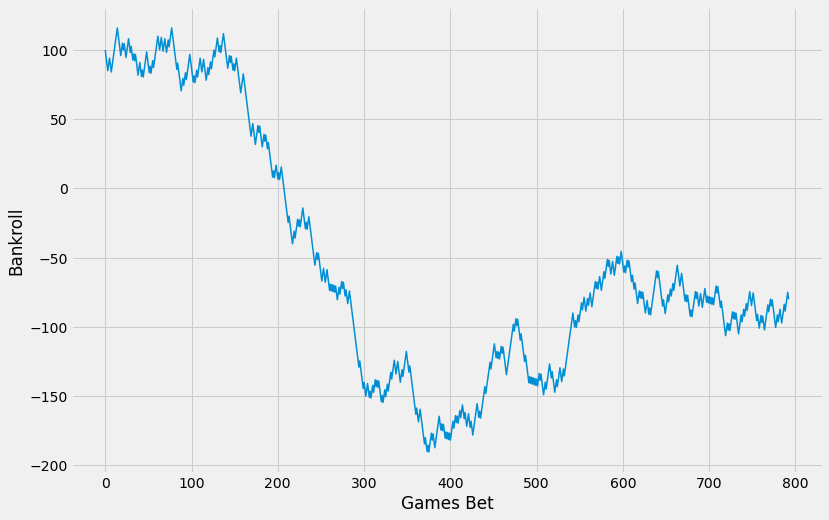

min balance: -190.45454545454567 
max balance: 115.90909090909096 
final balance: -85.00000000000084 
win percentage 49.94 
profit: -185.00000000000023 risk: 3965.0 
ROI: -4.67
1
test set 1: 2017-10-28 - 2018-06-08


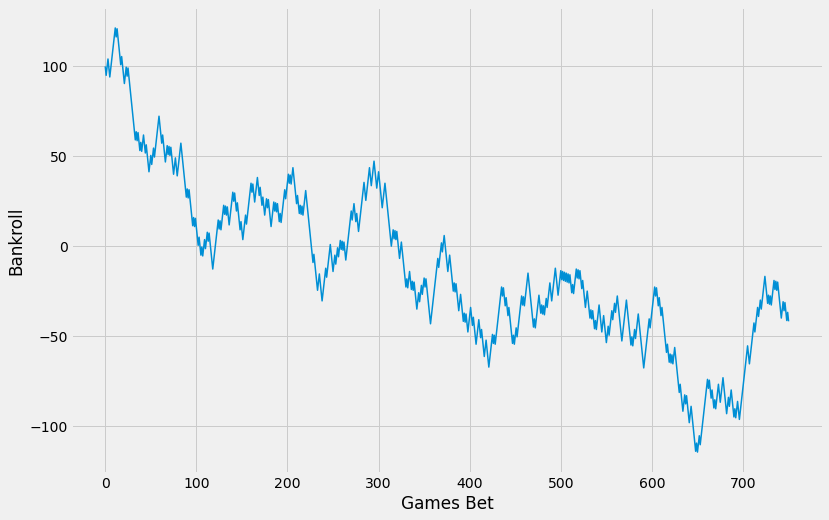

min balance: -114.54545454545426 
max balance: 121.36363636363637 
final balance: -46.81818181818146 
win percentage 50.33 
profit: -146.81818181818198 risk: 3755.0 
ROI: -3.91
2
test set 1: 2018-10-26 - 2019-06-13


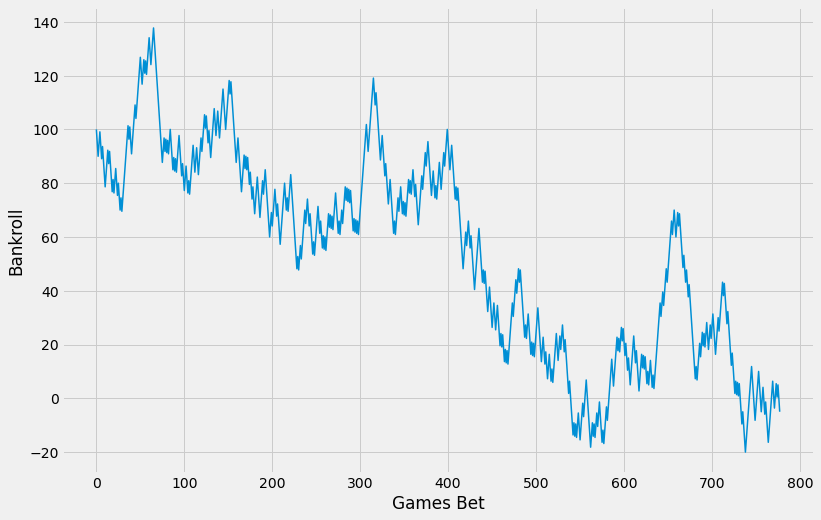

min balance: -19.999999999999687 
max balance: 137.72727272727272 
final balance: -9.999999999999698 
win percentage 50.9 
profit: -110.00000000000023 risk: 3890.0 
ROI: -2.83
3
test set 1: 2019-11-01 - 2020-10-11


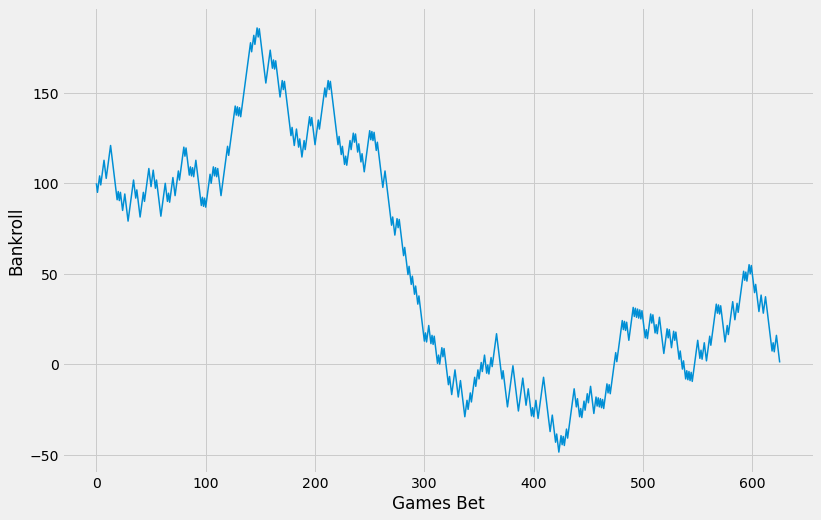

min balance: -48.63636363636404 
max balance: 185.90909090909076 
final balance: 5.454545454545119 
win percentage 50.8 
profit: -94.54545454545473 risk: 3130.0 
ROI: -3.02
4
test set 1: 2021-01-01 - 2021-07-20


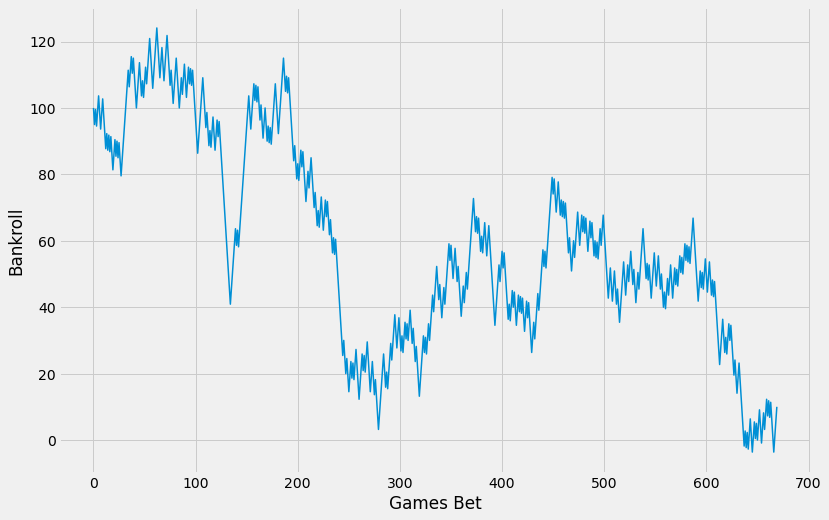

min balance: -3.6363636363632406 
max balance: 124.09090909090914 
final balance: 14.54545454545494 
win percentage 51.04 
profit: -85.4545454545455 risk: 3350.0 
ROI: -2.55

 Pipeline(steps=[('scaler', StandardScaler()),
                ('knn', KNeighborsClassifier(n_neighbors=40))])
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2016, -, 2017)            0.53  0.499369            793 -0.046658   
1  (2017, -, 2018)            0.53  0.503329            751 -0.039099   
2  (2018, -, 2019)            0.53  0.508997            778 -0.028278   
3  (2019, -, 2020)            0.53  0.507987            626 -0.030206   
4  (2021, -, 2021)            0.53  0.510448            670 -0.025509   

      profits  
0 -185.000000  
1 -146.818182  
2 -110.000000  
3  -94.545455  
4  -85.454545  
0
test set 1: 2016-11-04 - 2017-06-12


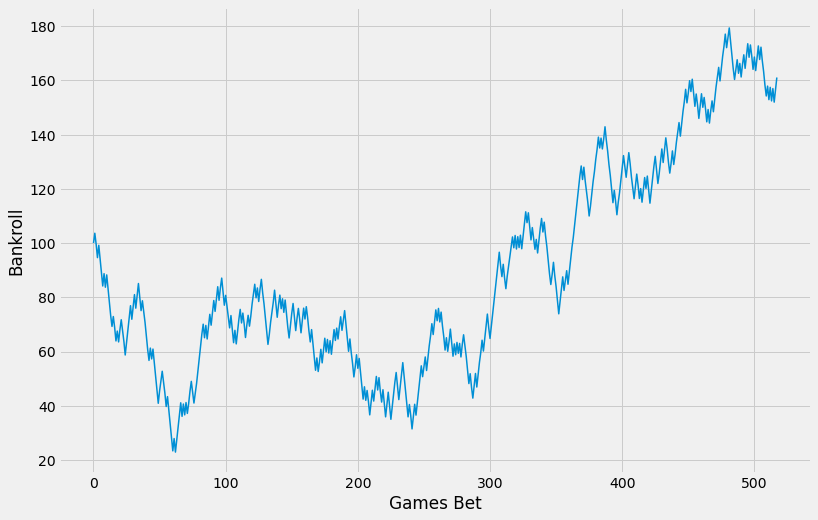

min balance: 22.909090909090935 
max balance: 179.36363636363612 
final balance: 156.09090909090864 
win percentage 53.47 
profit: 56.09090909090901 risk: 2420.0 
ROI: 2.32
1
test set 1: 2017-10-28 - 2018-06-08


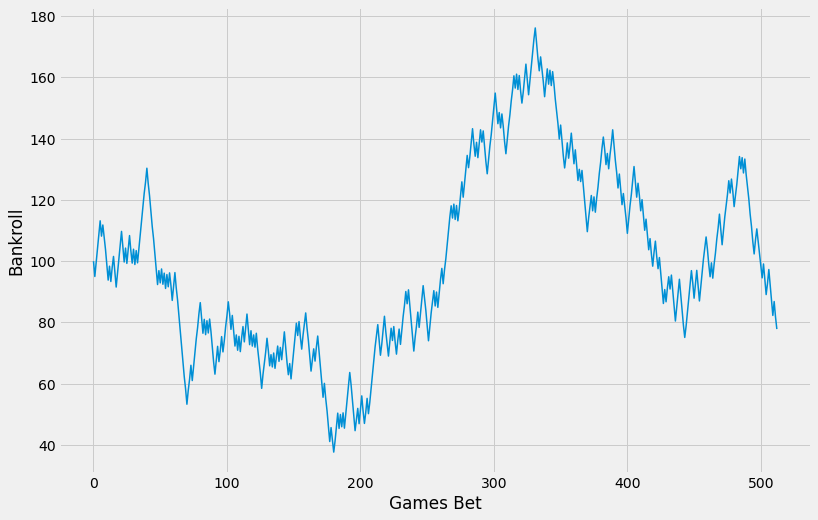

min balance: 37.6363636363638 
max balance: 176.18181818181802 
final balance: 73.81818181818147 
win percentage 51.66 
profit: -26.181818181818244 risk: 2403.0 
ROI: -1.09
2
test set 1: 2018-10-26 - 2019-06-13


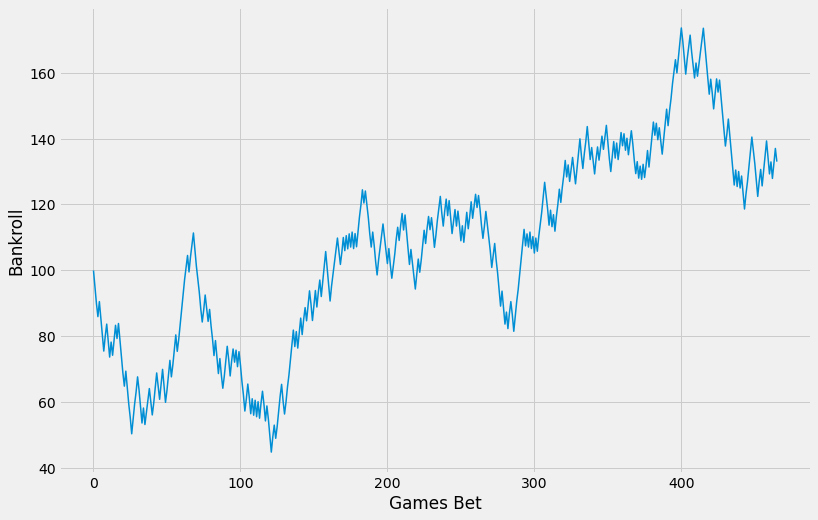

min balance: 44.909090909090956 
max balance: 173.54545454545428 
final balance: 128.99999999999943 
win percentage 53.0 
profit: 29.0 risk: 2134.0 
ROI: 1.3599999999999999
3
test set 1: 2019-11-01 - 2020-10-11


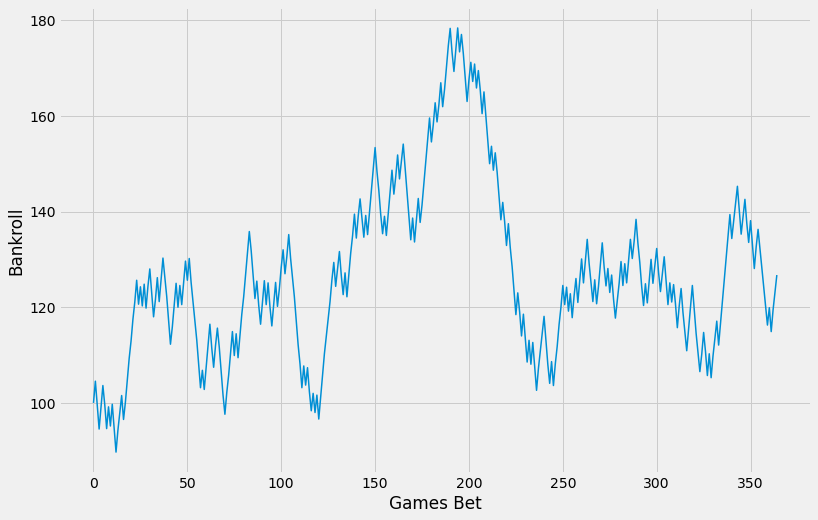

min balance: 89.72727272727273 
max balance: 178.36363636363598 
final balance: 122.72727272727207 
win percentage 53.15 
profit: 22.727272727272634 risk: 1684.0 
ROI: 1.35
4
test set 1: 2021-01-01 - 2021-07-20


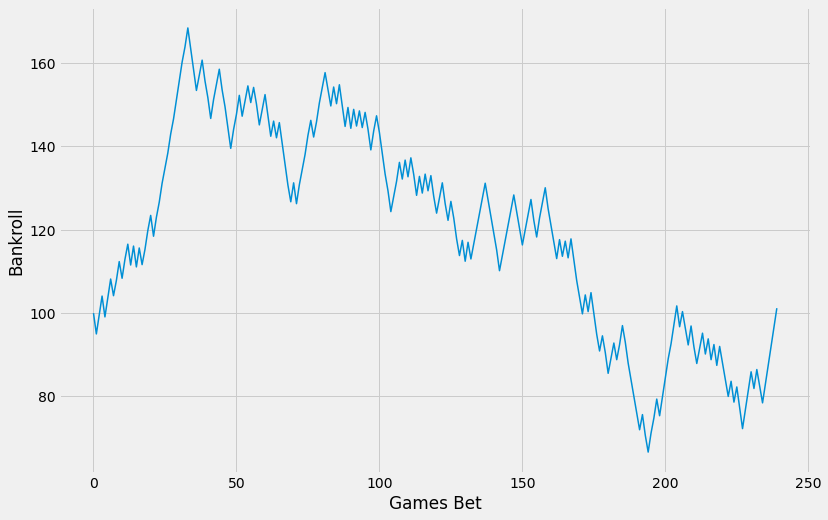

min balance: 66.63636363636321 
max balance: 168.45454545454538 
final balance: 105.72727272727236 
win percentage 52.5 
profit: 5.727272727272634 risk: 1071.0 
ROI: 0.53

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('logreg',
                                                 LogisticRegression(C=0.0017529526386885924,
                                                                    max_iter=10000,
                                                                    random_state=23,
                                                                    solver='saga',
                                                                    verbose=1))])),
                               ('sgd',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('sgd',
                                                 

,season,best_threshold,win_pcts,num_games_bet,rois,profits
0,"(2016, -, 2017)",0.53,0.534749,518,0.023178,56.090909
1,"(2017, -, 2018)",0.53,0.516569,513,-0.010895,-26.181818
2,"(2018, -, 2019)",0.53,0.530043,466,0.013590,29.000000
3,"(2019, -, 2020)",0.53,0.531507,365,0.013496,22.727273
4,"(2021, -, 2021)",0.53,0.525000,240,0.005348,5.727273


In [223]:
estimators2 = [('log', best_lr), ('sgd', best_sgd),
              ('svc', best_svc), ('lgbc', best_lgbc), 
              ('rf', best_rf), ('knn', best_knn)]


stacked_clf2 = StackingClassifier(estimators = estimators2, final_estimator = LogisticRegression(),
                                 n_jobs=-1, verbose=1)


stacked_clf2.fit(X_train, y_train)
stacked_preds = stacked_clf2.predict(X_test)

print("stacked clf train_acc:", stacked_clf2.score(X_train, y_train))
print("stacked clf test_acc:", stacked_clf2.score(X_test, y_test))
print("stacked clf f1_score", f1_score(y_test, stacked_preds))

cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21]

threshold = 0.53

for estimator in [best_lr, best_sgd, best_svc, best_lgbc, best_rf, best_knn, stacked_clf2]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test1, y_train1, y_test1, train_idx1, test_idx1 = split_prep_data(home_games, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test1.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='D'))

        year = (np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='Y'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='Y'))


        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(home_games, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_3(select_bets)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)
    print(results_by_season)

results_by_season

In [168]:
estimators2 = [('log', best_lr), ('sgd', best_sgd),
              ('svc', best_svc), ('lgbc', best_lgbc), 
              ('rf', best_rf), ('knn', best_knn)]


stacked_clf2 = StackingClassifier(estimators = estimators2, final_estimator = LogisticRegression(),
                                 n_jobs=-1, verbose=1)


stacked_clf2.fit(X_train, y_train)
stacked_preds = stacked_clf2.predict(X_test)

print("stacked clf train_acc:", stacked_clf2.score(X_train, y_train))
print("stacked clf test_acc:", stacked_clf2.score(X_test, y_test))
print("stacked clf f1_score", f1_score(y_test, stacked_preds))




stacked clf train_acc: 0.5210364514712341
stacked clf test_acc: 0.5076895881209121
stacked clf f1_score 0.44377870980627127


0
test set 1: 2016-11-04 - 2017-06-12


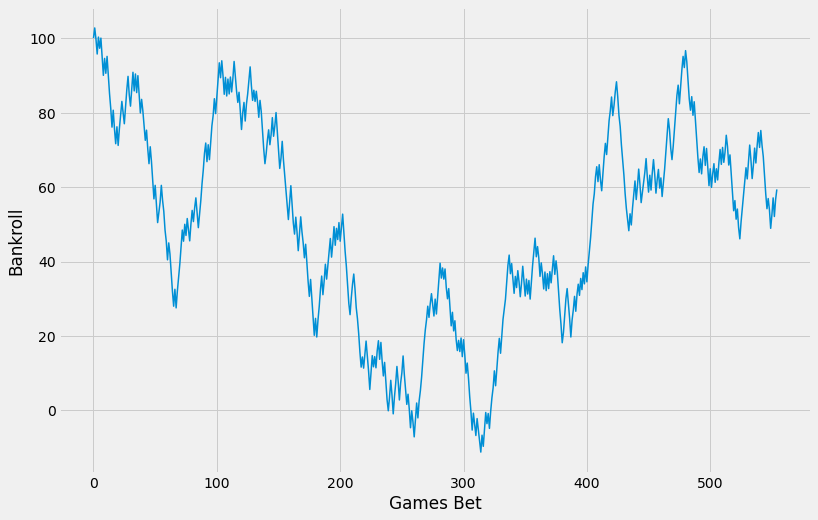

min balance: -11.181818181818048 
max balance: 102.72727272727273 
final balance: 56.36363636363658 
win percentage 50.81 
profit: -43.63636363636374 risk: 2346.0 
ROI: -1.8599999999999999
1
test set 1: 2017-10-28 - 2018-06-08


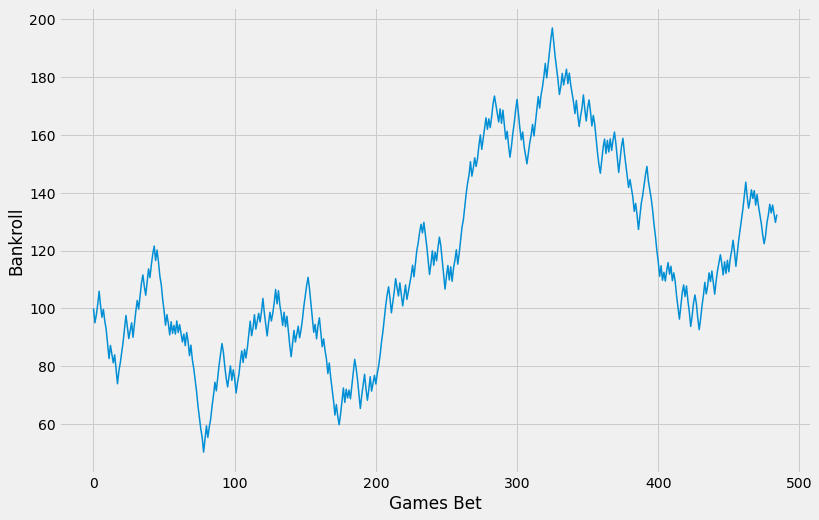

min balance: 50.272727272727394 
max balance: 196.99999999999997 
final balance: 129.45454545454513 
win percentage 53.2 
profit: 29.454545454545382 risk: 1998.0 
ROI: 1.47
2
test set 1: 2018-10-26 - 2019-06-13


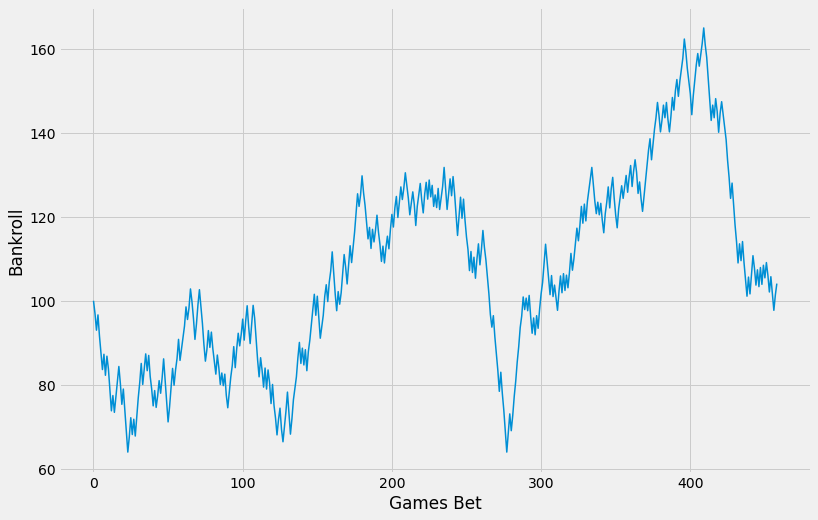

min balance: 64.00000000000003 
max balance: 164.9090909090912 
final balance: 107.72727272727299 
win percentage 52.290000000000006 
profit: 7.727272727272634 risk: 1867.0 
ROI: 0.41000000000000003
3
test set 1: 2019-11-01 - 2020-10-11


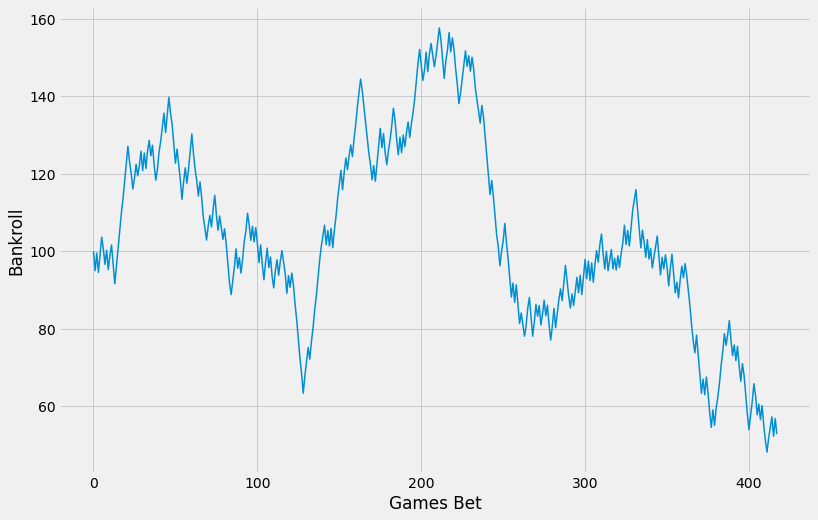

min balance: 48.18181818181829 
max balance: 157.6363636363636 
final balance: 55.545454545454646 
win percentage 51.2 
profit: -44.454545454545496 risk: 1734.0 
ROI: -2.56
4
test set 1: 2021-01-01 - 2021-07-20


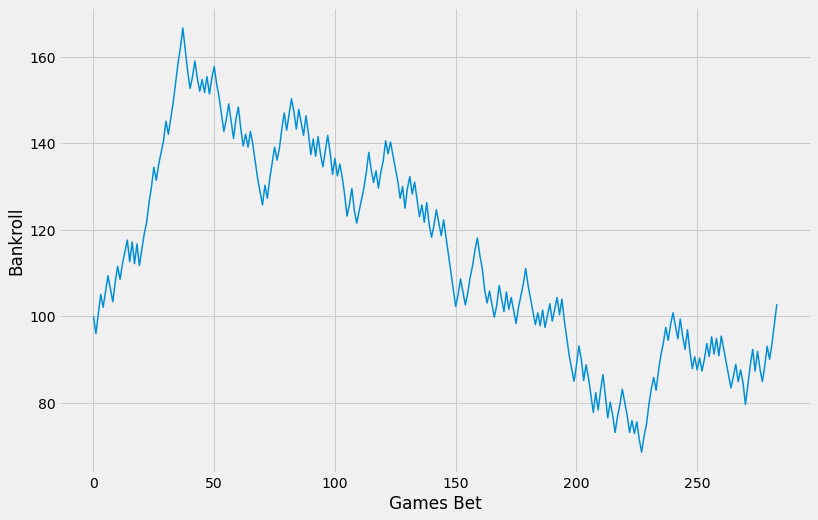

min balance: 68.63636363636337 
max balance: 166.63636363636357 
final balance: 107.36363636363622 
win percentage 51.06 
profit: 7.363636363636374 risk: 1077.0 
ROI: 0.6799999999999999

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('logreg',
                                                 LogisticRegression(C=0.7454463431911512,
                                                                    max_iter=10000,
                                                                    random_state=23,
                                                                    solver='saga',
                                                                    verbose=1))])),
                               ('sgd',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('sgd',
                                     

,season,best_threshold,win_pcts,num_games_bet,rois,profits
0,"(2016, -, 2017)",0.5238,0.508108,555,-0.018600,-43.636364
1,"(2017, -, 2018)",0.5238,0.531959,485,0.014742,29.454545
2,"(2018, -, 2019)",0.5238,0.522876,459,0.004139,7.727273
3,"(2019, -, 2020)",0.5238,0.511962,418,-0.025637,-44.454545
4,"(2021, -, 2021)",0.5238,0.510563,284,0.006837,7.363636


In [170]:
cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21]

threshold = 0.53

for estimator in [stacked_clf2]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test1, y_train1, y_test1, train_idx1, test_idx1 = split_prep_data(home_games, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test1.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='D'))

        year = (np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='Y'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='Y'))


        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(home_games, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_3(select_bets)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)
    print(results_by_season)

results_by_season

0
test set 1: 2016-11-04 - 2017-06-12


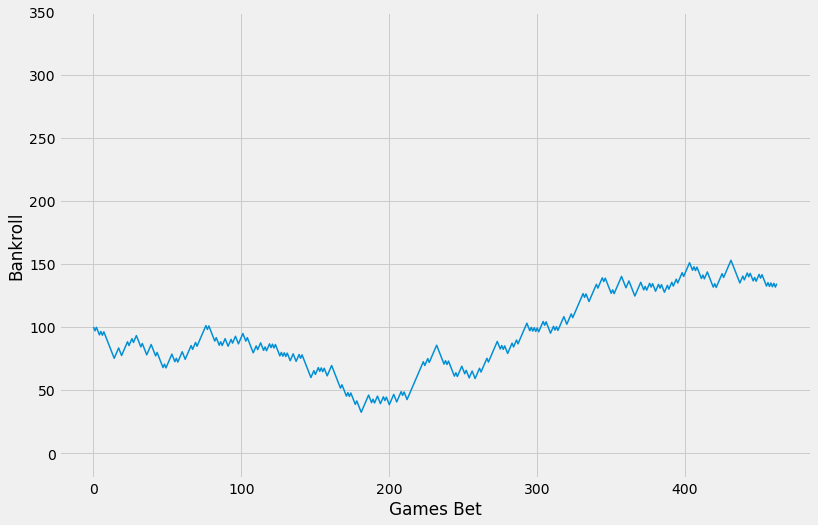

min balance: 32.36363636363686 
max balance: 152.90909090909142 
final balance: 137.0909090909095 
win percentage 53.779999999999994 
profit: 37.09090909090901 risk: 1389.0 
ROI: 2.67
1
test set 1: 2017-10-28 - 2018-06-08


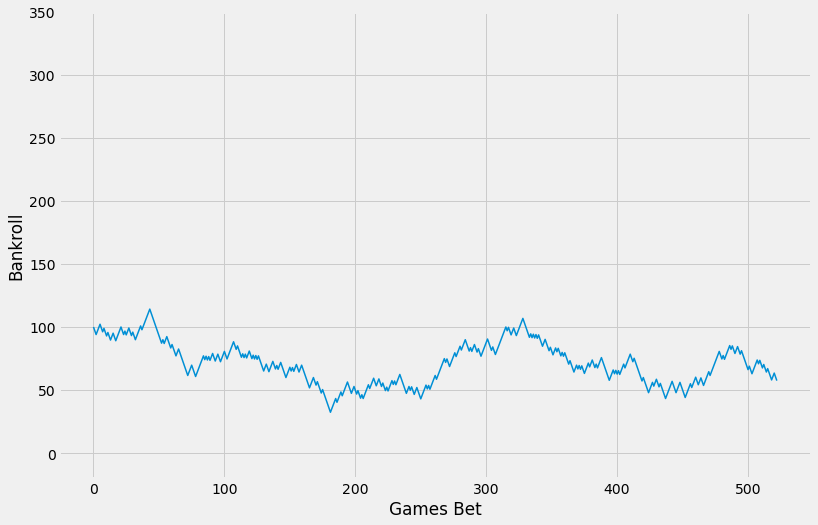

min balance: 32.363636363636836 
max balance: 114.18181818181834 
final balance: 54.45454545454653 
win percentage 50.86000000000001 
profit: -45.54545454545462 risk: 1569.0 
ROI: -2.9000000000000004
2
test set 1: 2018-10-26 - 2019-06-13


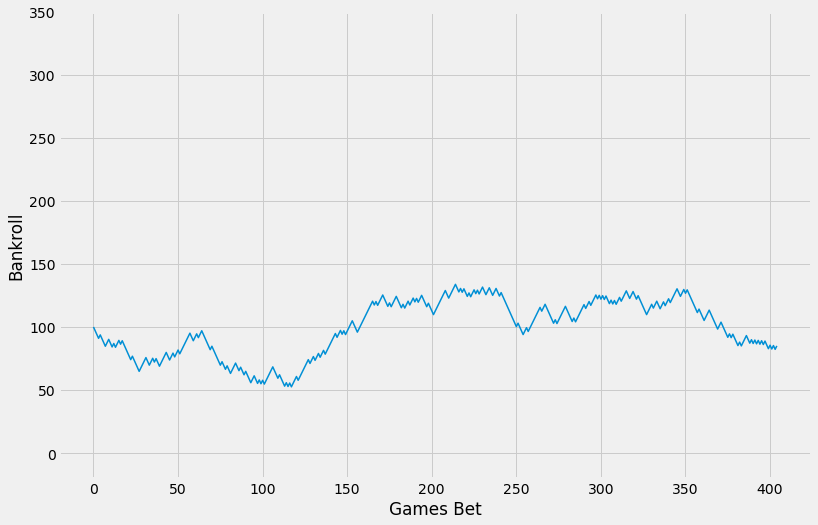

min balance: 52.54545454545481 
max balance: 133.81818181818244 
final balance: 87.72727272727381 
win percentage 51.849999999999994 
profit: -12.272727272727366 risk: 1215.0 
ROI: -1.01
3
test set 1: 2019-11-01 - 2020-10-11


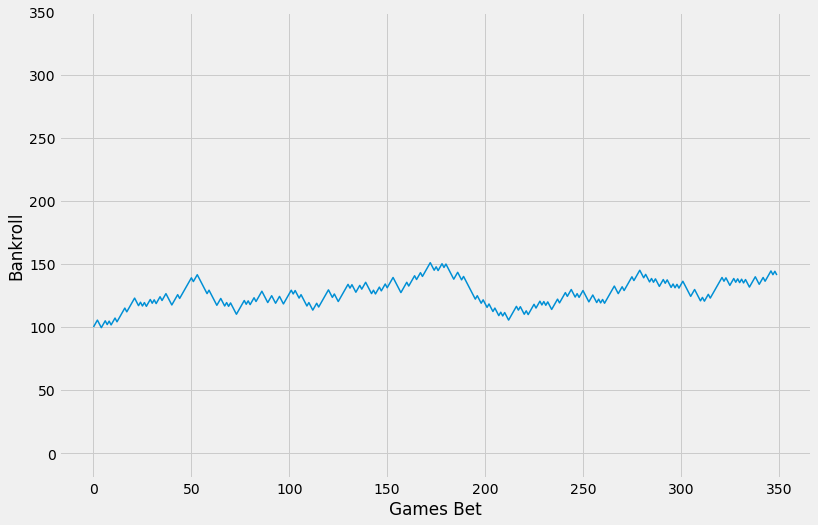

min balance: 99.45454545454547 
max balance: 151.0000000000001 
final balance: 143.9090909090909 
win percentage 54.56999999999999 
profit: 43.90909090909088 risk: 1050.0 
ROI: 4.18
4
test set 1: 2021-01-01 - 2021-07-20


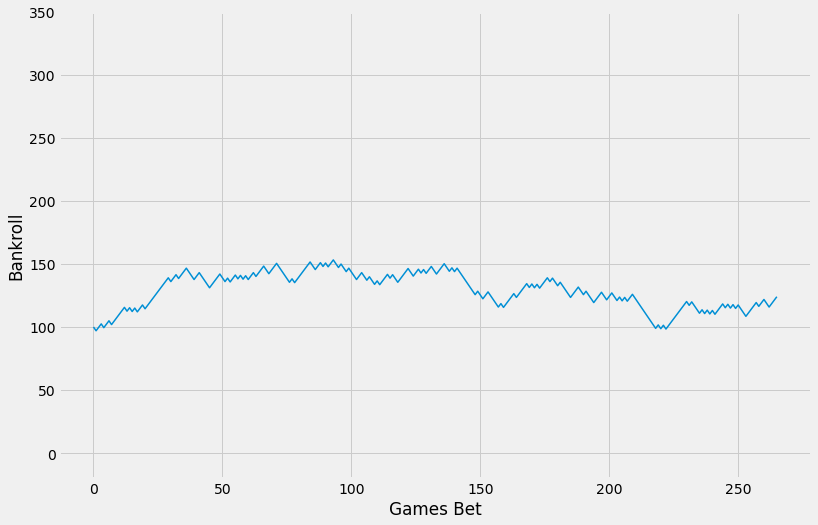

min balance: 97.0 
max balance: 153.181818181818 
final balance: 126.72727272727256 
win percentage 54.14 
profit: 26.72727272727269 risk: 798.0 
ROI: 3.35

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('logreg',
                                                 LogisticRegression(C=0.001258237256125393,
                                                                    max_iter=10000,
                                                                    random_state=24,
                                                                    solver='saga',
                                                                    verbose=1))])),
                               ('sgd',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('sgd',
                                                 SGDClassifier(al

,season,best_threshold,win_pcts,num_games_bet,rois,profits
0,"(2016, -, 2017)",0.53,0.537797,463,0.026703,37.090909
1,"(2017, -, 2018)",0.53,0.508604,523,-0.029028,-45.545455
2,"(2018, -, 2019)",0.53,0.518519,405,-0.010101,-12.272727
3,"(2019, -, 2020)",0.53,0.545714,350,0.041818,43.909091
4,"(2021, -, 2021)",0.53,0.541353,266,0.033493,26.727273


In [531]:
cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21]

estimators2 = [('log', best_lr), ('sgd', best_sgd),
              ('svc', best_svc), ('lgbc', best_lgbc), 
              ('rf', best_rf), ('knn', best_knn)]


stacked_clf2 = StackingClassifier(estimators = estimators2, final_estimator = LogisticRegression(),
                                 n_jobs=-1, verbose=1)

threshold = 0.53

for estimator in [stacked_clf2]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test, y_train1, y_test, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='D'))

        year = (np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='Y'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='Y'))


        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(df_ewm_19_diffs, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob_avg'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_1(select_bets, unit_size=3)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)
    print(results_by_season)

results_by_season

0
test set 1: 2016-11-04 - 2017-06-12


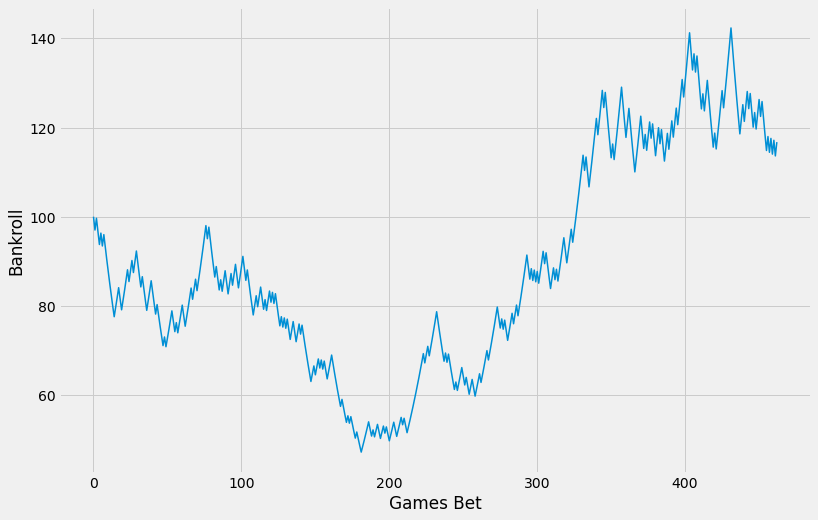

min balance: 47.15718789395891 
max balance: 142.36824210322615 
final balance: 119.9236825032114 
win percentage 53.779999999999994 
profit: 19.923682503211467 risk: 1230.221334080431 
ROI: 1.6199999999999999
1
test set 1: 2017-10-28 - 2018-06-08


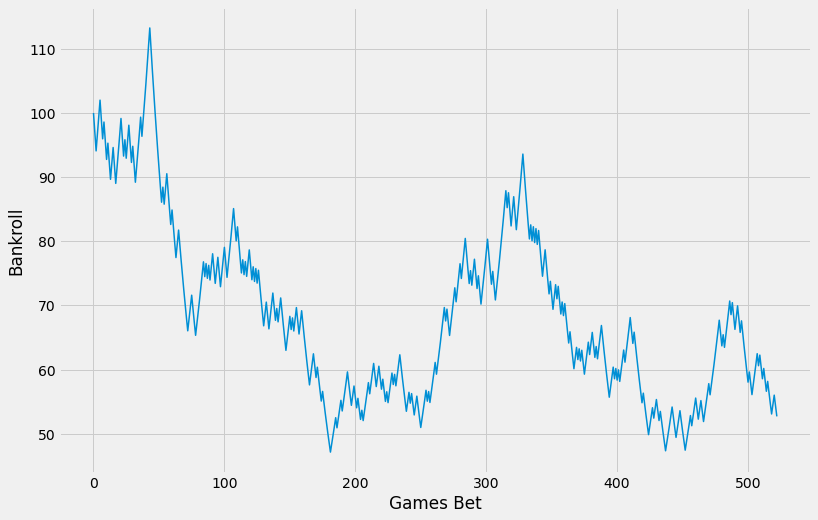

min balance: 47.157187893958906 
max balance: 113.24920837374955 
final balance: 51.13843356768252 
win percentage 50.86000000000001 
profit: -48.86156643231749 risk: 1076.4545065590792 
ROI: -4.54
2
test set 1: 2018-10-26 - 2019-06-13


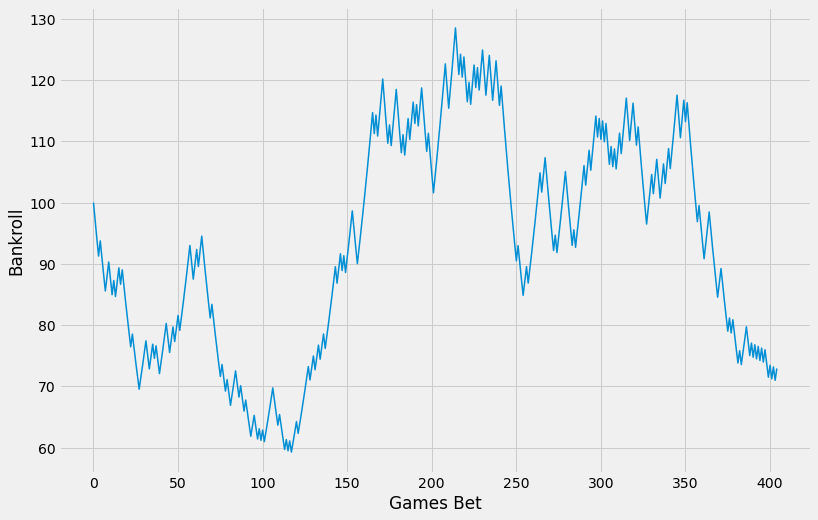

min balance: 59.25652566300364 
max balance: 128.530433389123 
final balance: 74.90269263830042 
win percentage 51.849999999999994 
profit: -25.09730736169979 risk: 1132.8158296243703 
ROI: -2.22
3
test set 1: 2019-11-01 - 2020-10-11


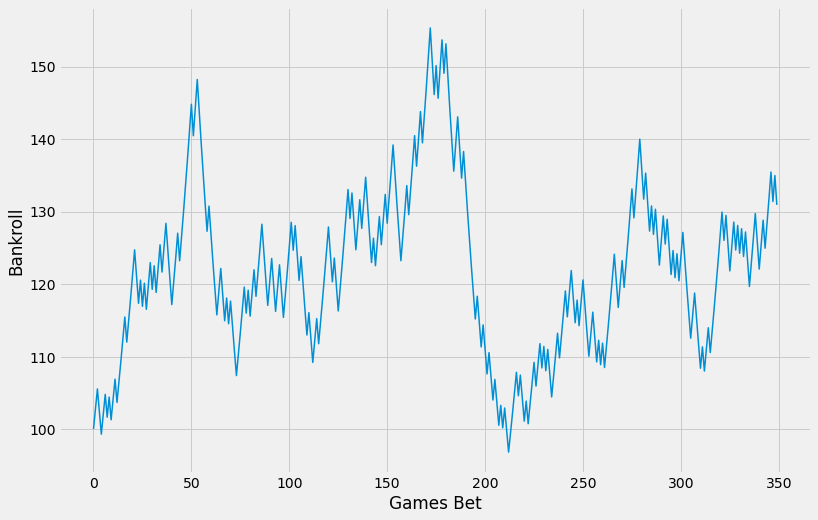

min balance: 96.82296080447377 
max balance: 155.31974742090452 
final balance: 134.48863584654163 
win percentage 54.56999999999999 
profit: 34.48863584654157 risk: 1278.9644771927979 
ROI: 2.7
4
test set 1: 2021-01-01 - 2021-07-20


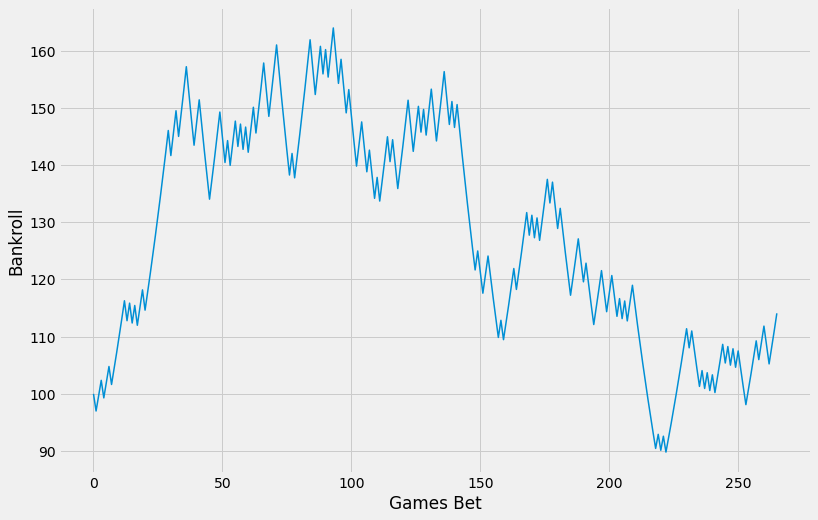

min balance: 89.81560464554376 
max balance: 163.97765907280822 
final balance: 117.19275915996312 
win percentage 54.14 
profit: 17.192759159963202 risk: 1024.3649672887168 
ROI: 1.68

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('logreg',
                                                 LogisticRegression(C=0.001258237256125393,
                                                                    max_iter=10000,
                                                                    random_state=24,
                                                                    solver='saga',
                                                                    verbose=1))])),
                               ('sgd',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('sgd',
                                    

,season,best_threshold,win_pcts,num_games_bet,rois,profits
0,"(2016, -, 2017)",0.53,0.537797,463,0.016195,19.923683
1,"(2017, -, 2018)",0.53,0.508604,523,-0.045391,-48.861566
2,"(2018, -, 2019)",0.53,0.518519,405,-0.022155,-25.097307
3,"(2019, -, 2020)",0.53,0.545714,350,0.026966,34.488636
4,"(2021, -, 2021)",0.53,0.541353,266,0.016784,17.192759


In [533]:
cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21]

estimators2 = [('log', best_lr), ('sgd', best_sgd),
              ('svc', best_svc), ('lgbc', best_lgbc), 
              ('rf', best_rf), ('knn', best_knn)]


stacked_clf2 = StackingClassifier(estimators = estimators2, final_estimator = LogisticRegression(),
                                 n_jobs=-1, verbose=1)

threshold = 0.53

for estimator in [stacked_clf2]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test, y_train1, y_test, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='D'))

        year = (np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='Y'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='Y'))


        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(df_ewm_19_diffs, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob_avg'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_2(select_bets)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)
    print(results_by_season)

results_by_season

### Betting Strat 1 (bet size 3)

0
test set 1: 2016-11-04 - 2018-06-08
test set 2: 2018-10-26 - 2019-06-13
best threshold for testset 1: 0.562
num_games_bet at threshold: 197
win percetange at threshold: 0.5583756345177665
test1_acc: 0.5124843945068664
test2_acc: 0.5119538334707338
win_percentage at  0.562 : 0.6212121212121212 ...Games Bet: 66


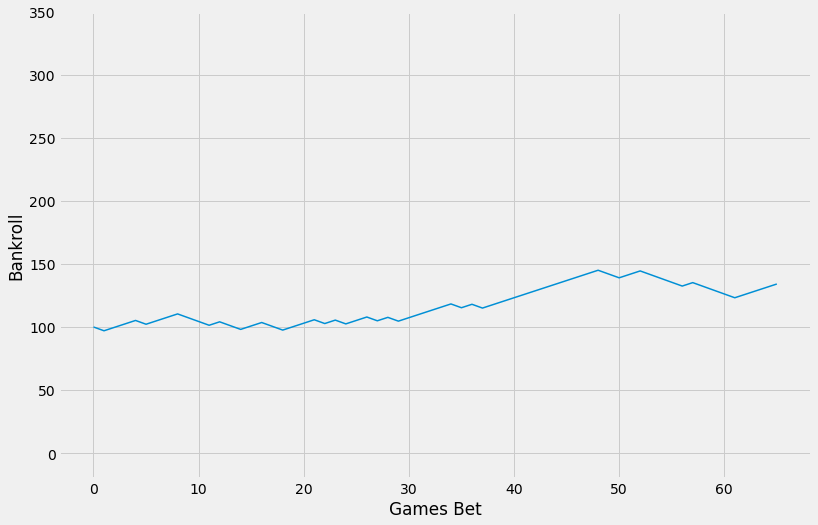

min balance: 97.0 
max balance: 145.0000000000001 
final balance: 136.8181818181819 
win percentage 62.12 
profit: 36.81818181818181 risk: 198.0 
ROI: 18.6
1
test set 1: 2017-10-28 - 2019-06-13
test set 2: 2019-11-01 - 2020-10-11


KeyboardInterrupt: 

In [503]:
cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21]



for estimator in [stacked_clf2]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-3):
        X_train1, X_test, y_train1, y_test, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])
        X_test1, y_test1, test_idx1 = (X_test.loc[:cutoffs[i+2]], 
                                       y_test.loc[:cutoffs[i+2]], 
                                       X_test.loc[:cutoffs[i+2]].index)
        X_test2, y_test2, test_idx2 = (X_test.loc[cutoffs[i+2]+1:cutoffs[i+3]],
                                       y_test.loc[cutoffs[i+2]+1:cutoffs[i+3]],
                                       X_test.loc[cutoffs[i+2]+1:cutoffs[i+3]].index)

        X_train2 = pd.concat([X_train1, X_test1])
        y_train2 = pd.concat([y_train1, y_test1])

        print(i)
        print("test set 1:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='D'))
        print("test set 2:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx2, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx2, 'GAME_DATE'].values[-1], unit='D'))

        year = (np.datetime_as_string(df_ewm_19_diffs.loc[test_idx2, 'GAME_DATE'].values[0], unit='Y'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx2, 'GAME_DATE'].values[-1], unit='Y'))


        select_bets, best_threshold = test_model_at_threshold(df_ewm_19_diffs, estimator, X_train1,
                                                              y_train1, X_test1, y_test1, test_idx1,
                                                               X_train2, y_train2, X_test2, y_test2, 
                                                              test_idx2)

        selected_bets, roi, profit, win_pct = simulate_bets_1(select_bets, 3)

        season.append(year)
        best_thresholds.append(best_threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)

    print(results_by_season)

### Betting Strat 3 (bet size 3% of bankroll)

0
test set 1: 2015-11-05 - 2017-06-12
test set 2: 2017-10-28 - 2018-06-08


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


best threshold for testset 1: 0.575
num_games_bet at threshold: 287
win percetange at threshold: 0.5958188153310104
test1_acc: 0.5180798004987531


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


test2_acc: 0.49330543933054394
win_percentage at  0.575 : 0.5063291139240507 ...Games Bet: 158


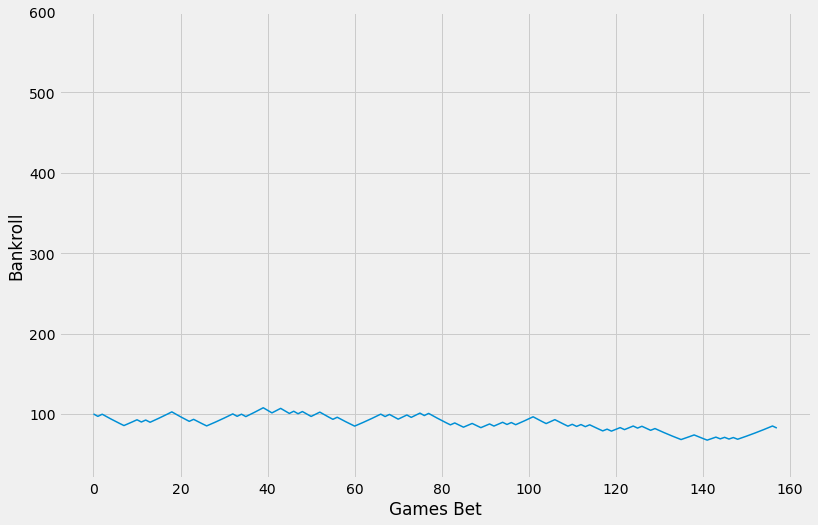

min balance: 67.44785886782786 
max balance: 107.69763480732027 
final balance: 79.99372833392026 
win percentage 50.629999999999995 
profit: -20.006271666079783 risk: 421.4885838876271 
ROI: -4.75
1
test set 1: 2016-11-04 - 2018-06-08
test set 2: 2018-10-26 - 2019-06-13


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


best threshold for testset 1: 0.574
num_games_bet at threshold: 305
win percetange at threshold: 0.5573770491803278
test1_acc: 0.5091552226383687


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


test2_acc: 0.5148392415498764
win_percentage at  0.574 : 0.5474452554744526 ...Games Bet: 137


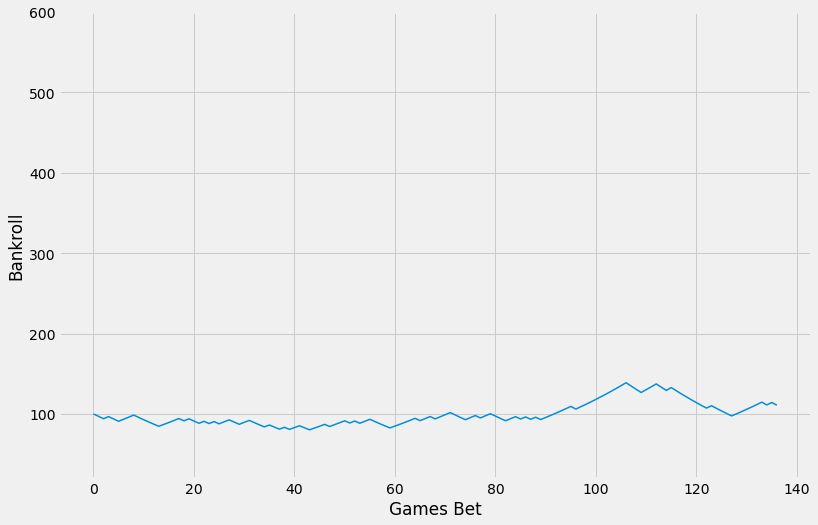

min balance: 80.26958738838985 
max balance: 138.82680342739312 
final balance: 113.83594021342184 
win percentage 54.74 
profit: 13.83594021342185 risk: 409.6400340072373 
ROI: 3.38
2
test set 1: 2017-10-28 - 2019-06-13
test set 2: 2019-11-01 - 2020-10-11


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


best threshold for testset 1: 0.582
num_games_bet at threshold: 268
win percetange at threshold: 0.5671641791044776
test1_acc: 0.5085132890365448


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


test2_acc: 0.5049800796812749
win_percentage at  0.582 : 0.5142857142857142 ...Games Bet: 70


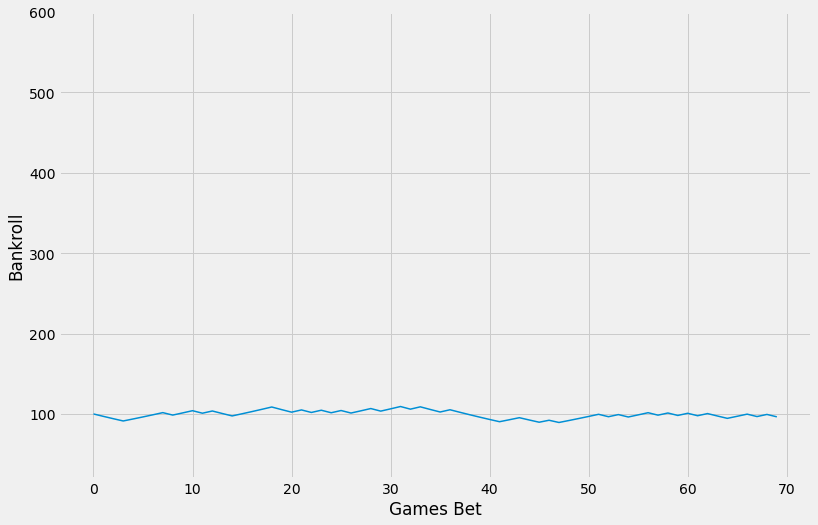

min balance: 89.39105520275832 
max balance: 109.2386175372229 
final balance: 93.52468728949728 
win percentage 51.43 
profit: -6.475312710502649 risk: 208.99530660981432 
ROI: -3.1
3
test set 1: 2018-10-26 - 2020-10-11
test set 2: 2021-01-01 - 2021-07-20


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


best threshold for testset 1: 0.541
num_games_bet at threshold: 910
win percetange at threshold: 0.5395604395604395
test1_acc: 0.5047361299052774


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished


test2_acc: 0.5053037608486017
win_percentage at  0.541 : 0.528169014084507 ...Games Bet: 284


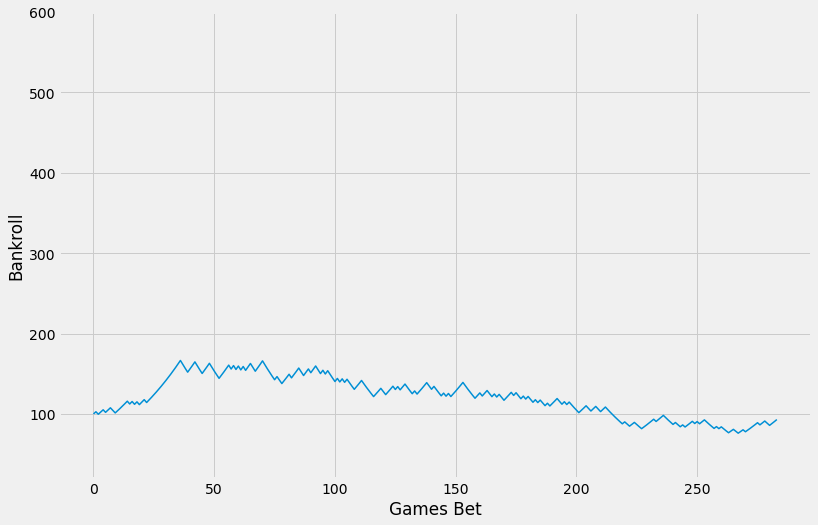

min balance: 76.08067291296189 
max balance: 166.48499876738703 
final balance: 95.55999986317615 
win percentage 52.82 
profit: -4.440000136824096 risk: 1030.7678643545191 
ROI: -0.43

 Pipeline(steps=[('scaler', StandardScaler()),
                ('logreg',
                 LogisticRegression(C=0.0027825594022071257, max_iter=10000,
                                    verbose=1))])
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2017, -, 2018)           0.575  0.506329            158 -0.047466   
1  (2018, -, 2019)           0.574  0.547445            137  0.033776   
2  (2019, -, 2020)           0.582  0.514286             70 -0.030983   
3  (2021, -, 2021)           0.541  0.528169            284 -0.004307   

     profits  
0 -20.006272  
1  13.835940  
2  -6.475313  
3  -4.440000  
0
test set 1: 2015-11-05 - 2017-06-12
test set 2: 2017-10-28 - 2018-06-08
best threshold for testset 1: 0.569
num_games_bet at threshold: 377
win percetange at threshold: 0

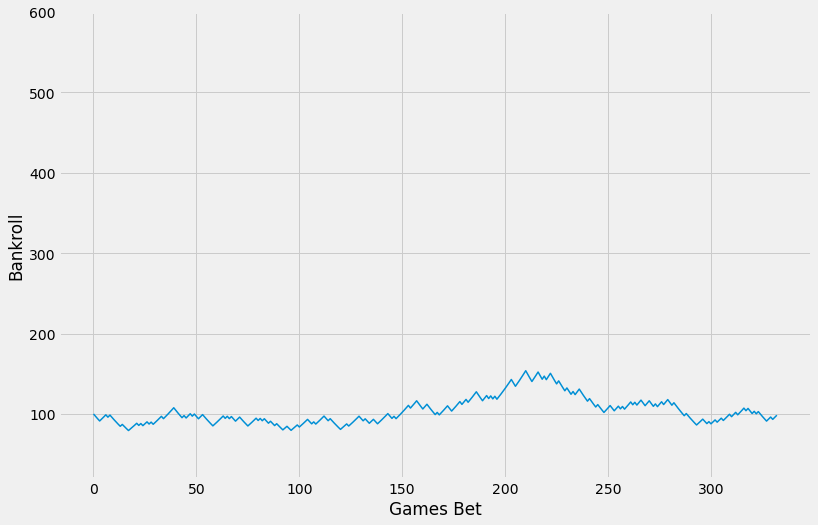

min balance: 79.37607185218131 
max balance: 153.75634933943644 
final balance: 95.46754289975993 
win percentage 52.849999999999994 
profit: -4.532457100239981 risk: 1035.9564275909627 
ROI: -0.44
1
test set 1: 2016-11-04 - 2018-06-08
test set 2: 2018-10-26 - 2019-06-13
best threshold for testset 1: 0.553
num_games_bet at threshold: 800
win percetange at threshold: 0.54125
test1_acc: 0.5222638368705784
test2_acc: 0.5057708161582852
win_percentage at  0.553 : 0.5603015075376885 ...Games Bet: 398


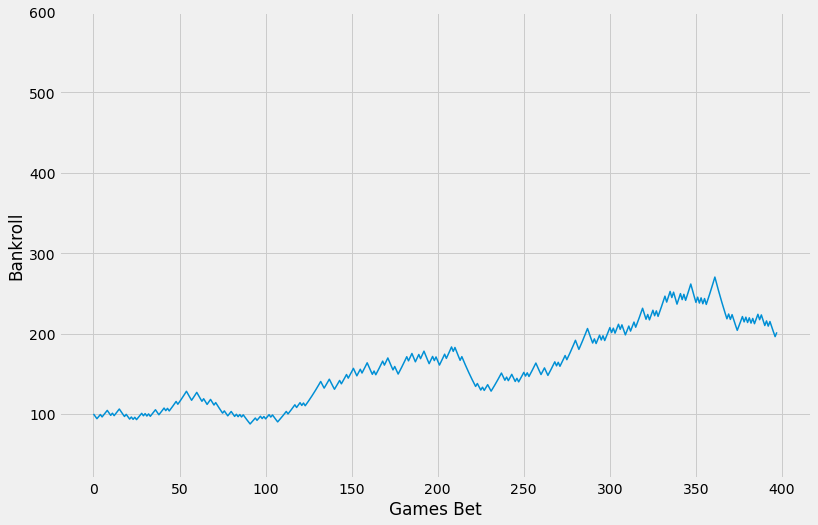

min balance: 87.55338166312133 
max balance: 270.16376403022326 
final balance: 195.42386716380562 
win percentage 56.03 
profit: 95.42386716380531 risk: 1885.5163799674986 
ROI: 5.06
2
test set 1: 2017-10-28 - 2019-06-13
test set 2: 2019-11-01 - 2020-10-11
best threshold for testset 1: 0.577
num_games_bet at threshold: 520
win percetange at threshold: 0.551923076923077
test1_acc: 0.5097591362126246
test2_acc: 0.5064741035856574
win_percentage at  0.577 : 0.5241935483870968 ...Games Bet: 124


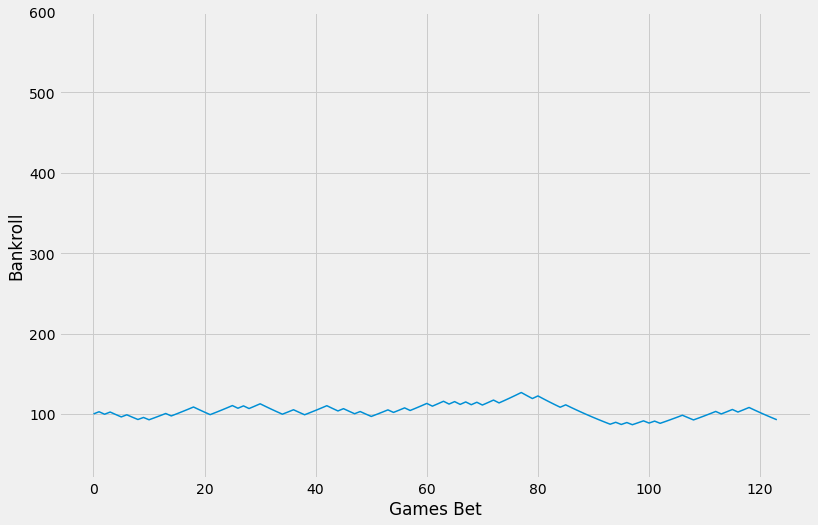

min balance: 86.62542985929105 
max balance: 126.63525264681529 
final balance: 95.30300900445492 
win percentage 52.42 
profit: -4.696990995545065 risk: 385.17936369761986 
ROI: -1.22
3
test set 1: 2018-10-26 - 2020-10-11
test set 2: 2021-01-01 - 2021-07-20
best threshold for testset 1: 0.55
num_games_bet at threshold: 863
win percetange at threshold: 0.541135573580533
test1_acc: 0.5108254397834912
test2_acc: 0.4961427193828351
win_percentage at  0.55 : 0.5238095238095238 ...Games Bet: 294


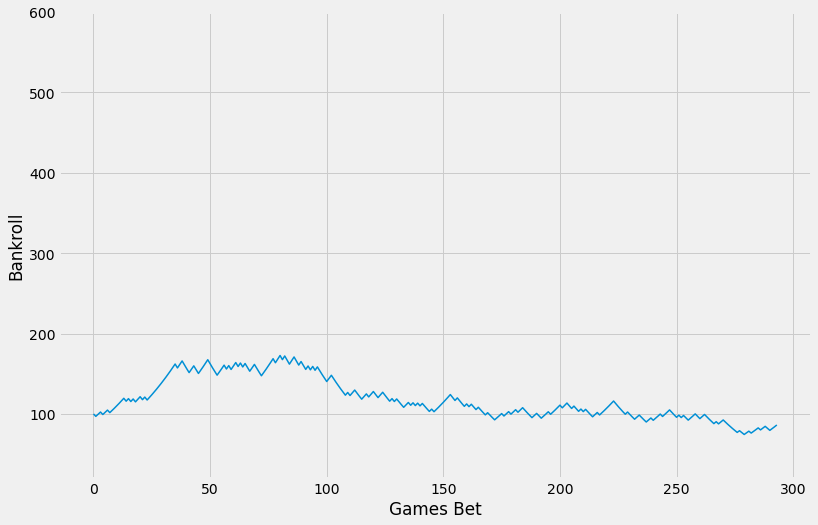

min balance: 74.47650716713324 
max balance: 172.69031924465475 
final balance: 88.64404782013928 
win percentage 52.38 
profit: -11.355952179860651 risk: 1042.4027481431876 
ROI: -1.09

 Pipeline(steps=[('scaler', StandardScaler()),
                ('sgd',
                 SGDClassifier(alpha=0.09549044557518077, loss='modified_huber',
                               max_iter=10000, random_state=23))])
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2017, -, 2018)           0.569  0.528529            333 -0.004375   
1  (2018, -, 2019)           0.553  0.560302            398  0.050609   
2  (2019, -, 2020)           0.577  0.524194            124 -0.012194   
3  (2021, -, 2021)           0.550  0.523810            294 -0.010894   

     profits  
0  -4.532457  
1  95.423867  
2  -4.696991  
3 -11.355952  
0
test set 1: 2015-11-05 - 2017-06-12
test set 2: 2017-10-28 - 2018-06-08
best threshold for testset 1: 0.702
num_games_bet at threshold: 297
win perceta

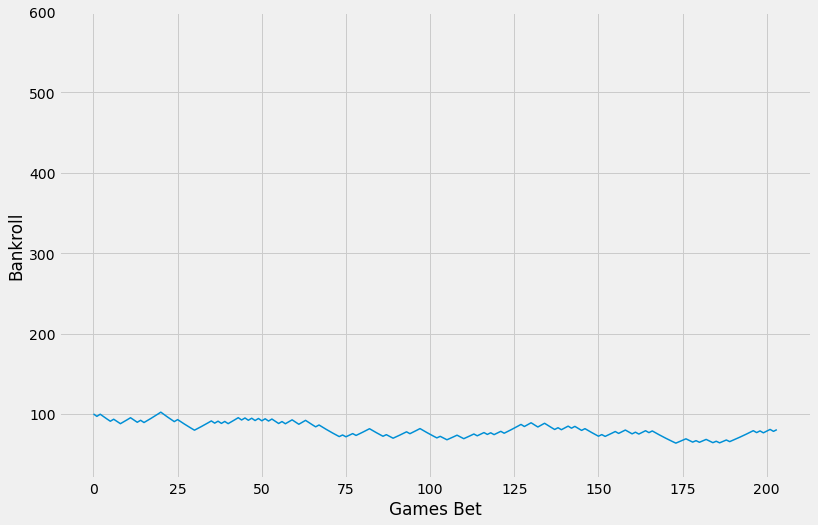

min balance: 63.72180203223101 
max balance: 102.20895546041973 
final balance: 78.0714584437557 
win percentage 50.980000000000004 
profit: -21.928541556244255 risk: 494.21562090366257 
ROI: -4.44
1
test set 1: 2016-11-04 - 2018-06-08
test set 2: 2018-10-26 - 2019-06-13
best threshold for testset 1: 0.692
num_games_bet at threshold: 417
win percetange at threshold: 0.5467625899280576
test1_acc: 0.5149812734082397
test2_acc: 0.5169002473206925
win_percentage at  0.692 : 0.5534883720930233 ...Games Bet: 215


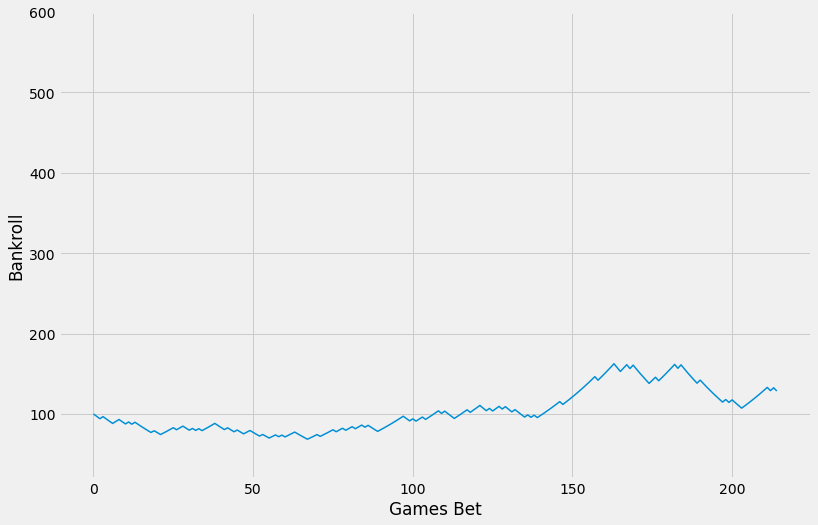

min balance: 68.5824338933608 
max balance: 162.41456414798938 
final balance: 132.03580884519 
win percentage 55.35 
profit: 32.03580884518988 risk: 667.9996663647046 
ROI: 4.8
2
test set 1: 2017-10-28 - 2019-06-13
test set 2: 2019-11-01 - 2020-10-11
best threshold for testset 1: 0.638
num_games_bet at threshold: 894
win percetange at threshold: 0.5380313199105146
test1_acc: 0.507890365448505
test2_acc: 0.49850597609561753
win_percentage at  0.638 : 0.5457063711911357 ...Games Bet: 361


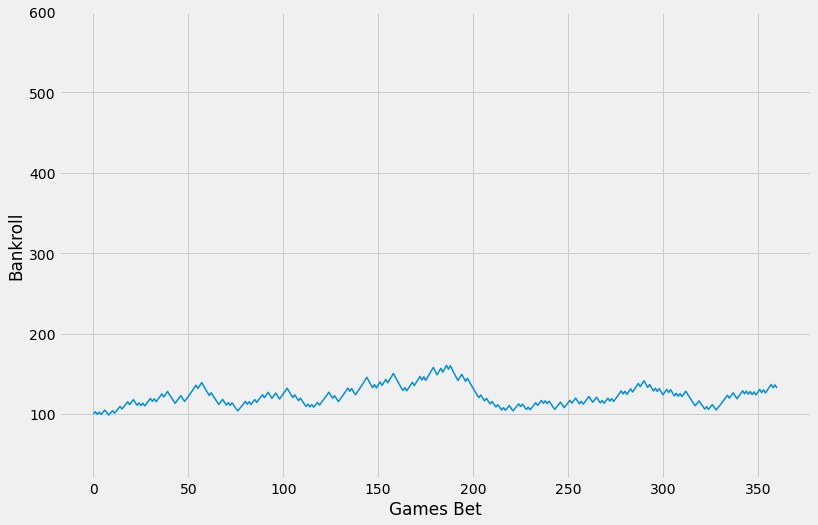

min balance: 98.58934251948257 
max balance: 160.45126588684585 
final balance: 135.724674793717 
win percentage 54.56999999999999 
profit: 35.7246747937171 risk: 1327.016649574885 
ROI: 2.69
3
test set 1: 2018-10-26 - 2020-10-11
test set 2: 2021-01-01 - 2021-07-20
best threshold for testset 1: 0.627
num_games_bet at threshold: 901
win percetange at threshold: 0.5382907880133185
test1_acc: 0.5065403698691926
test2_acc: 0.502410800385728
win_percentage at  0.627 : 0.5191082802547771 ...Games Bet: 314


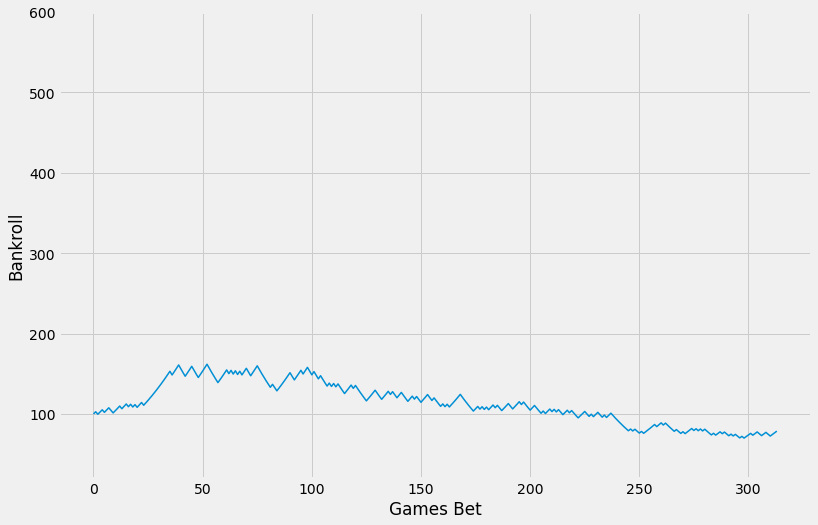

min balance: 69.96945131779627 
max balance: 161.82106234698716 
final balance: 80.78123365003549 
win percentage 51.910000000000004 
profit: -19.218766349964653 risk: 1068.4022361396849 
ROI: -1.7999999999999998

 Pipeline(steps=[('scaler', StandardScaler()),
                ('svc',
                 LinearSVC(C=0.004037017258596553, loss='hinge',
                           max_iter=100000, random_state=23))])
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2017, -, 2018)           0.702  0.509804            204 -0.044370   
1  (2018, -, 2019)           0.692  0.553488            215  0.047958   
2  (2019, -, 2020)           0.638  0.545706            361  0.026921   
3  (2021, -, 2021)           0.627  0.519108            314 -0.017988   

     profits  
0 -21.928542  
1  32.035809  
2  35.724675  
3 -19.218766  
0
test set 1: 2015-11-05 - 2017-06-12
test set 2: 2017-10-28 - 2018-06-08
best threshold for testset 1: 0.54
num_games_bet at threshold: 446
win 

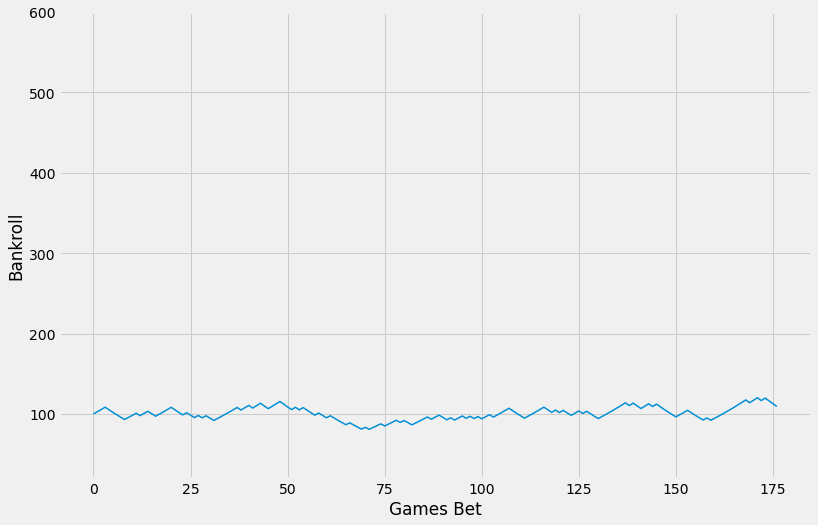

min balance: 80.88536524105774 
max balance: 120.19456251987634 
final balance: 112.29056700473217 
win percentage 54.24 
profit: 12.290567004732168 risk: 534.5744697545181 
ROI: 2.3
1
test set 1: 2016-11-04 - 2018-06-08
test set 2: 2018-10-26 - 2019-06-13
best threshold for testset 1: 0.539
num_games_bet at threshold: 353
win percetange at threshold: 0.5694050991501416
test1_acc: 0.5199750312109863
test2_acc: 0.5243198680956307
win_percentage at  0.539 : 0.5469613259668509 ...Games Bet: 181


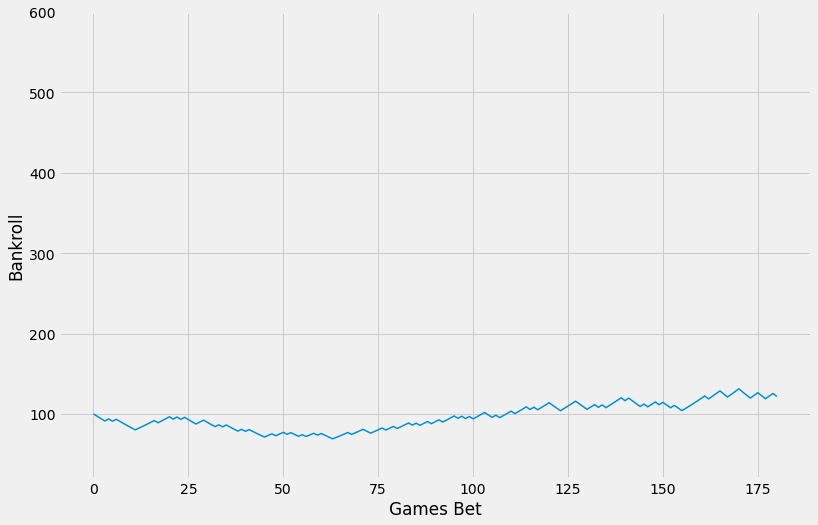

min balance: 69.07134427246105 
max balance: 131.22818157417967 
final balance: 118.07889601175368 
win percentage 54.7 
profit: 18.0788960117537 risk: 524.9747948518077 
ROI: 3.44
2
test set 1: 2017-10-28 - 2019-06-13
test set 2: 2019-11-01 - 2020-10-11
best threshold for testset 1: 0.538
num_games_bet at threshold: 416
win percetange at threshold: 0.5673076923076923
test1_acc: 0.5195182724252492
test2_acc: 0.5069721115537849
win_percentage at  0.538 : 0.42105263157894735 ...Games Bet: 133


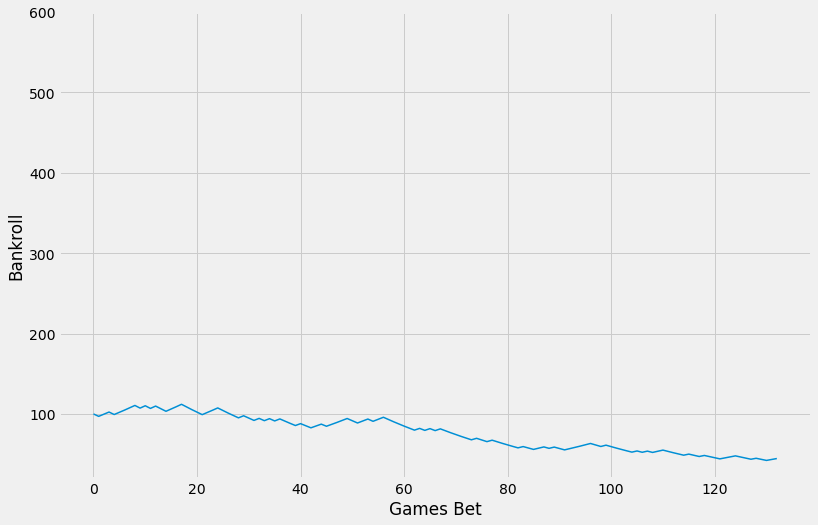

min balance: 42.23599733414349 
max balance: 111.98858239524968 
final balance: 43.23405838519734 
win percentage 42.11 
profit: -56.765941614802585 risk: 303.8060163246166 
ROI: -18.68
3
test set 1: 2018-10-26 - 2020-10-11
test set 2: 2021-01-01 - 2021-07-20
best threshold for testset 1: 0.5609999999999999
num_games_bet at threshold: 46
win percetange at threshold: 0.6086956521739131
test1_acc: 0.5164636896707262
test2_acc: 0.4922854387656702
win_percentage at  0.5609999999999999 : 0.3333333333333333 ...Games Bet: 6


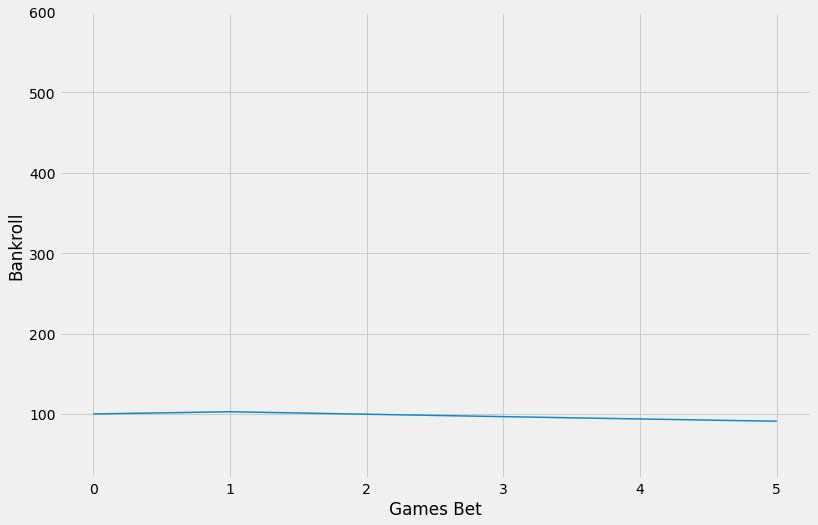

min balance: 90.94371593636365 
max balance: 102.72727272727273 
final balance: 93.42399909826447 
win percentage 33.33 
profit: -6.576000901735539 risk: 17.511868269 
ROI: -37.55

 LGBMClassifier(max_depth=3, min_child_weight=1, num_leaves=2,
               objective='binary', reg_alpha=10.0, reg_lambda=12, subsample=0.6,
               subsample_freq=1)
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2017, -, 2018)           0.540  0.542373            177  0.022991   
1  (2018, -, 2019)           0.539  0.546961            181  0.034438   
2  (2019, -, 2020)           0.538  0.421053            133 -0.186849   
3  (2021, -, 2021)           0.561  0.333333              6 -0.375517   

     profits  
0  12.290567  
1  18.078896  
2 -56.765942  
3  -6.576001  
0
test set 1: 2015-11-05 - 2017-06-12
test set 2: 2017-10-28 - 2018-06-08
best threshold for testset 1: 0.518
num_games_bet at threshold: 709
win percetange at threshold: 0.5444287729196051
test1_acc: 

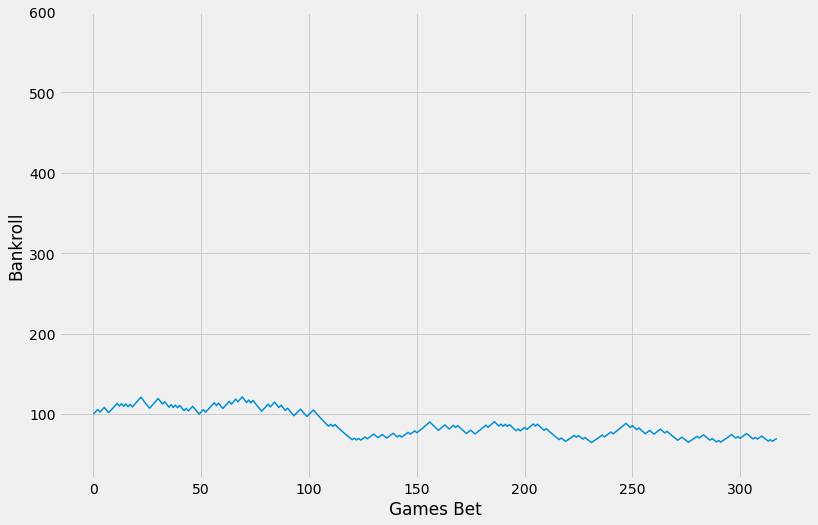

min balance: 64.47381700974178 
max balance: 121.28598699361206 
final balance: 67.52792333684778 
win percentage 50.94 
profit: -32.472076663152336 risk: 831.1527621573516 
ROI: -3.91
1
test set 1: 2016-11-04 - 2018-06-08
test set 2: 2018-10-26 - 2019-06-13
best threshold for testset 1: 0.516
num_games_bet at threshold: 801
win percetange at threshold: 0.5543071161048689
test1_acc: 0.5137328339575531
test2_acc: 0.5136026380873866
win_percentage at  0.516 : 0.56282722513089 ...Games Bet: 382


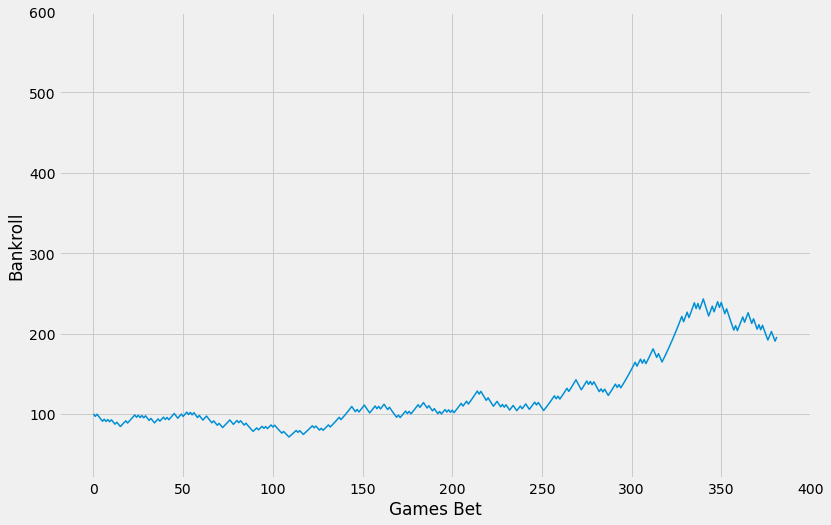

min balance: 71.39179245987737 
max balance: 242.96200679902773 
final balance: 201.05628903931068 
win percentage 56.279999999999994 
profit: 101.0562890393104 risk: 1428.4135664731832 
ROI: 7.07
2
test set 1: 2017-10-28 - 2019-06-13
test set 2: 2019-11-01 - 2020-10-11
best threshold for testset 1: 0.515
num_games_bet at threshold: 880
win percetange at threshold: 0.5409090909090909
test1_acc: 0.5128737541528239
test2_acc: 0.49302788844621515
win_percentage at  0.515 : 0.48297213622291024 ...Games Bet: 323


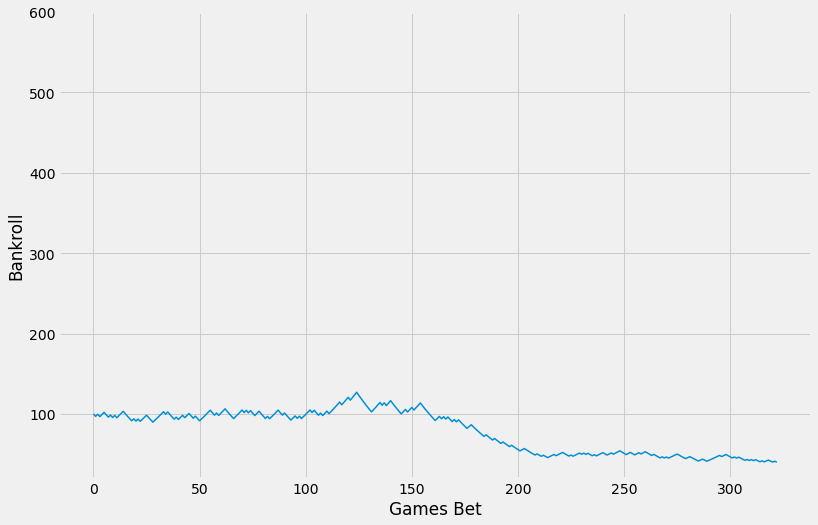

min balance: 40.010332714976755 
max balance: 126.96287059683065 
final balance: 41.1015236072034 
win percentage 48.3 
profit: -58.89847639279674 risk: 760.8219731524454 
ROI: -7.739999999999999
3
test set 1: 2018-10-26 - 2020-10-11
test set 2: 2021-01-01 - 2021-07-20
best threshold for testset 1: 0.518
num_games_bet at threshold: 548
win percetange at threshold: 0.5529197080291971
test1_acc: 0.509021199819576
test2_acc: 0.48553519768563164
win_percentage at  0.518 : 0.485 ...Games Bet: 200


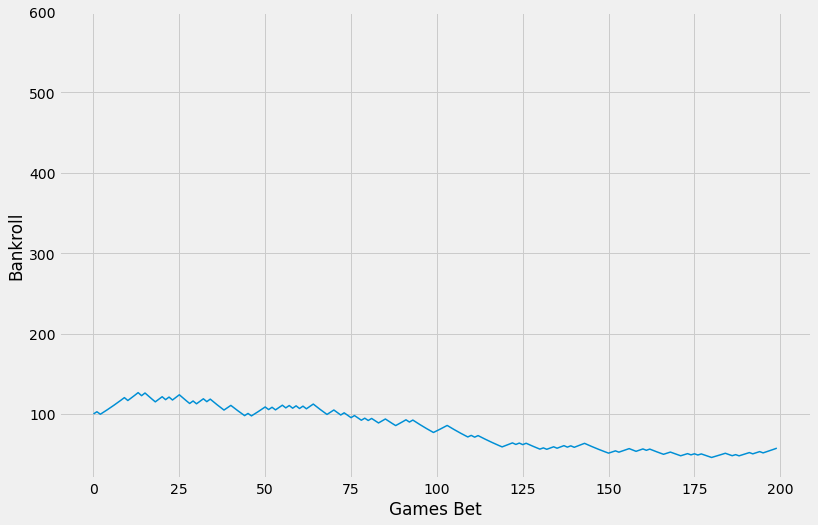

min balance: 45.90522715341133 
max balance: 126.49891779336798 
final balance: 59.0210847256213 
win percentage 48.5 
profit: -40.97891527437869 risk: 490.7439699274223 
ROI: -8.35

 RandomForestClassifier(max_depth=18, min_samples_leaf=0.05,
                       min_samples_split=0.01, random_state=23)
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2017, -, 2018)           0.518  0.509434            318 -0.039069   
1  (2018, -, 2019)           0.516  0.562827            382  0.070747   
2  (2019, -, 2020)           0.515  0.482972            323 -0.077414   
3  (2021, -, 2021)           0.518  0.485000            200 -0.083504   

      profits  
0  -32.472077  
1  101.056289  
2  -58.898476  
3  -40.978915  
0
test set 1: 2015-11-05 - 2017-06-12
test set 2: 2017-10-28 - 2018-06-08
no best threshold
The except block executed
test1_acc: 0.4937655860349127
test2_acc: 0.505020920502092
win_percentage at  0.5 : 0.50355871886121 ...Games Bet: 1124


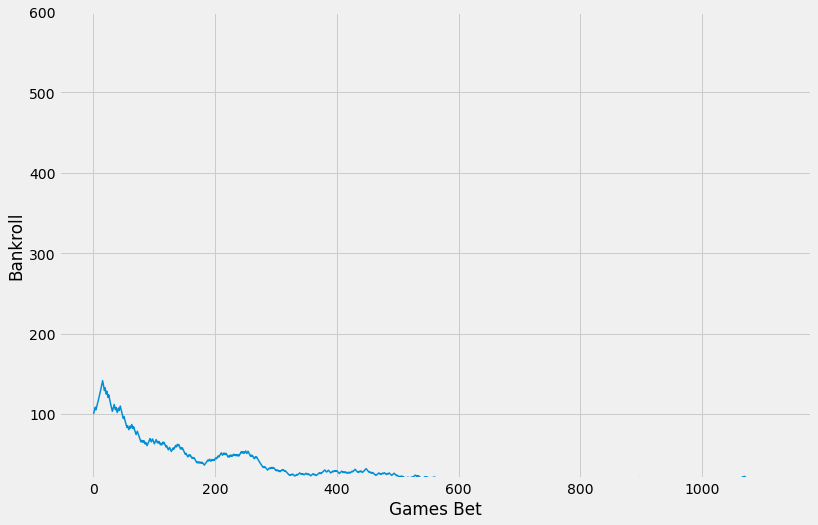

min balance: 12.546373145165111 
max balance: 141.37491304677306 
final balance: 17.09097868807517 
win percentage 50.36000000000001 
profit: -82.9090213119249 risk: 1041.165328336341 
ROI: -7.960000000000001
1
test set 1: 2016-11-04 - 2018-06-08
test set 2: 2018-10-26 - 2019-06-13
no best threshold
The except block executed
test1_acc: 0.5168539325842697
test2_acc: 0.5156636438582028
win_percentage at  0.5 : 0.5211024978466839 ...Games Bet: 1161


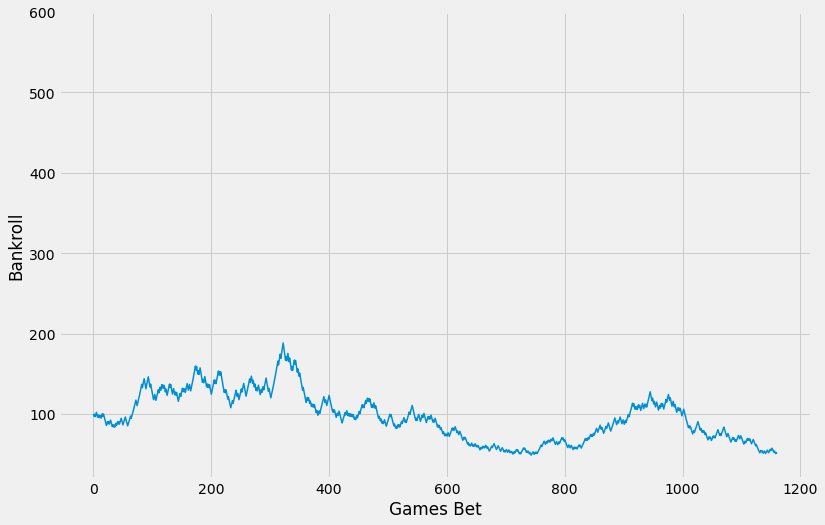

min balance: 48.815276134630494 
max balance: 188.30021351198806 
final balance: 51.87618600540782 
win percentage 52.11 
profit: -48.12381399459173 risk: 3356.777778929787 
ROI: -1.43
2
test set 1: 2017-10-28 - 2019-06-13
test set 2: 2019-11-01 - 2020-10-11
best threshold for testset 1: 0.61
num_games_bet at threshold: 296
win percetange at threshold: 0.5304054054054054
test1_acc: 0.5091362126245847
test2_acc: 0.5034860557768924
win_percentage at  0.61 : 0.5118110236220472 ...Games Bet: 127


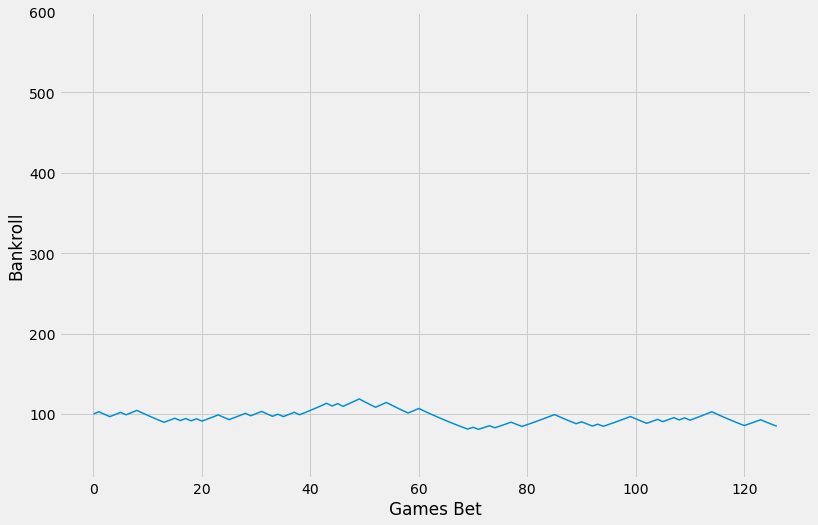

min balance: 80.88536524105771 
max balance: 118.66473583186152 
final balance: 86.98048313712292 
win percentage 51.18000000000001 
profit: -13.019516862877055 risk: 366.1283722544202 
ROI: -3.56
3
test set 1: 2018-10-26 - 2020-10-11
test set 2: 2021-01-01 - 2021-07-20
best threshold for testset 1: 0.574
num_games_bet at threshold: 693
win percetange at threshold: 0.5468975468975469
test1_acc: 0.516914749661705
test2_acc: 0.5429122468659595
win_percentage at  0.574 : 0.5303514376996805 ...Games Bet: 313


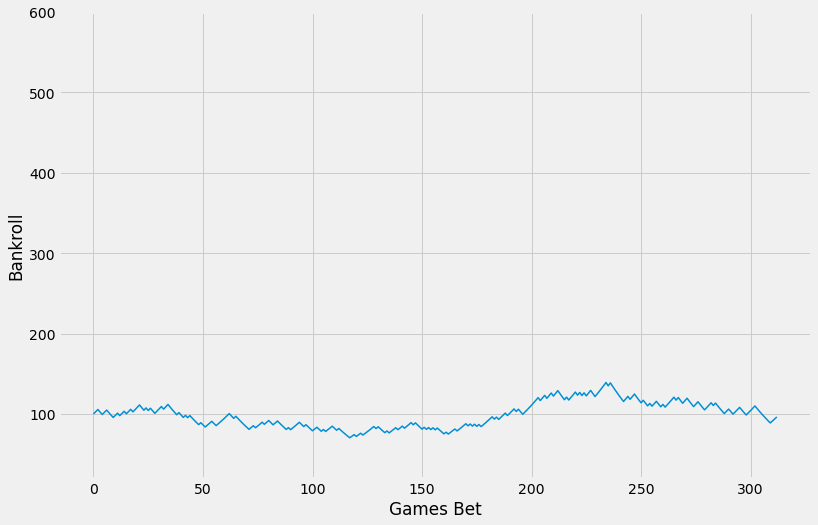

min balance: 70.38469879906668 
max balance: 139.12620727256214 
final balance: 98.91925095983868 
win percentage 53.04 
profit: -1.0807490401614928 risk: 928.2932021837073 
ROI: -0.12

 Pipeline(steps=[('scaler', StandardScaler()),
                ('knn', KNeighborsClassifier(n_neighbors=41))])
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2017, -, 2018)           0.500  0.503559           1124 -0.079631   
1  (2018, -, 2019)           0.500  0.521102           1161 -0.014336   
2  (2019, -, 2020)           0.610  0.511811            127 -0.035560   
3  (2021, -, 2021)           0.574  0.530351            313 -0.001164   

     profits  
0 -82.909021  
1 -48.123814  
2 -13.019517  
3  -1.080749  
0
test set 1: 2015-11-05 - 2017-06-12
test set 2: 2017-10-28 - 2018-06-08
best threshold for testset 1: 0.527
num_games_bet at threshold: 1151
win percetange at threshold: 0.5412684622067767
test1_acc: 0.5112219451371571
test2_acc: 0.49665271966527197
win_percen

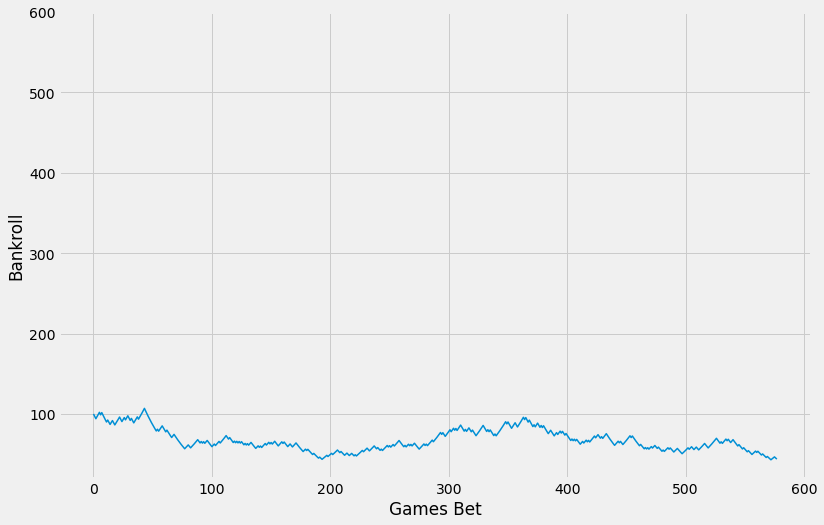

min balance: 42.555669865673174 
max balance: 106.93531445556702 
final balance: 42.555669865673174 
win percentage 50.519999999999996 
profit: -57.44433013432683 risk: 1173.0262112895875 
ROI: -4.9
1
test set 1: 2016-11-04 - 2018-06-08
test set 2: 2018-10-26 - 2019-06-13
best threshold for testset 1: 0.548
num_games_bet at threshold: 469
win percetange at threshold: 0.5458422174840085
test1_acc: 0.5072825634623388
test2_acc: 0.5115416323165705
win_percentage at  0.548 : 0.573170731707317 ...Games Bet: 164


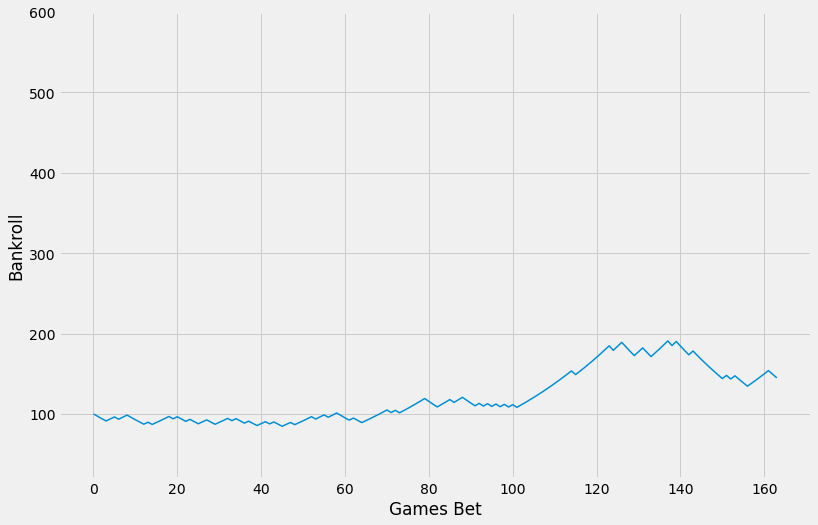

min balance: 84.70763317044216 
max balance: 190.76803901366384 
final balance: 148.75880508630758 
win percentage 57.32000000000001 
profit: 48.75880508630752 risk: 595.4079909598227 
ROI: 8.19
2
test set 1: 2017-10-28 - 2019-06-13
test set 2: 2019-11-01 - 2020-10-11
best threshold for testset 1: 0.5640000000000001
num_games_bet at threshold: 233
win percetange at threshold: 0.5665236051502146
test1_acc: 0.5147425249169435
test2_acc: 0.48356573705179284
win_percentage at  0.5640000000000001 : 0.4878048780487805 ...Games Bet: 41


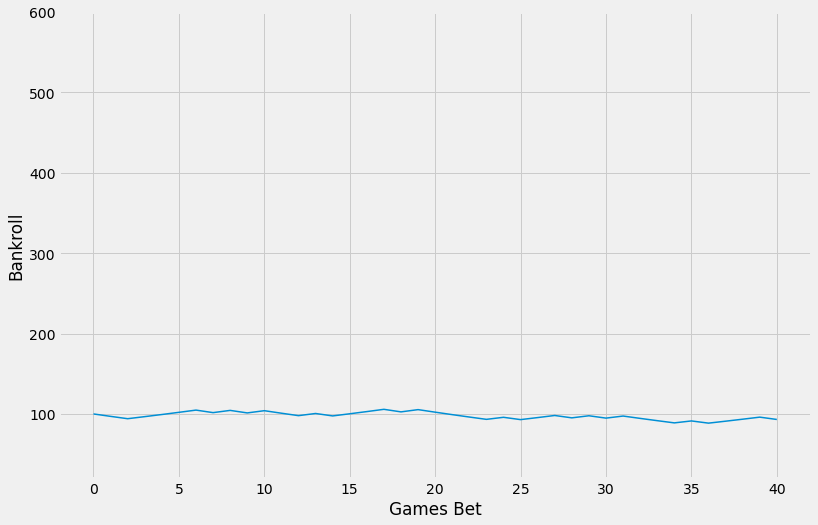

min balance: 88.57697459488331 
max balance: 105.74497116436413 
final balance: 90.3486330301519 
win percentage 48.78 
profit: -9.65136696984814 risk: 120.17207497615294 
ROI: -8.03
3
test set 1: 2018-10-26 - 2020-10-11
test set 2: 2021-01-01 - 2021-07-20
best threshold for testset 1: 0.53
num_games_bet at threshold: 855
win percetange at threshold: 0.5391812865497077
test1_acc: 0.5092467298150654
test2_acc: 0.503857280617165
win_percentage at  0.53 : 0.5570776255707762 ...Games Bet: 219


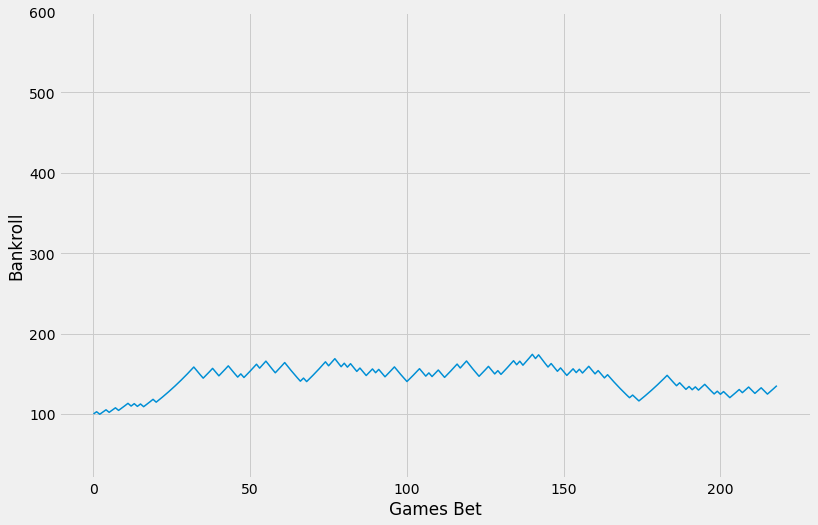

min balance: 99.64545454545456 
max balance: 174.1088384707176 
final balance: 138.84196115780554 
win percentage 55.71 
profit: 38.84196115780537 risk: 941.7885006473517 
ROI: 4.12

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('logreg',
                                                 LogisticRegression(C=0.0027825594022071257,
                                                                    max_iter=10000,
                                                                    verbose=1))])),
                               ('sgd_huber',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('sgd',
                                                 SGDClassifier(alpha=0.09549044557518077,
                                                               loss='modified_huber',
                        

In [301]:
cutoffs = [cutoff_15, cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21]



for estimator in estimator_list:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-3):
        X_train1, X_test, y_train1, y_test, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])
        X_test1, y_test1, test_idx1 = (X_test.loc[:cutoffs[i+2]], 
                                       y_test.loc[:cutoffs[i+2]], 
                                       X_test.loc[:cutoffs[i+2]].index)
        X_test2, y_test2, test_idx2 = (X_test.loc[cutoffs[i+2]+1:cutoffs[i+3]],
                                       y_test.loc[cutoffs[i+2]+1:cutoffs[i+3]],
                                       X_test.loc[cutoffs[i+2]+1:cutoffs[i+3]].index)

        X_train2 = pd.concat([X_train1, X_test1])
        y_train2 = pd.concat([y_train1, y_test1])

        print(i)
        print("test set 1:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='D'))
        print("test set 2:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx2, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx2, 'GAME_DATE'].values[-1], unit='D'))

        year = (np.datetime_as_string(df_ewm_19_diffs.loc[test_idx2, 'GAME_DATE'].values[0], unit='Y'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx2, 'GAME_DATE'].values[-1], unit='Y'))


        select_bets, best_threshold = test_model_at_threshold(df_ewm_19_diffs, estimator, X_train1,
                                                              y_train1, X_test1, y_test1, test_idx1,
                                                               X_train2, y_train2, X_test2, y_test2, 
                                                              test_idx2)

        selected_bets, roi, profit, win_pct = simulate_bets_2(select_bets, 0.03)

        season.append(year)
        best_thresholds.append(best_threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)

    print(results_by_season)

### Betting Strat 3 (bet size based on confidence)

0
test set 1: 2016-11-04 - 2018-06-08
test set 2: 2018-10-26 - 2019-06-13


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


best threshold for testset 1: 0.574
num_games_bet at threshold: 305
win percetange at threshold: 0.5573770491803278
test1_acc: 0.5091552226383687


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


test2_acc: 0.5148392415498764
win_percentage at  0.574 : 0.5474452554744526 ...Games Bet: 137


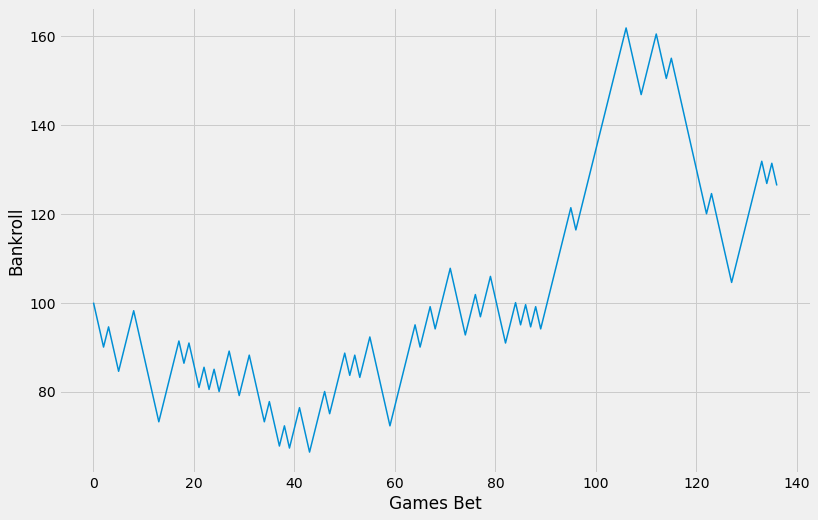

min balance: 66.36363636363639 
max balance: 161.81818181818178 
final balance: 130.9090909090908 
win percentage 54.74 
profit: 30.909090909090878 risk: 685.0 
ROI: 4.51
1
test set 1: 2017-10-28 - 2019-06-13
test set 2: 2019-11-01 - 2020-10-11


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


best threshold for testset 1: 0.582
num_games_bet at threshold: 268
win percetange at threshold: 0.5671641791044776
test1_acc: 0.5085132890365448


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished


test2_acc: 0.5049800796812749
win_percentage at  0.582 : 0.5142857142857142 ...Games Bet: 70


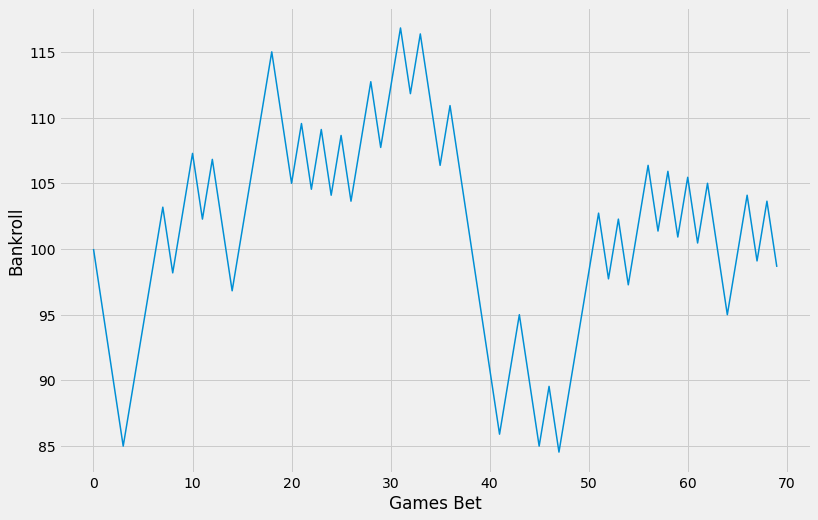

min balance: 84.54545454545458 
max balance: 116.81818181818184 
final balance: 93.63636363636368 
win percentage 51.43 
profit: -6.363636363636374 risk: 350.0 
ROI: -1.82
2
test set 1: 2018-10-26 - 2020-10-11
test set 2: 2021-01-01 - 2021-07-20


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished


best threshold for testset 1: 0.541
num_games_bet at threshold: 910
win percetange at threshold: 0.5395604395604395
test1_acc: 0.5047361299052774


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished


test2_acc: 0.5053037608486017
win_percentage at  0.541 : 0.528169014084507 ...Games Bet: 284


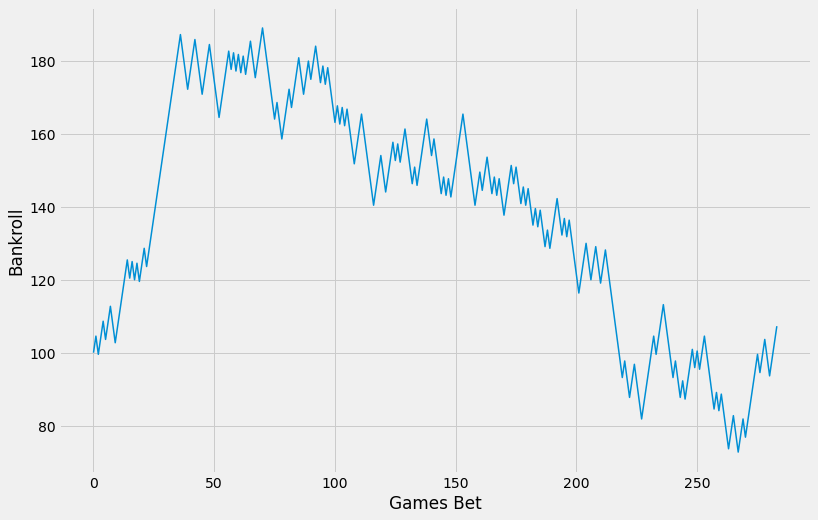

min balance: 72.72727272727157 
max balance: 189.0909090909087 
final balance: 111.81818181818068 
win percentage 52.82 
profit: 11.818181818181756 risk: 1420.0 
ROI: 0.83

 Pipeline(steps=[('scaler', StandardScaler()),
                ('logreg',
                 LogisticRegression(C=0.0027825594022071257, max_iter=10000,
                                    verbose=1))])
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2018, -, 2019)           0.574  0.547445            137  0.045123   
1  (2019, -, 2020)           0.582  0.514286             70 -0.018182   
2  (2021, -, 2021)           0.541  0.528169            284  0.008323   

     profits  
0  30.909091  
1  -6.363636  
2  11.818182  
0
test set 1: 2016-11-04 - 2018-06-08
test set 2: 2018-10-26 - 2019-06-13
best threshold for testset 1: 0.553
num_games_bet at threshold: 800
win percetange at threshold: 0.54125
test1_acc: 0.5222638368705784
test2_acc: 0.5057708161582852
win_percentage at  0.553 : 0.56030

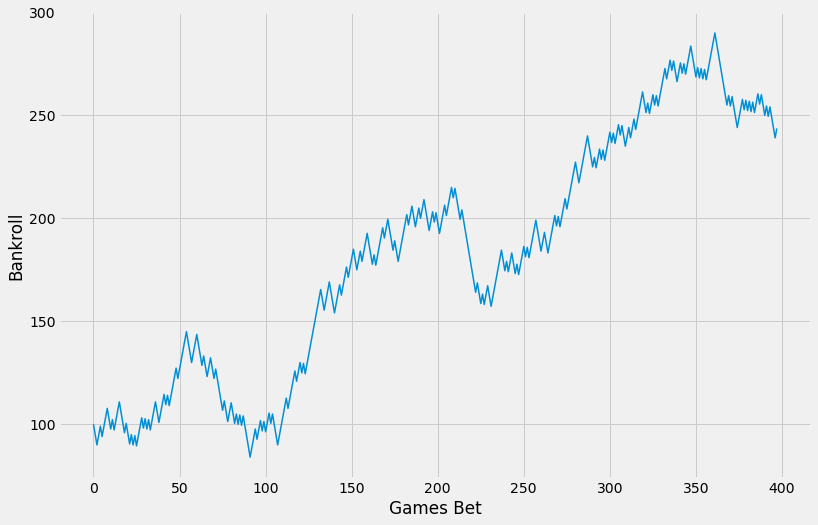

min balance: 84.09090909090905 
max balance: 289.9999999999988 
final balance: 238.63636363636246 
win percentage 56.03 
profit: 138.6363636363635 risk: 1990.0 
ROI: 6.97
1
test set 1: 2017-10-28 - 2019-06-13
test set 2: 2019-11-01 - 2020-10-11
best threshold for testset 1: 0.577
num_games_bet at threshold: 520
win percetange at threshold: 0.551923076923077
test1_acc: 0.5097591362126246
test2_acc: 0.5064741035856574
win_percentage at  0.577 : 0.5241935483870968 ...Games Bet: 124


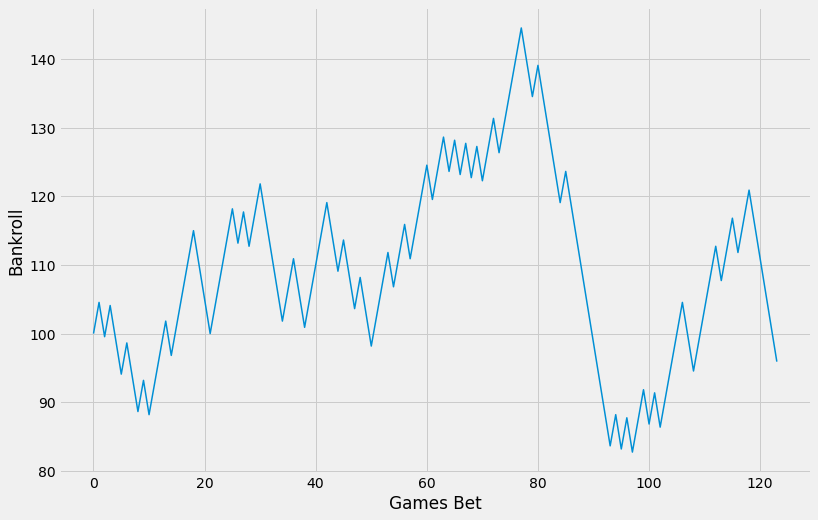

min balance: 82.7272727272727 
max balance: 144.54545454545453 
final balance: 100.45454545454545 
win percentage 52.42 
profit: 0.45454545454543904 risk: 620.0 
ROI: 0.06999999999999999
2
test set 1: 2018-10-26 - 2020-10-11
test set 2: 2021-01-01 - 2021-07-20
best threshold for testset 1: 0.55
num_games_bet at threshold: 863
win percetange at threshold: 0.541135573580533
test1_acc: 0.5108254397834912
test2_acc: 0.4961427193828351
win_percentage at  0.55 : 0.5238095238095238 ...Games Bet: 294


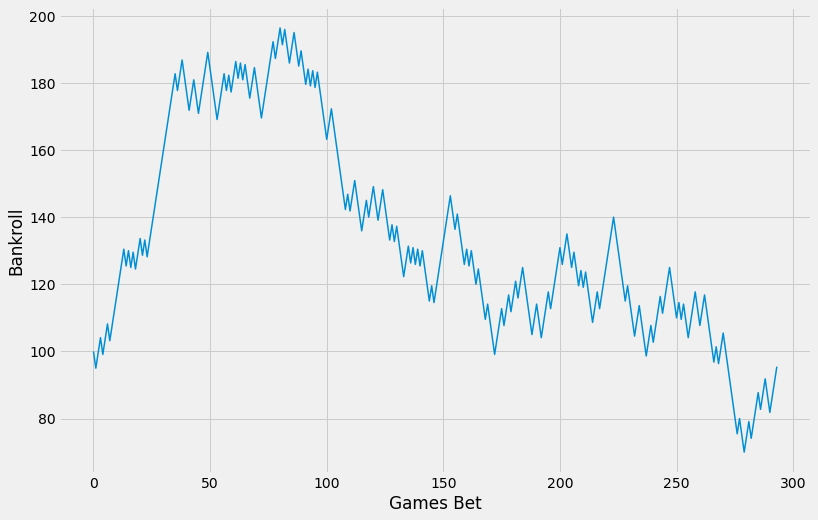

min balance: 69.99999999999909 
max balance: 196.36363636363583 
final balance: 99.9999999999991 
win percentage 52.38 
profit: 0.0 risk: 1470.0 
ROI: 0.0

 Pipeline(steps=[('scaler', StandardScaler()),
                ('sgd',
                 SGDClassifier(alpha=0.09549044557518077, loss='modified_huber',
                               max_iter=10000, random_state=23))])
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2018, -, 2019)           0.553  0.560302            398  0.069667   
1  (2019, -, 2020)           0.577  0.524194            124  0.000733   
2  (2021, -, 2021)           0.550  0.523810            294  0.000000   

      profits  
0  138.636364  
1    0.454545  
2    0.000000  
0
test set 1: 2016-11-04 - 2018-06-08
test set 2: 2018-10-26 - 2019-06-13
best threshold for testset 1: 0.692
num_games_bet at threshold: 417
win percetange at threshold: 0.5467625899280576
test1_acc: 0.5149812734082397
test2_acc: 0.5169002473206925
win_percentage at 

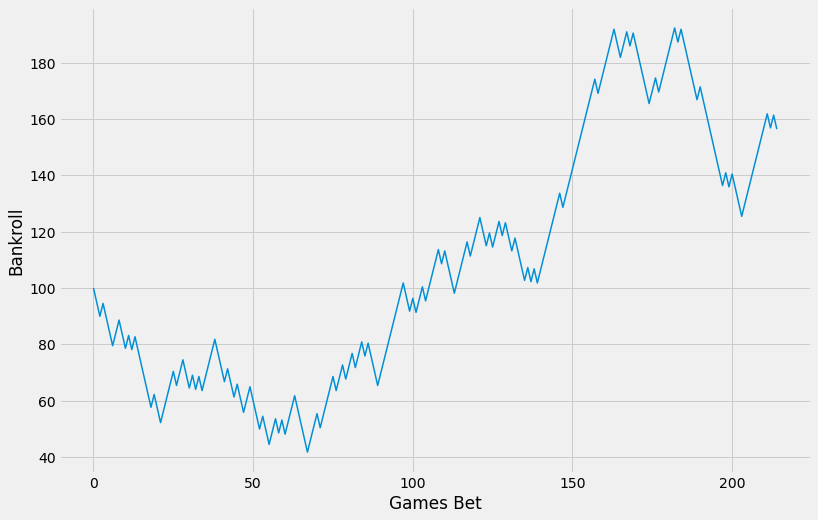

min balance: 41.818181818181856 
max balance: 192.27272727272702 
final balance: 160.90909090909048 
win percentage 55.35 
profit: 60.90909090909088 risk: 1075.0 
ROI: 5.67
1
test set 1: 2017-10-28 - 2019-06-13
test set 2: 2019-11-01 - 2020-10-11
best threshold for testset 1: 0.638
num_games_bet at threshold: 894
win percetange at threshold: 0.5380313199105146
test1_acc: 0.507890365448505
test2_acc: 0.49850597609561753
win_percentage at  0.638 : 0.5457063711911357 ...Games Bet: 361


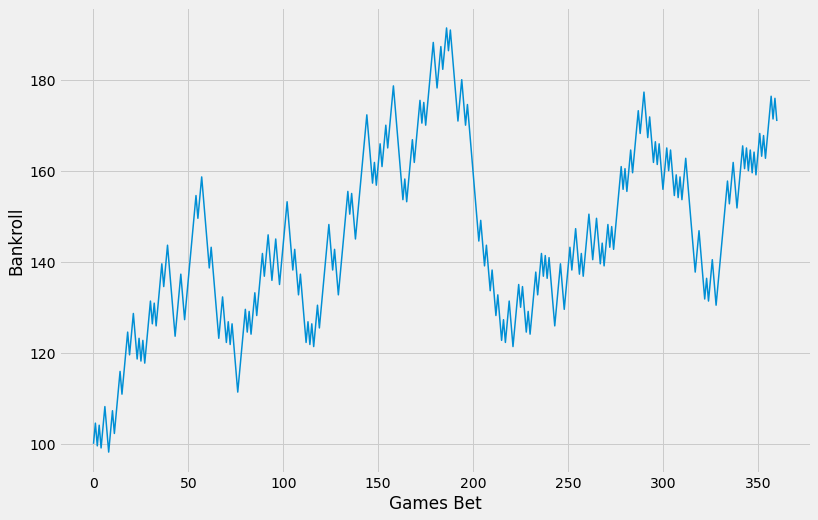

min balance: 98.18181818181819 
max balance: 191.3636363636354 
final balance: 175.4545454545434 
win percentage 54.56999999999999 
profit: 75.45454545454538 risk: 1805.0 
ROI: 4.18
2
test set 1: 2018-10-26 - 2020-10-11
test set 2: 2021-01-01 - 2021-07-20
best threshold for testset 1: 0.627
num_games_bet at threshold: 901
win percetange at threshold: 0.5382907880133185
test1_acc: 0.5065403698691926
test2_acc: 0.502410800385728
win_percentage at  0.627 : 0.5191082802547771 ...Games Bet: 314


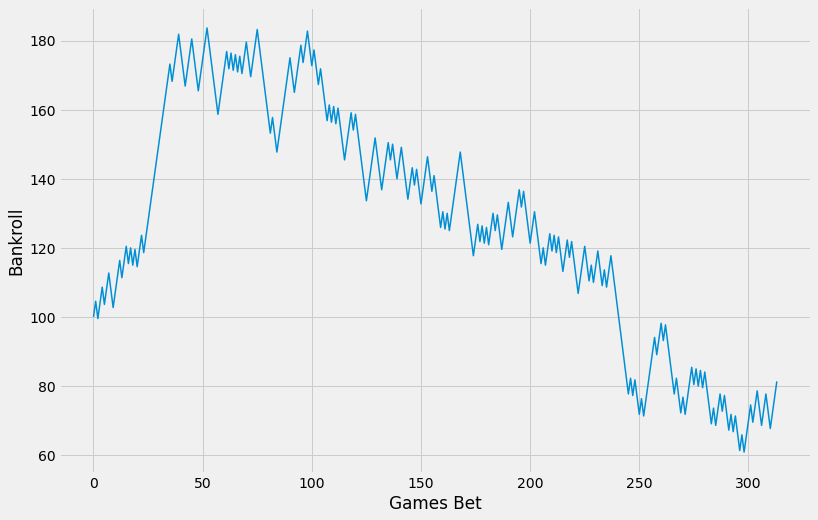

min balance: 60.909090909089954 
max balance: 183.6363636363634 
final balance: 85.90909090908997 
win percentage 51.910000000000004 
profit: -14.090909090909122 risk: 1570.0 
ROI: -0.8999999999999999

 Pipeline(steps=[('scaler', StandardScaler()),
                ('svc',
                 LinearSVC(C=0.004037017258596553, loss='hinge',
                           max_iter=100000, random_state=23))])
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2018, -, 2019)           0.692  0.553488            215  0.056660   
1  (2019, -, 2020)           0.638  0.545706            361  0.041803   
2  (2021, -, 2021)           0.627  0.519108            314 -0.008975   

     profits  
0  60.909091  
1  75.454545  
2 -14.090909  
0
test set 1: 2016-11-04 - 2018-06-08
test set 2: 2018-10-26 - 2019-06-13
best threshold for testset 1: 0.539
num_games_bet at threshold: 353
win percetange at threshold: 0.5694050991501416
test1_acc: 0.5199750312109863
test2_acc: 0.524319868095

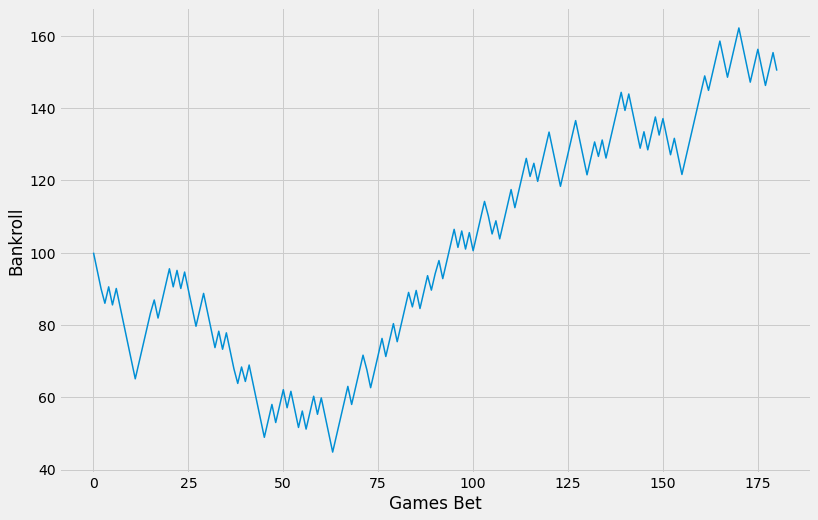

min balance: 44.818181818181856 
max balance: 162.18181818181796 
final balance: 145.3636363636361 
win percentage 54.7 
profit: 45.36363636363632 risk: 892.0 
ROI: 5.09
1
test set 1: 2017-10-28 - 2019-06-13
test set 2: 2019-11-01 - 2020-10-11
best threshold for testset 1: 0.538
num_games_bet at threshold: 416
win percetange at threshold: 0.5673076923076923
test1_acc: 0.5195182724252492
test2_acc: 0.5069721115537849
win_percentage at  0.538 : 0.42105263157894735 ...Games Bet: 133


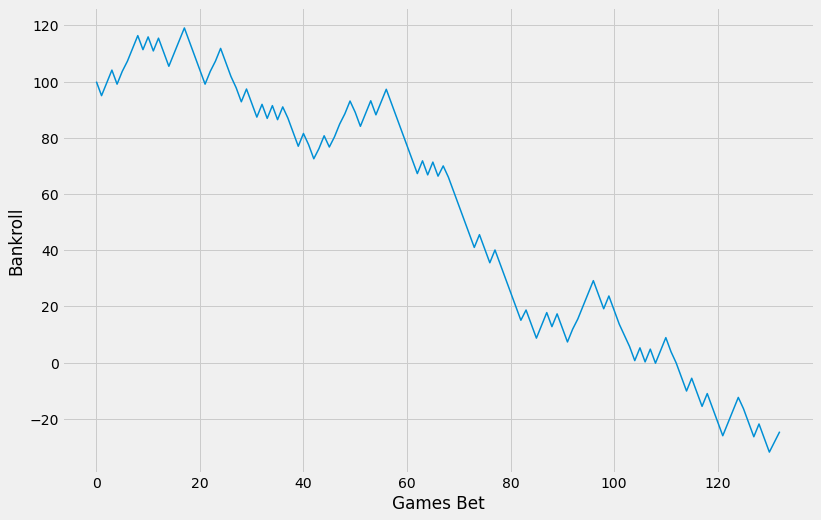

min balance: -31.818181818181756 
max balance: 119.09090909090911 
final balance: -29.545454545454483 
win percentage 42.11 
profit: -129.54545454545456 risk: 645.0 
ROI: -20.080000000000002
2
test set 1: 2018-10-26 - 2020-10-11
test set 2: 2021-01-01 - 2021-07-20
best threshold for testset 1: 0.5609999999999999
num_games_bet at threshold: 46
win percetange at threshold: 0.6086956521739131
test1_acc: 0.5164636896707262
test2_acc: 0.4922854387656702
win_percentage at  0.5609999999999999 : 0.3333333333333333 ...Games Bet: 6


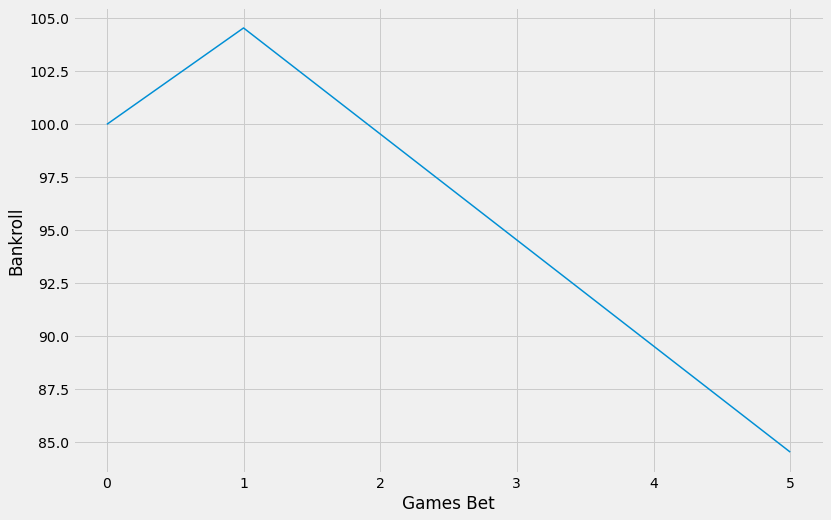

min balance: 84.54545454545455 
max balance: 104.54545454545455 
final balance: 89.0909090909091 
win percentage 33.33 
profit: -10.90909090909091 risk: 30.0 
ROI: -36.36

 LGBMClassifier(max_depth=3, min_child_weight=1, num_leaves=2,
               objective='binary', reg_alpha=10.0, reg_lambda=12, subsample=0.6,
               subsample_freq=1)
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2018, -, 2019)           0.539  0.546961            181  0.050856   
1  (2019, -, 2020)           0.538  0.421053            133 -0.200846   
2  (2021, -, 2021)           0.561  0.333333              6 -0.363636   

      profits  
0   45.363636  
1 -129.545455  
2  -10.909091  
0
test set 1: 2016-11-04 - 2018-06-08
test set 2: 2018-10-26 - 2019-06-13
best threshold for testset 1: 0.516
num_games_bet at threshold: 801
win percetange at threshold: 0.5543071161048689
test1_acc: 0.5137328339575531
test2_acc: 0.5136026380873866
win_percentage at  0.516 : 0.56282722513089 

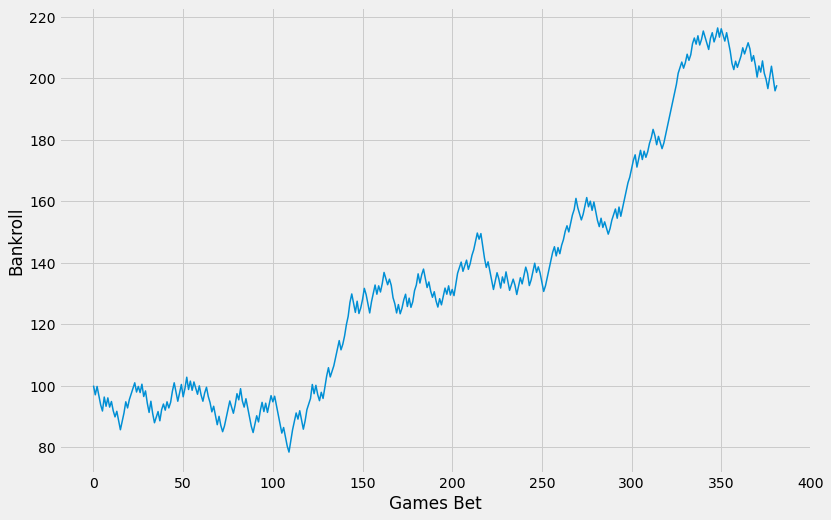

min balance: 78.36363636363649 
max balance: 216.36363636363578 
final balance: 199.54545454545385 
win percentage 56.279999999999994 
profit: 99.5454545454545 risk: 1065.0 
ROI: 9.35
1
test set 1: 2017-10-28 - 2019-06-13
test set 2: 2019-11-01 - 2020-10-11
best threshold for testset 1: 0.515
num_games_bet at threshold: 880
win percetange at threshold: 0.5409090909090909
test1_acc: 0.5128737541528239
test2_acc: 0.49302788844621515
win_percentage at  0.515 : 0.48297213622291024 ...Games Bet: 323


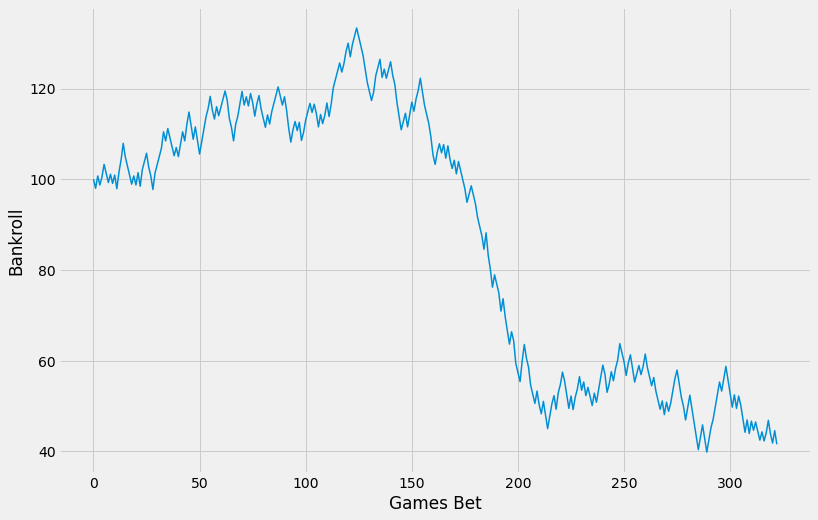

min balance: 39.818181818181834 
max balance: 133.36363636363637 
final balance: 43.36363636363638 
win percentage 48.3 
profit: -56.63636363636368 risk: 847.0 
ROI: -6.69
2
test set 1: 2018-10-26 - 2020-10-11
test set 2: 2021-01-01 - 2021-07-20
best threshold for testset 1: 0.518
num_games_bet at threshold: 548
win percetange at threshold: 0.5529197080291971
test1_acc: 0.509021199819576
test2_acc: 0.48553519768563164
win_percentage at  0.518 : 0.485 ...Games Bet: 200


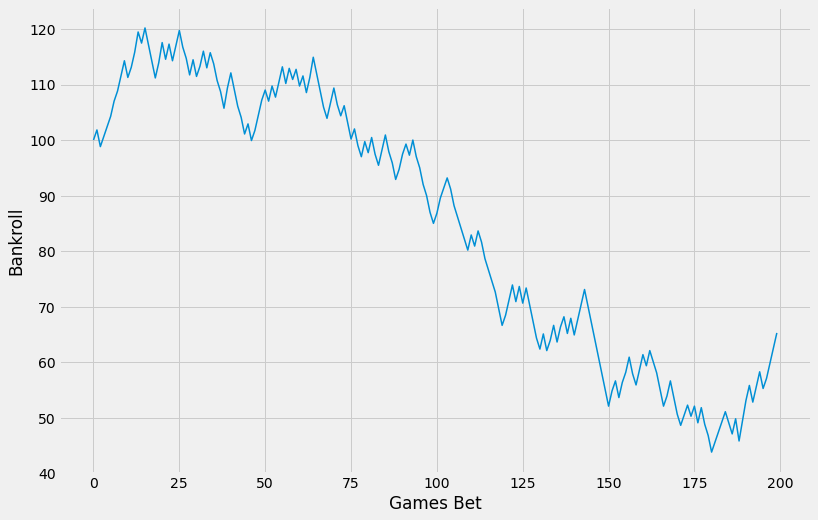

min balance: 43.818181818182 
max balance: 120.18181818181819 
final balance: 68.00000000000018 
win percentage 48.5 
profit: -32.00000000000003 risk: 536.0 
ROI: -5.970000000000001

 RandomForestClassifier(max_depth=18, min_samples_leaf=0.05,
                       min_samples_split=0.01, random_state=23)
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2018, -, 2019)           0.516  0.562827            382  0.093470   
1  (2019, -, 2020)           0.515  0.482972            323 -0.066867   
2  (2021, -, 2021)           0.518  0.485000            200 -0.059701   

     profits  
0  99.545455  
1 -56.636364  
2 -32.000000  
0
test set 1: 2016-11-04 - 2018-06-08
test set 2: 2018-10-26 - 2019-06-13
no best threshold
The except block executed
test1_acc: 0.5168539325842697
test2_acc: 0.5156636438582028
win_percentage at  0.5 : 0.5211024978466839 ...Games Bet: 1161


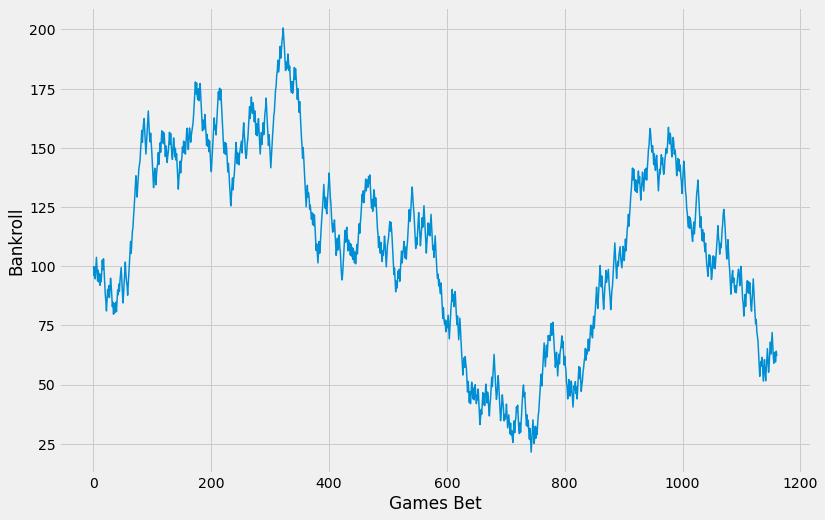

min balance: 21.454545454543855 
max balance: 200.63636363636212 
final balance: 63.909090909088896 
win percentage 52.11 
profit: -36.09090909090946 risk: 4931.0 
ROI: -0.73
1
test set 1: 2017-10-28 - 2019-06-13
test set 2: 2019-11-01 - 2020-10-11
best threshold for testset 1: 0.61
num_games_bet at threshold: 296
win percetange at threshold: 0.5304054054054054
test1_acc: 0.5091362126245847
test2_acc: 0.5034860557768924
win_percentage at  0.61 : 0.5118110236220472 ...Games Bet: 127


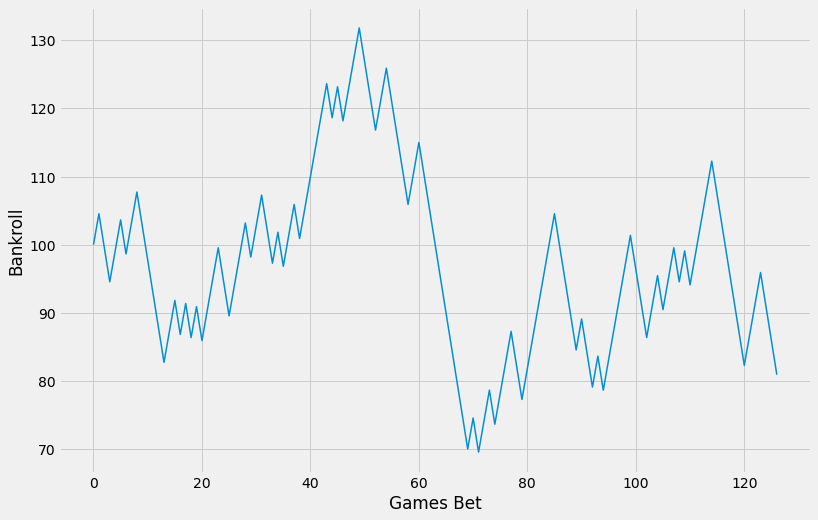

min balance: 69.54545454545458 
max balance: 131.81818181818184 
final balance: 85.45454545454552 
win percentage 51.18000000000001 
profit: -14.545454545454561 risk: 635.0 
ROI: -2.29
2
test set 1: 2018-10-26 - 2020-10-11
test set 2: 2021-01-01 - 2021-07-20
best threshold for testset 1: 0.574
num_games_bet at threshold: 693
win percetange at threshold: 0.5468975468975469
test1_acc: 0.516914749661705
test2_acc: 0.5429122468659595
win_percentage at  0.574 : 0.5303514376996805 ...Games Bet: 313


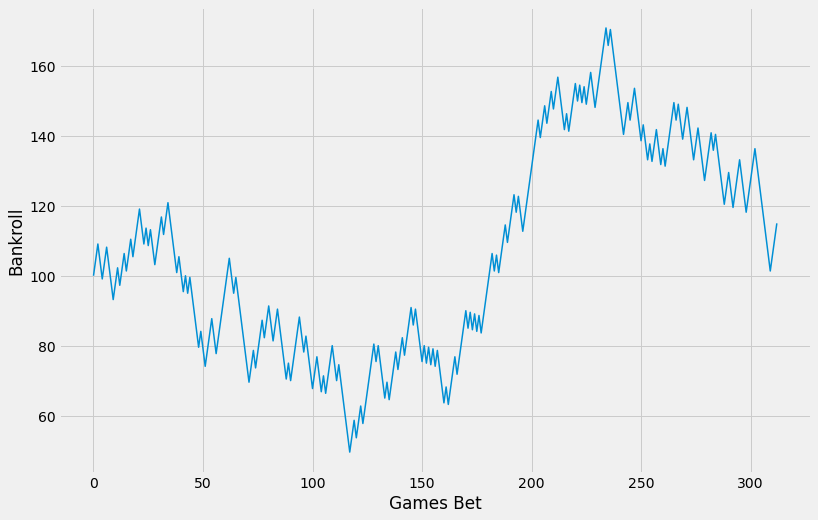

min balance: 49.54545454545462 
max balance: 170.90909090909076 
final balance: 119.54545454545408 
win percentage 53.04 
profit: 19.545454545454504 risk: 1565.0 
ROI: 1.25

 Pipeline(steps=[('scaler', StandardScaler()),
                ('knn', KNeighborsClassifier(n_neighbors=41))])
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2018, -, 2019)           0.500  0.521102           1161 -0.007319   
1  (2019, -, 2020)           0.610  0.511811            127 -0.022906   
2  (2021, -, 2021)           0.574  0.530351            313  0.012489   

     profits  
0 -36.090909  
1 -14.545455  
2  19.545455  
0
test set 1: 2016-11-04 - 2018-06-08
test set 2: 2018-10-26 - 2019-06-13
best threshold for testset 1: 0.548
num_games_bet at threshold: 469
win percetange at threshold: 0.5458422174840085
test1_acc: 0.5072825634623388
test2_acc: 0.5115416323165705
win_percentage at  0.548 : 0.573170731707317 ...Games Bet: 164


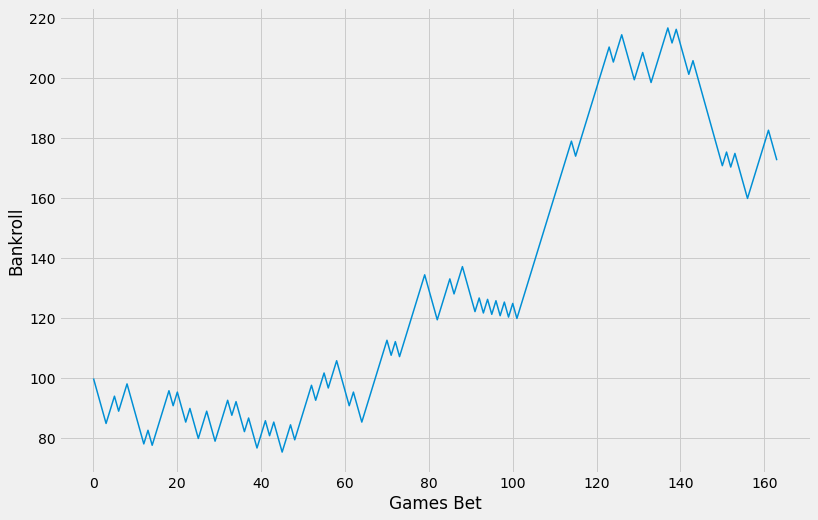

min balance: 75.45454545454548 
max balance: 216.81818181818147 
final balance: 177.2727272727268 
win percentage 57.32000000000001 
profit: 77.27272727272725 risk: 820.0 
ROI: 9.42
1
test set 1: 2017-10-28 - 2019-06-13
test set 2: 2019-11-01 - 2020-10-11
best threshold for testset 1: 0.5640000000000001
num_games_bet at threshold: 233
win percetange at threshold: 0.5665236051502146
test1_acc: 0.5145348837209303
test2_acc: 0.48356573705179284
win_percentage at  0.5640000000000001 : 0.4878048780487805 ...Games Bet: 41


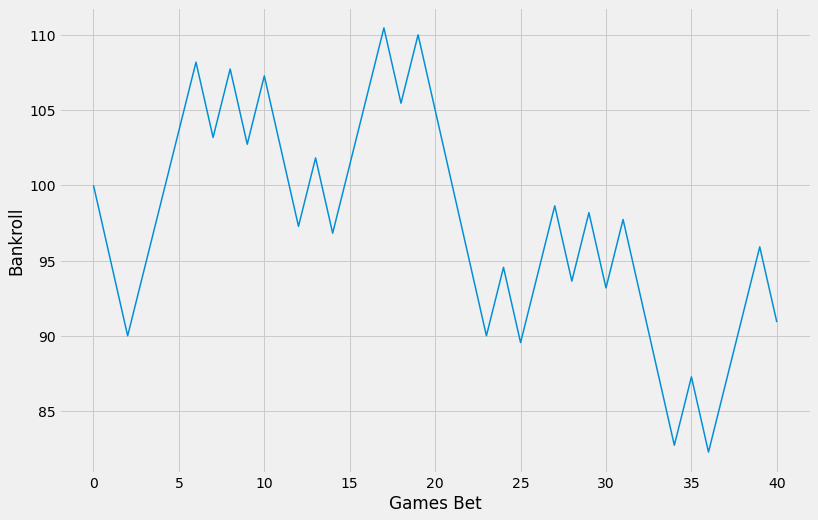

min balance: 82.2727272727273 
max balance: 110.45454545454547 
final balance: 85.90909090909093 
win percentage 48.78 
profit: -14.090909090909093 risk: 205.0 
ROI: -6.87
2
test set 1: 2018-10-26 - 2020-10-11
test set 2: 2021-01-01 - 2021-07-20
best threshold for testset 1: 0.53
num_games_bet at threshold: 855
win percetange at threshold: 0.5391812865497077
test1_acc: 0.5092467298150654
test2_acc: 0.503857280617165
win_percentage at  0.53 : 0.5570776255707762 ...Games Bet: 219


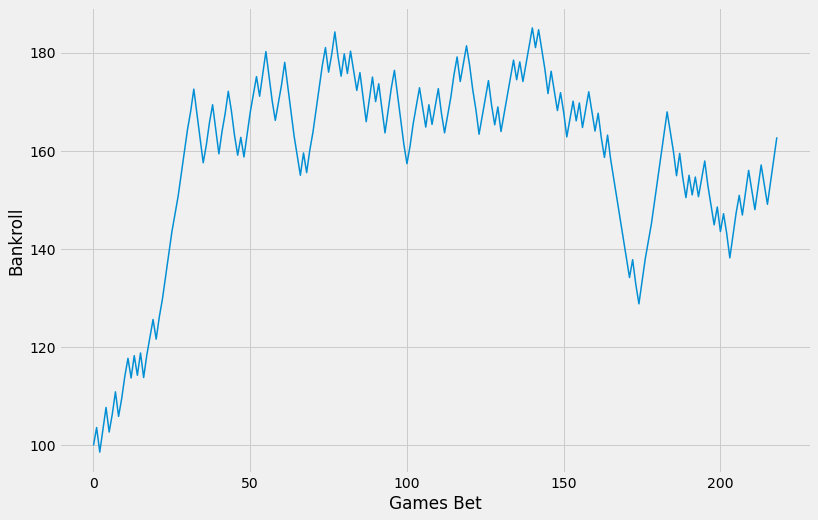

min balance: 98.63636363636364 
max balance: 184.99999999999923 
final balance: 167.27272727272606 
win percentage 55.71 
profit: 67.27272727272725 risk: 977.0 
ROI: 6.890000000000001

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('logreg',
                                                 LogisticRegression(C=0.0027825594022071257,
                                                                    max_iter=10000,
                                                                    verbose=1))])),
                               ('sgd_huber',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('sgd',
                                                 SGDClassifier(alpha=0.09549044557518077,
                                                               loss='modified_huber',
                      

In [340]:
cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21]



for estimator in estimator_list:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-3):
        X_train1, X_test, y_train1, y_test, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])
        X_test1, y_test1, test_idx1 = (X_test.loc[:cutoffs[i+2]], 
                                       y_test.loc[:cutoffs[i+2]], 
                                       X_test.loc[:cutoffs[i+2]].index)
        X_test2, y_test2, test_idx2 = (X_test.loc[cutoffs[i+2]+1:cutoffs[i+3]],
                                       y_test.loc[cutoffs[i+2]+1:cutoffs[i+3]],
                                       X_test.loc[cutoffs[i+2]+1:cutoffs[i+3]].index)

        X_train2 = pd.concat([X_train1, X_test1])
        y_train2 = pd.concat([y_train1, y_test1])

        print(i)
        print("test set 1:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='D'))
        print("test set 2:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx2, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx2, 'GAME_DATE'].values[-1], unit='D'))

        year = (np.datetime_as_string(df_ewm_19_diffs.loc[test_idx2, 'GAME_DATE'].values[0], unit='Y'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx2, 'GAME_DATE'].values[-1], unit='Y'))


        select_bets, best_threshold = test_model_at_threshold(df_ewm_19_diffs, estimator, X_train1,
                                                              y_train1, X_test1, y_test1, test_idx1,
                                                               X_train2, y_train2, X_test2, y_test2, 
                                                              test_idx2)

        selected_bets, roi, profit, win_pct = simulate_bets_3(select_bets)

        season.append(year)
        best_thresholds.append(best_threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)

    print(results_by_season)

0
test set 1: 2016-11-04 - 2017-06-12


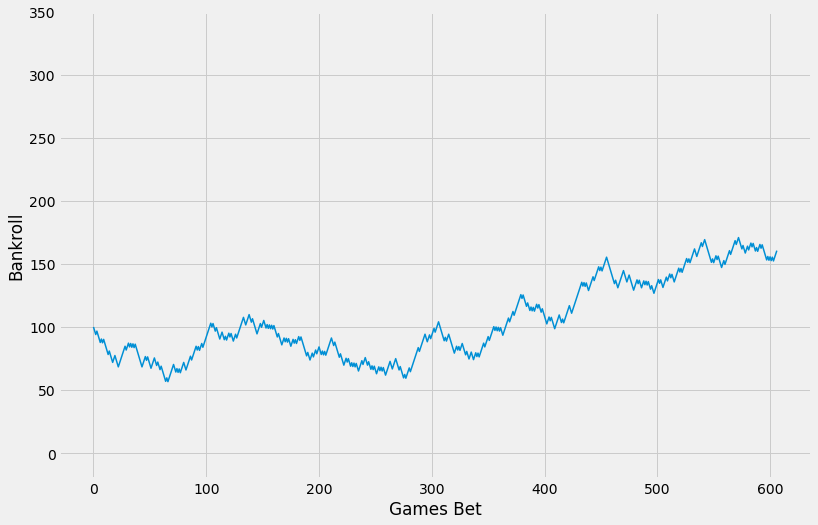

min balance: 56.636363636363804 
max balance: 170.90909090909173 
final balance: 157.54545454545524 
win percentage 54.04 
profit: 57.545454545454504 risk: 1821.0 
ROI: 3.16
1
test set 1: 2017-10-28 - 2018-06-08


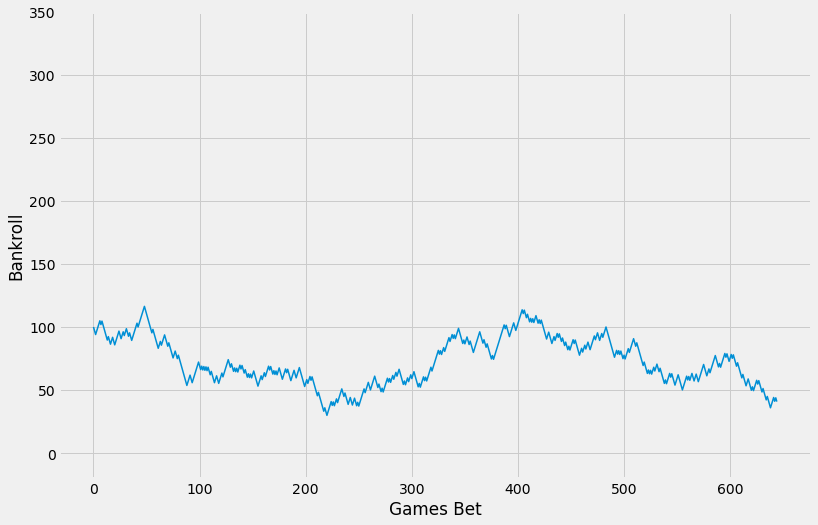

min balance: 29.909090909091326 
max balance: 116.36363636363654 
final balance: 37.81818181818305 
win percentage 50.7 
profit: -62.181818181818244 risk: 1935.0 
ROI: -3.2099999999999995
2
test set 1: 2018-10-26 - 2019-06-13


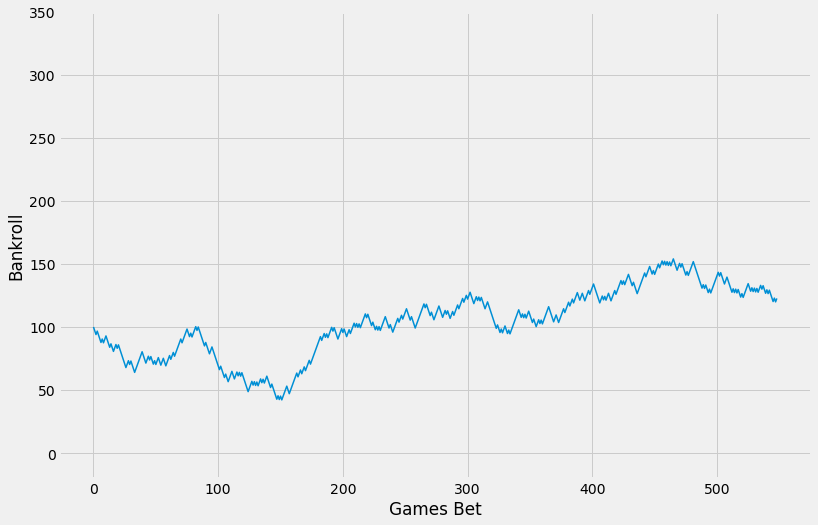

min balance: 42.181818181818485 
max balance: 154.00000000000094 
final balance: 125.36363636363707 
win percentage 53.190000000000005 
profit: 25.36363636363626 risk: 1647.0 
ROI: 1.54
3
test set 1: 2019-11-01 - 2020-10-11


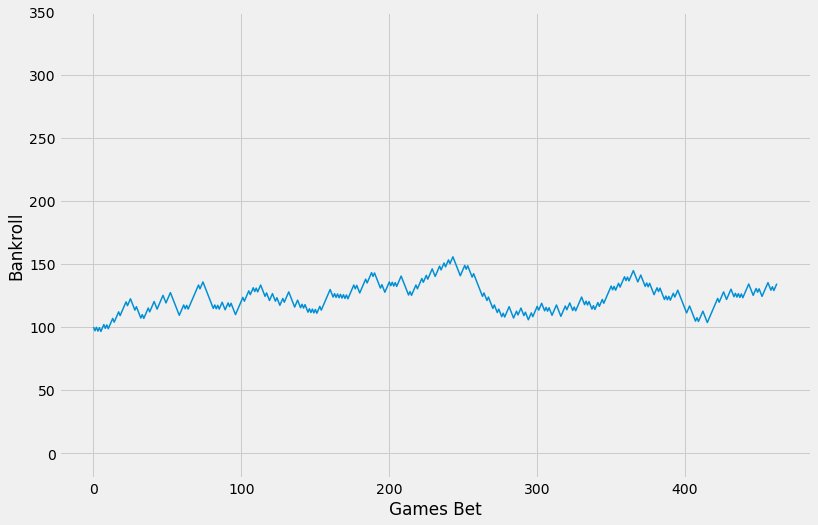

min balance: 96.45454545454547 
max balance: 155.63636363636385 
final balance: 137.09090909090955 
win percentage 53.779999999999994 
profit: 37.09090909090901 risk: 1389.0 
ROI: 2.67
4
test set 1: 2021-01-01 - 2021-07-20


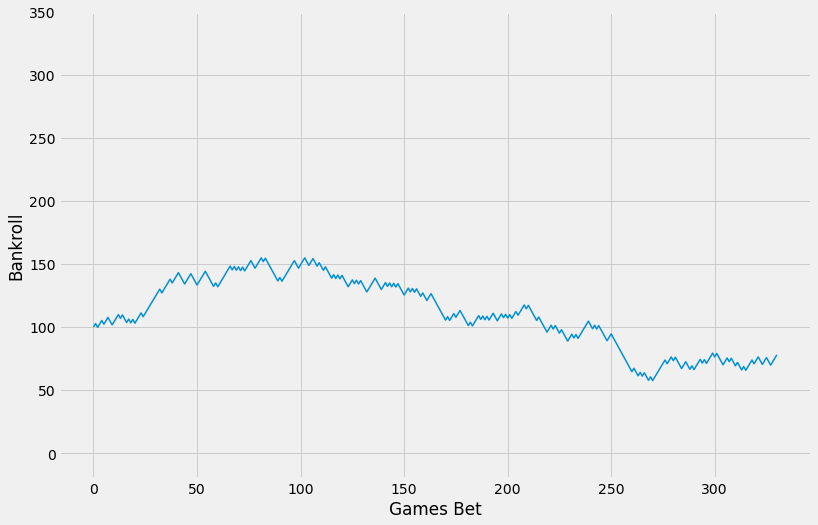

min balance: 57.454545454545375 
max balance: 154.81818181818173 
final balance: 80.63636363636377 
win percentage 51.35999999999999 
profit: -19.363636363636374 risk: 993.0 
ROI: -1.95

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('logreg',
                                                 LogisticRegression(C=0.0027825594022071257,
                                                                    max_iter=10000,
                                                                    verbose=1))])),
                               ('sgd_huber',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('sgd',
                                                 SGDClassifier(alpha=0.09549044557518077,
                                                               loss='modified_huber',
                    

In [341]:
cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21]

threshold = 0.5238

for estimator in [stacked_clf]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test, y_train1, y_test, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='D'))

        year = (np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='Y'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='Y'))


        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(df_ewm_19_diffs, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob_avg'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_1(select_bets, 3)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)

    print(results_by_season)

In [342]:
results_by_season

,season,best_threshold,win_pcts,num_games_bet,rois,profits
0,"(2016, -, 2017)",0.5238,0.540362,607,0.031601,57.545455
1,"(2017, -, 2018)",0.5238,0.506977,645,-0.032135,-62.181818
2,"(2018, -, 2019)",0.5238,0.531876,549,0.015400,25.363636
3,"(2019, -, 2020)",0.5238,0.537797,463,0.026703,37.090909
4,"(2021, -, 2021)",0.5238,0.513595,331,-0.019500,-19.363636


In [204]:
cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21]

threshold = 0.5238

for estimator in [best_sgd_huber, best_log_reg, best_lgbc, stacked_clf]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test, y_train1, y_test, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='D'))

        year = (np.datetime_as_string(df_ewm_19_diffs.loc[test_idx2, 'GAME_DATE'].values[0], unit='Y'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx2, 'GAME_DATE'].values[-1], unit='Y'))


        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(df_ewm_19_diffs, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob_avg'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_2(select_bets, 0.03)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)

    print(results_by_season)

0
test set 1: 2016-11-04 - 2017-06-12


NameError: name 'test_idx2' is not defined

0
test set 1: 2016-11-04 - 2017-06-12


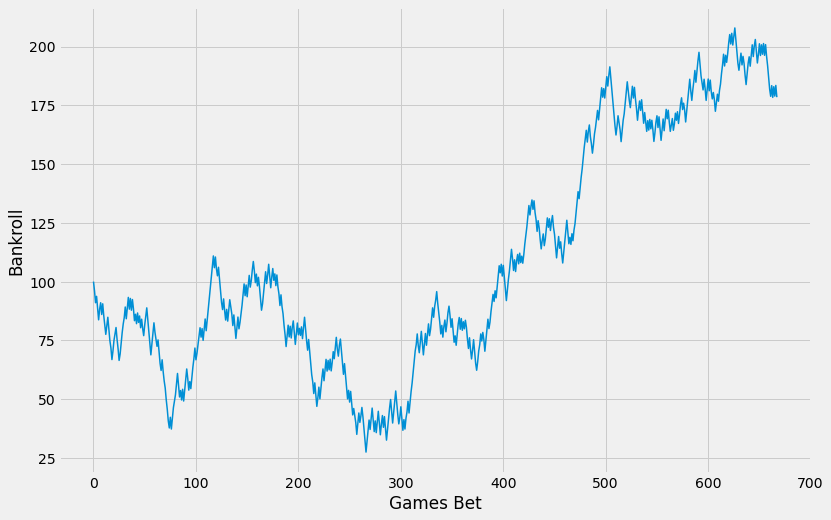

min balance: 27.454545454545737 
max balance: 207.90909090909037 
final balance: 175.4545454545447 
win percentage 53.59 
profit: 75.45454545454527 risk: 2981.0 
ROI: 2.53
1
test set 1: 2017-10-28 - 2018-06-08


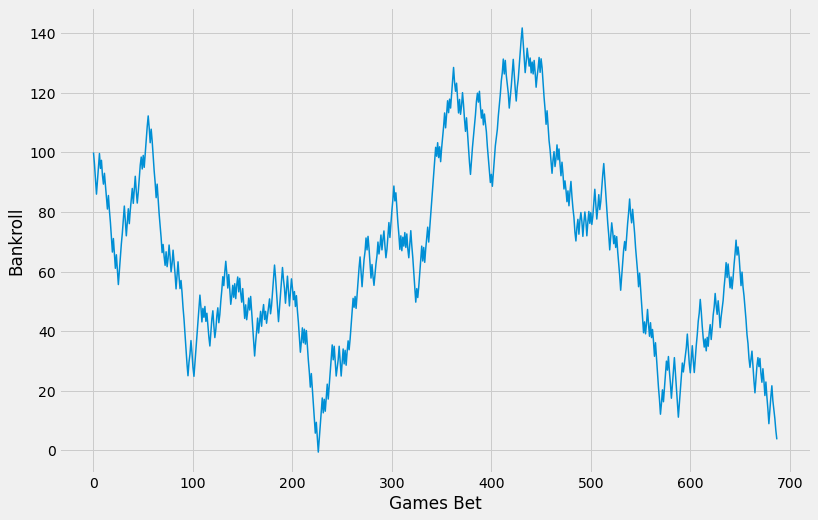

min balance: -0.6363636363635443 
max balance: 141.81818181818204 
final balance: -0.36363636363606844 
win percentage 50.580000000000005 
profit: -100.36363636363649 risk: 3048.0 
ROI: -3.29
2
test set 1: 2018-10-26 - 2019-06-13


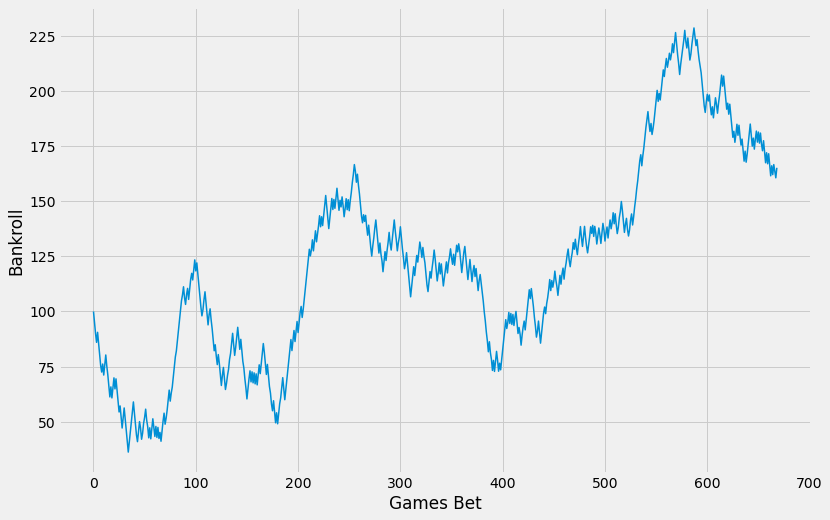

min balance: 36.27272727272729 
max balance: 228.45454545454447 
final balance: 160.0909090909077 
win percentage 53.36 
profit: 60.09090909090901 risk: 3004.0 
ROI: 2.0
3
test set 1: 2019-11-01 - 2020-10-11


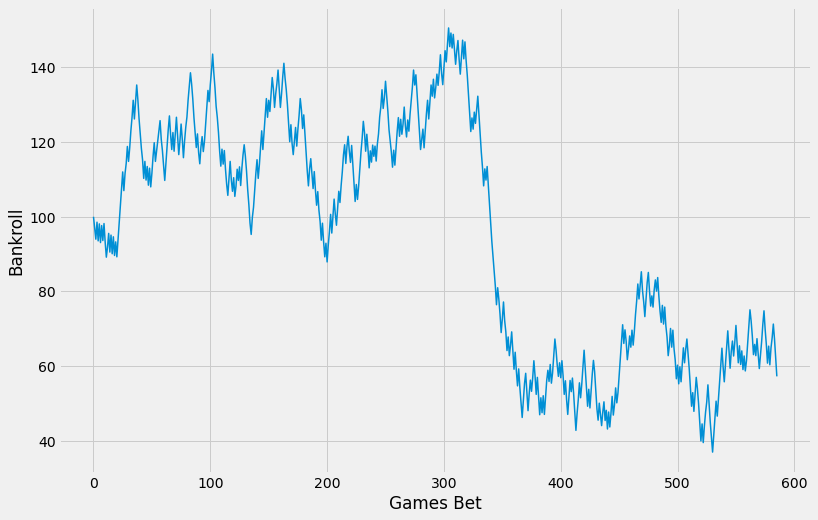

min balance: 36.999999999999865 
max balance: 150.54545454545442 
final balance: 61.81818181818173 
win percentage 50.849999999999994 
profit: -38.181818181818244 risk: 2562.0 
ROI: -1.49
4
test set 1: 2021-01-01 - 2021-07-20


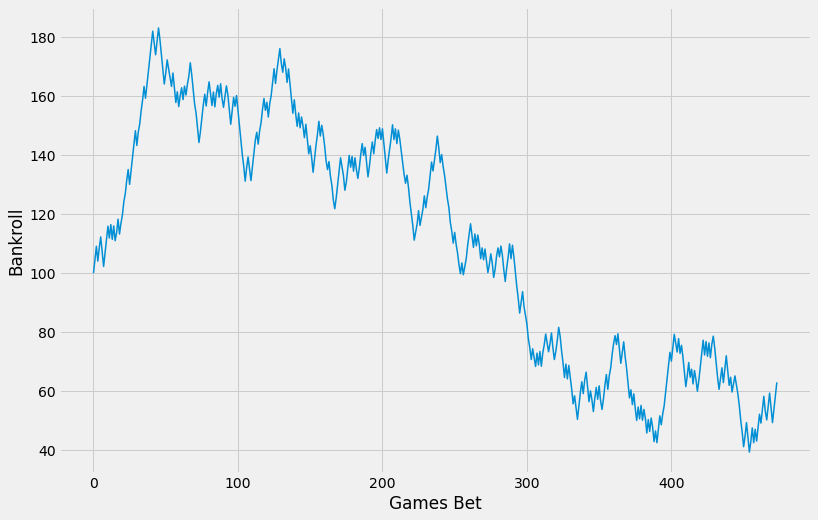

min balance: 39.36363636363546 
max balance: 183.09090909090892 
final balance: 67.54545454545365 
win percentage 50.839999999999996 
profit: -32.454545454545496 risk: 2037.0 
ROI: -1.59

 Pipeline(steps=[('scaler', StandardScaler()),
                ('sgd',
                 SGDClassifier(alpha=0.435791301239703, loss='modified_huber',
                               max_iter=10000, random_state=23))])
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2016, -, 2017)          0.5238  0.535928            668  0.025312   
1  (2017, -, 2018)          0.5238  0.505814            688 -0.032928   
2  (2018, -, 2019)          0.5238  0.533632            669  0.020004   
3  (2019, -, 2020)          0.5238  0.508532            586 -0.014903   
4  (2021, -, 2021)          0.5238  0.508439            474 -0.015933   

      profits  
0   75.454545  
1 -100.363636  
2   60.090909  
3  -38.181818  
4  -32.454545  
0
test set 1: 2016-11-04 - 2017-06-12


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


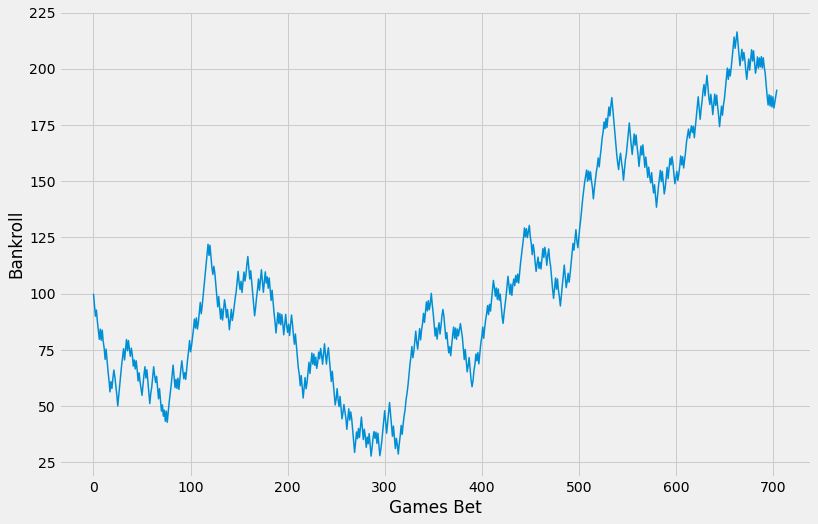

min balance: 27.818181818182055 
max balance: 216.36363636363578 
final balance: 186.72727272727192 
win percentage 53.76 
profit: 86.72727272727252 risk: 3132.0 
ROI: 2.77
1
test set 1: 2017-10-28 - 2018-06-08


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


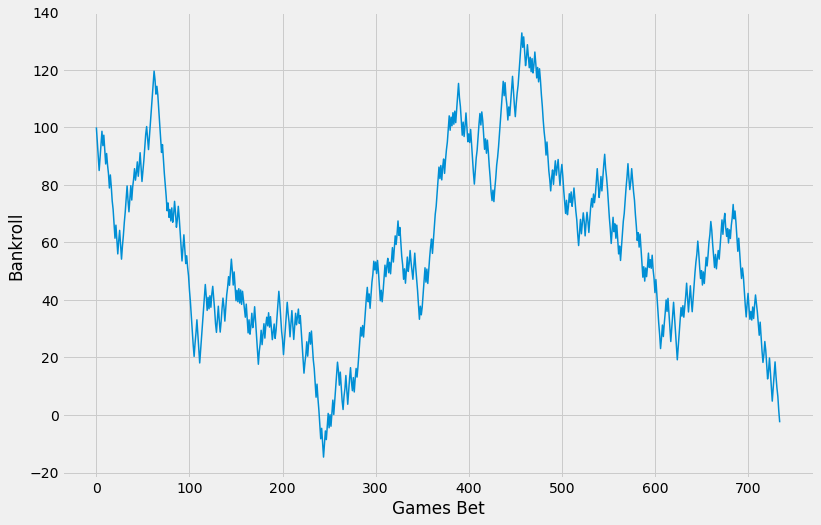

min balance: -14.636363636363496 
max balance: 132.81818181818207 
final balance: -5.545454545454113 
win percentage 50.480000000000004 
profit: -105.54545454545473 risk: 3267.0 
ROI: -3.2300000000000004
2
test set 1: 2018-10-26 - 2019-06-13


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


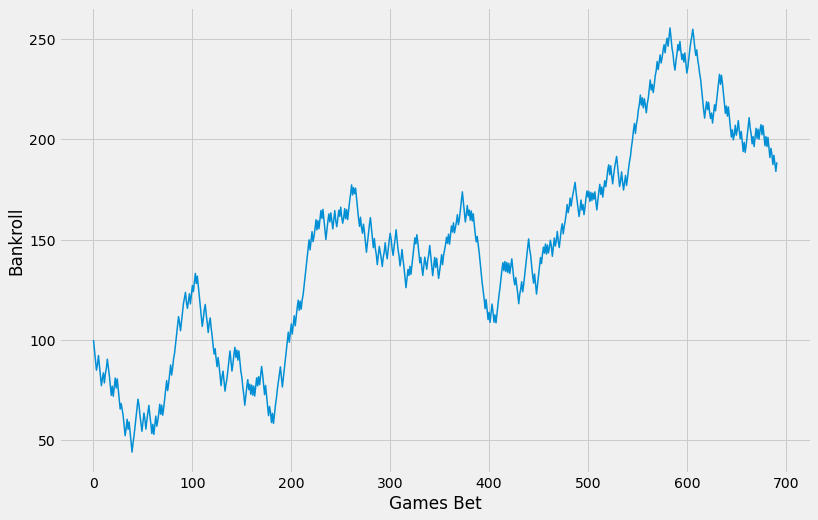

min balance: 44.181818181818215 
max balance: 255.4545454545435 
final balance: 183.54545454545203 
win percentage 54.05 
profit: 83.5454545454545 risk: 3097.0 
ROI: 2.7
3
test set 1: 2019-11-01 - 2020-10-11


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


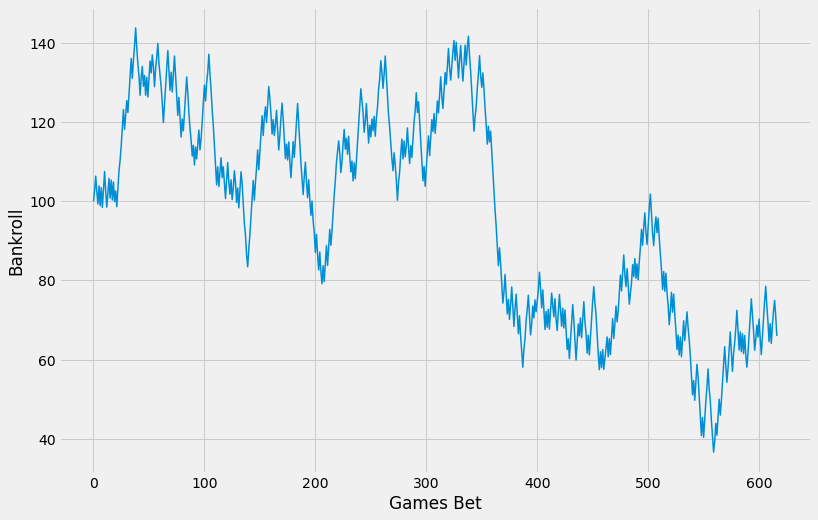

min balance: 36.63636363636367 
max balance: 143.8181818181818 
final balance: 70.54545454545462 
win percentage 51.22 
profit: -29.454545454545496 risk: 2748.0 
ROI: -1.0699999999999998
4
test set 1: 2021-01-01 - 2021-07-20


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


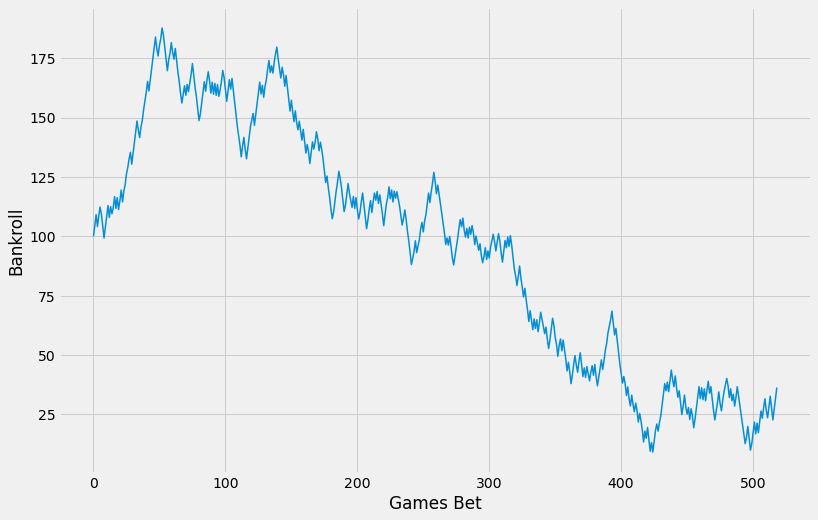

min balance: 9.090909090908465 
max balance: 187.72727272727252 
final balance: 40.818181818181195 
win percentage 50.480000000000004 
profit: -59.181818181818244 risk: 2226.0 
ROI: -2.6599999999999997

 Pipeline(steps=[('scaler', StandardScaler()),
                ('logreg',
                 LogisticRegression(C=0.0013219411484660314, max_iter=10000,
                                    verbose=1))])
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2016, -, 2017)          0.5238  0.537589            705  0.027691   
1  (2017, -, 2018)          0.5238  0.504762            735 -0.032307   
2  (2018, -, 2019)          0.5238  0.540462            692  0.026976   
3  (2019, -, 2020)          0.5238  0.512156            617 -0.010719   
4  (2021, -, 2021)          0.5238  0.504817            519 -0.026587   

      profits  
0   86.727273  
1 -105.545455  
2   83.545455  
3  -29.454545  
4  -59.181818  
0
test set 1: 2016-11-04 - 2017-06-12
[LightGBM] [Warning] fe

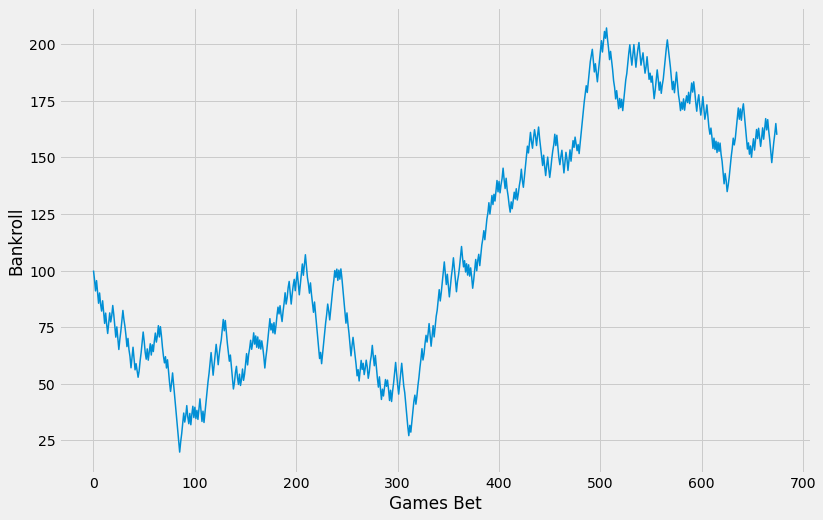

min balance: 19.72727272727277 
max balance: 207.27272727272677 
final balance: 162.72727272727127 
win percentage 53.480000000000004 
profit: 62.72727272727252 risk: 3009.0 
ROI: 2.08
1
test set 1: 2017-10-28 - 2018-06-08
[LightGBM] [Warning] feature_fraction is set=0.8520479372283939, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8520479372283939


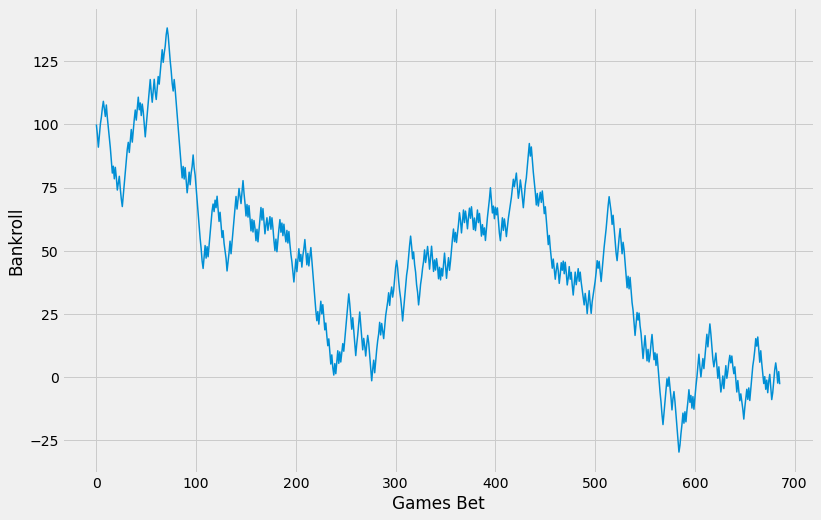

min balance: -29.909090909090743 
max balance: 138.2727272727273 
final balance: -5.999999999999853 
win percentage 50.73 
profit: -106.0 risk: 3025.0 
ROI: -3.5000000000000004
2
test set 1: 2018-10-26 - 2019-06-13
[LightGBM] [Warning] feature_fraction is set=0.8520479372283939, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8520479372283939


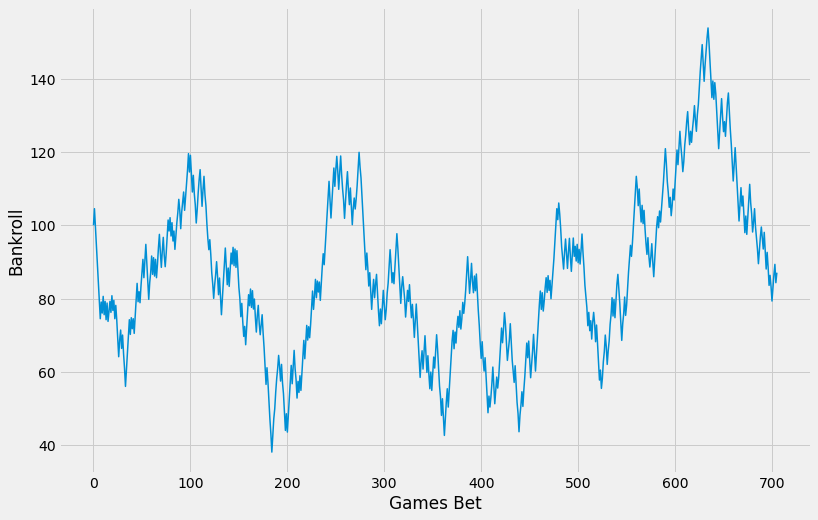

min balance: 38.18181818181846 
max balance: 153.81818181818244 
final balance: 84.0909090909097 
win percentage 52.12 
profit: -15.909090909090992 risk: 3101.0 
ROI: -0.51
3
test set 1: 2019-11-01 - 2020-10-11
[LightGBM] [Warning] feature_fraction is set=0.8520479372283939, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8520479372283939


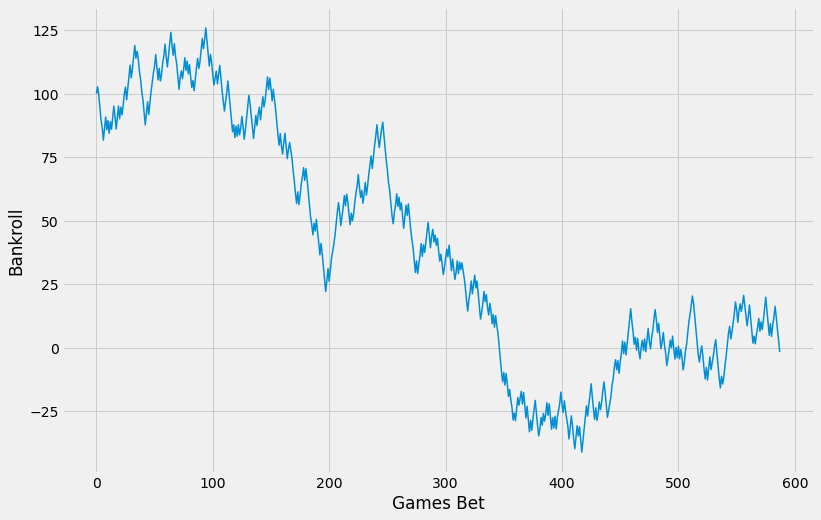

min balance: -41.09090909090884 
max balance: 125.90909090909105 
final balance: 2.818181818182053 
win percentage 51.019999999999996 
profit: -97.18181818181824 risk: 2558.0 
ROI: -3.8
4
test set 1: 2021-01-01 - 2021-07-20
[LightGBM] [Warning] feature_fraction is set=0.8520479372283939, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8520479372283939


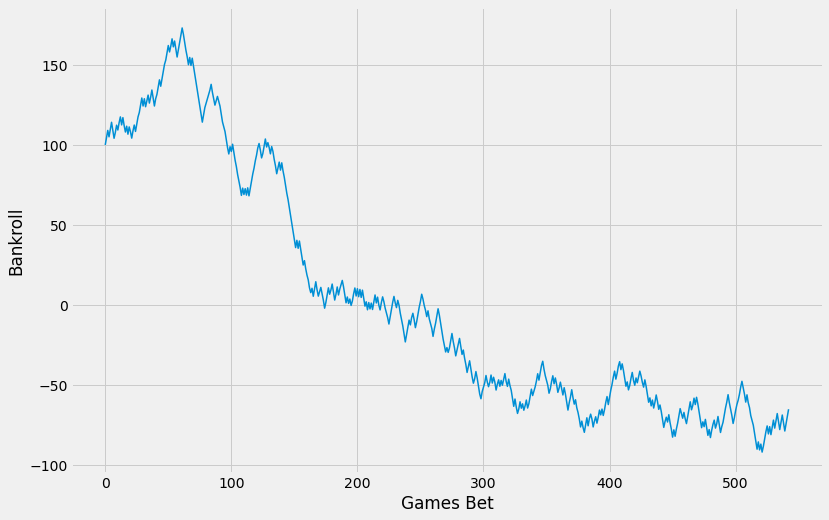

min balance: -92.09090909090918 
max balance: 173.181818181818 
final balance: -60.72727272727279 
win percentage 49.17 
profit: -160.72727272727275 risk: 2360.0 
ROI: -6.81

 LGBMClassifier(feature_fraction=0.8520479372283939, max_depth=3,
               min_child_weight=16, num_leaves=263, objective='binary',
               reg_alpha=0.04520353656360243, reg_lambda=10,
               subsample=0.9375978643394407, subsample_freq=1)
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2016, -, 2017)          0.5238  0.534815            675  0.020847   
1  (2017, -, 2018)          0.5238  0.507289            686 -0.035041   
2  (2018, -, 2019)          0.5238  0.521246            706 -0.005130   
3  (2019, -, 2020)          0.5238  0.510204            588 -0.037991   
4  (2021, -, 2021)          0.5238  0.491713            543 -0.068105   

      profits  
0   62.727273  
1 -106.000000  
2  -15.909091  
3  -97.181818  
4 -160.727273  
0
test set 1: 2016-11-04 - 2

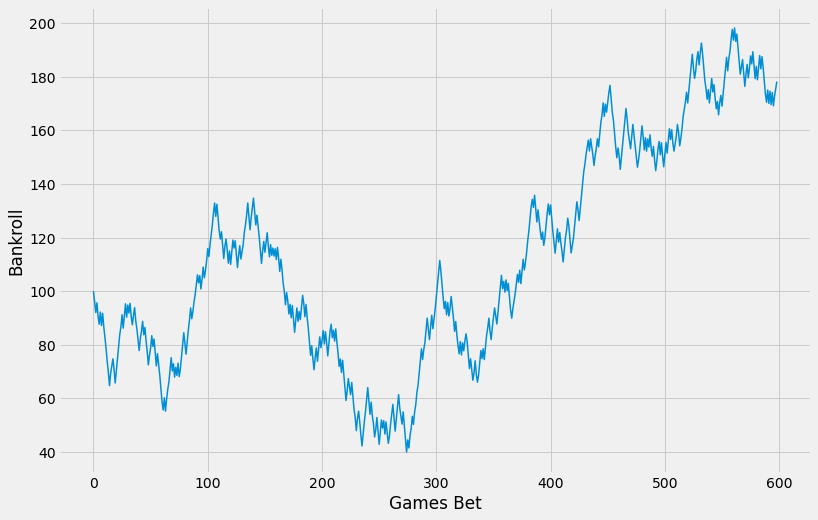

min balance: 39.909090909091184 
max balance: 198.2727272727268 
final balance: 175.2727272727266 
win percentage 53.92 
profit: 75.27272727272725 risk: 2586.0 
ROI: 2.91
1
test set 1: 2017-10-28 - 2018-06-08


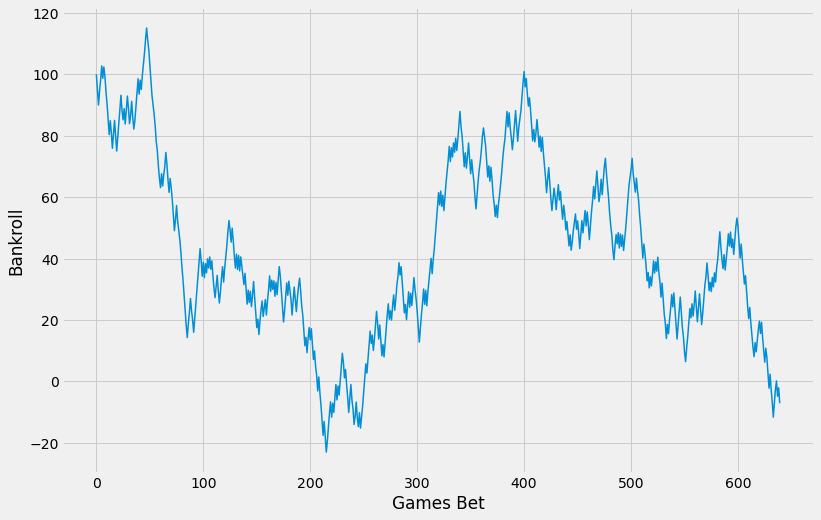

min balance: -22.99999999999993 
max balance: 115.09090909090915 
final balance: -11.090909090908898 
win percentage 49.69 
profit: -111.09090909090924 risk: 2801.0 
ROI: -3.9699999999999998
2
test set 1: 2018-10-26 - 2019-06-13


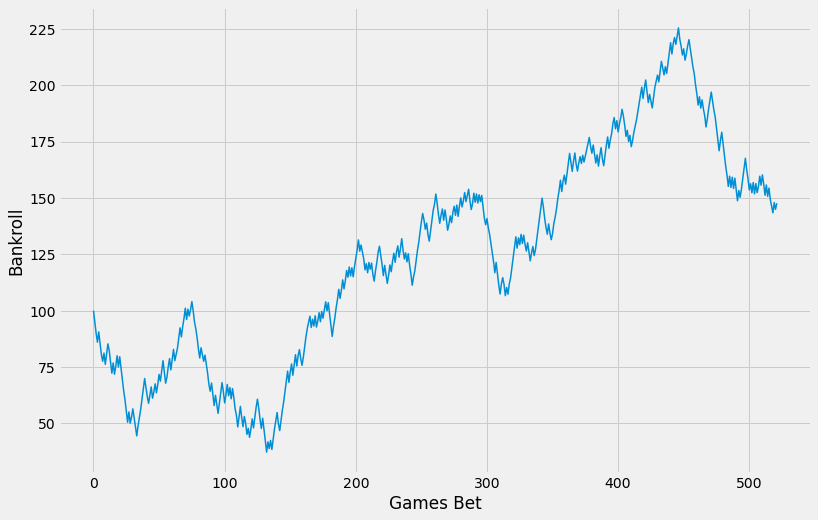

min balance: 37.272727272727344 
max balance: 225.3636363636355 
final balance: 151.27272727272606 
win percentage 53.26 
profit: 51.27272727272725 risk: 2211.0 
ROI: 2.32
3
test set 1: 2019-11-01 - 2020-10-11


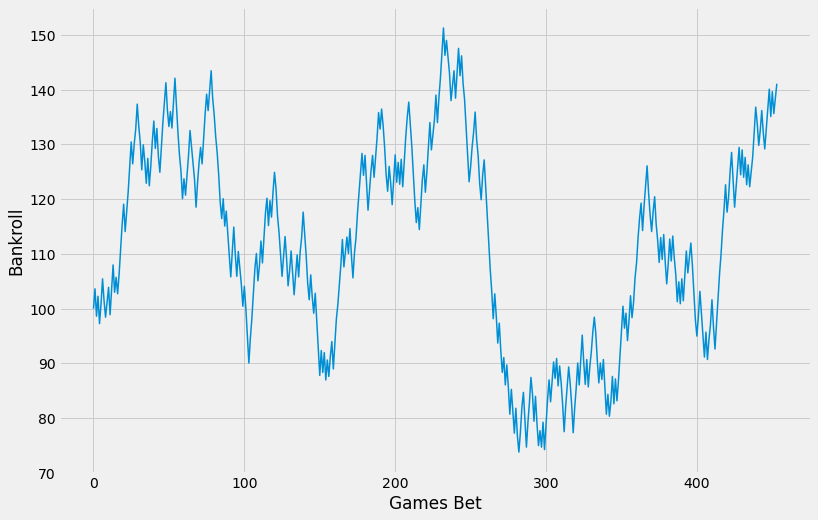

min balance: 73.81818181818167 
max balance: 151.27272727272717 
final balance: 144.72727272727272 
win percentage 53.52 
profit: 44.727272727272634 risk: 1914.0 
ROI: 2.34
4
test set 1: 2021-01-01 - 2021-07-20


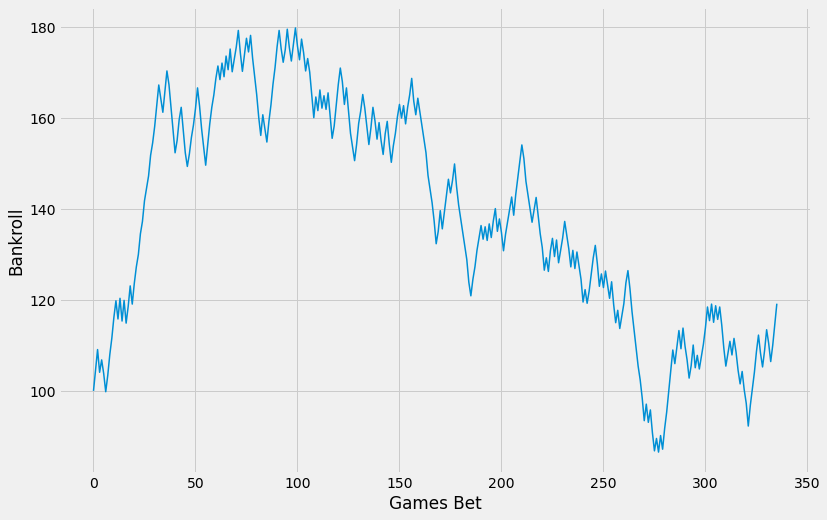

min balance: 86.54545454545355 
max balance: 179.81818181818136 
final balance: 123.72727272727185 
win percentage 52.38 
profit: 23.727272727272634 risk: 1305.0 
ROI: 1.82

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('logreg',
                                                 LogisticRegression(C=0.0013219411484660314,
                                                                    max_iter=10000,
                                                                    verbose=1))])),
                               ('sgd_huber',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('sgd',
                                                 SGDClassifier(alpha=0.435791301239703,
                                                               loss='modified_huber',
                                   

,season,best_threshold,win_pcts,num_games_bet,rois,profits
0,"(2016, -, 2017)",0.5238,0.539232,599,0.029108,75.272727
1,"(2017, -, 2018)",0.5238,0.496875,640,-0.039661,-111.090909
2,"(2018, -, 2019)",0.5238,0.532567,522,0.023190,51.272727
3,"(2019, -, 2020)",0.5238,0.535242,454,0.023368,44.727273
4,"(2021, -, 2021)",0.5238,0.523810,336,0.018182,23.727273


In [210]:
cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21]

threshold = 0.5238

for estimator in [best_sgd_huber, best_log_reg, best_lgbc, stacked_clf]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test, y_train1, y_test, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='D'))

        year = (np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='Y'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='Y'))


        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(df_ewm_19_diffs, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob_avg'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_3(select_bets)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)
    print(results_by_season)

results_by_season

Betting Threshold: 0.5238

0
test set 1: 2016-11-04 - 2017-06-12


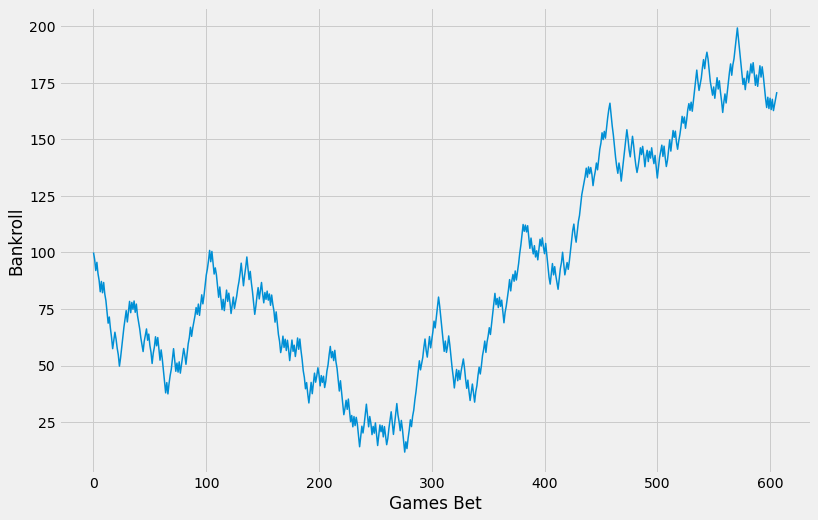

min balance: 11.727272727272883 
max balance: 199.27272727272668 
final balance: 167.90909090909014 
win percentage 53.87 
profit: 67.90909090909076 risk: 2622.0 
ROI: 2.59
1
test set 1: 2017-10-28 - 2018-06-08


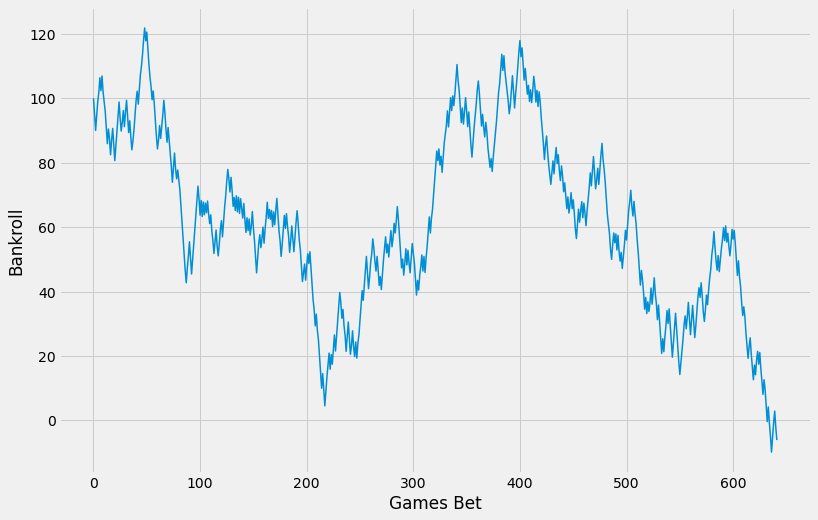

min balance: -10.09090909090871 
max balance: 121.8181818181819 
final balance: -10.09090909090871 
win percentage 49.84 
profit: -110.09090909090924 risk: 2779.0 
ROI: -3.9600000000000004
2
test set 1: 2018-10-26 - 2019-06-13


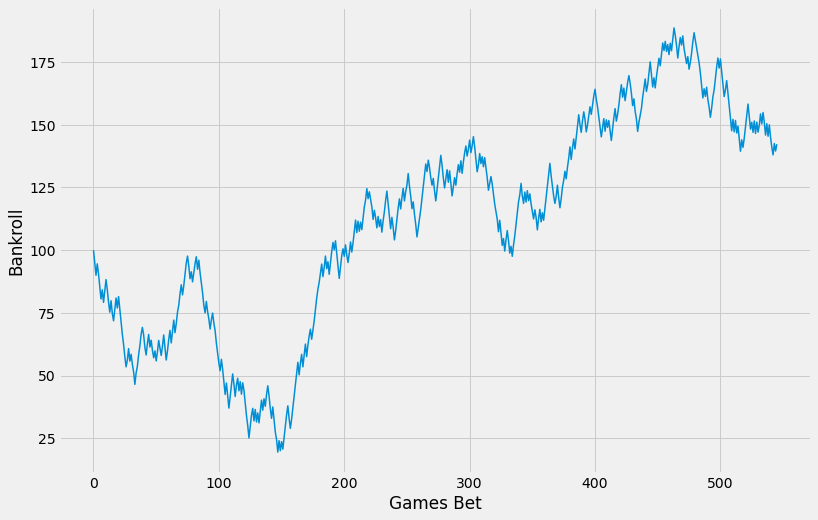

min balance: 19.454545454545546 
max balance: 188.63636363636317 
final balance: 145.90909090909003 
win percentage 52.93 
profit: 45.909090909090764 risk: 2329.0 
ROI: 1.97
3
test set 1: 2019-11-01 - 2020-10-11


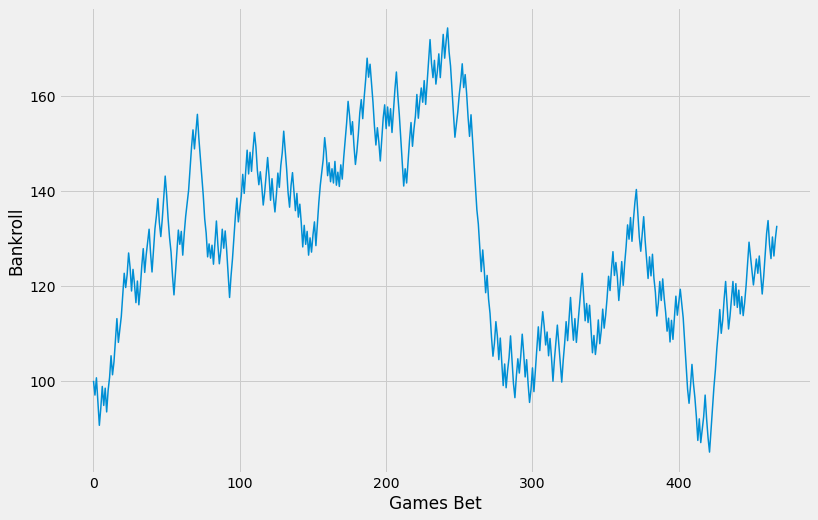

min balance: 84.99999999999902 
max balance: 174.27272727272623 
final balance: 136.2727272727263 
win percentage 53.63 
profit: 36.27272727272725 risk: 1974.0 
ROI: 1.8399999999999999
4
test set 1: 2021-01-01 - 2021-07-20


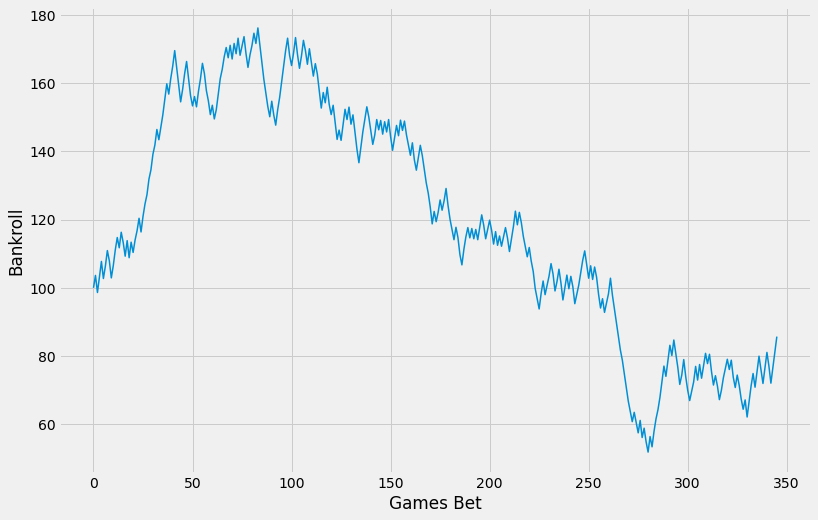

min balance: 51.90909090909039 
max balance: 176.09090909090878 
final balance: 90.27272727272687 
win percentage 50.580000000000005 
profit: -9.727272727272748 risk: 1369.0 
ROI: -0.7100000000000001

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('logreg',
                                                 LogisticRegression(C=0.0027825594022071257,
                                                                    max_iter=10000,
                                                                    verbose=1))])),
                               ('sgd_huber',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('sgd',
                                                 SGDClassifier(alpha=0.09549044557518077,
                                                               loss='modified_huber',
      

,season,best_threshold,win_pcts,num_games_bet,rois,profits
0,"(2016, -, 2017)",0.5238,0.538715,607,0.025900,67.909091
1,"(2017, -, 2018)",0.5238,0.498442,642,-0.039615,-110.090909
2,"(2018, -, 2019)",0.5238,0.529304,546,0.019712,45.909091
3,"(2019, -, 2020)",0.5238,0.536325,468,0.018375,36.272727
4,"(2021, -, 2021)",0.5238,0.505780,346,-0.007105,-9.727273


In [345]:
cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21]

threshold = 0.5238

for estimator in [stacked_clf2]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test, y_train1, y_test, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='D'))

        year = (np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='Y'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='Y'))


        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(df_ewm_19_diffs, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob_avg'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_3(select_bets)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)
    print(results_by_season)

results_by_season

In [215]:
cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21]

threshold = 0.53

for estimator in [stacked_clf]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test, y_train1, y_test, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='D'))

        year = (np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='Y'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='Y'))


        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(df_ewm_19_diffs, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob_avg'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_4(select_bets)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)
    print(results_by_season)

results_by_season

0
test set 1: 2016-11-04 - 2017-06-12


KeyError: -1

0
test set 1: 2016-11-04 - 2017-06-12
[LightGBM] [Warning] feature_fraction is set=0.8520479372283939, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8520479372283939


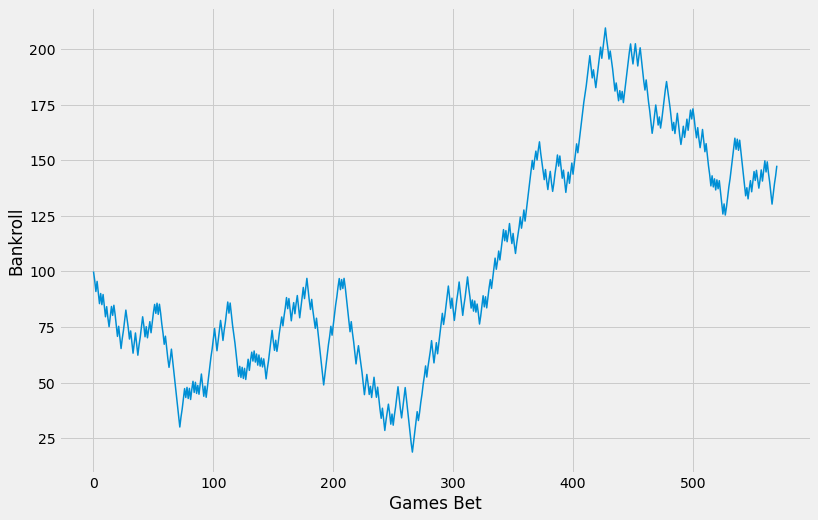

min balance: 18.818181818181955 
max balance: 209.45454545454515 
final balance: 142.54545454545342 
win percentage 53.059999999999995 
profit: 42.545454545454504 risk: 2697.0 
ROI: 1.58
1
test set 1: 2017-10-28 - 2018-06-08
[LightGBM] [Warning] feature_fraction is set=0.8520479372283939, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8520479372283939


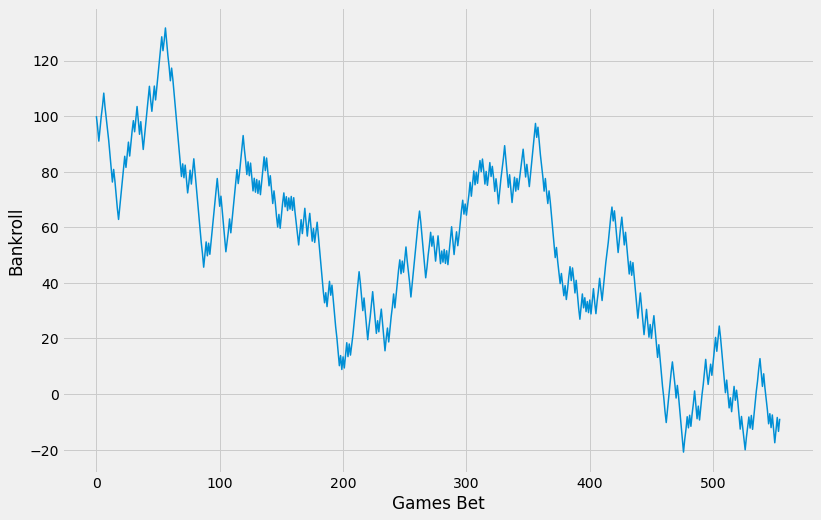

min balance: -20.909090909090693 
max balance: 131.72727272727278 
final balance: -13.909090909090702 
win percentage 50.09 
profit: -113.90909090909099 risk: 2632.0 
ROI: -4.33
2
test set 1: 2018-10-26 - 2019-06-13
[LightGBM] [Warning] feature_fraction is set=0.8520479372283939, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8520479372283939


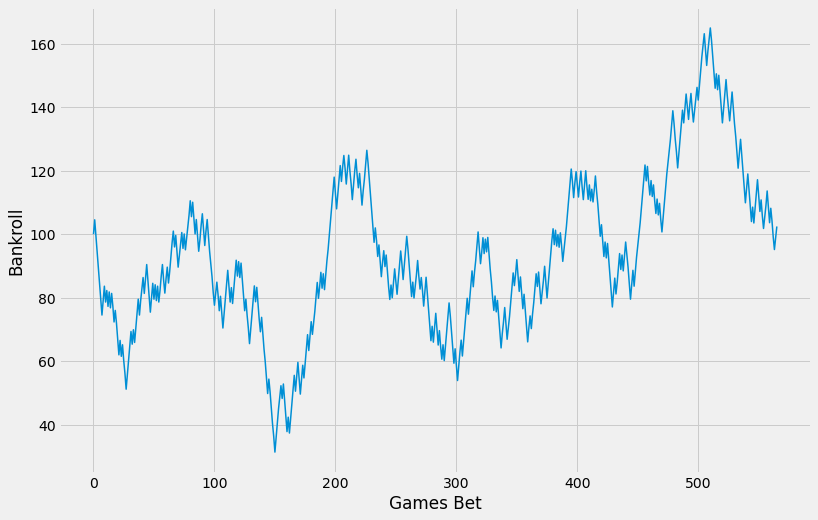

min balance: 31.363636363636516 
max balance: 165.00000000000026 
final balance: 97.45454545454565 
win percentage 52.470000000000006 
profit: -2.5454545454547315 risk: 2681.0 
ROI: -0.09
3
test set 1: 2019-11-01 - 2020-10-11
[LightGBM] [Warning] feature_fraction is set=0.8520479372283939, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8520479372283939


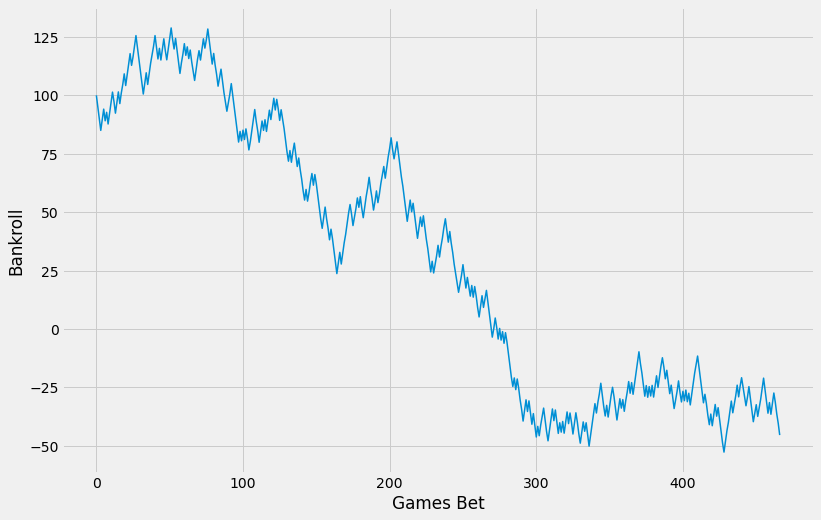

min balance: -52.63636363636346 
max balance: 128.81818181818187 
final balance: -40.81818181818165 
win percentage 49.04 
profit: -140.81818181818187 risk: 2195.0 
ROI: -6.419999999999999
4
test set 1: 2021-01-01 - 2021-07-20
[LightGBM] [Warning] feature_fraction is set=0.8520479372283939, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8520479372283939


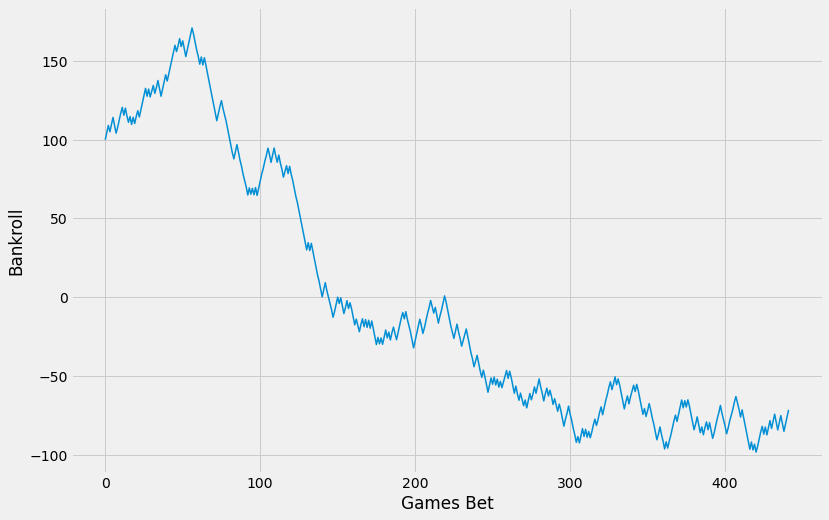

min balance: -98.36363636363645 
max balance: 170.99999999999977 
final balance: -67.00000000000006 
win percentage 48.19 
profit: -167.0000000000001 risk: 2057.0 
ROI: -8.12

 LGBMClassifier(feature_fraction=0.8520479372283939, max_depth=3,
               min_child_weight=16, num_leaves=263, objective='binary',
               reg_alpha=0.04520353656360243, reg_lambda=10,
               subsample=0.9375978643394407, subsample_freq=1)
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2016, -, 2017)            0.53  0.530648            571  0.015775   
1  (2017, -, 2018)            0.53  0.500901            555 -0.043279   
2  (2018, -, 2019)            0.53  0.524735            566 -0.000949   
3  (2019, -, 2020)            0.53  0.490364            467 -0.064154   
4  (2021, -, 2021)            0.53  0.481900            442 -0.081186   

      profits  
0   42.545455  
1 -113.909091  
2   -2.545455  
3 -140.818182  
4 -167.000000  
0
test set 1: 2016-11-04 - 

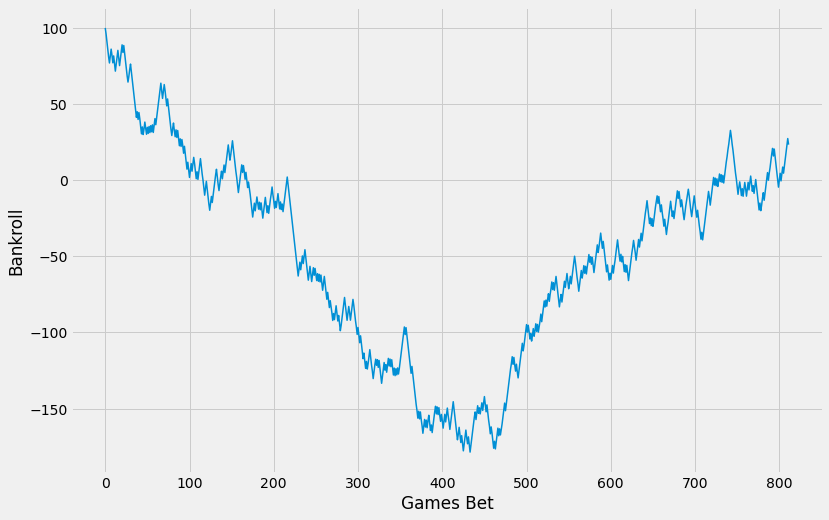

min balance: -178.5454545454548 
max balance: 96.0 
final balance: 18.36363636363584 
win percentage 51.11 
profit: -81.63636363636374 risk: 3917.0 
ROI: -2.08
1
test set 1: 2017-10-28 - 2018-06-08


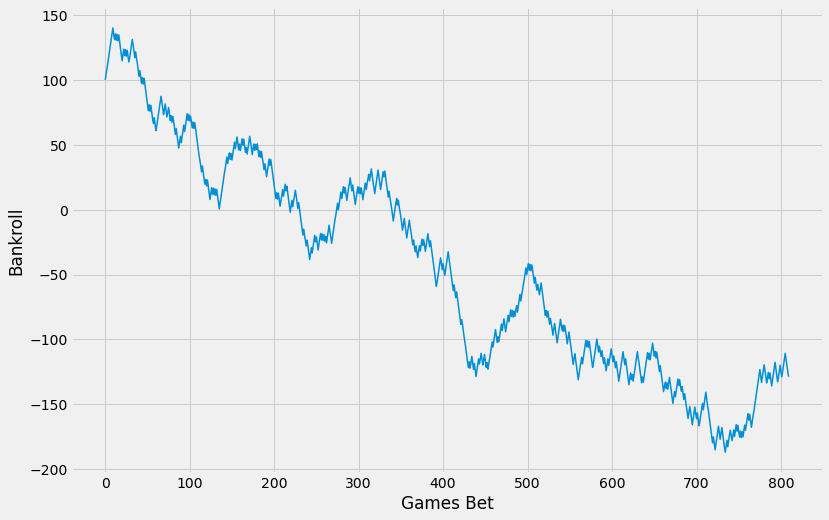

min balance: -186.81818181818207 
max balance: 139.99999999999997 
final balance: -125.09090909090965 
win percentage 49.26 
profit: -225.09090909090924 risk: 3923.0 
ROI: -5.74
2
test set 1: 2018-10-26 - 2019-06-13


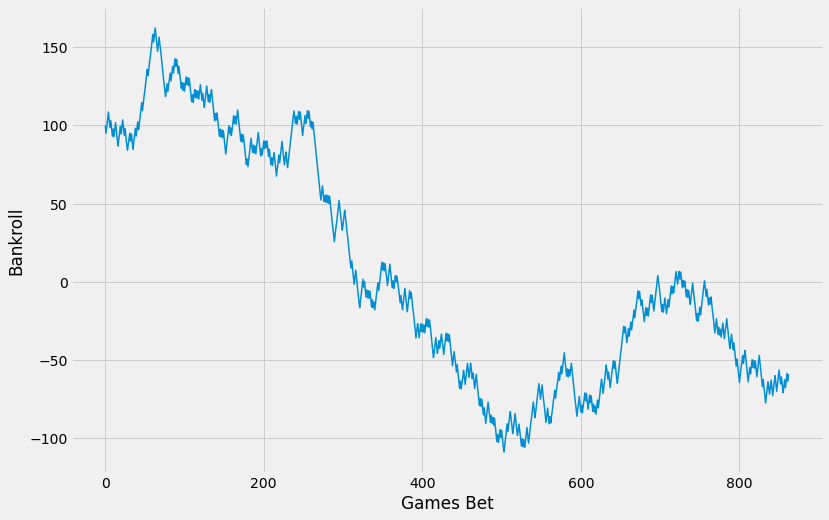

min balance: -109.09090909090911 
max balance: 162.45454545454538 
final balance: -54.636363636363484 
win percentage 50.41 
profit: -154.63636363636374 risk: 4179.0 
ROI: -3.6999999999999997
3
test set 1: 2019-11-01 - 2020-10-11


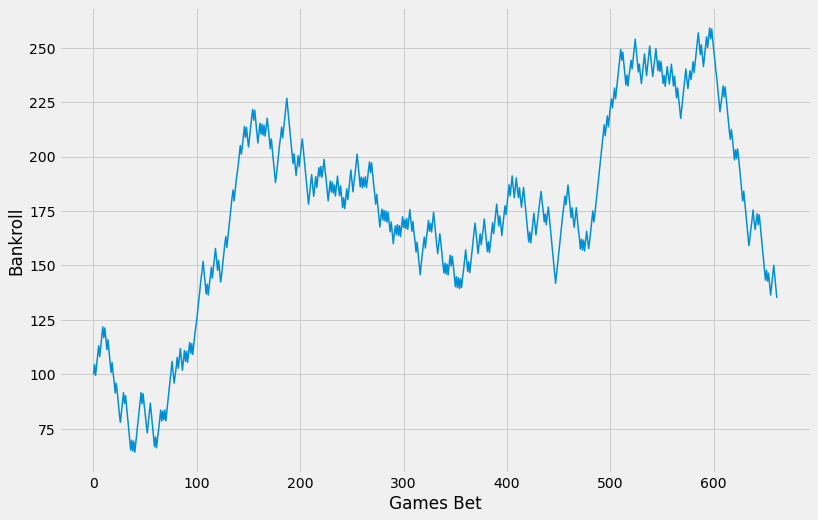

min balance: 64.36363636363639 
max balance: 258.9999999999967 
final balance: 139.6363636363601 
win percentage 53.02 
profit: 39.63636363636351 risk: 3202.0 
ROI: 1.24
4
test set 1: 2021-01-01 - 2021-07-20


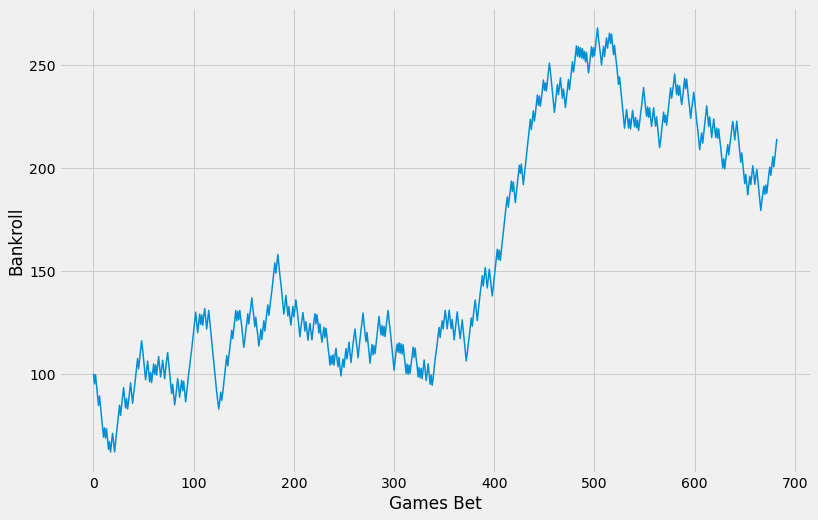

min balance: 61.81818181818183 
max balance: 268.27272727272646 
final balance: 218.81818181818002 
win percentage 54.169999999999995 
profit: 118.81818181818176 risk: 3266.0 
ROI: 3.64

 Pipeline(steps=[('scaler', StandardScaler()),
                ('knn', KNeighborsClassifier(n_neighbors=41))])
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2016, -, 2017)            0.53  0.511084            812 -0.020842   
1  (2017, -, 2018)            0.53  0.492593            810 -0.057377   
2  (2018, -, 2019)            0.53  0.504056            863 -0.037003   
3  (2019, -, 2020)            0.53  0.530211            662  0.012379   
4  (2021, -, 2021)            0.53  0.541728            683  0.036380   

      profits  
0  -81.636364  
1 -225.090909  
2 -154.636364  
3   39.636364  
4  118.818182  
0
test set 1: 2016-11-04 - 2017-06-12


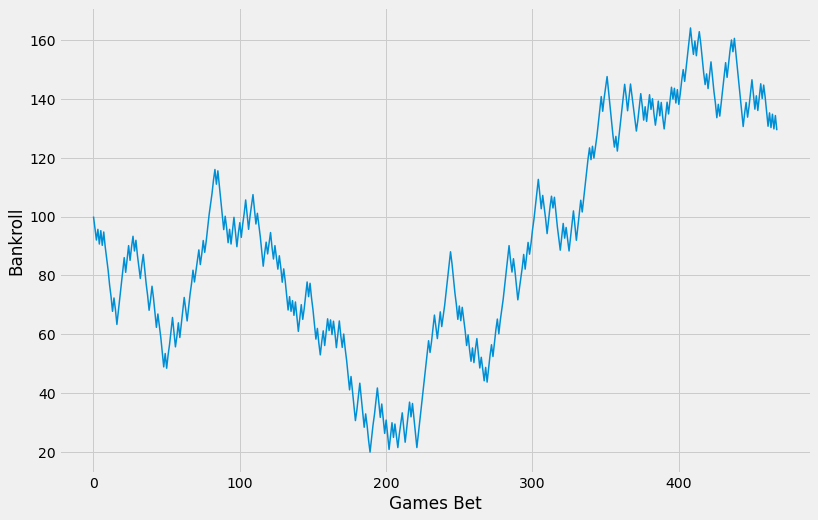

min balance: 19.818181818181962 
max balance: 164.18181818181804 
final balance: 132.99999999999952 
win percentage 52.78 
profit: 33.0 risk: 2193.0 
ROI: 1.5
1
test set 1: 2017-10-28 - 2018-06-08


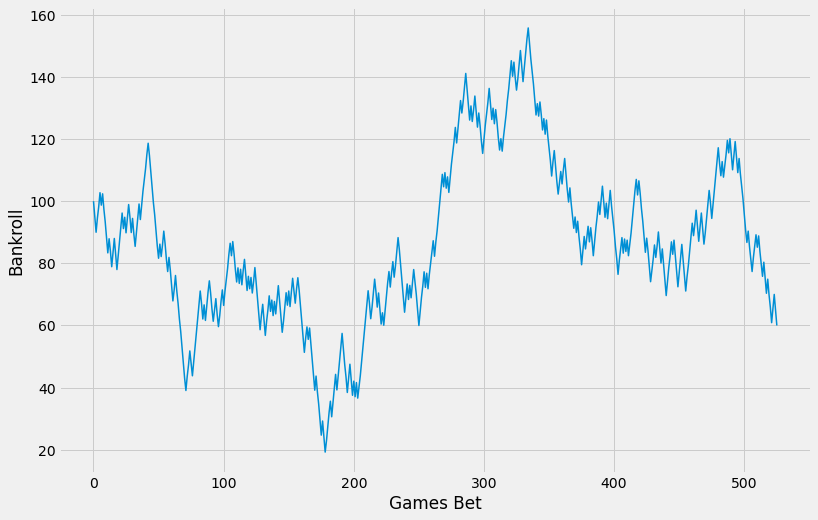

min balance: 19.272727272727394 
max balance: 155.72727272727266 
final balance: 56.0000000000001 
win percentage 51.33 
profit: -44.0 risk: 2459.0 
ROI: -1.79
2
test set 1: 2018-10-26 - 2019-06-13


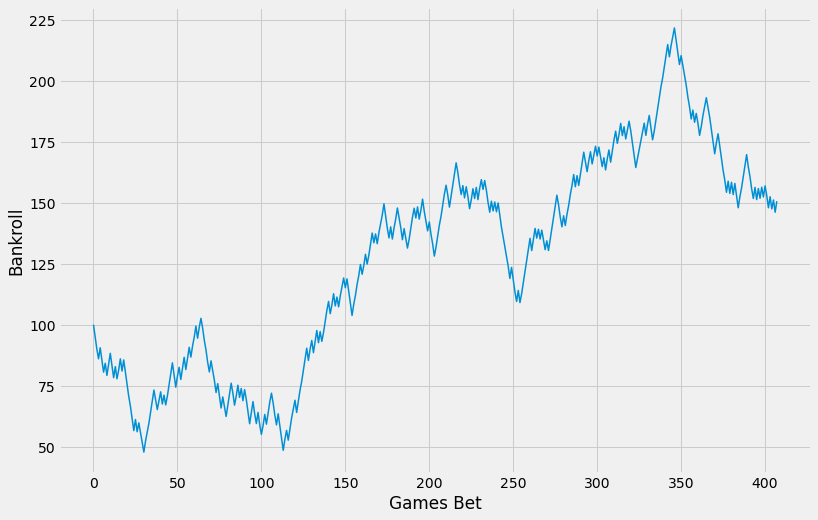

min balance: 47.72727272727274 
max balance: 221.8181818181808 
final balance: 154.36363636363504 
win percentage 53.68000000000001 
profit: 54.36363636363626 risk: 1870.0 
ROI: 2.91
3
test set 1: 2019-11-01 - 2020-10-11


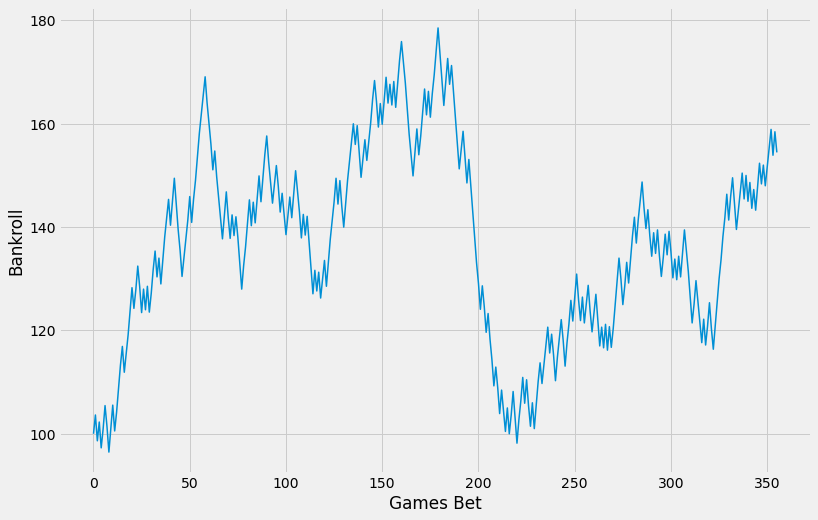

min balance: 96.45454545454547 
max balance: 178.5454545454536 
final balance: 158.0909090909077 
win percentage 54.49 
profit: 58.09090909090901 risk: 1620.0 
ROI: 3.5900000000000003
4
test set 1: 2021-01-01 - 2021-07-20


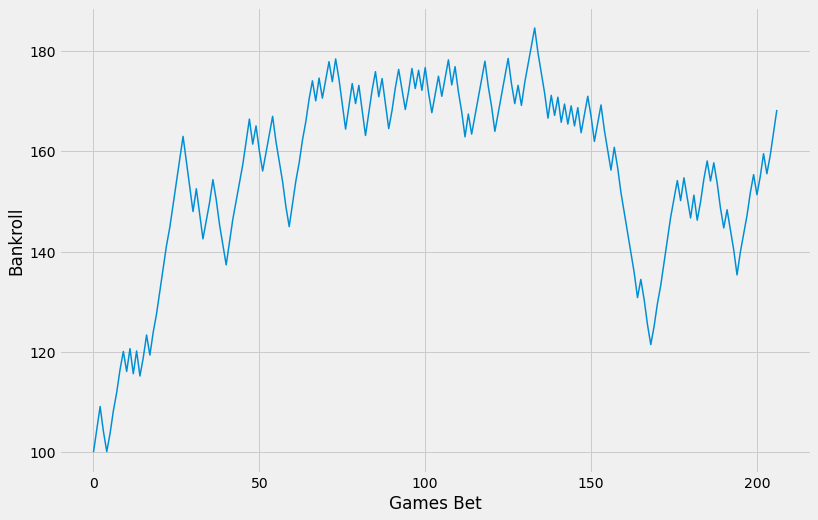

min balance: 100.0909090909091 
max balance: 184.63636363636292 
final balance: 172.8181818181807 
win percentage 56.52 
profit: 72.81818181818176 risk: 918.0 
ROI: 7.93

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('logreg',
                                                 LogisticRegression(C=0.0013219411484660314,
                                                                    max_iter=10000,
                                                                    verbose=1))])),
                               ('sgd_huber',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('sgd',
                                                 SGDClassifier(alpha=0.435791301239703,
                                                               loss='modified_huber',
                                      

,season,best_threshold,win_pcts,num_games_bet,rois,profits
0,"(2016, -, 2017)",0.53,0.527778,468,0.015048,33.000000
1,"(2017, -, 2018)",0.53,0.513308,526,-0.017893,-44.000000
2,"(2018, -, 2019)",0.53,0.536765,408,0.029071,54.363636
3,"(2019, -, 2020)",0.53,0.544944,356,0.035859,58.090909
4,"(2021, -, 2021)",0.53,0.565217,207,0.079323,72.818182


In [212]:
cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21]

threshold = 0.53

for estimator in [best_lgbc, best_knn, stacked_clf]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test, y_train1, y_test, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='D'))

        year = (np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='Y'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='Y'))


        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(df_ewm_19_diffs, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob_avg'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_3(select_bets)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)
    print(results_by_season)

results_by_season

0
test set 1: 2016-11-04 - 2017-06-12


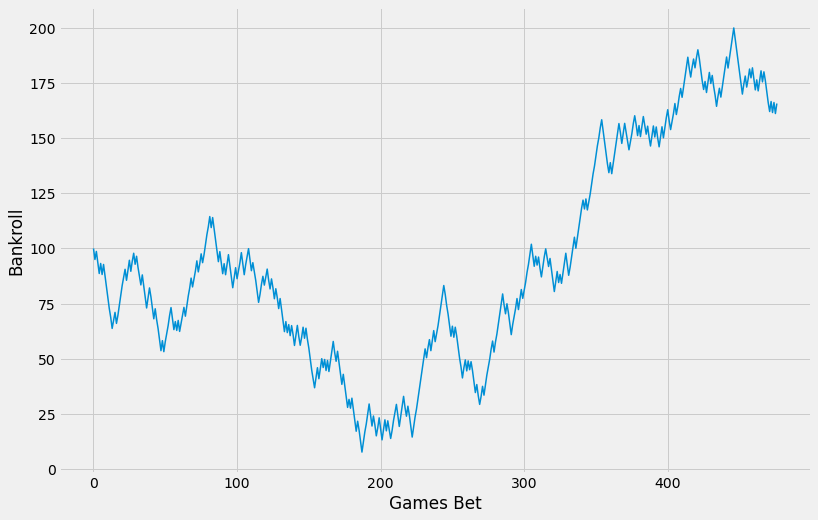

min balance: 7.636363636363797 
max balance: 199.99999999999952 
final balance: 160.7272727272721 
win percentage 53.879999999999995 
profit: 60.72727272727275 risk: 2234.0 
ROI: 2.7199999999999998
1
test set 1: 2017-10-28 - 2018-06-08


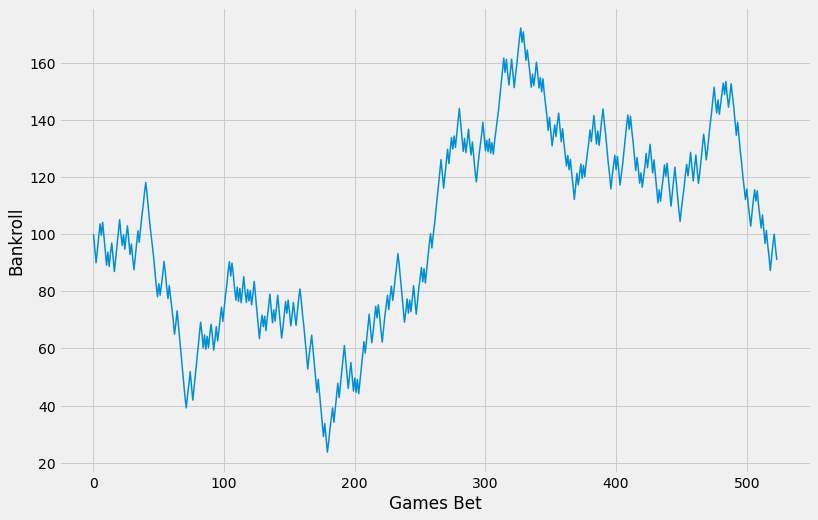

min balance: 23.72727272727286 
max balance: 172.18181818181802 
final balance: 86.99999999999943 
win percentage 52.1 
profit: -13.0 risk: 2449.0 
ROI: -0.53
2
test set 1: 2018-10-26 - 2019-06-13


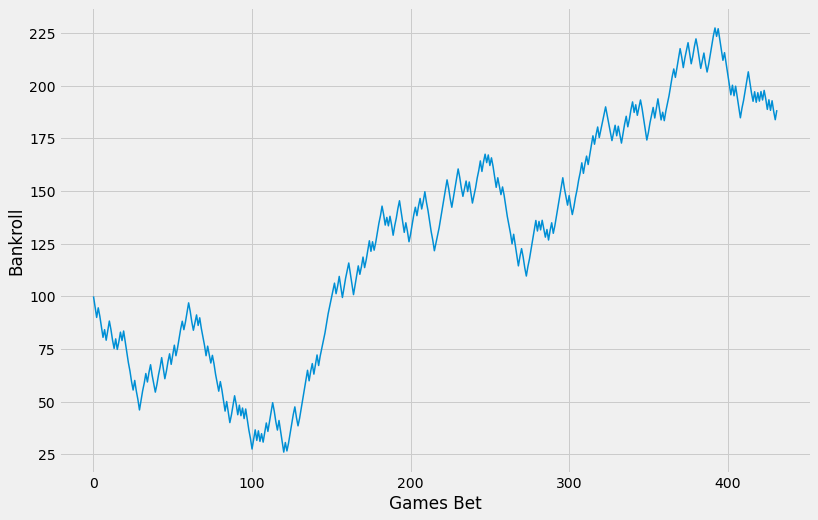

min balance: 26.090909090909157 
max balance: 227.36363636363518 
final balance: 191.9999999999986 
win percentage 54.86 
profit: 91.99999999999989 risk: 1987.0 
ROI: 4.63
3
test set 1: 2019-11-01 - 2020-10-11


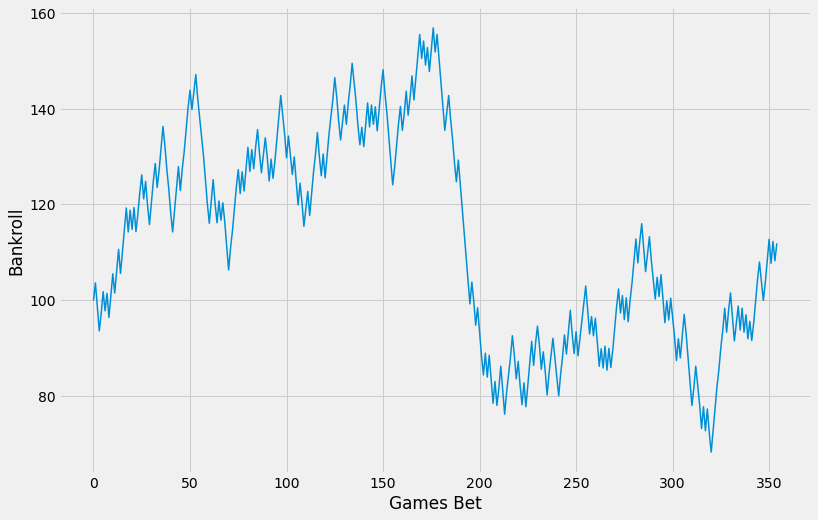

min balance: 68.36363636363595 
max balance: 156.8181818181813 
final balance: 115.54545454545419 
win percentage 52.959999999999994 
profit: 15.545454545454504 risk: 1632.0 
ROI: 0.95
4
test set 1: 2021-01-01 - 2021-07-20


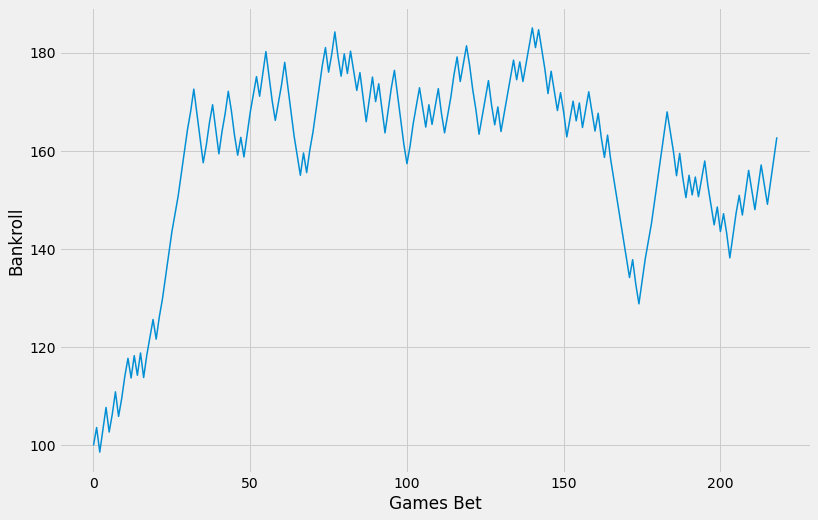

min balance: 98.63636363636364 
max balance: 184.99999999999923 
final balance: 167.27272727272606 
win percentage 55.71 
profit: 67.27272727272725 risk: 977.0 
ROI: 6.890000000000001

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('logreg',
                                                 LogisticRegression(C=0.0027825594022071257,
                                                                    max_iter=10000,
                                                                    verbose=1))])),
                               ('sgd_huber',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('sgd',
                                                 SGDClassifier(alpha=0.09549044557518077,
                                                               loss='modified_huber',
                      

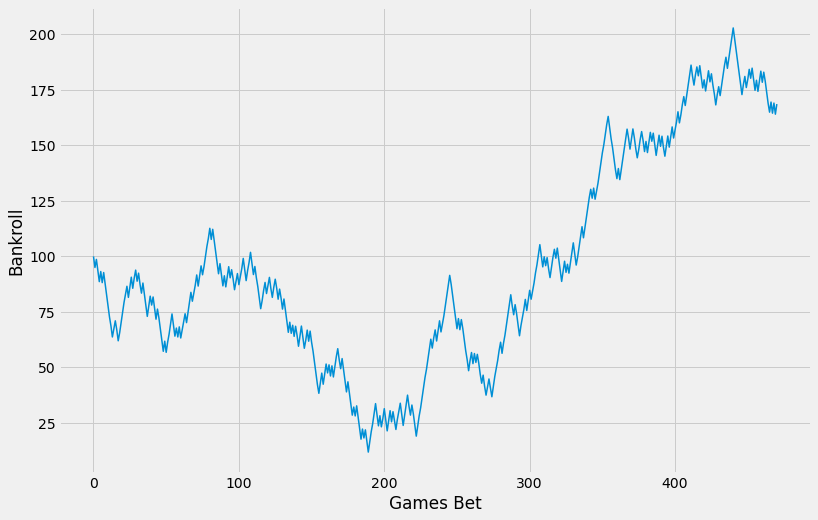

min balance: 11.90909090909108 
max balance: 202.81818181818136 
final balance: 163.54545454545394 
win percentage 54.14 
profit: 63.545454545454504 risk: 2214.0 
ROI: 2.87
1
test set 1: 2017-10-28 - 2018-06-08


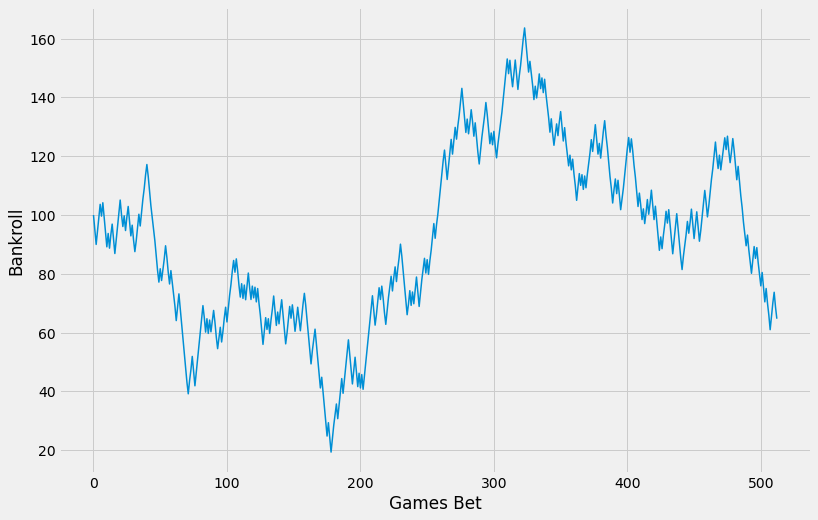

min balance: 19.363636363636452 
max balance: 163.6363636363635 
final balance: 60.727272727272634 
win percentage 51.459999999999994 
profit: -39.27272727272725 risk: 2397.0 
ROI: -1.6400000000000001
2
test set 1: 2018-10-26 - 2019-06-13


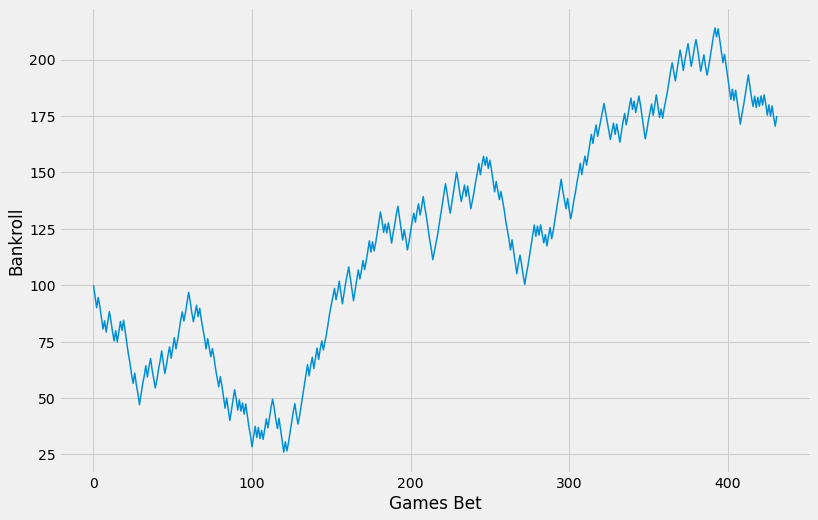

min balance: 26.000000000000064 
max balance: 213.99999999999912 
final balance: 178.63636363636255 
win percentage 54.400000000000006 
profit: 78.63636363636351 risk: 1987.0 
ROI: 3.9600000000000004
3
test set 1: 2019-11-01 - 2020-10-11


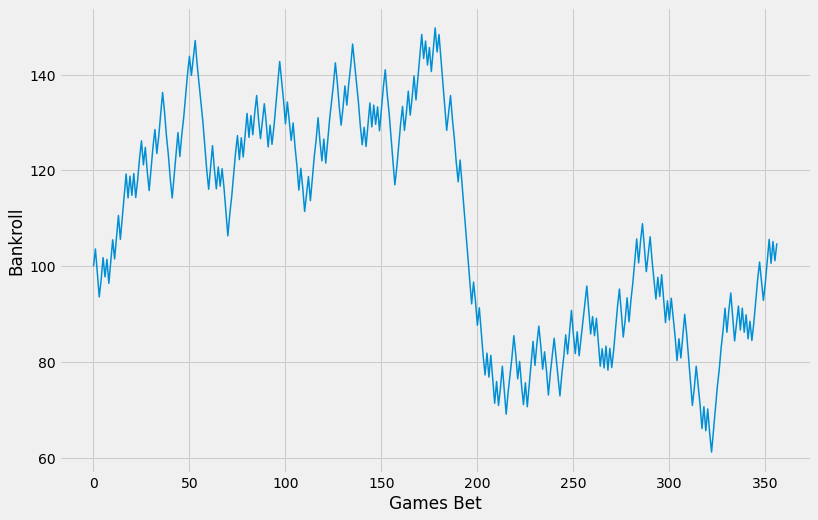

min balance: 61.2727272727269 
max balance: 149.72727272727224 
final balance: 108.45454545454514 
win percentage 52.66 
profit: 8.454545454545382 risk: 1641.0 
ROI: 0.52
4
test set 1: 2021-01-01 - 2021-07-20


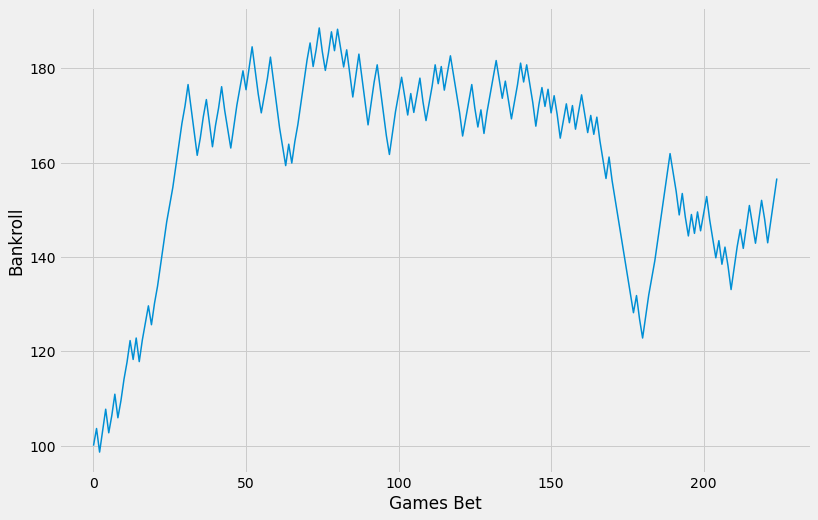

min balance: 98.63636363636364 
max balance: 188.54545454545413 
final balance: 161.18181818181694 
win percentage 55.11000000000001 
profit: 61.18181818181813 risk: 1006.0 
ROI: 6.08

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('logreg',
                                                 LogisticRegression(C=0.0027825594022071257,
                                                                    max_iter=10000,
                                                                    verbose=1))])),
                               ('sgd_huber',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('sgd',
                                                 SGDClassifier(alpha=0.09549044557518077,
                                                               loss='modified_huber',
                      

,season,best_threshold,win_pcts,num_games_bet,rois,profits
0,"(2016, -, 2017)",0.53,0.541401,471,0.028702,63.545455
1,"(2017, -, 2018)",0.53,0.514620,513,-0.016384,-39.272727
2,"(2018, -, 2019)",0.53,0.543981,432,0.039575,78.636364
3,"(2019, -, 2020)",0.53,0.526611,357,0.005152,8.454545
4,"(2021, -, 2021)",0.53,0.551111,225,0.060817,61.181818


In [346]:


cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21]

threshold = 0.53

for estimator in [stacked_clf, stacked_clf2]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test, y_train1, y_test, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='D'))

        year = (np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='Y'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='Y'))


        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(df_ewm_19_diffs, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob_avg'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_3(select_bets)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)
    print(results_by_season)

results_by_season

### Custom Loss NN Pytorch

In [99]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torch.utils.data import TensorDataset, Dataset, DataLoader

In [100]:
torch_scaler = StandardScaler()

X_train_scaled = torch_scaler.fit_transform(X_train)
X_test_scaled = torch_scaler.transform(X_test)

# X_train2_scaled = torch_scaler.fit_transform(X_train2)
# X_test2_scaled = torch_scaler.transform(X_test2)


class MatchupDataset(Dataset):
    
    def __init__(self, features, targets):
        self.targets = targets
        self.features = features
        
    def __len__(self):
        return len(self.features)
    
    def __getitem__(self, index):
        X = self.features[index]
        y = self.targets[index]
        
        return X, y
    
batch_size = 128

training_set1 = MatchupDataset(X_train_scaled, y_train.values)
validation_set1 = MatchupDataset(X_test_scaled, y_test.values)

train_loader1 = DataLoader(training_set1, batch_size = batch_size, shuffle=False)
val_loader1 = DataLoader(validation_set1, batch_size = batch_size, shuffle=False)

# training_set2 = MatchupDataset(X_train2_scaled, y_train2.values)
# validation_set2 = MatchupDataset(X_test2_scaled, y_test2.values)

# train_loader2 = DataLoader(training_set2, batch_size = batch_size, shuffle=False)
# val_loader2 = DataLoader(validation_set2, batch_size = batch_size, shuffle=False)



In [104]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        
        self.fc1 = nn.Linear(X_train.shape[1], 256)
#         self.bn1 = nn.BatchNorm1d(num_features=128)
        self.fc2 = nn.Linear(256, 128)
#         self.bn2 = nn.BatchNorm1d(num_features=64)
        self.fc3 = nn.Linear(128, 64)
#         self.bn3 = nn.BatchNorm1d(num_features=32)
        self.fc4 = nn.Linear(64, 16)
        self.fc5 = nn.Linear(16, 1)
        
        self.dropout = nn.Dropout(0.3)
    
    def forward(self, x):
        x = self.dropout(torch.tanh(self.fc1(x)))
        x = self.dropout(torch.tanh(self.fc2(x)))
        x = self.dropout(torch.tanh(self.fc3(x)))      
        x = self.dropout(torch.tanh(self.fc4(x)))

        x = torch.sigmoid(self.fc5(x))
        return x
        
net = Net() 
print(net)

Net(
  (fc1): Linear(in_features=86, out_features=256, bias=True)
  (fc2): Linear(in_features=256, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=64, bias=True)
  (fc4): Linear(in_features=64, out_features=16, bias=True)
  (fc5): Linear(in_features=16, out_features=1, bias=True)
  (dropout): Dropout(p=0.3, inplace=False)
)


In [105]:
torch.manual_seed(23)

net = Net()

learning_rate = 0.000001
# def my_loss(output, target):
#     residual = (output-target).float()
#     output*
#     return

loss_function = nn.BCELoss()

optimizer = optim.Adam(net.parameters(), lr=learning_rate)

epochs = 1501

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
for e in range(epochs):
    train_loss = 0
    val_loss = 0
    train_correct_preds = 0
    train_total_preds = 0
    
    val_correct_preds = 0
    val_total_preds = 0
 
    net.train()
    
    for (data, target) in  train_loader1:
        optimizer.zero_grad()
        target = target.reshape(-1, 1)
        outputs = net(data.float())
        loss = loss_function(outputs, target.float())
        loss.backward()

        optimizer.step()
        train_loss += loss.item()

        n_correct_preds = (torch.round(outputs)==target).detach().numpy().flatten().astype(int).sum()
        train_correct_preds += n_correct_preds
        train_total_preds += outputs.shape[0]
    train_losses.append(train_loss/X_train.shape[0])
    train_accuracies.append(round(train_correct_preds / train_total_preds, 4))

    with torch.no_grad():
        net.eval()
        for batch_idx, (data, target) in enumerate(val_loader1):
            target = target.reshape(-1, 1)
            outputs = net(data.float())
            loss = loss_function(outputs, target.float())
            val_loss += loss.item()
            n_correct_preds = (torch.round(outputs)==target).detach().numpy().flatten().astype(int).sum()
            val_correct_preds += n_correct_preds
            val_total_preds += outputs.shape[0]

        val_accuracies.append(round(val_correct_preds / val_total_preds, 4))
        val_losses.append(val_loss/X_test.shape[0])
        
    if e % 5 == 0:
        print("Epoch: {}/{}.. ".format(e+1, epochs),
              "Training Loss: {:.7f}.. ".format(train_loss / X_train.shape[0]),
             "Test Loss: {:.7f}.. ".format(val_loss / X_test.shape[0]),
             "Train Accuracy: {:.4f}..".format(train_accuracies[-1]),
             "Test Accuracy: {:.4f}..".format(val_accuracies[-1]))


Epoch: 1/1501..  Training Loss: 0.0054742..  Test Loss: 0.0054432..  Train Accuracy: 0.4985.. Test Accuracy: 0.5000..
Epoch: 6/1501..  Training Loss: 0.0054619..  Test Loss: 0.0054407..  Train Accuracy: 0.5000.. Test Accuracy: 0.5000..
Epoch: 11/1501..  Training Loss: 0.0054643..  Test Loss: 0.0054384..  Train Accuracy: 0.5020.. Test Accuracy: 0.5000..
Epoch: 16/1501..  Training Loss: 0.0054629..  Test Loss: 0.0054364..  Train Accuracy: 0.5006.. Test Accuracy: 0.5000..
Epoch: 21/1501..  Training Loss: 0.0054574..  Test Loss: 0.0054346..  Train Accuracy: 0.5009.. Test Accuracy: 0.5000..
Epoch: 26/1501..  Training Loss: 0.0054532..  Test Loss: 0.0054329..  Train Accuracy: 0.5051.. Test Accuracy: 0.5000..
Epoch: 31/1501..  Training Loss: 0.0054553..  Test Loss: 0.0054313..  Train Accuracy: 0.5043.. Test Accuracy: 0.5000..
Epoch: 36/1501..  Training Loss: 0.0054550..  Test Loss: 0.0054299..  Train Accuracy: 0.4979.. Test Accuracy: 0.5000..
Epoch: 41/1501..  Training Loss: 0.0054494..  Test

KeyboardInterrupt: 

In [197]:
nn_preds1 = net(torch.tensor(X_test1_scaled).float())
nn_preds2 = net(torch.tensor(X_test2_scaled).float())

preds1 = pd.DataFrame({'prob':nn_preds1.detach().numpy().flatten(),
                     'target':y_test1})

preds1['bet_home'] = preds1['prob'].astype(int)
preds1['bet_won'] = (preds1['bet_home'] == preds1['target']).astype(int)
preds1.loc[~preds1['prob'].between(0.49, 0.51)].mean()

prob        0.493061
target      0.508974
bet_home    0.000000
bet_won     0.491026
dtype: float64

In [154]:
test_outputs = np.array([])

for data, target in val_loader1:
    outputs = net(data.float())
#     print(outputs.shape)
#     print(test_outputs.shape)
    test_outputs = np.concatenate([test_outputs, outputs.detach().numpy().flatten()])

# correct_pred = (torch.sign(test_outputs)==torch.sign(target)).detach().numpy().flatten()
preds = pd.DataFrame({'preds':test_outputs, 'target':point_diff_test1})
# test_outputs.detach().numpy().flatten()

select_bets_nn, bet_thresholds_nn = find_optimal_confidence_thresholds(df_ewm_diffs_19, test_outputs,
                                                                               test_idx1)
simulate_bets(select_bets_nn)


NameError: name 'point_diff_test1' is not defined

In [181]:
bet_thresholds_nn.loc[bet_thresholds_nn['prediction_num']==3]

,index,prediction_num,confidence_thresholds,num_games_bet,win_percentage,expected_profits
36,2146,3,1.47,1584,0.545455,8640
40,2147,3,1.48,1567,0.544990,8396
41,2189,3,1.90,1153,0.554206,8388
44,2145,3,1.46,1602,0.544320,8360
48,2149,3,1.50,1548,0.544574,8160
...,...,...,...,...,...,...
875,2567,3,5.68,15,0.533333,44
876,2568,3,5.69,15,0.533333,44
877,2569,3,5.70,15,0.533333,44
878,2570,3,5.71,15,0.533333,44


In [216]:
print(len(val_loader2) * 32)

X_test2.shape

7008


(6992, 164)

In [217]:
net = Net()

learning_rate = 0.000005
def my_loss(output, target):
#     residual = (output-target).float()
#     choicelist = [torch.where(output<0, residual**2, 3*residual**2), torch.where(output<0, 3*residual**2, residual**2)]
#     loss = torch.where(target<0, choicelist[0], choicelist[1])
    loss = -torch.log(torch.sigmoid((torch.sign(target) * (output - target))))
    return torch.mean(loss)

loss_function = nn.MSELoss()

optimizer = optim.Adam(net.parameters(), lr=learning_rate, weight_decay=0)

epochs = 160

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
for e in range(epochs):
    train_loss = 0
    val_loss = 0
    train_correct_preds = 0
    train_total_preds = 0
    
    val_correct_preds = 0
    val_total_preds = 0
 
    net.train()
    
    for (data, target) in  train_loader2:
        optimizer.zero_grad()
        target = target.reshape(-1, 1)
        outputs = net(data.float())
        loss = loss_function(outputs, target.float())
        loss.backward()

        optimizer.step()
        train_loss += loss.item()

#         n_correct_preds = (torch.sign(outputs)==torch.sign(target)).detach().numpy().flatten().astype(int).sum()
#         train_correct_preds += n_correct_preds
#         train_total_preds += outputs.shape[0]
    train_losses.append(train_loss/X_train2.shape[0])
#     train_accuracies.append(round(train_correct_preds / train_total_preds, 4))

    with torch.no_grad():
        net.eval()
        for batch_idx, (data, target) in enumerate(val_loader2):
            target = target.reshape(-1, 1)
            outputs = net(data.float())
            loss = loss_function(outputs, target.float())
            val_loss += loss.item()
#             n_correct_preds = (torch.sign(outputs)==torch.sign(target)).detach().numpy().flatten().astype(int).sum()
#             val_correct_preds += n_correct_preds
#             val_total_preds += outputs.shape[0]

#         val_accuracies.append(round(val_correct_preds / val_total_preds, 4))
        val_losses.append(val_loss/X_test2.shape[0])
        
    if e % 10 == 0:
        print("Epoch: {}/{}.. ".format(e, epochs),
              "Training Loss: {:.6f}.. ".format(train_loss / X_train2.shape[0]),
             "Test Loss: {:.6f}.. ".format(val_loss / X_test2.shape[0]))


Epoch: 0/160..  Training Loss: 5.806562..  Test Loss: 6.386216.. 
Epoch: 10/160..  Training Loss: 5.221600..  Test Loss: 5.761154.. 
Epoch: 20/160..  Training Loss: 4.836733..  Test Loss: 5.370768.. 
Epoch: 30/160..  Training Loss: 4.779824..  Test Loss: 5.300383.. 
Epoch: 40/160..  Training Loss: 4.698755..  Test Loss: 5.242830.. 
Epoch: 50/160..  Training Loss: 4.632791..  Test Loss: 5.191969.. 
Epoch: 60/160..  Training Loss: 4.594651..  Test Loss: 5.150405.. 
Epoch: 70/160..  Training Loss: 4.547083..  Test Loss: 5.117874.. 
Epoch: 80/160..  Training Loss: 4.509670..  Test Loss: 5.097426.. 
Epoch: 90/160..  Training Loss: 4.496081..  Test Loss: 5.084373.. 
Epoch: 100/160..  Training Loss: 4.461044..  Test Loss: 5.077161.. 
Epoch: 110/160..  Training Loss: 4.447700..  Test Loss: 5.073328.. 
Epoch: 120/160..  Training Loss: 4.429356..  Test Loss: 5.069898.. 
Epoch: 130/160..  Training Loss: 4.428498..  Test Loss: 5.068149.. 
Epoch: 140/160..  Training Loss: 4.414505..  Test Loss: 5.0

In [218]:
preds_train2 = net(torch.tensor(X_train2_scaled).float()).detach().numpy()
preds_test2 = net(torch.tensor(X_test2_scaled).float()).detach().numpy()

mae_diff_train: 9.165797430162671 mae_diff_test: 9.885434602811353
Train Betting Overall Accuracy: 0.5407401524777636
Test Betting Overall Accuracy: 0.5099648300117233


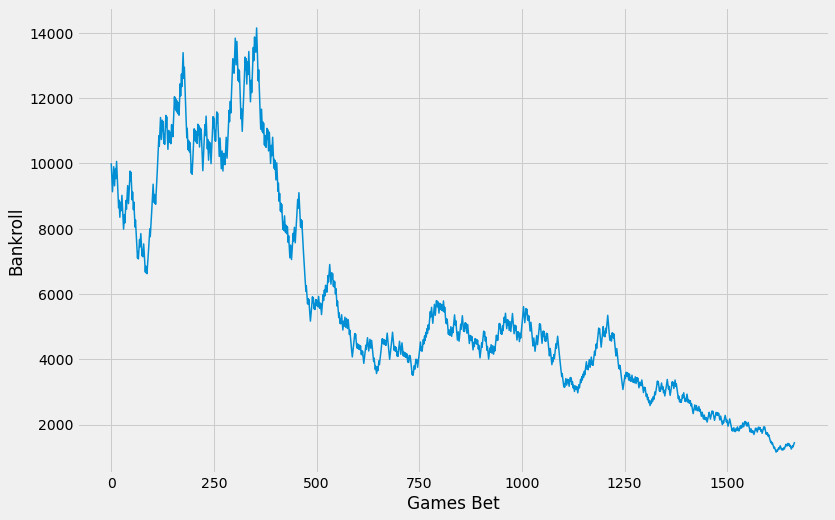

min balance: 1155.4883030792748 
max balance: 14142.122593625492 
final balance: 1502.3531346025138 
win percentage 51.11


,index,GAME_ID,MATCHUP_home,spread_home,ml_home,ml_away,team_score_home,team_score_away,point_diff_home,cover_home,diff_preds_home,diff_preds_away,point_diff_avg,bet_home1,bet_home2,bet_home3,confidence_pred1,confidence_pred2,confidence_pred3,bankroll_i,bankroll_n,bet_size,bet_won
0,0,21700077,NOP vs. CLE,2.5,2.150000,1.740741,123,101,22,1,-6.313794,6.844114,-6.578954,0,0,0,-3.813794,-4.344114,-4.078954,10000.000000,9700.000000,300.000000,0
1,1,21700080,MEM vs. HOU,-2.0,1.800000,2.050000,103,89,14,1,-1.591051,1.323781,-1.457416,0,0,0,-3.591051,-3.323781,-3.457416,9700.000000,9409.000000,291.000000,0
2,2,21700081,DAL vs. PHI,1.0,2.000000,1.833333,110,112,-2,0,-0.577614,-3.686752,1.554569,1,1,1,0.422386,4.686752,2.554569,9409.000000,9126.730000,282.270000,0
3,4,21700083,POR vs. PHX,-12.0,1.133333,6.000000,114,107,7,0,9.790244,-9.372024,9.581134,0,0,0,-2.209756,-2.627976,-2.418866,9126.730000,9375.640818,273.801900,1
4,6,21700086,IND vs. SAS,6.5,3.110000,1.357143,97,94,3,1,-3.780788,2.469774,-3.125281,1,1,1,2.719212,4.030226,3.374719,9375.640818,9631.340113,281.269225,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1660,3485,41900304,MIA vs. BOS,3.5,2.380000,1.588235,112,109,3,1,-1.046955,-0.073273,-0.486841,1,1,1,2.453045,3.573273,3.013159,1313.237380,1349.052944,39.397121,1
1661,3489,41900306,MIA vs. BOS,3.0,2.200000,1.714286,125,113,12,1,-1.202846,0.949766,-1.076306,1,1,1,1.797154,2.050234,1.923694,1349.052944,1385.845297,40.471588,1
1662,3491,41900402,LAL vs. MIA,-11.0,1.157480,4.930000,124,114,10,0,7.784851,-8.259991,8.022421,0,0,0,-3.215149,-2.740009,-2.977579,1385.845297,1423.641078,41.575359,1
1663,3492,41900403,MIA vs. LAL,9.5,4.300000,1.210526,115,104,11,1,-7.161108,6.006633,-6.583870,1,1,1,2.338892,3.493367,2.916130,1423.641078,1462.467653,42.709232,1


In [220]:
mae_diff_train = mean_absolute_error(point_diff_train2, preds_train2)
mae_diff_test = mean_absolute_error(point_diff_test2, preds_test2)

print("mae_diff_train:", mae_diff_train, "mae_diff_test:", mae_diff_test)


bets_train = create_betting_df(df_19, preds_train2, train_idx2, 3)
print("Train Betting Overall Accuracy:", bets_train['bet_won'].mean())


bets_test = create_betting_df(df_19, preds_test2, test_idx2, 3)
print("Test Betting Overall Accuracy:", bets_test['bet_won'].mean())


bets = create_betting_df(df_19, preds_test2, test_idx2, 3)
select_bets = bets.loc[abs(bets['confidence_pred3']) > 1.47]    
simulate_bets(select_bets)


In [224]:
df_19.loc[test_idx2]

,SEASON_YEAR_x,SEASON_ID_x,TEAM_ID_x,TEAM_ABBREVIATION_x,TEAM_NAME_x,GAME_ID,GAME_DATE_x,MATCHUP_x,HOME_GAME_x,SCORE_team_x,point_diff_team_x,WL_team_x,ml_team_x,spread_team_x,team_covered_team_x,RECORD_team_x,FG2M_team_x,FG2A_team_x,FG3M_team_x,FG3A_team_x,FTM_team_x,FTA_team_x,OREB_team_x,DREB_team_x,REB_team_x,AST_team_x,STL_team_x,BLK_team_x,TOV_team_x,PF_team_x,PTS_team_x,PLUS_MINUS_team_x,E_OFF_RATING_team_x,E_DEF_RATING_team_x,E_NET_RATING_team_x,POSS_team_x,PIE_team_x,PTS_2PT_MR_team_x,PTS_FB_team_x,PTS_OFF_TOV_team_x,PTS_PAINT_team_x,AST_2PM_team_x,UAST_2PM_team_x,AST_3PM_team_x,UAST_3PM_team_x,team_covered_opp_x,RECORD_opp_x,FG2M_opp_x,FG2A_opp_x,FG3M_opp_x,FG3A_opp_x,FTM_opp_x,FTA_opp_x,OREB_opp_x,DREB_opp_x,REB_opp_x,AST_opp_x,STL_opp_x,BLK_opp_x,TOV_opp_x,PF_opp_x,PTS_opp_x,PLUS_MINUS_opp_x,E_OFF_RATING_opp_x,E_DEF_RATING_opp_x,E_NET_RATING_opp_x,POSS_opp_x,PIE_opp_x,PTS_2PT_MR_opp_x,PTS_FB_opp_x,PTS_OFF_TOV_opp_x,PTS_PAINT_opp_x,AST_2PM_opp_x,UAST_2PM_opp_x,AST_3PM_opp_x,UAST_3PM_opp_x,WL_record_x,ATS_record_x,rest_x,OREB_PCT_team_x,OREB_PCT_opp_x,DREB_PCT_team_x,DREB_PCT_opp_x,REB_PCT_team_x,REB_PCT_opp_x,TS_PCT_team_x,TS_PCT_opp_x,EFG_PCT_team_x,EFG_PCT_opp_x,AST_RATIO_team_x,AST_RATIO_opp_x,TOV_PCT_team_x,TOV_PCT_opp_x,team_elo_pred_x,team_rating_i_x,team_rating_n_x,opp_rating_i_x,opp_rating_n_x,elo_MOV_pred_x,WL_team_y,team_covered_team_y,RECORD_team_y,FG2M_team_y,FG2A_team_y,FG3M_team_y,FG3A_team_y,FTM_team_y,FTA_team_y,OREB_team_y,DREB_team_y,REB_team_y,AST_team_y,STL_team_y,BLK_team_y,TOV_team_y,PF_team_y,PTS_team_y,PLUS_MINUS_team_y,E_OFF_RATING_team_y,E_DEF_RATING_team_y,E_NET_RATING_team_y,POSS_team_y,PIE_team_y,PTS_2PT_MR_team_y,PTS_FB_team_y,PTS_OFF_TOV_team_y,PTS_PAINT_team_y,AST_2PM_team_y,UAST_2PM_team_y,AST_3PM_team_y,UAST_3PM_team_y,team_covered_opp_y,RECORD_opp_y,FG2M_opp_y,FG2A_opp_y,FG3M_opp_y,FG3A_opp_y,FTM_opp_y,FTA_opp_y,OREB_opp_y,DREB_opp_y,REB_opp_y,AST_opp_y,STL_opp_y,BLK_opp_y,TOV_opp_y,PF_opp_y,PTS_opp_y,PLUS_MINUS_opp_y,E_OFF_RATING_opp_y,E_DEF_RATING_opp_y,E_NET_RATING_opp_y,POSS_opp_y,PIE_opp_y,PTS_2PT_MR_opp_y,PTS_FB_opp_y,PTS_OFF_TOV_opp_y,PTS_PAINT_opp_y,AST_2PM_opp_y,UAST_2PM_opp_y,AST_3PM_opp_y,UAST_3PM_opp_y,WL_record_y,ATS_record_y,rest_y,OREB_PCT_team_y,OREB_PCT_opp_y,DREB_PCT_team_y,DREB_PCT_opp_y,REB_PCT_team_y,REB_PCT_opp_y,TS_PCT_team_y,TS_PCT_opp_y,EFG_PCT_team_y,EFG_PCT_opp_y,AST_RATIO_team_y,AST_RATIO_opp_y,TOV_PCT_team_y,TOV_PCT_opp_y,covered
25627,2017-18,22017,1610612739,CLE,Cleveland Cavaliers,21700077,2017-10-28,CLE @ NOP,0,101,-22,0,1.740741,-2.5,0.178018,0.558008,28.831604,52.752582,10.590584,29.996386,18.234256,23.556323,9.175820,35.419184,44.595004,21.743279,5.015824,4.928182,16.198799,15.960904,107.669214,0.026690,108.027887,107.869261,0.134207,98.647603,0.509433,12.714366,7.781519,18.355205,43.926864,12.130717,15.700886,8.330786,1.639789,0.821982,0.441992,24.952700,51.782521,14.489951,36.765940,14.267271,18.082709,9.439794,31.011135,40.450929,25.003883,8.094576,3.575590,12.778247,22.177578,107.642524,-0.026690,107.869261,108.027887,-0.134207,98.207590,0.490567,11.288198,7.643672,17.887549,37.325364,12.034016,12.138458,12.016263,1.811922,0.600000,0.200000,3.0,0.228328,0.210433,0.789567,0.771672,0.524364,0.475636,0.612234,0.581684,0.540399,0.527255,22.041365,25.460235,14.818791,11.692794,0.640724,1642.277699,1621.509052,1472.780374,1493.549021,6.05,1,0.620009,0.441992,27.862885,53.072550,11.100266,31.151010,18.730287,25.365657,9.919562,36.167493,46.087055,21.282875,7.154013,5.894655,17.225660,23.879783,107.756856,-2.206344,104.786919,106.145557,-1.336661,103.664990,0.480218,5.915167,8.965007,14.658470,48.773021,11.160851,15.702034,8.895631,1.580450,0.379991,0.558008,29.516740,59.496300,10.333545,28.364851,19.929086,25.359771,11.140509,34.456790,45.597299,23.388171,7.142414,6.652048,15.619936,22.474152,109.963200,2.206344,106.145557,104.786919,1.336661,104.185417,0.519782,11.779053,14.018827,17.028107,46.812434,14.766233,13.910723,8.246123,1.551391,0.400000,0

In [227]:
test = df_19.loc[test_idx2]
(abs(test['spread_team_x'] + test['point_diff_team_x'])).mean()

9.767019450800916

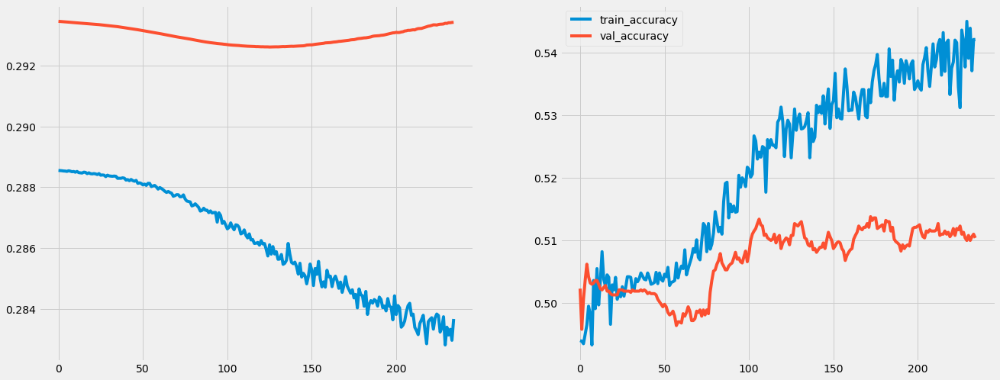

In [492]:
fig, axs = plt.subplots(1, 2, figsize=(20,8))
axs[0].plot(train_losses, label='train_loss')
axs[0].plot(val_losses, label='val_loss')

axs[1].plot(train_accuracies, label='train_accuracy')
axs[1].plot(val_accuracies, label='val_accuracy')
plt.legend()
plt.show()

In [482]:
net2 =Net()

learning_rate = 0.000001
def my_loss(output, target):
    residual = (output-target).float()
    choicelist = [torch.where(output<=0, residual**2, 3*residual**2), torch.where(output<=0, 3*residual**2, residual**2)]
    loss = torch.where(target<=0, choicelist[0], choicelist[1])
#     loss = -torch.log(torch.sigmoid((torch.sign(target) * torch.clamp((output - target), -20, 20))))
    return torch.mean(loss)

loss_function = nn.MSELoss()

optimizer = optim.Adam(net2.parameters(), lr=learning_rate, weight_decay=0)

epochs = 500

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
for e in range(epochs):
    train_loss = 0
    val_loss = 0
    train_correct_preds = 0
    train_total_preds = 0
    
    val_correct_preds = 0
    val_total_preds = 0
 
    net2.train()
    
    for (data, target) in  train_loader:
        optimizer.zero_grad()
        target = target.reshape(-1, 1)
        outputs = net2(data.float())
        loss = loss_function(outputs, target.float())
        loss.backward()

        optimizer.step()
        train_loss += loss.item()

        n_correct_preds = (torch.sign(outputs)==torch.sign(target)).detach().numpy().flatten().astype(int).sum()
        train_correct_preds += n_correct_preds
        train_total_preds += outputs.shape[0]
    train_losses.append(train_loss/X_train_ewm_19.shape[0])
    train_accuracies.append(round(train_correct_preds / train_total_preds, 4))

    with torch.no_grad():
        net2.eval()
        for batch_idx, (data, target) in enumerate(val_loader):
            target = target.reshape(-1, 1)
            outputs = net2(data.float())
            loss = loss_function(outputs, target.float())
            val_loss += loss.item()
            n_correct_preds = (torch.sign(outputs)==torch.sign(target)).detach().numpy().flatten().astype(int).sum()
            val_correct_preds += n_correct_preds
            val_total_preds += outputs.shape[0]

        val_accuracies.append(round(val_correct_preds / val_total_preds, 4))
        val_losses.append(val_loss/X_test_ewm_19.shape[0])
        
    if e % 20 == 0:
        print("Epoch: {}/{}.. ".format(e+1, epochs),
              "Training Loss: {:.6f}.. ".format(train_loss / X_train_ewm_19.shape[0]),
             "Test Loss: {:.6f}.. ".format(val_loss / X_test_ewm_19.shape[0]),
             "Training Accuracy {:.3f}..".format(train_accuracies[-1]), 
             "Validation Accuracy {:.3f}..".format(val_accuracies[-1]))


Epoch: 1/500..  Training Loss: 4.285663..  Test Loss: 4.377806..  Training Accuracy 0.510.. Validation Accuracy 0.503..
Epoch: 21/500..  Training Loss: 4.285192..  Test Loss: 4.377680..  Training Accuracy 0.512.. Validation Accuracy 0.501..
Epoch: 41/500..  Training Loss: 4.284325..  Test Loss: 4.377541..  Training Accuracy 0.509.. Validation Accuracy 0.503..
Epoch: 61/500..  Training Loss: 4.282853..  Test Loss: 4.377401..  Training Accuracy 0.517.. Validation Accuracy 0.502..
Epoch: 81/500..  Training Loss: 4.284114..  Test Loss: 4.377295..  Training Accuracy 0.510.. Validation Accuracy 0.501..
Epoch: 101/500..  Training Loss: 4.283797..  Test Loss: 4.377206..  Training Accuracy 0.514.. Validation Accuracy 0.501..
Epoch: 121/500..  Training Loss: 4.282302..  Test Loss: 4.377129..  Training Accuracy 0.512.. Validation Accuracy 0.500..
Epoch: 141/500..  Training Loss: 4.282051..  Test Loss: 4.377056..  Training Accuracy 0.514.. Validation Accuracy 0.501..
Epoch: 161/500..  Training Los

KeyboardInterrupt: 

In [493]:
train_outputs = np.array([])
train_outputs2 = np.array([])
train_targets = np.array([])
for data, target in train_loader:
    outputs = net(data.float())
    outputs2 = net2(data.float())
#     print(outputs.shape)
#     print(test_outputs.shape)
    train_outputs = np.concatenate([train_outputs, outputs.detach().numpy().flatten()])
    train_outputs2 = np.concatenate([train_outputs2, outputs2.detach().numpy().flatten()])

    train_targets = np.concatenate([train_targets, target.detach().numpy().flatten()])
# correct_pred = (torch.sign(test_outputs)==torch.sign(target)).detach().numpy().flatten()
train_preds = pd.DataFrame({'preds':train_outputs, 'preds2':train_outputs2, 'target':train_targets})
# test_outputs.detach().numpy().flatten()
train_preds

,preds,preds2,target
0,-1.569377,-0.411728,4.5
1,2.848549,-0.101551,-1.5
2,-0.019031,-0.067838,3.5
3,2.170247,-0.185665,-19.5
4,-3.343860,-0.671299,-10.0
...,...,...,...
11767,0.601759,0.044105,28.5
11768,0.989692,0.048848,-13.5
11769,1.633067,0.119707,-20.5
11770,2.350058,0.031689,12.0


In [481]:
train_preds['preds2'].describe()

count    11772.000000
mean        -0.051085
std          0.081908
min         -0.467047
25%         -0.102110
50%         -0.046459
75%          0.006428
max          0.208395
Name: preds2, dtype: float64

In [465]:
y_pred = net(data.float())

preds_df = pd.DataFrame({"y_true":target.detach().numpy().flatten(), "y_pred":y_pred.detach().numpy().flatten()})
preds_df

,y_true,y_pred
0,-1.0,-0.362796
1,2.5,0.376909
2,-11.5,0.066797
3,3.0,0.101686
4,-9.5,0.647189
5,13.0,0.814767
6,8.5,0.058365
7,23.0,0.676957
8,-14.0,0.330269
9,20.0,1.236707


In [494]:
test_outputs = np.array([])
test_outputs2 = np.array([])

for data, target in val_loader:
    outputs = net(data.float())
    outputs2 = net2(data.float())
#     print(outputs.shape)
#     print(test_outputs.shape)
    test_outputs = np.concatenate([test_outputs, outputs.detach().numpy().flatten()])
    test_outputs2 = np.concatenate([test_outputs2, outputs2.detach().numpy().flatten()])

# correct_pred = (torch.sign(test_outputs)==torch.sign(target)).detach().numpy().flatten()
preds = pd.DataFrame({'preds':test_outputs, 'preds2':test_outputs2, 'target':spread_point_diff_test_ewm_19})
# test_outputs.detach().numpy().flatten()

In [495]:
preds['bet_won'] = (np.sign(preds['preds']) == np.sign(preds['target'])).astype(int)
print(preds['bet_won'].mean())
preds['pred_probs'] = 1 / (1 + np.exp(-preds['preds']/10))
preds['pred_scaled'] = preds['preds']*10
preds['bet_home'] = (preds['preds'] > 0).astype(int)

0.5010620220900595


In [496]:
preds


,preds,preds2,target,bet_won,pred_probs,pred_scaled,bet_home
11772,3.245110,0.129812,-10.5,0,0.580423,32.451100,1
11773,-5.352964,-0.005315,31.5,0,0.369282,-53.529644,0
11774,-0.912930,-0.088472,-3.5,1,0.477193,-9.129300,0
11775,2.345120,0.156321,13.5,1,0.558361,23.451197,1
11776,-0.504047,-0.434542,12.0,0,0.487401,-5.040472,0
...,...,...,...,...,...,...,...
16475,3.186399,0.029901,-1.0,0,0.578993,31.863995,1
16476,1.176630,0.109124,20.5,1,0.529382,11.766295,1
16477,0.970830,0.048862,1.5,1,0.524252,9.708300,1
16478,1.041771,0.114306,-10.5,0,0.526021,10.417712,1


C:\Users\Jordan Nishimura\Anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


best thresholds: 2.32
num_games_bet: 1623
win percetange at threshold: 0.5465187923598275


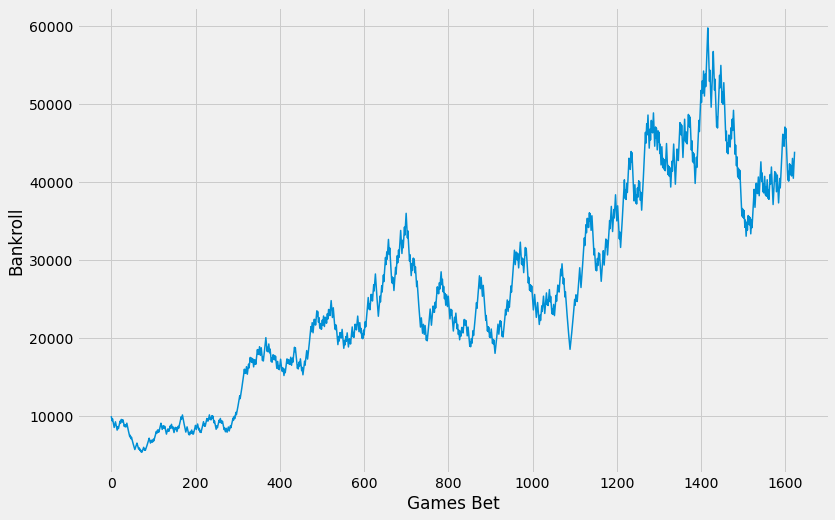

min balance: 5394.227702928191 
max balance: 59766.325969626225 
final balance: 42585.72589427221 
win percentage 54.65


,index,GAME_DATE,spread,point_diff_team,confidence_preds,home_cover,bet_home,bet_won,bankroll_i,bankroll_n,bet_size
0,11772,2016-11-04 00:00:00,3.5,-14.0,3.245110,0.0,1,0,10000.000000,9700.000000,300.000000
1,11773,2016-11-04 00:00:00,11.5,20.0,-5.352964,1.0,0,0,9700.000000,9409.000000,291.000000
2,11775,2016-11-05 00:00:00,-3.5,17.0,2.345120,1.0,1,1,9409.000000,9665.609091,282.270000
3,11778,2016-11-05 00:00:00,-4.5,-24.0,2.687921,0.0,1,0,9665.609091,9375.640818,289.968273
4,11785,2016-11-07 00:00:00,-5.5,12.0,-6.921419,1.0,0,0,9375.640818,9094.371594,281.269225
...,...,...,...,...,...,...,...,...,...,...,...
1618,16446,2020-09-04 00:00:00,-5.5,-15.0,3.672901,0.0,1,0,41750.656697,40498.136996,1252.519701
1619,16448,2020-09-05 00:00:00,-9.0,-9.0,-4.396315,0.0,0,1,40498.136996,41602.631641,1214.944110
1620,16450,2020-09-06 00:00:00,-6.0,8.0,2.686229,1.0,1,1,41602.631641,42737.248868,1248.078949
1621,16464,2020-09-17 00:00:00,-3.0,-5.0,-4.081581,0.0,0,1,42737.248868,43902.810200,1282.117466


In [497]:
select_bets_nn, best_thresholds_nn = find_optimal_confidence_thresholds(test_outputs, test_indices)
simulate_bets(select_bets_nn)

In [459]:
(select_bets_nn['confidence_preds']>0).mean()

0.0

### Train NN on Full Data



In [397]:
df_2020 = load_current_season_team_data('2020-21')
df_2020 = clean_team_data(df_2020)
df_2020 = prep_for_aggregation(df_2020)
df_2020 = create_matchups(df_2020)
df_2020 = add_spread_data(df_2020)
df_2020 = get_team_and_opp_ewm(df_2020)
df_2020 = add_rest_days(df_2020)

df_2020 = add_percentage_features(df_2020)

df_2020 = compute_matchup_diffs(df_2020)

df_2020 = add_elo_ratings(df_2020, final_elo_2020)

features_2020 = df_2020[X_train_hd.columns]
features_2020 = features_2020.dropna()

Progress: 100%|██████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.12it/s]
progress:: 603it [00:00, 830.59it/s]


In [400]:
spread_point_diff_2020 = df_2020['point_diff_team'] + df_2020['home_spread_mode']
spread_point_diff_2020

0      15.5
1     -13.5
2       5.0
3     -10.5
4      -6.5
       ... 
598    26.5
599     1.0
600    -5.0
601     3.5
602   -18.5
Length: 603, dtype: float64

In [401]:
features_ewm_19.shape, spread_point_diff_ewm_19.shape, features_2020.shape
full_data = pd.concat([features_ewm_19, features_2020])
spread_point_diff_full = pd.concat([spread_point_diff_ewm_19, spread_point_diff_2020])

full_data.shape, spread_point_diff_full.shape

((17083, 90), (17083,))

In [410]:
x = pd.concat([full_data, spread_point_diff_full], axis=1)
x.rename(columns={0:'target'}, inplace=True)
x.to_csv("../data/clean_data_ewm_19.csv", index=False)

In [498]:
nn_scaler = StandardScaler()

full_dataset = MatchupDataset(nn_scaler.fit_transform(full_data), spread_point_diff_full.values)

full_data_loader = DataLoader(full_dataset, batch_size = batch_size, shuffle=False) 

net_full = Net()

learning_rate = 0.00001
def my_loss(output, target):
#     residual = (output-target).float()
#     choicelist = [torch.where(output<0, residual**2, 3*residual**2), torch.where(output<0, 3*residual**2, residual**2)]
#     loss = torch.where(target<0, choicelist[0], choicelist[1])
    loss = -torch.log(torch.sigmoid((torch.sign(target) * (output - target))))
    return torch.mean(loss)

loss_function = nn.MSELoss()

optimizer = optim.Adam(net_full.parameters(), lr=learning_rate, weight_decay=0)

epochs = 131

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
for e in tqdm(range(epochs), desc='progress'):
    train_loss = 0
    train_correct_preds = 0
    train_total_preds = 0

    net_full.train()
    
    for (data, target) in  train_loader:
        optimizer.zero_grad()
        target = target.reshape(-1, 1)
        outputs = torch.clamp(net_full(data.float()), -10, 10)
        loss = my_loss(outputs, target.float())
        loss.backward()

        optimizer.step()

progress: 100%|██████████████████████████████████████████████████████████████████████| 131/131 [01:36<00:00,  1.35it/s]


### Test Model on current Season

In [279]:
df_2020 = load_current_season_team_data('2020-21')
df_2020 = clean_team_data(df_2020)
df_2020 = prep_for_aggregation(df_2020)
df_2020 = create_matchups(df_2020)
df_2020 = add_spread_data(df_2020)
df_2020 = get_team_and_opp_ewm(df_2020)
df_2020 = add_rest_days(df_2020)

df_2020 = add_percentage_features(df_2020)

df_2020 = compute_matchup_diffs(df_2020)

Progress: 100%|██████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  1.18s/it]


In [280]:
df_2020

,SEASON_YEAR,SEASON_ID,TEAM_ID,TEAM_ABBREVIATION,TEAM_NAME,GAME_ID,GAME_DATE,MATCHUP,HOME_GAME,SCORE_team,point_diff_team,WL_team,MIN_team,home_spread_mode,WL_record_diff,ATS_record_diff,RECORD_team_diff,team_covered_diff,FG2M_team_diff,FG2A_team_diff,FG3M_team_diff,FG3A_team_diff,FTM_team_diff,FTA_team_diff,OREB_team_diff,DREB_team_diff,REB_team_diff,AST_team_diff,STL_team_diff,BLK_team_diff,TOV_team_diff,PF_team_diff,PTS_team_diff,PLUS_MINUS_team_diff,E_OFF_RATING_team_diff,OFF_RATING_team_diff,E_DEF_RATING_team_diff,DEF_RATING_team_diff,E_NET_RATING_team_diff,NET_RATING_team_diff,POSS_team_diff,PIE_team_diff,PTS_2PT_MR_team_diff,PTS_FB_team_diff,PTS_OFF_TOV_team_diff,PTS_PAINT_team_diff,AST_2PM_team_diff,UAST_2PM_team_diff,AST_3PM_team_diff,UAST_3PM_team_diff,TEAM_SCORE_opp_diff,RECORD_opp_diff,FG2M_opp_diff,FG2A_opp_diff,FG3M_opp_diff,FG3A_opp_diff,FTM_opp_diff,FTA_opp_diff,OREB_opp_diff,DREB_opp_diff,REB_opp_diff,AST_opp_diff,STL_opp_diff,BLK_opp_diff,TOV_opp_diff,PF_opp_diff,PTS_opp_diff,PLUS_MINUS_opp_diff,E_OFF_RATING_opp_diff,OFF_RATING_opp_diff,E_DEF_RATING_opp_diff,DEF_RATING_opp_diff,E_NET_RATING_opp_diff,NET_RATING_opp_diff,POSS_opp_diff,PIE_opp_diff,PTS_2PT_MR_opp_diff,PTS_FB_opp_diff,PTS_OFF_TOV_opp_diff,PTS_PAINT_opp_diff,AST_2PM_opp_diff,UAST_2PM_opp_diff,AST_3PM_opp_diff,UAST_3PM_opp_diff,OREB_PCT_team_diff,OREB_PCT_opp_diff,DREB_PCT_team_diff,DREB_PCT_opp_diff,REB_PCT_team_diff,REB_PCT_opp_diff,TS_PCT_team_diff,TS_PCT_opp_diff,EFG_PCT_team_diff,EFG_PCT_opp_diff,AST_RATIO_team_diff,AST_RATIO_opp_diff,TOV_PCT_team_diff,TOV_PCT_opp_diff,rest_diff
0,2020-21,22020,1610612749,MIL,Milwaukee Bucks,22000073,2021-01-01,MIL vs. CHI,1,126,30,1,240,-14.5,0.000000,0.000000,-0.066177,-0.044199,1.011550,2.233474,3.260629,3.390149,-6.676491,-8.486240,4.910820,1.387561,6.298381,-1.032478,2.213475,0.701155,-3.405069,-0.850578,5.128495,14.763473,11.435291,9.455071,-4.956033,-4.520647,16.381920,13.957916,-4.426900,0.065356,3.118678,10.509316,1.884960,-1.071622,-1.486508,2.897829,0.254035,2.824400,-9.634978,0.066177,-2.987693,-3.582184,0.887256,2.669410,-6.321360,-7.097702,-0.751825,-0.842495,-1.594320,-4.252912,-3.906571,1.080877,-0.489023,-7.030158,-9.634978,-14.763473,-4.956033,-4.520647,11.435291,9.455071,-16.381920,-13.957916,-4.158287,-0.065356,-1.039242,-2.276550,-2.787722,-4.953945,-3.752216,1.008718,-0.458475,1.079558,0.087657,-0.020046,0.020046,-0.087657,0.043574,-0.043574,0.002207,-0.034683,0.030188,-0.013070,0.055526,-3.103493,-2.691784,0.135976,1.0
1,2020-21,22020,1610612754,IND,Indiana Pacers,22000080,2021-01-02,IND vs. NYK,1,102,-4,0,240,-9.5,0.400000,0.400000,0.362653,0.362653,8.412029,2.926742,0.491954,1.743449,-1.692413,-2.246441,-2.108740,-2.153671,-4.262411,4.948182,3.933677,0.045445,-3.606334,0.583307,16.607507,13.628922,13.953637,13.038807,1.916451,0.881366,11.997407,12.175244,3.179214,0.087311,0.287783,14.191815,6.727797,16.776294,4.646236,3.368001,0.183488,0.688457,2.978584,-0.362653,-1.219775,5.708456,1.145125,-11.783497,1.982760,2.612976,-2.749994,-3.153403,-5.903397,-0.515567,0.003468,-1.125027,3.509145,-1.064370,2.978584,-13.628922,1.916451,0.881366,13.953637,13.038807,-11.997407,-12.175244,2.120778,-0.087311,0.783253,-1.200923,-3.265366,-3.108984,-1.669507,0.454372,1.028204,-0.282850,-0.023725,-0.034200,0.034200,0.023725,0.009415,-0.009415,0.063965,0.050732,0.077143,0.041510,4.104160,-0.973810,-3.216521,3.284356,0.0
2,2020-21,22020,1610612755,PHI,Philadelphia 76ers,22000082,2021-01-02,PHI vs. CHA,1,127,15,1,240,-10.0,0.400000,0.200000,0.384630,0.224415,-0.811116,-1.193304,-1.315426,-2.319015,5.051281,2.784181,-2.238480,5.879783,3.641303,-6.521379,0.392689,3.024688,-0.168665,-1.342629,-0.517228,7.742741,-0.135494,-0.616034,-7.704454,-7.047291,7.563005,6.465080,0.241166,0.077831,4.185050,-3.953725,-3.433225,-6.071256,-7.295426,6.484311,0.367195,-1.462846,-8.259969,-0.384630,-0.146663,10.950673,-2.709116,-8.500720,0.160704,-2.967131,0.240653,-2.240605,-1.999951,-5.257649,-1.246978,-0.200459,-1.078142,3.8

In [281]:
with open('../data/elo_data/final_elo_2020.pkl', 'rb') as file:
    final_elo_2020 = pickle.load(file)

In [282]:
def add_elo_ratings(df, prev_season_final_elo):
    """This function will generate elo_ratings in the elo_df
    """
    df = df.copy()
    df = df.loc[df['HOME_GAME'] == 1]
    # Initialize the following columns

    df['home_elo_pred'] = np.nan

    df['home_rating_i'] = np.nan
    df['home_rating_n'] = np.nan

    df['away_rating_i'] = np.nan
    df['away_rating_n'] = np.nan

    elo_dic = prev_season_final_elo
    for team in elo_dic:
        elo_dic[team] = season_reset(elo_dic[team])
        
    for idx, row in tqdm(df.iterrows(), desc="progress:"):
        home_team_abbr = row['MATCHUP'][:3]
        away_team_abbr = row['MATCHUP'][-3:]
        
        df.loc[idx, 'home_rating_i'] = elo_dic[home_team_abbr]
        df.loc[idx, 'away_rating_i'] = elo_dic[away_team_abbr]

        home_score = row['SCORE_team']
        away_score = home_score - row['point_diff_team']
        home_rating = elo_dic[home_team_abbr]
        away_rating = elo_dic[away_team_abbr]

        home_update, away_update = elo_update(home_score, away_score, home_rating, away_rating)

        df.loc[idx, 'home_rating_n'] = home_rating + home_update
        df.loc[idx, 'away_rating_n'] = away_rating + away_update
        df.loc[idx, 'home_elo_pred'] = elo_prediction(home_rating+100, away_rating)

    df['elo_MOV_pred'] = round((df['home_rating_i']+100 - df['away_rating_i'])/28, 2)

    return df

df_2020 = add_elo_ratings(df_2020, final_elo_2020)


progress:: 603it [00:00, 716.17it/s]


In [283]:
df_2020.isnull().sum()

SEASON_YEAR          0
SEASON_ID            0
TEAM_ID              0
TEAM_ABBREVIATION    0
TEAM_NAME            0
                    ..
home_rating_i        0
home_rating_n        0
away_rating_i        0
away_rating_n        0
elo_MOV_pred         0
Length: 105, dtype: int64

In [284]:
features_2020 = df_2020[X_train_hd.columns]
features_2020 = features_2020.dropna()
indices_2020 = features_2020.index

In [97]:
with open('../models/best_sgd_hd.pkl', 'rb') as f:
    sgd_pipe_hd = pickle.load(f)
    
with open('../models/best_sgd_hf.pkl', 'rb') as f:
    sgd_pipe_hf = pickle.load(f)
    
# with open('../models/lgbr_ewm_19.pkl', 'rb') as f:
#     best_lgbr = pickle.load(f)
    
# with open('../models/xgb_ewm_19.pkl', 'rb') as f:
#     best_xgbr = pickle.load(f)
    
# with open('../models/rf_ewm_19.pkl', 'rb') as f:
#     best_rf = pickle.load(f)
    
# with open('../models/en_ewm_19.pkl', 'rb') as f:
#     en_pipe = pickle.load(f)
    


    

    


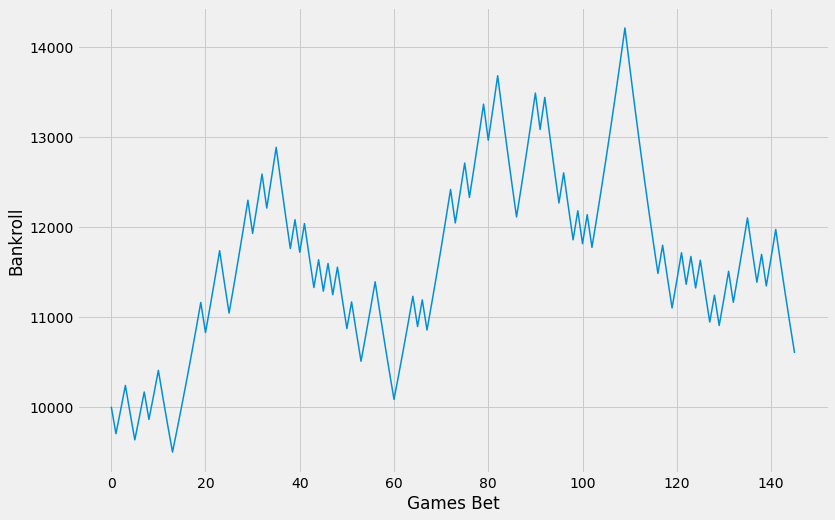

min balance: 9495.474893441879 
max balance: 14210.736110540929 
final balance: 10886.320185706538 
win percentage 54.11


,index,TEAM_ABBREVIATION,point_diff_team,MATCHUP,home_spread_mode,en_preds,home_cover,bet_home,bet_won,bankroll_i,bet_size,bankroll_n
0,1,IND,-4,IND vs. NYK,-9.5,3.723771,0,1,0,10000.000000,300.000000,9700.000000
1,5,DET,-2,DET vs. BOS,8.0,2.559869,1,1,1,9700.000000,291.000000,9964.545455
2,6,BKN,-1,BKN vs. WAS,-7.5,-4.080041,0,0,1,9964.545455,298.936364,10236.305785
3,7,MEM,-14,MEM vs. LAL,10.0,3.573525,0,1,0,10236.305785,307.089174,9929.216612
4,10,PHX,-5,PHX vs. LAC,3.5,2.042165,0,1,0,9929.216612,297.876498,9631.340113
...,...,...,...,...,...,...,...,...,...,...,...,...
141,573,TOR,-4,TOR vs. PHX,3.5,5.471833,0,1,0,11970.392977,359.111789,11611.281188
142,577,NOP,-5,NOP vs. DEN,2.5,2.881363,0,1,0,11611.281188,348.338436,11262.942752
143,587,TOR,-5,TOR vs. POR,2.5,3.269273,0,1,0,11262.942752,337.888283,10925.054470
144,593,HOU,-10,HOU vs. MEM,8.0,3.477994,0,1,0,10925.054470,327.751634,10597.302836


In [224]:
sgd_preds_2020_hd = best_sgd_hd.predict(features_2020.loc[features_2020['home_spread_mode'] >= 0])
sgd_preds_2020_hf = best_sgd_hf.predict(features_2020.loc[features_2020['home_spread_mode'] < 0])

en_preds_2020_hd = best_en_hd.predict(features_2020.loc[features_2020['home_spread_mode'] >= 0])
en_preds_2020_hf = best_en_hf.predict(features_2020.loc[features_2020['home_spread_mode'] < 0])


betting_df_2020 = df_2020.loc[indices_2020, ['TEAM_ABBREVIATION', 'point_diff_team', 'MATCHUP', 'home_spread_mode']]
betting_df_2020['en_preds'] = 0
betting_df_2020.loc[betting_df_2020['home_spread_mode'] >= 0, 'en_preds'] = en_preds_2020_hd
betting_df_2020.loc[betting_df_2020['home_spread_mode'] < 0, 'en_preds'] = en_preds_2020_hf
# betting_df_2020['lgbr_preds'] = lgbr_preds_2020
# betting_df_2020['xgb_preds'] = xgb_preds_2020
# betting_df_2020['rf_preds'] = rf_preds_2020
# betting_df_2020['en_preds'] = en_preds_2020


# betting_df_2020['net_preds'] = net_preds.detach().numpy().flatten()/10
betting_df_2020['home_cover'] = (betting_df_2020['point_diff_team'] + betting_df_2020['home_spread_mode'] > 0).astype(int)
betting_df_2020['bet_home'] = (betting_df_2020['en_preds'] > 0).astype(int)
# betting_df_2020['bet_home'] = ((betting_df_2020['lgbr_preds'] > 0) & (betting_df_2020['sgd_preds'] > 0)).astype(int)
betting_df_2020['bet_won'] = (betting_df_2020['bet_home'] == betting_df_2020['home_cover']).astype(int)
select_bets_2020 = betting_df_2020.loc[((betting_df_2020['home_spread_mode'] >= 0) & (abs(betting_df_2020['en_preds']) > 2.))
                                       | ((betting_df_2020['home_spread_mode'] < 0) & (abs(betting_df_2020['en_preds']) > 2))]
#                                         (abs(betting_df_2020['lgbr_preds']) > 0.4)
#                                       & (abs(betting_df_2020['rf_preds']) > 0.34)]



simulate_bets(select_bets_2020)
# select_bets_2020['bet_won'].mean()


In [384]:
# sgd_preds_2020_hd = sgd_pipe_hd.predict(features_2020.loc[features_2020['home_spread_mode'] > 0])
# sgd_preds_2020_hf = sgd_pipe_hf.predict(features_2020.loc[features_2020['home_spread_mode'] <= 0])

# lgbr_preds_2020 = best_lgbr.predict(features_2020)

# xgb_preds_2020 = xgbr.predict(features_2020)

# rf_preds_2020 = best_rf.predict(features_2020)

# en_preds_2020 = en_pipe.predict(features_2020)

net_preds = net(torch.Tensor(torch_scaler.transform(features_2020))).detach().numpy()

# net_preds

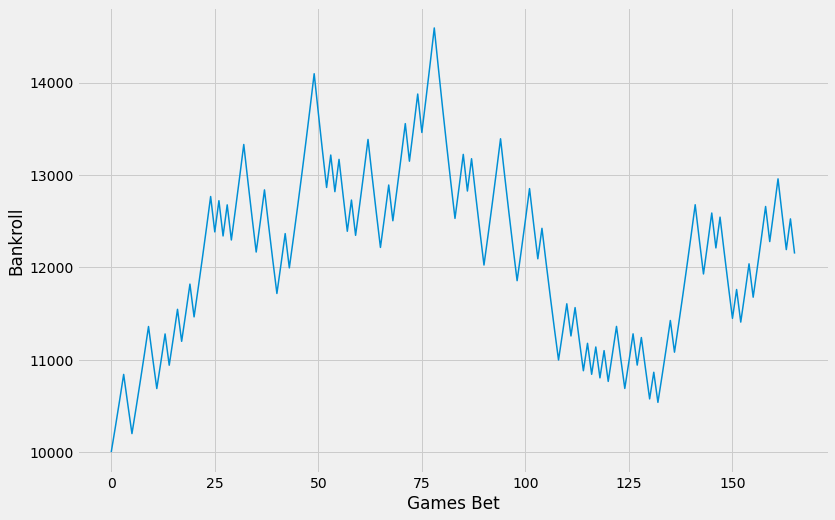

min balance: 10200.013428249435 
max balance: 14590.44129690014 
final balance: 11783.765125935191 
win percentage 54.82


,index,TEAM_ABBREVIATION,point_diff_team,MATCHUP,home_spread_mode,spread+diff,net_preds,home_cover,bet_home,bet_won,bankroll_i,bet_size,bankroll_n
0,3,ATL,-5,ATL vs. CLE,-5.5,-10.5,-7.630116,0,0,1,10000.000000,300.000000,10272.727273
1,4,MIN,-15,MIN vs. DEN,8.5,-6.5,-17.511482,0,0,1,10272.727273,308.181818,10552.892562
2,6,BKN,-1,BKN vs. WAS,-7.5,-8.5,-24.358429,0,0,1,10552.892562,316.586777,10840.698723
3,7,MEM,-14,MEM vs. LAL,10.0,-4.0,10.259763,0,1,0,10840.698723,325.220962,10515.477761
4,8,SAS,-21,SAS vs. UTA,5.5,-15.5,8.119968,0,1,0,10515.477761,315.464333,10200.013428
...,...,...,...,...,...,...,...,...,...,...,...,...,...
161,548,MIL,27,MIL vs. IND,-7.0,20.0,-7.958269,1,0,0,12957.206559,388.716197,12568.490362
162,552,MIA,-10,MIA vs. PHX,2.0,-8.0,7.853865,0,1,0,12568.490362,377.054711,12191.435651
163,589,BOS,-6,BOS vs. NOP,-3.0,-9.0,-7.221478,0,0,1,12191.435651,365.743070,12523.929351
164,593,HOU,-10,HOU vs. MEM,8.0,-2.0,8.024974,0,1,0,12523.929351,375.717881,12148.211470


In [385]:
betting_df_2020 = df_2020.loc[indices_2020, ['TEAM_ABBREVIATION', 'point_diff_team', 'MATCHUP', 'home_spread_mode']]
betting_df_2020['spread+diff'] = betting_df_2020['home_spread_mode'] + betting_df_2020['point_diff_team']
betting_df_2020['net_preds'] = net_preds
# betting_df_2020.loc[betting_df_2020['home_spread_mode'] > 0, 'sgd_preds'] = sgd_preds_2020_hd
# betting_df_2020.loc[betting_df_2020['home_spread_mode'] <= 0, 'sgd_preds'] = sgd_preds_2020_hf
# betting_df_2020['lgbr_preds'] = lgbr_preds_2020
# betting_df_2020['xgb_preds'] = xgb_preds_2020
# betting_df_2020['rf_preds'] = rf_preds_2020
# betting_df_2020['en_preds'] = en_preds_2020


# betting_df_2020['net_preds'] = net_preds.detach().numpy().flatten()/10
betting_df_2020['home_cover'] = (betting_df_2020['point_diff_team'] + betting_df_2020['home_spread_mode'] > 0).astype(int)
betting_df_2020['bet_home'] = (betting_df_2020['net_preds'] > 0).astype(int)
# betting_df_2020['bet_home'] = ((betting_df_2020['lgbr_preds'] > 0) & (betting_df_2020['sgd_preds'] > 0)).astype(int)
betting_df_2020['bet_won'] = (betting_df_2020['bet_home'] == betting_df_2020['home_cover']).astype(int)
select_bets_2020 = betting_df_2020.loc[abs(betting_df_2020['net_preds']) > 7]
    
                                       # ((betting_df_2020['home_spread_mode'] > 0) & (abs(betting_df_2020['sgd_preds']) > 1.69))
                                      # | ((betting_df_2020['home_spread_mode'] <= 0) & (abs(betting_df_2020['sgd_preds']) > 3.75))]
#                                         (abs(betting_df_2020['lgbr_preds']) > 0.4)
#                                       & (abs(betting_df_2020['rf_preds']) > 0.34)]



simulate_bets(select_bets_2020)
# select_bets_2020['bet_won'].mean()


In [371]:
# select_bets_2020.loc[select_bets_2020['net_preds'] > 0]
betting_df_2020.loc[betting_df_2020['net_preds']>0]

,TEAM_ABBREVIATION,point_diff_team,MATCHUP,home_spread_mode,net_preds,home_cover,bet_home,bet_won
14,MIL,10,MIL vs. DET,-16.0,0.176570,0,1,0
25,NOP,-1,NOP vs. OKC,-8.0,0.033497,0,1,0
28,MIL,15,MIL vs. DET,-12.0,0.113456,1,1,1
31,MIA,-2,MIA vs. BOS,-2.5,0.000057,0,1,0
40,POR,18,POR vs. MIN,-10.0,0.032014,1,1,1
49,BOS,9,BOS vs. WAS,-3.5,0.029540,1,1,1
56,MIN,-3,MIN vs. SAS,3.5,0.087571,1,1,1
61,HOU,-18,HOU vs. LAL,3.5,0.029953,0,1,0
62,NYK,-25,NYK vs. DEN,5.5,0.009299,0,1,0
63,LAC,3,LAC vs. CHI,-12.5,0.000713,0,1,0


In [ ]:
simulate_bets(sgd_preds_2020)

## Make Predictions

ETL Pipeline

### Update Date

In [441]:
from src.data.update_data import update_all_data
from src.data.update_data import update_moneyline_data
from src.data.update_data import update_spread_data

update_all_data(season='2020-21')
update_spread_data(season='2020-21')
update_moneyline_data(season='2020-21')

updating basic team boxscores
updating basic player boxscores
updating advanced boxscores


progress:   0%|                                                                                 | 0/10 [00:00<?, ?it/s]

Updating 10 Games


progress: 100%|████████████████████████████████████████████████████████████████████████| 10/10 [00:22<00:00,  2.26s/it]


updating scoring boxscores


progress:   0%|                                                                                 | 0/10 [00:00<?, ?it/s]

Updating 10 Games


progress: 100%|████████████████████████████████████████████████████████████████████████| 10/10 [00:24<00:00,  2.50s/it]


updating tracking boxscores
Updating 10 Games


progress:   0%|                                                                                  | 0/1 [00:00<?, ?it/s]

Updating lines for 1 days


progress:   0%|                                                                                  | 0/1 [00:00<?, ?it/s]

Updating lines for 1 days


progress: 100%|██████████████████████████████████████████████████████████████████████████| 1/1 [00:12<00:00, 12.00s/it]


### Get Todays Betting Data

In [442]:
from src.models.model_preparation import get_days_spreads
from datetime import datetime
todays_date = datetime.today().strftime('%Y-%m-%d')

todays_spreads = get_days_spreads(todays_date)
todays_spreads = clean_spread_data(todays_spreads)
todays_spreads


C:\Users\Jordan Nishimura\Anaconda3\lib\site-packages\pandas\core\algorithms.py:897: UserWarning: Unable to sort modes: '<' not supported between instances of 'str' and 'float'
  warn(f"Unable to sort modes: {err}")
C:\Users\Jordan Nishimura\Anaconda3\lib\site-packages\pandas\core\algorithms.py:897: UserWarning: Unable to sort modes: '<' not supported between instances of 'float' and 'str'
  warn(f"Unable to sort modes: {err}")


,away_team,home_team,game_date,away_spread1,away_spread2,away_spread3,away_spread4,home_spread1,home_spread2,home_spread3,home_spread4,away_spread_mode,home_spread_mode
0,DAL,WAS,2021-04-03,-4.5-110,-4.5-112,-4.5,-4.5,4.5,4.5,4.5,4.5,-4.5,4.5
1,CLE,MIA,2021-04-03,12-110,12-108,12.5,12.0,-12.0,-12.0,-12.5,-12.0,12.5,-12.0
2,MIN,PHI,2021-04-03,13-110,12-110,13.5,13.0,-13.0,-12.0,-13.5,-13.0,13-110,-13.0
3,NYK,DET,2021-04-03,-1.5-110,-1.5-113,-1.5,-1.5,1.5,1.5,1.5,1.5,-1.5,1.5
4,IND,SAS,2021-04-03,6-110,4.5-113,5.5,6.0,-6.0,-4.5,-5.5,-6.0,6-110,-6.0
5,ORL,UTA,2021-04-03,15-110,15-110,15.0,14.5,-15.0,-15.0,-15.0,-14.5,15-110,-15.0
6,MIL,SAC,2021-04-03,-6-105,-6.5-110,-5.5,-5.5,6.0,6.5,5.5,5.5,-5.5,5.5
7,OKC,POR,2021-04-03,11.5-110,11.5-105,11.5,11.5,-11.5,-11.5,-11.5,-11.5,11.5,-11.5


In [443]:
def load_current_season_team_data(season):
    """Loads basic, advanced, and scoring boxscores from
    current season and merges them into one dataframe
    """
    basic_gls = pd.read_csv('../data/current_season_data/team_gamelogs_{}.csv'.format(season))

    adv_gls = pd.read_csv('../data/current_season_data/team_advanced_boxscores_{}.csv'.format(season))

    scoring_gls = pd.read_csv('../data/current_season_data/team_scoring_boxscores_{}.csv'.format(season))

    temp = pd.merge(basic_gls, adv_gls, how='left', on=['GAME_ID', 'TEAM_ABBREVIATION'], suffixes=['', '_y'])
    full_df = pd.merge(temp, scoring_gls, how='left', on=['GAME_ID', 'TEAM_ABBREVIATION'], suffixes=['', '_y'])

    full_df = full_df.drop(columns = ['VIDEO_AVAILABLE', 'TEAM_ID_y', 
                                      'TEAM_NAME_y', 'TEAM_CITY', 
                                      'MIN_y', 'TEAM_ID_y',
                                      'TEAM_NAME_y', 'TEAM_CITY_y',
                                      'MIN_y'], errors='ignore')
    
    full_df['SEASON_YEAR'] = season
    
    full_df = full_df[['SEASON_YEAR', 'SEASON_ID', 'TEAM_ID', 'TEAM_ABBREVIATION', 'TEAM_NAME', 'GAME_ID',
       'GAME_DATE', 'MATCHUP', 'WL', 'MIN', 'FGM', 'FGA', 'FG_PCT', 'FG3M',
       'FG3A', 'FG3_PCT', 'FTM', 'FTA', 'FT_PCT', 'OREB', 'DREB', 'REB', 'AST',
       'STL', 'BLK', 'TOV', 'PF', 'PTS', 'PLUS_MINUS', 'E_OFF_RATING',
       'OFF_RATING', 'E_DEF_RATING', 'DEF_RATING', 'E_NET_RATING',
       'NET_RATING', 'AST_PCT', 'AST_TOV', 'AST_RATIO', 'OREB_PCT', 'DREB_PCT',
       'REB_PCT', 'E_TM_TOV_PCT', 'TM_TOV_PCT', 'EFG_PCT', 'TS_PCT', 'USG_PCT',
       'E_USG_PCT', 'E_PACE', 'PACE', 'PACE_PER40', 'POSS', 'PIE',
       'PCT_FGA_2PT', 'PCT_FGA_3PT', 'PCT_PTS_2PT', 'PCT_PTS_2PT_MR',
       'PCT_PTS_3PT', 'PCT_PTS_FB', 'PCT_PTS_FT', 'PCT_PTS_OFF_TOV',
       'PCT_PTS_PAINT', 'PCT_AST_2PM', 'PCT_UAST_2PM', 'PCT_AST_3PM',
       'PCT_UAST_3PM', 'PCT_AST_FGM', 'PCT_UAST_FGM']]
    return full_df

df = load_current_season_team_data('2020-21')

In [444]:
def get_team_and_opp_ewm_for_model(df, min_periods=5, span=19, adjust=True):
    df = df.copy()
    df = df[['SEASON_YEAR_team', 'SEASON_ID_team', 'TEAM_ID_team',
       'TEAM_ABBREVIATION_team', 'TEAM_NAME_team', 'GAME_ID', 'GAME_DATE_team',
       'MATCHUP_team', 'HOME_GAME_team', 'TEAM_SCORE_team', 'point_diff_team',
       'WL_team', 'MIN_team', 'home_spread_mode', 'RECORD_team', 'team_covered', 'FG2M_team', 'FG2A_team',
       'FG3M_team', 'FG3A_team', 'FTM_team', 'FTA_team', 'OREB_team',
       'DREB_team', 'REB_team', 'AST_team', 'STL_team', 'BLK_team', 'TOV_team',
       'PF_team', 'PTS_team', 'PLUS_MINUS_team', 'E_OFF_RATING_team',
       'OFF_RATING_team', 'E_DEF_RATING_team', 'DEF_RATING_team',
       'E_NET_RATING_team', 'NET_RATING_team', 'POSS_team', 'PIE_team',
       'PTS_2PT_MR_team', 'PTS_FB_team', 'PTS_OFF_TOV_team', 'PTS_PAINT_team',
       'AST_2PM_team', 'UAST_2PM_team', 'AST_3PM_team', 'UAST_3PM_team',
       'SEASON_YEAR_opp', 'SEASON_ID_opp', 'TEAM_ID_opp',
       'TEAM_ABBREVIATION_opp', 'TEAM_NAME_opp', 'GAME_DATE_opp',
       'MATCHUP_opp', 'HOME_GAME_opp', 'TEAM_SCORE_opp', 'point_diff_opp',
       'WL_opp', 'MIN_opp', 'RECORD_opp', 'FG2M_opp', 'FG2A_opp', 'FG3M_opp',
       'FG3A_opp', 'FTM_opp', 'FTA_opp', 'OREB_opp', 'DREB_opp', 'REB_opp',
       'AST_opp', 'STL_opp', 'BLK_opp', 'TOV_opp', 'PF_opp', 'PTS_opp',
       'PLUS_MINUS_opp', 'E_OFF_RATING_opp', 'OFF_RATING_opp',
       'E_DEF_RATING_opp', 'DEF_RATING_opp', 'E_NET_RATING_opp',
       'NET_RATING_opp', 'POSS_opp', 'PIE_opp', 'PTS_2PT_MR_opp', 'PTS_FB_opp',
       'PTS_OFF_TOV_opp', 'PTS_PAINT_opp', 'AST_2PM_opp', 'UAST_2PM_opp',
       'AST_3PM_opp', 'UAST_3PM_opp', 'home_team', 'away_team', 'game_date',
       'away_spread_mode']]
    
    df = df.drop(columns = ['SEASON_YEAR_opp', 'SEASON_ID_opp', 
                            'TEAM_ID_opp', 'TEAM_ABBREVIATION_opp',
                            'TEAM_NAME_opp', 'GAME_DATE_opp', 
                            'MATCHUP_opp', 'WL_opp', 'HOME_GAME_opp',
                           'point_diff_opp', 'home_team', 'away_team', 'game_date',
                           'away_spread_mode'])
    team_dfs = []

    for team in df['TEAM_ABBREVIATION_team'].unique():
        team_df = df.loc[df['TEAM_ABBREVIATION_team'] == team].sort_values('GAME_DATE_team')
        team_record = team_df['RECORD_team'].shift(1).expanding().mean()
        ATS_rec = team_df['team_covered'].shift(1).expanding().mean()
        records_df = pd.DataFrame({'WL_record':team_record, 
                                  'ATS_record':ATS_rec})

        team_df.iloc[:, 14:] = team_df.iloc[:, 14:].shift(1).ewm(span = span, min_periods=min_periods).mean()

        team_df = pd.concat([team_df, records_df], axis=1)

        team_dfs.append(team_df)

    new_df = pd.concat(team_dfs)
    new_df = new_df.reset_index(drop=True)
        
    return new_df


In [445]:
def add_rest_days_for_model(df):
    df['rest'] = np.nan
    for season in df['SEASON_YEAR_team'].unique():
        season_df = df.loc[df['SEASON_YEAR_team'] == season]
        for team in season_df['TEAM_ABBREVIATION_team'].unique():
            team_df = season_df.loc[season_df['TEAM_ABBREVIATION_team'] == team].sort_values('GAME_DATE_team')
            idx = team_df.index
            team_df['rest'] = (team_df['GAME_DATE_team'] - team_df['GAME_DATE_team'].shift(1)) / np.timedelta64(1, 'D')
            df.loc[idx, 'rest'] = team_df['rest']
            
    return df

In [446]:
df = load_current_season_team_data(season='2020-21')
df1 = clean_team_data(df)
df1 = prep_for_aggregation(df1)
df1 = create_matchups(df1) 
df1 = add_spread_data(df1)
df1 = get_team_and_opp_ewm_for_model(df1)
df1 = add_rest_days_for_model(df1)
df1 = add_percentage_features(df1)
df1

,SEASON_YEAR_team,SEASON_ID_team,TEAM_ID_team,TEAM_ABBREVIATION_team,TEAM_NAME_team,GAME_ID,GAME_DATE_team,MATCHUP_team,HOME_GAME_team,TEAM_SCORE_team,point_diff_team,WL_team,MIN_team,home_spread_mode,WL_record,ATS_record,RECORD_team,team_covered,FG2M_team,FG2A_team,FG3M_team,FG3A_team,FTM_team,FTA_team,OREB_team,DREB_team,REB_team,AST_team,STL_team,BLK_team,TOV_team,PF_team,PTS_team,PLUS_MINUS_team,E_OFF_RATING_team,OFF_RATING_team,E_DEF_RATING_team,DEF_RATING_team,E_NET_RATING_team,NET_RATING_team,POSS_team,PIE_team,PTS_2PT_MR_team,PTS_FB_team,PTS_OFF_TOV_team,PTS_PAINT_team,AST_2PM_team,UAST_2PM_team,AST_3PM_team,UAST_3PM_team,TEAM_SCORE_opp,MIN_opp,RECORD_opp,FG2M_opp,FG2A_opp,FG3M_opp,FG3A_opp,FTM_opp,FTA_opp,OREB_opp,DREB_opp,REB_opp,AST_opp,STL_opp,BLK_opp,TOV_opp,PF_opp,PTS_opp,PLUS_MINUS_opp,E_OFF_RATING_opp,OFF_RATING_opp,E_DEF_RATING_opp,DEF_RATING_opp,E_NET_RATING_opp,NET_RATING_opp,POSS_opp,PIE_opp,PTS_2PT_MR_opp,PTS_FB_opp,PTS_OFF_TOV_opp,PTS_PAINT_opp,AST_2PM_opp,UAST_2PM_opp,AST_3PM_opp,UAST_3PM_opp,OREB_PCT_team,OREB_PCT_opp,DREB_PCT_team,DREB_PCT_opp,REB_PCT_team,REB_PCT_opp,TS_PCT_team,TS_PCT_opp,EFG_PCT_team,EFG_PCT_opp,AST_RATIO_team,AST_RATIO_opp,TOV_PCT_team,TOV_PCT_opp,rest
0,2020-21,22020,1610612746,LAC,LA Clippers,22000002,2020-12-22,LAC @ LAL,0,116,7,1,240,-2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2020-21,22020,1610612746,LAC,LA Clippers,22000009,2020-12-25,LAC @ DEN,0,121,13,1,240,4.0,1.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0
2,2020-21,22020,1610612746,LAC,LA Clippers,22000031,2020-12-27,LAC vs. DAL,1,73,-51,0,240,-3.0,1.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0
3,2020-21,22020,1610612746,LAC,LA Clippers,22000054,2020-12-29,LAC vs. MIN,1,124,23,1,240,-11.0,0.666667,0.666667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0
4,2020-21,22020,1610612746,LAC,LA Clippers,22000061,2020-12-30,LAC vs. POR,1,128,23,1,240,-6.0,0.750000,0.750000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1421,2020-21,22020,1610612760,OKC,Oklahoma City Thunder,22000654,2021-03-22,OKC @ MIN,0,112,9,1,240,-5.0,0.428571,0.523810,0.462632,0.503451,26.23062

In [447]:
df1

,SEASON_YEAR_team,SEASON_ID_team,TEAM_ID_team,TEAM_ABBREVIATION_team,TEAM_NAME_team,GAME_ID,GAME_DATE_team,MATCHUP_team,HOME_GAME_team,TEAM_SCORE_team,point_diff_team,WL_team,MIN_team,home_spread_mode,WL_record,ATS_record,RECORD_team,team_covered,FG2M_team,FG2A_team,FG3M_team,FG3A_team,FTM_team,FTA_team,OREB_team,DREB_team,REB_team,AST_team,STL_team,BLK_team,TOV_team,PF_team,PTS_team,PLUS_MINUS_team,E_OFF_RATING_team,OFF_RATING_team,E_DEF_RATING_team,DEF_RATING_team,E_NET_RATING_team,NET_RATING_team,POSS_team,PIE_team,PTS_2PT_MR_team,PTS_FB_team,PTS_OFF_TOV_team,PTS_PAINT_team,AST_2PM_team,UAST_2PM_team,AST_3PM_team,UAST_3PM_team,TEAM_SCORE_opp,MIN_opp,RECORD_opp,FG2M_opp,FG2A_opp,FG3M_opp,FG3A_opp,FTM_opp,FTA_opp,OREB_opp,DREB_opp,REB_opp,AST_opp,STL_opp,BLK_opp,TOV_opp,PF_opp,PTS_opp,PLUS_MINUS_opp,E_OFF_RATING_opp,OFF_RATING_opp,E_DEF_RATING_opp,DEF_RATING_opp,E_NET_RATING_opp,NET_RATING_opp,POSS_opp,PIE_opp,PTS_2PT_MR_opp,PTS_FB_opp,PTS_OFF_TOV_opp,PTS_PAINT_opp,AST_2PM_opp,UAST_2PM_opp,AST_3PM_opp,UAST_3PM_opp,OREB_PCT_team,OREB_PCT_opp,DREB_PCT_team,DREB_PCT_opp,REB_PCT_team,REB_PCT_opp,TS_PCT_team,TS_PCT_opp,EFG_PCT_team,EFG_PCT_opp,AST_RATIO_team,AST_RATIO_opp,TOV_PCT_team,TOV_PCT_opp,rest
0,2020-21,22020,1610612746,LAC,LA Clippers,22000002,2020-12-22,LAC @ LAL,0,116,7,1,240,-2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2020-21,22020,1610612746,LAC,LA Clippers,22000009,2020-12-25,LAC @ DEN,0,121,13,1,240,4.0,1.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0
2,2020-21,22020,1610612746,LAC,LA Clippers,22000031,2020-12-27,LAC vs. DAL,1,73,-51,0,240,-3.0,1.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0
3,2020-21,22020,1610612746,LAC,LA Clippers,22000054,2020-12-29,LAC vs. MIN,1,124,23,1,240,-11.0,0.666667,0.666667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0
4,2020-21,22020,1610612746,LAC,LA Clippers,22000061,2020-12-30,LAC vs. POR,1,128,23,1,240,-6.0,0.750000,0.750000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1421,2020-21,22020,1610612760,OKC,Oklahoma City Thunder,22000654,2021-03-22,OKC @ MIN,0,112,9,1,240,-5.0,0.428571,0.523810,0.462632,0.503451,26.23062

In [448]:
prev_season_final_elo = {}
for team in full_df_ewm_19['TEAM_ABBREVIATION'].unique():
    team_df = full_df_ewm_19.loc[full_df_ewm_19['MATCHUP'].str.contains(team)].sort_values('GAME_DATE').reset_index(drop=True)
    if team_df.loc[team_df.shape[0]-1, 'MATCHUP'][:3] == team:
        final_elo = team_df.loc[team_df.shape[0]-1, 'home_rating_n']
    else:
        final_elo = team_df.loc[team_df.shape[0]-1, 'away_rating_n']
    prev_season_final_elo[team] = final_elo
    
    
prev_season_final_elo

{'IND': 1529.4483384275268,
 'HOU': 1540.8964001636646,
 'POR': 1500.1407073118096,
 'LAL': 1684.3757506350337,
 'CLE': 1298.0343645791245,
 'SAS': 1522.744349117492,
 'MIN': 1340.3072979400008,
 'CHI': 1332.027526532048,
 'MIL': 1629.7867944120128,
 'GSW': 1360.7007973857746,
 'SAC': 1516.141852484055,
 'LAC': 1626.6462653315195,
 'MIA': 1618.0421597762124,
 'BOS': 1703.07997468606,
 'NYK': 1326.2237584707232,
 'ATL': 1337.167197222995,
 'NOP': 1499.3615728404923,
 'DAL': 1544.6886733768054,
 'UTA': 1549.7536707979227,
 'DET': 1342.6198199001185,
 'ORL': 1490.8373868097253,
 'BKN': 1467.7010014887078,
 'PHX': 1536.6695679529985,
 'MEM': 1553.2535462864591,
 'DEN': 1584.84073526912,
 'WAS': 1380.5107315006996,
 'CHA': 1394.9240309027477,
 'PHI': 1552.491927190443,
 'TOR': 1676.213996740524,
 'OKC': 1560.4746669932429}

In [449]:
with open("../data/final_elo_2020.pkl", 'wb') as file:
    pickle.dump(prev_season_final_elo, file)
    

In [450]:
# Add ELO ratings
with open("../data/final_elo_2020.pkl", "rb") as file:
    final_elo_2020 = pickle.load(file)


def get_current_elo_ratings(df, prev_season_final_elo):
    """This function will generate elo_ratings in the elo_df
    """
    df = df.copy()
    df = df.loc[df['HOME_GAME_team'] == 1]
    # Initialize the following columns
    df = df.sort_values('GAME_DATE_team')

    df['home_elo_pred'] = np.nan

    df['home_rating_i'] = np.nan
    df['home_rating_n'] = np.nan

    df['away_rating_i'] = np.nan
    df['away_rating_n'] = np.nan

    elo_dic = prev_season_final_elo
    for team in elo_dic:
        elo_dic[team] = season_reset(elo_dic[team])
        
    for idx, row in tqdm(df.iterrows(), desc="progress:"):
        home_team_abbr = row['MATCHUP_team'][:3]
        away_team_abbr = row['MATCHUP_team'][-3:]
        
        df.loc[idx, 'home_rating_i'] = elo_dic[home_team_abbr]
        df.loc[idx, 'away_rating_i'] = elo_dic[away_team_abbr]

        home_score = row['TEAM_SCORE_team']
        away_score = home_score - row['point_diff_team']
        home_rating = elo_dic[home_team_abbr]
        away_rating = elo_dic[away_team_abbr]

        home_update, away_update = elo_update(home_score, away_score, home_rating, away_rating)

        df.loc[idx, 'home_rating_n'] = home_rating + home_update
        df.loc[idx, 'away_rating_n'] = away_rating + away_update
        df.loc[idx, 'home_elo_pred'] = elo_prediction(home_rating+100, away_rating)

        elo_dic[home_team_abbr] = df.loc[idx, 'home_rating_n']
        elo_dic[away_team_abbr] = df.loc[idx, 'away_rating_n']

    df['elo_MOV_pred'] = round((df['home_rating_i']+100 - df['away_rating_i'])/28, 2)

    return elo_dic

elo_ratings_dic = get_current_elo_ratings(df1, final_elo_2020)


progress:: 713it [00:01, 594.18it/s]


In [451]:
sorted(list(elo_ratings_dic.items()), key=lambda x: x[1], reverse=True)

[('UTA', 1695.1116127688701),
 ('DEN', 1643.9932061267505),
 ('PHX', 1643.2505280213047),
 ('PHI', 1641.91906223637),
 ('MIL', 1636.6251277234726),
 ('LAC', 1617.9483674908743),
 ('BKN', 1609.0970800387167),
 ('DAL', 1600.6323347879759),
 ('LAL', 1594.685823621672),
 ('ATL', 1549.0858878760444),
 ('CHA', 1529.246188892717),
 ('MEM', 1529.1740586616115),
 ('MIA', 1522.2233032905194),
 ('POR', 1509.5329643682226),
 ('BOS', 1508.5640846888216),
 ('IND', 1506.1032699853033),
 ('TOR', 1484.370998943311),
 ('NOP', 1460.0619221119289),
 ('NYK', 1459.8277688751557),
 ('SAC', 1454.8135939558026),
 ('SAS', 1445.5081664753009),
 ('GSW', 1443.6002087162024),
 ('CHI', 1422.7871491263463),
 ('OKC', 1406.9973753498114),
 ('DET', 1402.306882583506),
 ('ORL', 1388.455298586604),
 ('WAS', 1371.5658080238677),
 ('CLE', 1342.7394090393968),
 ('MIN', 1326.6109047226719),
 ('HOU', 1290.7402598053923)]

In [452]:
def create_matchup_rows_for_model(df, away_team, home_team, spread, current_elo_dic):
    df = df.copy(deep=True)
    df.rename(columns={'SEASON_YEAR_team':'SEASON_YEAR',
                      'SEASON_ID_team':'SEASON_ID',
                      'TEAM_ID_team':'TEAM_ID',
                      'TEAM_ABBREVIATION_team':'TEAM_ABBREVIATION',
                      'GAME_DATE_team':'GAME_DATE',
                      'MATCHUP_team':'MATCHUP',
                      'HOME_GAME_team':'HOME_GAME',
                       'TEAM_SCORE_team':'SCORE_team'}, inplace=True)
    
    df.sort_values(['GAME_DATE'], inplace=True)
    
    home_stats = df.loc[df['TEAM_ABBREVIATION'] == home_team].reset_index(drop=True)
    home_stats.at[home_stats.shape[0]-1, 'rest'] = (datetime.today() - home_stats.at[home_stats.shape[0]-1, 'GAME_DATE']) // np.timedelta64(1, 'D')
    away_stats = df.loc[df['TEAM_ABBREVIATION'] == away_team].reset_index(drop=True)
    away_stats.at[away_stats.shape[0]-1, 'rest'] = (datetime.today() - away_stats.at[away_stats.shape[0]-1, 'GAME_DATE']) // np.timedelta64(1, 'D')

    diffs = home_stats.iloc[-1, 14:] - away_stats.iloc[-1, 14:]
    diffs = diffs.values.reshape(1, -1)
    
    new_cols = [col+"_diff" for col in home_stats.columns[14:]]
    
    diffs = pd.DataFrame(diffs, columns=new_cols)
        
    diffs['home_rating_i'] = current_elo_dic[home_team]
    diffs['away_rating_i'] = current_elo_dic[away_team]
    diffs['home_elo_pred'] = 1.0/(1 + 10 ** (( diffs['away_rating_i'] - diffs['home_rating_i']) / (400.0)))

    diffs['elo_MOV_pred'] = round((diffs['home_rating_i']+100 - diffs['away_rating_i'])/28, 2)
    diffs['home_spread_mode'] = spread 
    
    diffs = diffs[X_train_ewm_19.columns]
    
    return diffs

create_matchup_rows_for_model(df1, 'OKC', 'MIN', -3, current_elo_dic=elo_ratings_dic)

,home_spread_mode,WL_record_diff,ATS_record_diff,RECORD_team_diff,team_covered_diff,FG2M_team_diff,FG2A_team_diff,FG3M_team_diff,FG3A_team_diff,FTM_team_diff,FTA_team_diff,OREB_team_diff,DREB_team_diff,REB_team_diff,AST_team_diff,STL_team_diff,BLK_team_diff,TOV_team_diff,PF_team_diff,PTS_team_diff,PLUS_MINUS_team_diff,E_OFF_RATING_team_diff,OFF_RATING_team_diff,E_DEF_RATING_team_diff,DEF_RATING_team_diff,E_NET_RATING_team_diff,NET_RATING_team_diff,POSS_team_diff,PIE_team_diff,PTS_2PT_MR_team_diff,PTS_FB_team_diff,PTS_OFF_TOV_team_diff,PTS_PAINT_team_diff,AST_2PM_team_diff,UAST_2PM_team_diff,AST_3PM_team_diff,UAST_3PM_team_diff,TEAM_SCORE_opp_diff,RECORD_opp_diff,FG2M_opp_diff,FG2A_opp_diff,FG3M_opp_diff,FG3A_opp_diff,FTM_opp_diff,FTA_opp_diff,OREB_opp_diff,DREB_opp_diff,REB_opp_diff,AST_opp_diff,STL_opp_diff,BLK_opp_diff,TOV_opp_diff,PF_opp_diff,PTS_opp_diff,PLUS_MINUS_opp_diff,E_OFF_RATING_opp_diff,OFF_RATING_opp_diff,E_DEF_RATING_opp_diff,DEF_RATING_opp_diff,E_NET_RATING_opp_diff,NET_RATING_opp_diff,POSS_opp_diff,PIE_opp_diff,PTS_2PT_MR_opp_diff,PTS_FB_opp_diff,PTS_OFF_TOV_opp_diff,PTS_PAINT_opp_diff,AST_2PM_opp_diff,UAST_2PM_opp_diff,AST_3PM_opp_diff,UAST_3PM_opp_diff,OREB_PCT_team_diff,OREB_PCT_opp_diff,DREB_PCT_team_diff,DREB_PCT_opp_diff,REB_PCT_team_diff,REB_PCT_opp_diff,TS_PCT_team_diff,TS_PCT_opp_diff,EFG_PCT_team_diff,EFG_PCT_opp_diff,AST_RATIO_team_diff,AST_RATIO_opp_diff,TOV_PCT_team_diff,TOV_PCT_opp_diff,rest_diff,home_elo_pred,home_rating_i,away_rating_i,elo_MOV_pred
0,-3,-0.179463,-0.0744681,-0.130346,0.0100565,0.771314,1.38298,-0.000764037,3.60108,1.18658,0.615254,-0.3409,-3.48034,-3.82125,3.28415,2.38366,0.670353,-2.05369,3.52316,2.72691,-0.580535,-0.945318,1.11265,-0.177191,1.1315,-0.786312,-0.0324955,1.48803,-0.00496232,-1.20019,3.19163,4.46767,2.72338,2.67205,-1.99951,0.718132,-0.695025,3.30745,0.130346,-0.135756,1.99365,0.416147,-3.4697,2.33052,2.30673,-0.00117765,2.07533,2.07415,2.90665,-2.29005,0.671452,3.54816,0.931445,3.30745,0.580535,-0.177191,1.1315,-0.945318,1.11265,0.786312,0.0324955,1.81846,0.00496232,1.39736,3.59304,-4.42725,-1.72532,2.22005,-2.37193,0.657797,-0.346865,-0.0158015,0.017094,-0.017094,0.0158015,-0.0326693,0.0326693,-0.0169042,0.0238796,-0.0201873,0.0145145,2.89928,2.42549,-2.17765,2.81216,0,0.386336,1326.610905,1406.997375,0.7


### Make Predictions

In [453]:
todays_spreads = get_days_spreads(todays_date)
todays_spreads = clean_spread_data(todays_spreads)
todays_spreads

C:\Users\Jordan Nishimura\Anaconda3\lib\site-packages\pandas\core\algorithms.py:897: UserWarning: Unable to sort modes: '<' not supported between instances of 'str' and 'float'
  warn(f"Unable to sort modes: {err}")
C:\Users\Jordan Nishimura\Anaconda3\lib\site-packages\pandas\core\algorithms.py:897: UserWarning: Unable to sort modes: '<' not supported between instances of 'float' and 'str'
  warn(f"Unable to sort modes: {err}")


,away_team,home_team,game_date,away_spread1,away_spread2,away_spread3,away_spread4,home_spread1,home_spread2,home_spread3,home_spread4,away_spread_mode,home_spread_mode
0,DAL,WAS,2021-04-03,-4.5-110,-4.5-112,-4.5,-4.5,4.5,4.5,4.5,4.5,-4.5,4.5
1,CLE,MIA,2021-04-03,12-110,12-108,12.5,12.0,-12.0,-12.0,-12.5,-12.0,12.5,-12.0
2,MIN,PHI,2021-04-03,13-110,12-110,13.5,13.0,-13.0,-12.0,-13.5,-13.0,13-110,-13.0
3,NYK,DET,2021-04-03,-1.5-110,-1.5-113,-1.5,-1.5,1.5,1.5,1.5,1.5,-1.5,1.5
4,IND,SAS,2021-04-03,6-110,4.5-113,5.5,6.0,-6.0,-4.5,-5.5,-6.0,6-110,-6.0
5,ORL,UTA,2021-04-03,15-110,15-110,15.0,14.5,-15.0,-15.0,-15.0,-14.5,15-110,-15.0
6,MIL,SAC,2021-04-03,-6-105,-6.5-110,-5.5,-5.5,6.0,6.5,5.5,5.5,-5.5,5.5
7,OKC,POR,2021-04-03,11.5-110,11.5-105,11.5,11.5,-11.5,-11.5,-11.5,-11.5,11.5,-11.5


In [39]:
# Load Models

with open('../models/sgd_ewm_19.pkl', 'rb') as f:
    sgd_pipe = pickle.load(f)
    
with open('../models/lgbr_ewm_19.pkl', 'rb') as f:
    best_lgbr = pickle.load(f)
    
with open('../models/xgb_ewm_19.pkl', 'rb') as f:
    best_xgbr = pickle.load(f)
    
with open('../models/rf_ewm_19.pkl', 'rb') as f:
    best_rf = pickle.load(f)
    
with open('../models/en_ewm_19.pkl', 'rb') as f:
    en_pipe = pickle.load(f)
    
with open("../models/lasso_ewm_19.pkl", 'rb') as f:
    lasso_pipe = pickle.load(f)

In [327]:

df = load_current_season_team_data(season='2020-21')
df1 = clean_team_data(df)
df1 = prep_for_aggregation(df1)
df1 = create_matchups(df1) 
df1 = add_spread_data(df1)
df1 = get_team_and_opp_ewm_for_model(df1)
df1 = add_rest_days_for_model(df1)
df1 = add_percentage_features(df1)

create_matchup_rows_for_model(df1, 'OKC', 'MIN', -3, current_elo_dic=elo_ratings_dic)


,home_spread_mode,WL_record_diff,ATS_record_diff,RECORD_team_diff,team_covered_diff,FG2M_team_diff,FG2A_team_diff,FG3M_team_diff,FG3A_team_diff,FTM_team_diff,FTA_team_diff,OREB_team_diff,DREB_team_diff,REB_team_diff,AST_team_diff,STL_team_diff,BLK_team_diff,TOV_team_diff,PF_team_diff,PTS_team_diff,PLUS_MINUS_team_diff,E_OFF_RATING_team_diff,OFF_RATING_team_diff,E_DEF_RATING_team_diff,DEF_RATING_team_diff,E_NET_RATING_team_diff,NET_RATING_team_diff,POSS_team_diff,PIE_team_diff,PTS_2PT_MR_team_diff,PTS_FB_team_diff,PTS_OFF_TOV_team_diff,PTS_PAINT_team_diff,AST_2PM_team_diff,UAST_2PM_team_diff,AST_3PM_team_diff,UAST_3PM_team_diff,TEAM_SCORE_opp_diff,RECORD_opp_diff,FG2M_opp_diff,FG2A_opp_diff,FG3M_opp_diff,FG3A_opp_diff,FTM_opp_diff,FTA_opp_diff,OREB_opp_diff,DREB_opp_diff,REB_opp_diff,AST_opp_diff,STL_opp_diff,BLK_opp_diff,TOV_opp_diff,PF_opp_diff,PTS_opp_diff,PLUS_MINUS_opp_diff,E_OFF_RATING_opp_diff,OFF_RATING_opp_diff,E_DEF_RATING_opp_diff,DEF_RATING_opp_diff,E_NET_RATING_opp_diff,NET_RATING_opp_diff,POSS_opp_diff,PIE_opp_diff,PTS_2PT_MR_opp_diff,PTS_FB_opp_diff,PTS_OFF_TOV_opp_diff,PTS_PAINT_opp_diff,AST_2PM_opp_diff,UAST_2PM_opp_diff,AST_3PM_opp_diff,UAST_3PM_opp_diff,OREB_PCT_team_diff,OREB_PCT_opp_diff,DREB_PCT_team_diff,DREB_PCT_opp_diff,REB_PCT_team_diff,REB_PCT_opp_diff,TS_PCT_team_diff,TS_PCT_opp_diff,EFG_PCT_team_diff,EFG_PCT_opp_diff,AST_RATIO_team_diff,AST_RATIO_opp_diff,TOV_PCT_team_diff,TOV_PCT_opp_diff,rest_diff,home_elo_pred,home_rating_i,away_rating_i,elo_MOV_pred
0,-3,-0.183092,-0.0763285,-0.144892,0.011143,1.19352,2.20987,-0.000726966,3.2203,1.87994,1.69273,0.741648,-2.30137,-1.55972,2.97972,1.86619,0.521539,-1.49935,4.14165,4.2648,0.363874,0.192724,2.11145,0.115911,1.12315,0.0677887,0.984322,1.99059,-0.00237432,-1.44673,3.10111,3.84759,3.58807,2.97124,-1.88749,0.0143575,-0.100572,3.90093,0.144892,-1.1599,0.536119,1.02301,-1.28157,3.15171,2.90113,-0.00155193,1.63512,1.63357,3.34388,-1.87421,0.858817,2.82509,1.82035,3.90093,-0.363874,0.115911,1.12315,0.192724,2.11145,-0.0677887,-0.984322,2.35787,0.00237432,0.095416,3.99595,-3.6913,-2.36804,2.24413,-3.42199,1.1797,-0.161641,0.00481673,0.0116754,-0.0116754,-0.00481673,-0.017652,0.017652,-0.0128075,0.0213821,-0.017978,0.00875831,2.4739,2.70151,-1.85381,2.1216,0,0.383526,1329.036655,1411.484854,0.63


In [514]:
matchup_row = create_matchup_rows_for_model(df1, 'DAL', 'WAS', 20, current_elo_dic=elo_ratings_dic)
print(matchup_row.shape)
net_full(torch.tensor(nn_scaler.transform(matchup_row)).float())

(1, 90)


tensor([[-2.6207]], grad_fn=<AddmmBackward>)

In [403]:
net_full(torch.tensor(nn_scaler.transform(matchup_row)).float())

tensor([[0.0996]], grad_fn=<AddmmBackward>)

In [500]:


df = load_current_season_team_data(season='2020-21')
df1 = clean_team_data(df)
df1 = prep_for_aggregation(df1)
df1 = create_matchups(df1) 
df1 = add_spread_data(df1)
df1 = get_team_and_opp_ewm_for_model(df1)
df1 = add_rest_days_for_model(df1)
df1 = add_percentage_features(df1)

elo_ratings_dic = get_current_elo_ratings(df1, final_elo_2020)



away_teams = []
home_teams = []
spreads = []
game_dates = []
# sgd_preds = []
# lgb_preds = []
# xgb_preds = []
# rf_preds = []
# en_preds = []
# lasso_preds = []
# svm_preds = []
# custom_loss_lr_preds = []
net_preds = []

for row in todays_spreads.itertuples(index=False):
    away_team = row.away_team
    home_team = row.home_team
    spread = row.home_spread_mode
    game_date = row.game_date
    matchup_row = create_matchup_rows_for_model(df1, away_team, home_team, spread, elo_ratings_dic)
    matchup_row = matchup_row.astype(float)
#     sgd_pred = sgd_pipe.predict(matchup_row)
#     lgb_pred = best_lgbr.predict(matchup_row)
#     xgb_pred = best_xgbr.predict(matchup_row)
#     rf_pred = best_rf.predict(matchup_row)
#     en_pred = en_pipe.predict(matchup_row)
#     lasso_pred = lasso_pipe.predict(matchup_row)
#     svm_pred = linear_svm.predict(matchup_row)
#     custom_loss_lr_pred = wTx(weights, scaler.transform(matchup_row))
    net_pred = net_full(torch.tensor(nn_scaler.transform(matchup_row)).float())

    
    
    away_teams.append(away_team)
    home_teams.append(home_team)
    spreads.append(spread)
    game_dates.append(game_date)
#     lgb_preds.append(lgb_pred[0])
#     sgd_preds.append(sgd_pred[0])
#     xgb_preds.append(xgb_pred[0])
#     lasso_preds.append(lasso_pred[0])
#     rf_preds.append(rf_pred[0])
#     en_preds.append(en_pred[0])
#     svm_preds.append(svm_pred[0])
#     custom_loss_lr_preds.append(custom_loss_lr_pred[0])
    net_preds.append(net_pred.detach().numpy()[0])
       
preds_df = pd.DataFrame({'away_team':away_teams,
                        'home_team':home_teams,
                        'spread':spreads,
                        'game_date':game_dates,
#                          'sgd_pred':sgd_preds,
#                         'lgb_pred':lgb_preds,
#                          'xgb_pred':xgb_preds,
#                          'rf_pred':rf_preds,
#                          'en_pred':en_preds,
#                          'lasso_pred':lasso_preds,
                        'net_pred':net_preds})
#                         'svm_pred':svm_preds,
#                         'custom_loss_lr_pred':custom_loss_lr_preds})

preds_df

progress:: 713it [00:00, 768.00it/s]


,away_team,home_team,spread,game_date,net_pred
0,DAL,WAS,4.5,2021-04-03,[-2.0314543]
1,CLE,MIA,-12.0,2021-04-03,[-0.7431023]
2,MIN,PHI,-13.0,2021-04-03,[-2.774469]
3,NYK,DET,1.5,2021-04-03,[0.21155608]
4,IND,SAS,-6.0,2021-04-03,[-1.0953536]
5,ORL,UTA,-15.0,2021-04-03,[-0.026118085]
6,MIL,SAC,5.5,2021-04-03,[0.10418765]
7,OKC,POR,-11.5,2021-04-03,[-2.474314]


In [ ]:


df = load_current_season_team_data(season='2020-21')
df1 = clean_team_data(df)
df1 = prep_for_aggregation(df1)
df1 = create_matchups(df1) 
df1 = add_spread_data(df1)
df1 = get_team_and_opp_ewm_for_model(df1)
df1 = add_rest_days_for_model(df1)
df1 = add_percentage_features(df1)

elo_ratings_dic = get_current_elo_ratings(df1, final_elo_2020)



away_teams = []
home_teams = []
spreads = []
game_dates = []
sgd_preds = []
lgb_preds = []
xgb_preds = []
rf_preds = []
en_preds = []
lasso_preds = []
# svm_preds = []
# custom_loss_lr_preds = []
net_preds = []

for row in todays_spreads.itertuples(index=False):
    away_team = row.away_team
    home_team = row.home_team
    spread = row.home_spread_mode
    game_date = row.game_date
    matchup_row = create_matchup_rows_for_model(df1, away_team, home_team, spread, elo_ratings_dic)
    matchup_row = matchup_row.astype(float)

    if spread >= 0:
        
        sgd_pred = sgd_hd.predict(matchup_row)
        en_pred = en_pipe_hd.predict(matchup_row)

        lgb_pred = best_lgbr_hd.predict(matchup_row)
        xgb_pred = best_xgbr_hd.predict(matchup_row)
        rf_pred = best_rf_hd.predict(matchup_row)
        lasso_pred = lasso_pipe.predict(matchup_row)
#     svm_pred = linear_svm.predict(matchup_row)
#     custom_loss_lr_pred = wTx(weights, scaler.transform(matchup_row))
    net_pred = net(nn_scaler.transform(matchup_row))

    
    
    away_teams.append(away_team)
    home_teams.append(home_team)
    spreads.append(spread)
    game_dates.append(game_date)
    lgb_preds.append(lgb_pred[0])
    sgd_preds.append(sgd_pred[0])
    xgb_preds.append(xgb_pred[0])
    lasso_preds.append(lasso_pred[0])
    rf_preds.append(rf_pred[0])
    en_preds.append(en_pred[0])
#     svm_preds.append(svm_pred[0])
#     custom_loss_lr_preds.append(custom_loss_lr_pred[0])
    net_preds.append(net_pred.detach().numpy()[0])
       
preds_df = pd.DataFrame({'away_team':away_teams,
                        'home_team':home_teams,
                        'spread':spreads,
                        'game_date':game_dates,
                         'sgd_pred':sgd_preds,
                        'lgb_pred':lgb_preds,
                         'xgb_pred':xgb_preds,
                         'rf_pred':rf_preds,
                         'en_pred':en_preds,
                         'lasso_pred':lasso_preds,
                        'net_pred':net_preds})
#                         'svm_pred':svm_preds,
#                         'custom_loss_lr_pred':custom_loss_lr_preds})

preds_df